In [2]:
import pandas as pd
import glob
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import metapredict as meta
from statsmodels.nonparametric.smoothers_lowess import lowess
import warnings
warnings.filterwarnings('ignore')
sns.set_context('talk')

/opt/anaconda3/envs/jupyter_env/lib/python3.10/site-packages/alphaPredict/backend/parrot_alpha.py:128: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  brnn_network.load_state_

In [2]:
# Gathering all ENSTs to upload to zoonomia
TF_ENSTs = glob.glob("../soto_analysis/outputs/mutations/cds_bed_format/ENST*")
#TF_ENSTs

In [3]:
all_cds_regions = []

for ENST in set(list(TF_ENSTs)):
    df = pd.read_csv(ENST, sep = "\t", header = None)
    all_cds_regions.append(df)
    
all_cds_regions = pd.concat(all_cds_regions)
all_cds_regions[0] = "chr" + all_cds_regions[0].astype(str)
all_cds_regions = all_cds_regions[[0, 1, 2, 3]]
all_cds_regions = all_cds_regions.reset_index(drop = True)

all_cds_regions.to_csv("../data/TF_all_cds.bed", header = None, index = 0, sep = "\t")
all_cds_regions

,0,1,2,3
0,chr19,11977038,11977165,ENST00000358987
1,chr19,11965209,11965212,ENST00000358987
2,chr19,11977371,11977432,ENST00000358987
3,chr19,11978116,11979110,ENST00000358987
4,chr1,165444845,165444894,ENST00000359842
...,...,...,...,...
9517,chrX,49034134,49034252,ENST00000315869
9518,chrX,49033726,49033783,ENST00000315869
9519,chrX,49033465,49033541,ENST00000315869
9520,chrX,49031397,49031545,ENST00000315869


In [4]:
# 1000 region limit, so need to submit as 10 jobs
for i in range(10):
    split = all_cds_regions.iloc[i * 1000:(i+1) * 1000]
    filepath = "../data/TF_all_cds_split/pt_" + str(i)
    split.to_csv(filepath, header = None, index = None, sep = "\t")
    print(filepath)
    display(split)

../data/TF_all_cds_split/pt_0


,0,1,2,3
0,chr19,11977038,11977165,ENST00000358987
1,chr19,11965209,11965212,ENST00000358987
2,chr19,11977371,11977432,ENST00000358987
3,chr19,11978116,11979110,ENST00000358987
4,chr1,165444845,165444894,ENST00000359842
...,...,...,...,...
995,chr2,230200885,230200966,ENST00000698099
996,chr2,230185994,230186144,ENST00000698099
997,chr2,230183572,230183641,ENST00000698099
998,chr2,230178157,230178256,ENST00000698099


../data/TF_all_cds_split/pt_1


,0,1,2,3
1000,chr2,230172844,230172960,ENST00000698099
1001,chr2,230172066,230172175,ENST00000698099
1002,chr2,230170621,230170762,ENST00000698099
1003,chr2,230169124,230169238,ENST00000698099
1004,chr6,34240781,34240916,ENST00000447654
...,...,...,...,...
1995,chr5,88730211,88730235,ENST00000437473
1996,chr5,88729218,88729348,ENST00000437473
1997,chr5,88728493,88728629,ENST00000437473
1998,chr5,88823735,88823789,ENST00000437473


../data/TF_all_cds_split/pt_2


,0,1,2,3
2000,chr19,12440912,12440915,ENST00000301547
2001,chr19,12433071,12433198,ENST00000301547
2002,chr19,12432377,12432438,ENST00000301547
2003,chr19,12430156,12431981,ENST00000301547
2004,chr2,74499333,74499538,ENST00000377566
...,...,...,...,...
2995,chr1,50420978,50421537,ENST00000404795
2996,chr3,186105824,186105869,ENST00000434744
2997,chr3,186105625,186105713,ENST00000434744
2998,chr3,186105449,186105497,ENST00000434744


../data/TF_all_cds_split/pt_3


,0,1,2,3
3000,chr3,186081046,186081176,ENST00000434744
3001,chr3,186079817,186080105,ENST00000434744
3002,chr3,186065813,186066073,ENST00000434744
3003,chr3,186064417,186064477,ENST00000434744
3004,chr3,186057423,186057492,ENST00000434744
...,...,...,...,...
3995,chr12,11890941,11891047,ENST00000396373
3996,chrX,120158751,120158830,ENST00000371388
3997,chrX,120159015,120159427,ENST00000371388
3998,chrX,120160358,120160404,ENST00000371388


../data/TF_all_cds_split/pt_4


,0,1,2,3
4000,chr19,31349180,31349220,ENST00000240587
4001,chr19,31276547,31279753,ENST00000240587
4002,chr1,3186125,3186475,ENST00000270722
4003,chr1,3244087,3244138,ENST00000270722
4004,chr1,3396491,3396594,ENST00000270722
...,...,...,...,...
4995,chr20,44419721,44419877,ENST00000316099
4996,chr20,44424018,44424255,ENST00000316099
4997,chr20,44428335,44428488,ENST00000316099
4998,chr20,44429523,44429666,ENST00000316099


../data/TF_all_cds_split/pt_5


,0,1,2,3
5000,chr6,44387824,44387869,ENST00000371477
5001,chr6,44390268,44390372,ENST00000371477
5002,chr6,44392667,44392829,ENST00000371477
5003,chr6,44393446,44393574,ENST00000371477
5004,chr6,44396341,44396441,ENST00000371477
...,...,...,...,...
5995,chr9,4117768,4118882,ENST00000682749
5996,chr9,3937028,3937190,ENST00000682749
5997,chr9,3932360,3932471,ENST00000682749
5998,chr9,3898691,3898836,ENST00000682749


../data/TF_all_cds_split/pt_6


,0,1,2,3
6000,chr9,3856009,3856185,ENST00000682749
6001,chr9,3829310,3829493,ENST00000682749
6002,chr9,3828272,3828409,ENST00000682749
6003,chr19,1650177,1650249,ENST00000262965
6004,chr19,1646355,1646428,ENST00000262965
...,...,...,...,...
6995,chr19,23755425,23755552,ENST00000402377
6996,chr19,23754823,23754919,ENST00000402377
6997,chr19,23743612,23745324,ENST00000402377
6998,chr12,7792950,7793213,ENST00000229307


../data/TF_all_cds_split/pt_7


,0,1,2,3
7000,chr12,7789615,7789766,ENST00000229307
7001,chr12,7794679,7795096,ENST00000229307
7002,chr19,38224114,38224143,ENST00000355526
7003,chr19,38222548,38222709,ENST00000355526
7004,chr19,38222357,38222465,ENST00000355526
...,...,...,...,...
7995,chr12,133226936,133227153,ENST00000419717
7996,chr12,133226318,133226439,ENST00000419717
7997,chr12,133221205,133221334,ENST00000419717
7998,chr12,133219283,133219368,ENST00000419717


../data/TF_all_cds_split/pt_8


,0,1,2,3
8000,chr2,176092891,176093672,ENST00000392539
8001,chr2,176094480,176094731,ENST00000392539
8002,chr12,54375844,54375955,ENST00000338010
8003,chr12,54373973,54374136,ENST00000338010
8004,chr12,54371473,54371716,ENST00000338010
...,...,...,...,...
8995,chr19,57840838,57841797,ENST00000442832
8996,chr19,57844256,57844343,ENST00000442832
8997,chr7,150388471,150388502,ENST00000329630
8998,chr7,150396513,150398096,ENST00000329630


../data/TF_all_cds_split/pt_9


,0,1,2,3
9000,chr19,3573692,3573801,ENST00000333651
9001,chr19,3574383,3574587,ENST00000333651
9002,chr19,3575540,3575661,ENST00000333651
9003,chr19,3576261,3576308,ENST00000333651
9004,chr19,3576553,3576626,ENST00000333651
...,...,...,...,...
9517,chrX,49034134,49034252,ENST00000315869
9518,chrX,49033726,49033783,ENST00000315869
9519,chrX,49033465,49033541,ENST00000315869
9520,chrX,49031397,49031545,ENST00000315869


In [125]:
zoonomia_phyloP  = []

zoonomia_outputs = glob.glob("../data/TF_all_cds_split/zoonomia_all_TFs*")

for z in zoonomia_outputs:
    zoonomia_phyloP.append(pd.read_csv(z, sep = "\t", skiprows = 1, header = None, index_col = 0).reset_index())

zoonomia_phyloP = pd.concat(zoonomia_phyloP)
zoonomia_phyloP

,0,1,2,3
0,chr3,142005441,142005442,6.299
1,chr3,142005442,142005443,6.324
2,chr3,142005443,142005444,6.324
3,chr3,142005444,142005445,6.324
4,chr3,142005445,142005446,8.746
...,...,...,...,...
299425,chr19,7075739,7075740,-0.412
299426,chr19,7075740,7075741,1.754
299427,chr19,7075741,7075742,0.061
299428,chr19,7075742,7075743,2.618


In [6]:
sum(all_cds_regions[2] - all_cds_regions[1]) # Matches expected number yay!

2753376

In [7]:
zoonomia_phyloP = zoonomia_phyloP.drop_duplicates()
zoonomia_phyloP = zoonomia_phyloP.reset_index(drop = True)
zoonomia_phyloP

,0,1,2,3
0,chr3,142005441,142005442,6.299
1,chr3,142005442,142005443,6.324
2,chr3,142005443,142005444,6.324
3,chr3,142005444,142005445,6.324
4,chr3,142005445,142005446,8.746
...,...,...,...,...
2751585,chr19,7075739,7075740,-0.412
2751586,chr19,7075740,7075741,1.754
2751587,chr19,7075741,7075742,0.061
2751588,chr19,7075742,7075743,2.618


In [8]:
zoonomia_phyloP.columns = ["chr", "start", "end", "PhyloP"]
zoonomia_phyloP

,chr,start,end,PhyloP
0,chr3,142005441,142005442,6.299
1,chr3,142005442,142005443,6.324
2,chr3,142005443,142005444,6.324
3,chr3,142005444,142005445,6.324
4,chr3,142005445,142005446,8.746
...,...,...,...,...
2751585,chr19,7075739,7075740,-0.412
2751586,chr19,7075740,7075741,1.754
2751587,chr19,7075741,7075742,0.061
2751588,chr19,7075742,7075743,2.618


In [9]:
# Are there other header rows?
zoonomia_phyloP["chr"].value_counts()
# No, looks okay!

chr
chr19    579644
chr1     238896
chr2     156936
chr7     155876
chr16    145752
chr6     142881
chr12    131712
chr3     114207
chr9     110661
chr17    109135
chr20    101346
chr11     98928
chr8      92487
chr4      78102
chrX      72951
chr10     72510
chr5      68625
chr18     65862
chr15     62058
chr14     52164
chr13     34623
chr22     32814
chr21     28635
chrY       4785
Name: count, dtype: int64

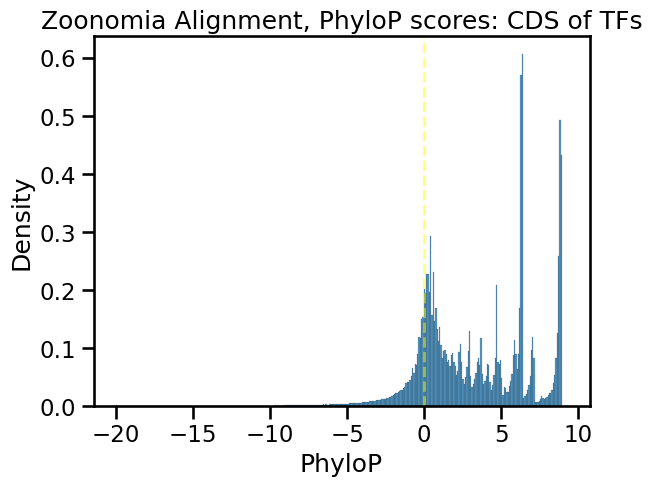

In [121]:
sns.set_context('talk')
sns.histplot(zoonomia_phyloP["PhyloP"], stat = "density")
plt.axvline(0, color = "yellow", lw = 2, ls = "--", alpha = 0.5)
plt.title("Zoonomia Alignment, PhyloP scores: CDS of TFs");

In [11]:
# Preparing for variant analysis script
zoonomia_phyloP["chr"] = zoonomia_phyloP["chr"].str[3:]
zoonomia_phyloP["start"] = zoonomia_phyloP["start"].astype(int)
zoonomia_phyloP["end"] = zoonomia_phyloP["end"].astype(int)
zoonomia_phyloP

,chr,start,end,PhyloP
0,3,142005441,142005442,6.299
1,3,142005442,142005443,6.324
2,3,142005443,142005444,6.324
3,3,142005444,142005445,6.324
4,3,142005445,142005446,8.746
...,...,...,...,...
2751585,19,7075739,7075740,-0.412
2751586,19,7075740,7075741,1.754
2751587,19,7075741,7075742,0.061
2751588,19,7075742,7075743,2.618


In [12]:
zoonomia_phyloP.to_csv("../soto_analysis/raw_files/zoonomia_all_TF_cds.bed", sep = "\t", header = None, index = None)

In [6]:
ad_phylo_P = []

ENSTs = glob.glob("../soto_analysis/outputs/mutations/domains_zoonomia_all_TF_cds/*")
for ENST in ENSTs:
    df = pd.read_csv(ENST, sep = "\t", header = None)
    ad_phylo_P.append(df)

ad_phylo_P = pd.concat(ad_phylo_P)
ad_phylo_P = ad_phylo_P.rename(columns = {7: "ENST", 16: "PhyloP"})
dbd_phylo_P = ad_phylo_P[ad_phylo_P[3] == "DBD"]
ad_phylo_P = ad_phylo_P[ad_phylo_P[3] == "AD"]
ad_phylo_P

,0,1,2,3,4,5,6,ENST,8,9,10,11,12,13,14,15,PhyloP
414,6,53128617,53128618,AD,NaN,.,-,ENST00000259803,6,53128617,53128618,ENST00000259803,-1,6,53128617,53128618,0.722
415,6,53128618,53128619,AD,NaN,.,-,ENST00000259803,6,53128618,53128619,ENST00000259803,-1,6,53128618,53128619,1.784
416,6,53128619,53128620,AD,NaN,.,-,ENST00000259803,6,53128619,53128620,ENST00000259803,-1,6,53128619,53128620,1.446
417,6,53128620,53128621,AD,NaN,.,-,ENST00000259803,6,53128620,53128621,ENST00000259803,-1,6,53128620,53128621,1.740
418,6,53128621,53128622,AD,NaN,.,-,ENST00000259803,6,53128621,53128622,ENST00000259803,-1,6,53128621,53128622,2.924
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2311,19,15379724,15379725,AD,NaN,.,-,ENST00000269701,19,15379724,15379725,ENST00000269701,-1,19,15379724,15379725,6.849
2312,19,15379725,15379726,AD,NaN,.,-,ENST00000269701,19,15379725,15379726,ENST00000269701,-1,19,15379725,15379726,0.712
2313,19,15379726,15379727,AD,NaN,.,-,ENST00000269701,19,15379726,15379727,ENST00000269701,-1,19,15379726,15379727,4.610
2314,19,15379727,15379728,AD,NaN,.,-,ENST00000269701,19,15379727,15379728,ENST00000269701,-1,19,15379727,15379728,8.697


In [7]:
len(set(ad_phylo_P["ENST"]))

430

In [14]:
dbd_phylo_P

,0,1,2,3,4,5,6,ENST,8,9,10,11,12,13,14,15,PhyloP
0,6,53130872,53130873,DBD,NaN,.,-,ENST00000259803,6,53130872,53130873,ENST00000259803,-1,6,53130872,53130873,6.988
1,6,53130873,53130874,DBD,NaN,.,-,ENST00000259803,6,53130873,53130874,ENST00000259803,-1,6,53130873,53130874,3.634
2,6,53130874,53130875,DBD,NaN,.,-,ENST00000259803,6,53130874,53130875,ENST00000259803,-1,6,53130874,53130875,1.222
3,6,53130875,53130876,DBD,NaN,.,-,ENST00000259803,6,53130875,53130876,ENST00000259803,-1,6,53130875,53130876,8.775
4,6,53130876,53130877,DBD,NaN,.,-,ENST00000259803,6,53130876,53130877,ENST00000259803,-1,6,53130876,53130877,2.893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2071,19,15379727,15379728,DBD,NaN,.,-,ENST00000269701,19,15379727,15379728,ENST00000269701,-1,19,15379727,15379728,8.697
2072,19,15379728,15379729,DBD,NaN,.,-,ENST00000269701,19,15379728,15379729,ENST00000269701,-1,19,15379728,15379729,8.697
2073,19,15379729,15379730,DBD,NaN,.,-,ENST00000269701,19,15379729,15379730,ENST00000269701,-1,19,15379729,15379730,6.192
2074,19,15379730,15379731,DBD,NaN,.,-,ENST00000269701,19,15379730,15379731,ENST00000269701,-1,19,15379730,15379731,6.217


In [8]:
len(set(dbd_phylo_P["ENST"]))

427

In [11]:
cds_phylo_P = []

cds_paths = glob.glob("../soto_analysis/outputs/mutations/cds_zoonomia_all_TF_cds/*")
for path in cds_paths:
    ENST = path.split("/")[-1].split(".bed")[0]
    if ENST in set(ad_phylo_P["ENST"]):
        df = pd.read_csv(path, sep = "\t", header = None)
        cds_phylo_P.append(df)

cds_phylo_P = pd.concat(cds_phylo_P)
cds_phylo_P = cds_phylo_P.rename(columns = {3: "ENST", 8: "PhyloP"})
cds_phylo_P

,0,1,2,ENST,4,5,6,7,PhyloP
0,6,53128206,53128207,ENST00000259803,-1,6,53128206,53128207,3.506
1,6,53128207,53128208,ENST00000259803,-1,6,53128207,53128208,4.649
2,6,53128208,53128209,ENST00000259803,-1,6,53128208,53128209,1.790
3,6,53128209,53128210,ENST00000259803,-1,6,53128209,53128210,5.710
4,6,53128210,53128211,ENST00000259803,-1,6,53128210,53128211,0.398
...,...,...,...,...,...,...,...,...,...
2074,19,15379727,15379728,ENST00000269701,-1,19,15379727,15379728,8.697
2075,19,15379728,15379729,ENST00000269701,-1,19,15379728,15379729,8.697
2076,19,15379729,15379730,ENST00000269701,-1,19,15379729,15379730,6.192
2077,19,15379730,15379731,ENST00000269701,-1,19,15379730,15379731,6.217


In [12]:
len(set(cds_phylo_P["ENST"]))

430

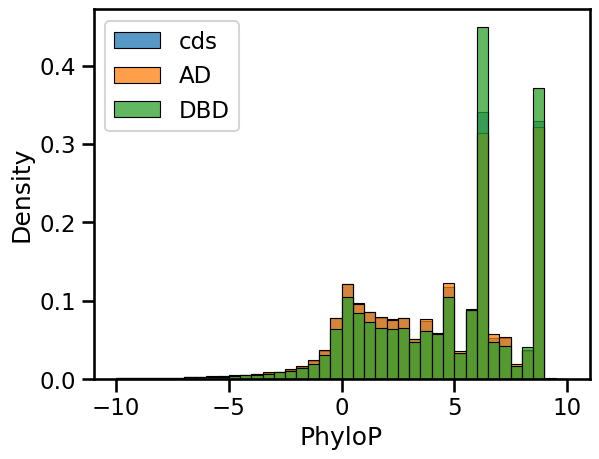

In [13]:
bins = np.arange(-10, 10.1, 0.5)
sns.histplot(cds_phylo_P["PhyloP"], label = "cds", stat = "density", bins = bins)
sns.histplot(ad_phylo_P["PhyloP"], label = "AD", stat = "density", bins = bins)
sns.histplot(dbd_phylo_P["PhyloP"], label = "DBD", stat = "density", bins = bins)
plt.legend();

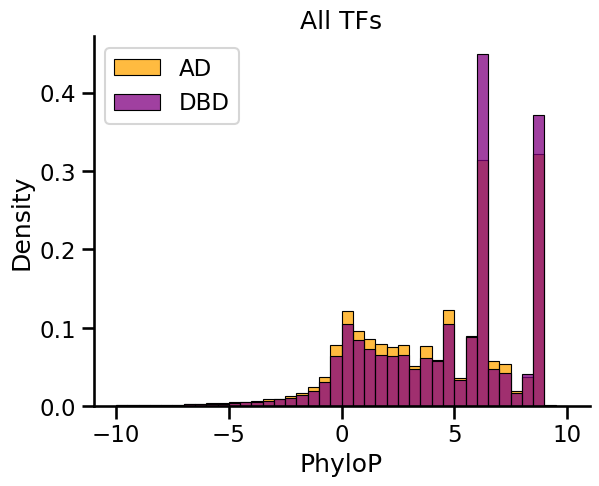

In [14]:
bins = np.arange(-10, 10.1, 0.5)
#sns.histplot(data = df_cds_no_ad, x = "PhyloP_x", bins = bins, stat = "density")
sns.histplot(data = ad_phylo_P, x = "PhyloP", bins = bins, stat = "density", color = "orange", label = "AD")
sns.histplot(data = dbd_phylo_P, x = "PhyloP", bins = bins, stat = "density", color = "purple", label = "DBD")
plt.title("All TFs")
plt.legend()
sns.despine();

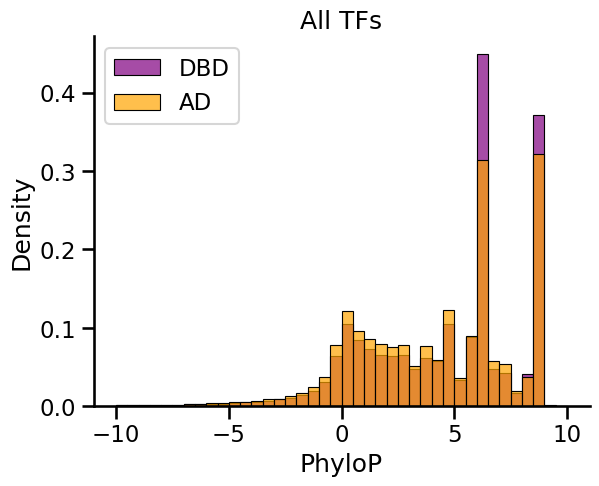

In [15]:
bins = np.arange(-10, 10.1, 0.5)
#sns.histplot(data = df_cds_no_ad, x = "PhyloP_x", bins = bins, stat = "density")
sns.histplot(data = dbd_phylo_P, x = "PhyloP", bins = bins, stat = "density", color = "purple", label = "DBD", alpha = 0.7)
sns.histplot(data = ad_phylo_P, x = "PhyloP", bins = bins, stat = "density", color = "orange", label = "AD", alpha = 0.7)
plt.title("All TFs")
plt.legend()
sns.despine();

In [16]:
def plot_mean(data, color, lw = 2):
    plt.axvline(data["PhyloP"].median(), color=color, ls='--', lw=lw)

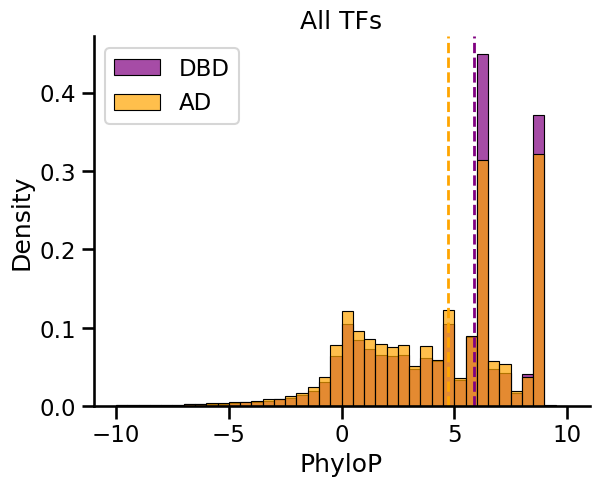

In [17]:
sns.set_context('talk')

bins = np.arange(-10, 10.1, 0.5)
#sns.histplot(data = df_cds_no_ad, x = "PhyloP_x", bins = bins, stat = "density")
sns.histplot(data = dbd_phylo_P, x = "PhyloP", bins = bins, stat = "density", color = "purple", label = "DBD", alpha = 0.7)
plot_mean(dbd_phylo_P, 'purple')

sns.histplot(data = ad_phylo_P, x = "PhyloP", bins = bins, stat = "density", color = "orange", label = "AD", alpha = 0.7)
plot_mean(ad_phylo_P, 'orange')

plt.title("All TFs")
plt.legend()
sns.despine();

In [18]:
cds_phylo_P_to_merge = cds_phylo_P[[0, 1, 2,"ENST", 4, "PhyloP"]].copy(deep = True)
cds_phylo_P_to_merge = cds_phylo_P_to_merge.rename(columns = {4: 12})
cds_phylo_P_to_merge

,0,1,2,ENST,12,PhyloP
0,6,53128206,53128207,ENST00000259803,-1,3.506
1,6,53128207,53128208,ENST00000259803,-1,4.649
2,6,53128208,53128209,ENST00000259803,-1,1.790
3,6,53128209,53128210,ENST00000259803,-1,5.710
4,6,53128210,53128211,ENST00000259803,-1,0.398
...,...,...,...,...,...,...
2074,19,15379727,15379728,ENST00000269701,-1,8.697
2075,19,15379728,15379729,ENST00000269701,-1,8.697
2076,19,15379729,15379730,ENST00000269701,-1,6.192
2077,19,15379730,15379731,ENST00000269701,-1,6.217


In [19]:
ad_phylo_P_to_merge = ad_phylo_P[[0, 1, 2, "ENST", 12, "PhyloP"]]
ad_phylo_P_to_merge

,0,1,2,ENST,12,PhyloP
414,6,53128617,53128618,ENST00000259803,-1,0.722
415,6,53128618,53128619,ENST00000259803,-1,1.784
416,6,53128619,53128620,ENST00000259803,-1,1.446
417,6,53128620,53128621,ENST00000259803,-1,1.740
418,6,53128621,53128622,ENST00000259803,-1,2.924
...,...,...,...,...,...,...
2311,19,15379724,15379725,ENST00000269701,-1,6.849
2312,19,15379725,15379726,ENST00000269701,-1,0.712
2313,19,15379726,15379727,ENST00000269701,-1,4.610
2314,19,15379727,15379728,ENST00000269701,-1,8.697


In [20]:
dbd_phylo_P_to_merge = dbd_phylo_P[[0, 1, 2, "ENST", 12, "PhyloP"]]
dbd_phylo_P_to_merge

,0,1,2,ENST,12,PhyloP
0,6,53130872,53130873,ENST00000259803,-1,6.988
1,6,53130873,53130874,ENST00000259803,-1,3.634
2,6,53130874,53130875,ENST00000259803,-1,1.222
3,6,53130875,53130876,ENST00000259803,-1,8.775
4,6,53130876,53130877,ENST00000259803,-1,2.893
...,...,...,...,...,...,...
2071,19,15379727,15379728,ENST00000269701,-1,8.697
2072,19,15379728,15379729,ENST00000269701,-1,8.697
2073,19,15379729,15379730,ENST00000269701,-1,6.192
2074,19,15379730,15379731,ENST00000269701,-1,6.217


In [21]:
cds_phylo_P_to_merge = pd.merge(cds_phylo_P_to_merge, ad_phylo_P_to_merge, how = "left", indicator = "AD")
cds_phylo_P_to_merge = pd.merge(cds_phylo_P_to_merge, dbd_phylo_P_to_merge, how = "left", indicator = "DBD")
cds_phylo_P_to_merge

,0,1,2,ENST,12,PhyloP,AD,DBD
0,6,53128206,53128207,ENST00000259803,-1,3.506,left_only,left_only
1,6,53128207,53128208,ENST00000259803,-1,4.649,left_only,left_only
2,6,53128208,53128209,ENST00000259803,-1,1.790,left_only,left_only
3,6,53128209,53128210,ENST00000259803,-1,5.710,both,left_only
4,6,53128210,53128211,ENST00000259803,-1,0.398,both,left_only
...,...,...,...,...,...,...,...,...
745444,19,15379727,15379728,ENST00000269701,-1,8.697,both,both
745445,19,15379728,15379729,ENST00000269701,-1,8.697,both,both
745446,19,15379729,15379730,ENST00000269701,-1,6.192,left_only,both
745447,19,15379730,15379731,ENST00000269701,-1,6.217,left_only,both


In [22]:
bool_dict = {"left_only" : False, "both" : True}

cds_phylo_P_to_merge["AD"] = cds_phylo_P_to_merge["AD"].map(bool_dict)
cds_phylo_P_to_merge["DBD"] = cds_phylo_P_to_merge["DBD"].map(bool_dict)
cds_phylo_P_to_merge

,0,1,2,ENST,12,PhyloP,AD,DBD
0,6,53128206,53128207,ENST00000259803,-1,3.506,False,False
1,6,53128207,53128208,ENST00000259803,-1,4.649,False,False
2,6,53128208,53128209,ENST00000259803,-1,1.790,False,False
3,6,53128209,53128210,ENST00000259803,-1,5.710,True,False
4,6,53128210,53128211,ENST00000259803,-1,0.398,True,False
...,...,...,...,...,...,...,...,...
745444,19,15379727,15379728,ENST00000269701,-1,8.697,True,True
745445,19,15379728,15379729,ENST00000269701,-1,8.697,True,True
745446,19,15379729,15379730,ENST00000269701,-1,6.192,False,True
745447,19,15379730,15379731,ENST00000269701,-1,6.217,False,True


In [23]:
cds_phylo_P_to_merge_no_dom = cds_phylo_P_to_merge[(cds_phylo_P_to_merge["AD"] == False) & (cds_phylo_P_to_merge["DBD"] == False)]
cds_phylo_P_to_merge_no_dom

,0,1,2,ENST,12,PhyloP,AD,DBD
0,6,53128206,53128207,ENST00000259803,-1,3.506,False,False
1,6,53128207,53128208,ENST00000259803,-1,4.649,False,False
2,6,53128208,53128209,ENST00000259803,-1,1.790,False,False
408,6,53128614,53128615,ENST00000259803,-1,2.590,False,False
409,6,53128615,53128616,ENST00000259803,-1,-0.183,False,False
...,...,...,...,...,...,...,...,...
742720,14,64268797,64268798,ENST00000341099,-1,6.190,False,False
742721,14,64268798,64268799,ENST00000341099,-1,5.715,False,False
743370,19,15354915,15354916,ENST00000269701,-1,4.480,False,False
743371,19,15354916,15354917,ENST00000269701,-1,4.393,False,False


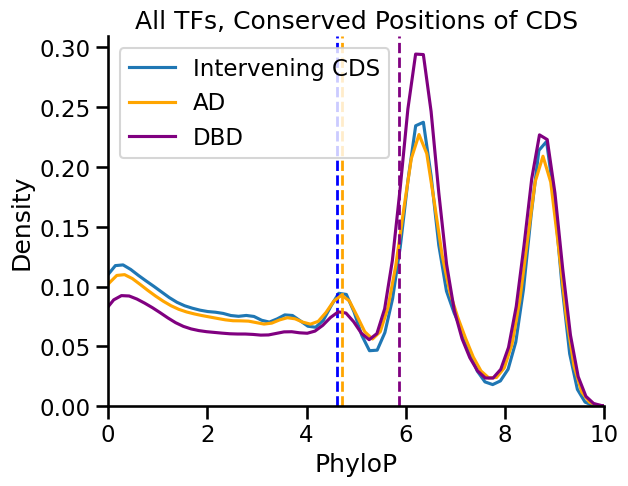

In [24]:
bins = np.arange(-10, 10.1, 0.5)
sns.kdeplot(data = cds_phylo_P_to_merge_no_dom, x = "PhyloP", label = "Intervening CDS")
plot_mean(cds_phylo_P_to_merge_no_dom, "b", lw = 2)

sns.kdeplot(data = ad_phylo_P, x = "PhyloP", color = "orange", label = "AD")
plot_mean(dbd_phylo_P, 'purple', lw = 2)

sns.kdeplot(data = dbd_phylo_P, x = "PhyloP", color = "purple", label = "DBD")
plot_mean(ad_phylo_P, 'orange', lw = 2)

plt.title("All TFs, Conserved Positions of CDS")
plt.legend()
plt.xlim(0, 10)
sns.despine();

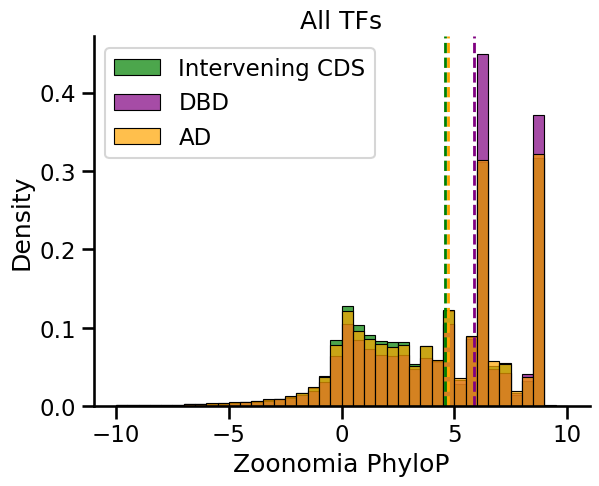

In [25]:
sns.set_context('talk')

bins = np.arange(-10, 10.1, 0.5)

sns.histplot(data = cds_phylo_P_to_merge_no_dom, x = "PhyloP", bins = bins, stat = "density", color = "green", label = "Intervening CDS", alpha = 0.7)
plot_mean(cds_phylo_P_to_merge_no_dom, 'green')

#sns.histplot(data = df_cds_no_ad, x = "PhyloP_x", bins = bins, stat = "density")
sns.histplot(data = dbd_phylo_P, x = "PhyloP", bins = bins, stat = "density", color = "purple", label = "DBD", alpha = 0.7)
plot_mean(dbd_phylo_P, 'purple')

sns.histplot(data = ad_phylo_P, x = "PhyloP", bins = bins, stat = "density", color = "orange", label = "AD", alpha = 0.7)
plot_mean(ad_phylo_P, 'orange')


plt.title("All TFs")
plt.xlabel("Zoonomia PhyloP")

plt.legend()
sns.despine();

In [26]:
cds_phylo_P_to_merge.to_csv("../output/all_TFs_cds_phyloP.csv")

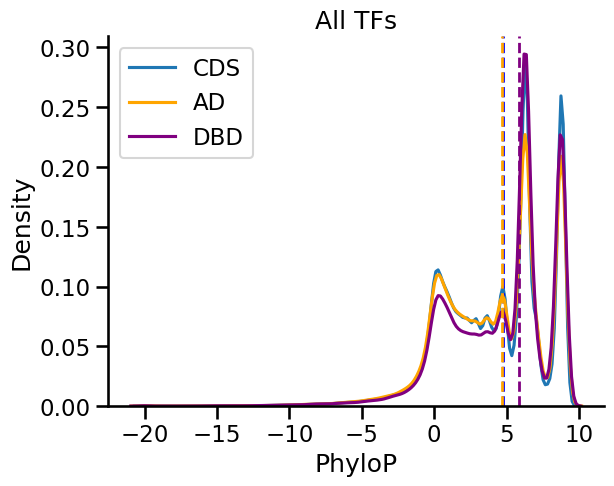

In [27]:
bins = np.arange(-10, 10.1, 0.5)
sns.kdeplot(data = cds_phylo_P, x = "PhyloP", label = "CDS")
plot_mean(cds_phylo_P, "blue")

sns.kdeplot(data = ad_phylo_P, x = "PhyloP", color = "orange", label = "AD")
plot_mean(dbd_phylo_P, 'purple')

sns.kdeplot(data = dbd_phylo_P, x = "PhyloP", color = "purple", label = "DBD")
plot_mean(ad_phylo_P, 'orange')

plt.title("All TFs")
plt.legend()
sns.despine();

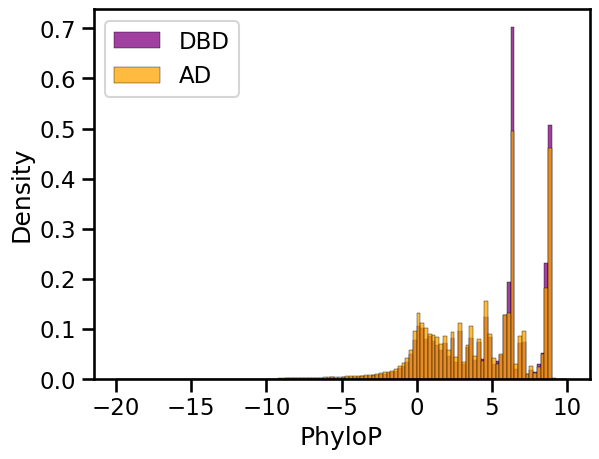

In [28]:
bins = np.arange(-20, 10.1, 0.25)
#sns.histplot(cds_phylo_P["PhyloP"], label = "cds", stat = "density", bins = bins)
sns.histplot(dbd_phylo_P["PhyloP"], label = "DBD", stat = "density", bins = bins, color = "purple")
sns.histplot(ad_phylo_P["PhyloP"], label = "AD", stat = "density", bins = bins, color = "orange")
plt.legend();

In [29]:
lambert_TFs_ENST = pd.read_csv("../output/TFs_with_ENST.csv")
known_ADs = pd.read_csv("../output/known_ADs_considering_isoforms_and_canonical.csv")
ENST_to_gene_df = pd.merge(known_ADs, lambert_TFs_ENST, on = "uniprotID")[["ENST", "Gene"]].drop_duplicates()
ENST_to_gene_df["ENST"] = ENST_to_gene_df["ENST"].str.split('.').str[0]
ENST_to_gene = dict(zip(ENST_to_gene_df["ENST"], ENST_to_gene_df["Gene"]))

In [30]:
# sns.set_context('paper')

# #https://www.geeksforgeeks.org/python-make-a-list-of-intervals-with-sequential-numbers/
# def intervals_extract(iterable):
     
#     iterable = sorted(set(iterable))
#     for key, group in itertools.groupby(enumerate(iterable),
#     lambda t: t[1] - t[0]):
#         group = list(group)
#         yield [group[0][1], group[-1][1]]

# tfs_tbl = pd.read_csv("../soto_analysis/outputs/all_TFs_table_proteins.txt", sep = "\t")

# for ENST in set(cds_phylo_P["ENST"]) & set(tfs_tbl["ENST"]):
#     ENST = ENST.split("/")[-1]
#     #display(tfs_tbl[tfs_tbl["ENST"] == ENST])
#     ENST_phylo_P = cds_phylo_P[cds_phylo_P["ENST"] == ENST]
#     #display(ENST_phylo_P)
#     # If negative strand, sort ascending = False
#     # Else, sort ascending = True
#     if ENST_phylo_P[4].iloc[0] == -1:
#         #print('neg strand')
#         ascending = False
#     else: 
#         ascending = True
#     ENST_phylo_P = ENST_phylo_P.sort_values(by = 1, ascending = ascending)

    
#     domains = pd.read_csv("../soto_analysis/outputs/mutations/domains_zoonomia_all_TF_cds/" + ENST + ".bed", sep = "\t", header = None)
#     domains = domains[[0, 1, 2, 3]]
#     ENST_phylo_P_with_domains = pd.merge(ENST_phylo_P, domains, how = "left", on = [0, 1, 2])
#     ENST_phylo_P_with_domains = ENST_phylo_P_with_domains.fillna(0)
#     ENST_phylo_P_with_domains["cds_nt"] = np.arange(len(ENST_phylo_P_with_domains))
#     #display(ENST_phylo_P_with_domains)


#     # Apply lowess smoothing
#     #uniprotID = cc_names[cc_names["ENST"] == ENST]["uniprotID"].iloc[0]
#     #gene = cc_names[cc_names["ENST"] == ENST]["Gene"].iloc[0]
#     gene = ENST_to_gene[ENST]
    
#     smoothed = lowess(ENST_phylo_P_with_domains['PhyloP'], ENST_phylo_P_with_domains["cds_nt"], frac=0.01)  # Adjust frac for smoothness
#     color_map = {
#         'AD': 'orange',
#         'DBD': 'purple'
#     }
    
#     # Create a new DataFrame for smoothed data
#     smoothed_df = pd.DataFrame(smoothed, columns=["cds_nt", 'smoothed'])
    
#     # Plot
#     plt.figure(figsize=(10, 6))
    
    
#     # Create background color blocks based on '3_y'
#     for value, color in color_map.items():
#         #display(ENST_phylo_P_with_domains)
#         subset = ENST_phylo_P_with_domains[ENST_phylo_P_with_domains[3] == value]
#         intervals = list(intervals_extract(subset["cds_nt"]))
        
#         for interval in intervals:
#             plt.axvspan(interval[0], interval[1], color=color, alpha=0.3)

#     sns.scatterplot(data=ENST_phylo_P_with_domains, x="cds_nt", y='PhyloP', color='black', alpha = 0.05, size = 20)
#     sns.lineplot(data=smoothed_df, x="cds_nt", y='smoothed', color='black')

#     #plt.ylim(0, 10)
#     plt.axhline(0)
#     # Add labels and legend
#     #print(ENST)
#     plt.title(gene + ' CDS')
#     plt.xlabel('CDS nt position')  
#     # plt.ylabel('PhyloP Score')
#     #plt.legend(title='Domain Type')

#     gene = gene.replace("/", "-").replace(".","").strip()
#     print(gene)
#     plt.savefig("../output/zoonomia_PhyloP_traces/" + gene)
#     #plt.show()


In [31]:
lambert_TFs = pd.read_csv("../output/lambert_TFs_10-21-24_with_DBD_coords.csv")
lambert_TFs["uniprotID"] = lambert_TFs["id"].str.split("|").str[1]
lambert_TFs = pd.merge(lambert_TFs, lambert_TFs_ENST, on = "uniprotID")
lambert_TFs["ENST"] = lambert_TFs["ENST"].str.split('.').str[0]
lambert_TFs

,Unnamed: 0_x,id,ProteinSeq,DBD_coords_merged,uniprotID,Unnamed: 0_y,ENST,canonical_uniprot_id_isoform
0,0,sp|A0A087WUV0|ZN892_HUMAN Zinc finger protein ...,MEPEGRGSLFEDSDLLHAGNPKENDVTAVLLTPGSQELMIRDMAEA...,"[[221, 243], [249, 271], [277, 299], [305, 327...",A0A087WUV0,0,ENST00000425953,A0A087WUV0
1,1,sp|A0AVK6|E2F8_HUMAN Transcription factor E2F8...,MENEKENLFCEPHKRGLMKTPLKESTTANIVLAEIQPDFGPLTTPT...,"[[114, 182], [262, 347]]",A0AVK6,1,ENST00000250024,A0AVK6
2,2,sp|A0PJY2|FEZF1_HUMAN Fez family zinc finger p...,MDSSCHNATTKMLATAPARGNMMSTSKPLAFSIERIMARTPEPKAL...,"[[260, 282], [288, 310], [316, 338], [344, 366...",A0PJY2,747,ENST00000442488,A0PJY2-1
3,3,sp|A1A519|F170A_HUMAN Protein FAM170A OS=Homo ...,MKRRQKRKHLENEESQETAEKGGGMSKSQEDALQPGSTRVAKGWSQ...,"[[1, 330]]",A1A519,748,ENST00000695508,A1A519-1
4,4,sp|A1YPR0|ZBT7C_HUMAN Zinc finger and BTB doma...,MANDIDELIGIPFPNHSSEVLCSLNEQRHDGLLCDVLLVVQEQEYR...,"[[364, 386], [392, 414], [420, 442], [448, 469]]",A1YPR0,2,ENST00000535628,A1YPR0
...,...,...,...,...,...,...,...,...
1585,1608,sp|Q9Y6Q9|NCOA3_HUMAN Nuclear receptor coactiv...,MSGLGENLDPLASDSRKRKLPCDTPGQGLTCSGEKRRREQESKYIE...,"[[31, 83]]",Q9Y6Q9,2129,ENST00000371998,Q9Y6Q9-1
1586,1609,sp|Q9Y6R6|Z780B_HUMAN Zinc finger protein 780B...,MVHGSVTFRDVAIDFSQEEWECLQPDQRTLYRDVMLENYSHLISLG...,"[[165, 187], [193, 215], [221, 243], [249, 271...",Q9Y6R6,745,ENST00000434248,Q9Y6R6
1587,1610,sp|Q9Y6X0|SETBP_HUMAN SET-binding protein OS=H...,MESRETLSSSRQRGGESDFLPVSSAKPPAAPGCAGEPLLSTPGPGK...,"[[583, 596], [1015, 1027], [1450, 1462]]",Q9Y6X0,2130,ENST00000649279,Q9Y6X0-1
1588,1611,sp|Q9Y6X8|ZHX2_HUMAN Zinc fingers and homeobox...,MASKRKSTTPCMVRTSQVVEQDVPEEVDRAKEKGIGTPQPDVAKDS...,"[[78, 101], [110, 133], [271, 317], [442, 496]...",Q9Y6X8,746,ENST00000314393,Q9Y6X8



ENST00000287820
PPARG


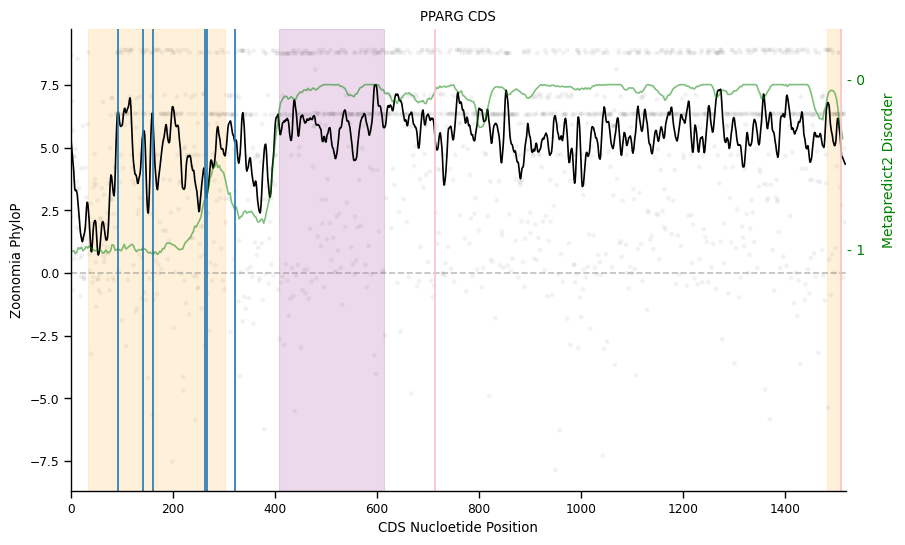

In [32]:
sns.set_context('paper')

tfs_tbl = pd.read_csv("../soto_analysis/outputs/all_TFs_table_proteins.txt", sep = "\t")


#https://www.geeksforgeeks.org/python-make-a-list-of-intervals-with-sequential-numbers/
def intervals_extract(iterable):
     
    iterable = sorted(set(iterable))
    for key, group in itertools.groupby(enumerate(iterable),
    lambda t: t[1] - t[0]):
        group = list(group)
        yield [group[0][1], group[-1][1]]

def align_yaxis(ax1, v1, ax2, v2):
    """adjust ax2 ylimit so that v2 in ax2 is aligned to v1 in ax1"""
    _, y1 = ax1.transData.transform((0, v1))
    _, y2 = ax2.transData.transform((0, v2))
    inv = ax2.transData.inverted()
    _, dy = inv.transform((0, 0)) - inv.transform((0, y1-y2))
    miny, maxy = ax2.get_ylim()
    ax2.set_ylim(miny+dy, maxy+dy)

#for ENST in set(cds_phylo_P["ENST"]) & set(tfs_tbl["ENST"]):

for ENST in ["ENST00000287820"]:
    print()
    print(ENST)
    #display(tfs_tbl[tfs_tbl["ENST"] == ENST])
    ENST_phylo_P = cds_phylo_P[cds_phylo_P["ENST"] == ENST]
    # If negative strand, sort ascending = False
    # Else, sort ascending = True

    #print(ENST_phylo_P[4].iloc[0])
    #print(type(ENST_phylo_P[4].iloc[0]))
    
    if ENST_phylo_P[4].iloc[0] == -1:
        ascending = False
    else: 
        #print("pos")
        ascending = True
        
    ENST_phylo_P = ENST_phylo_P.sort_values(by = 1, ascending = ascending)
    #display(ENST_phylo_P)
    
    uniprotID = lambert_TFs[lambert_TFs["ENST"] == ENST]["uniprotID"].iloc[0]
    domains = pd.read_csv("../soto_analysis/outputs/mutations/domains_zoonomia_all_TF_cds/" + ENST + ".bed", sep = "\t", header = None)
    domains = domains[[0, 1, 2, 3]]
    #display(domains)
    #ENST_phylo_P_with_domains = pd.merge(ENST_phylo_P, domains, how = "left", on = [0, 1, 2])
    #ENST_phylo_P_with_domains = ENST_phylo_P_with_domains.fillna(0)
    #ENST_phylo_P_with_domains = ENST_phylo_P_with_domains.drop_duplicates().reset_index(drop = True)
    ENST_phylo_P["cds_nt"] = np.arange(len(ENST_phylo_P))
    #display(ENST_phylo_P_with_domains)
    #display(ENST_phylo_P_with_domains)
   # display(ENST_phylo_P)


    # Apply lowess smoothing
    gene = ENST_to_gene[ENST]
    
    smoothed = lowess(ENST_phylo_P['PhyloP'], ENST_phylo_P["cds_nt"], frac=0.01)  # Adjust frac for smoothness
    color_map = {
        'AD': 'orange',
        'DBD': 'purple'
    }
    
    # Create a new DataFrame for smoothed data
    smoothed_df = pd.DataFrame(smoothed, columns=["cds_nt", 'smoothed'])
    
    # Plot
    plt.figure(figsize=(10, 6))
    
    # Create background color blocks based on '3_y'
    for value, color in color_map.items():
        domains_subset = domains[domains[3] == value]
        #display(domains_subset)
        
        ENST_phylo_P_with_domains = pd.merge(ENST_phylo_P, domains_subset, how = "left", on = [0, 1, 2])
        #ENST_phylo_P_with_domains = ENST_phylo_P_with_domains.fillna(0)
        ENST_phylo_P_with_domains = ENST_phylo_P_with_domains.drop_duplicates().reset_index(drop = True)
        ENST_phylo_P_with_domains["cds_nt"] = np.arange(len(ENST_phylo_P_with_domains))
        subset = ENST_phylo_P_with_domains[ENST_phylo_P_with_domains[3] == value]
        #display(subset)
        subset = subset.sort_values(by = "cds_nt")
        intervals = list(intervals_extract(subset["cds_nt"]))

            
        expected = known_ADs[known_ADs["uniprotID"] == uniprotID]

                    
        for interval in intervals:
            if value == "AD":
                if (int((interval[0] + 2)/ 3) + 1 not in set(expected["Start"])):
                    print("MISMATCH")
                    print(int((interval[0] + 3)/ 3) + 1)
                    print(int((interval[1] + 3)/ 3) + 1)
                    display(expected)
            plt.axvspan(interval[0], interval[1], color=color, alpha=0.15)

        # print(intervals)
        # display(expected)

        
    sns.scatterplot(data=ENST_phylo_P_with_domains, x="cds_nt", y='PhyloP', color='black', alpha = 0.05, size = 20, legend = False)
    #plt.legend().remove()
    sns.lineplot(data=smoothed_df, x="cds_nt", y='smoothed', color='black')
    sns.despine()
    plt.xlim(0, max(smoothed_df["cds_nt"]) + 1)
    #extreme = max(np.abs(ENST_phylo_P_with_domains["PhyloP"]))
    #plt.ylim(-1 * extreme - 0.1, extreme + 0.1)

    #uniprotID = cc_names[cc_names["ENST"] == ENST]["uniprotID"].iloc[0]
    TF_seq = lambert_TFs[lambert_TFs["ENST"] == ENST]["ProteinSeq"].iloc[0]
    disorder = np.array(meta.predict_disorder(TF_seq))


    plt.axhline(0, color = "gray", linestyle = "--", alpha = 0.5)
    plt.ylabel("Zoonomia PhyloP", color = "black")
    plt.xlabel('CDS Nucloetide Position')  

    #ax2 = plt.twinx()

    # Normalizing to smoothed
    
    normalized = (disorder - np.mean(disorder)) / np.std(disorder)
    #normalized_to_phyloP = 

    phyloP_min, phyloP_max = min(smoothed_df["smoothed"]), max(smoothed_df["smoothed"])
    inverse_disorder_scaled = (np.array(1 - disorder) * (phyloP_max - phyloP_min)) + phyloP_min
    sns.lineplot(x = np.arange(0, len(disorder) * 3, 3), y = inverse_disorder_scaled, color = "green", alpha = 0.5)

    inv_dis_scal_0 = (0 * (phyloP_max - phyloP_min)) + phyloP_min
    inv_dis_scal_1 = (1 * (phyloP_max - phyloP_min)) + phyloP_min

    plt.text(len(disorder) * 3 + 5, inv_dis_scal_0,'- 1', fontsize=10, color = "green")
    plt.text(len(disorder) * 3 + 5, inv_dis_scal_1,'- 0', fontsize=10, color = "green")
    plt.text(len(disorder) * 3 + 10, (inv_dis_scal_0 + inv_dis_scal_1) / 2,'\n\nMetapredict2 Disorder', verticalalignment = "center", fontsize=10, color = "green", rotation = 90)

    #plt.text(len(disorder) * 3 + 5, np.mean(inv_dis_scal_0, inv_dis_scal_1),'- 0', fontsize=10, color = "green")

    #plt.ylabel("1 - Metapredict2", color = "green")
    #plt.ylim(-1.1, 1.1)

    #plt.ylim(0, 10)
    # Add labels and legend
    #print(ENST)
    plt.title(gene + ' CDS')
    # plt.ylabel('PhyloP Score')
    #plt.legend(title='Domain Type')
    gene = gene.replace("/", "-").replace(".","").strip()
    print(gene)

    positions = [31, 47, 54, 88, 89, 107]
    for pos in positions:
        plt.axvline(pos * 3)
    
    plt.axvline(238 * 3, color = "pink")
    plt.axvline(503 * 3, color = "pink")

    plt.savefig("../output/zoonomia_PhyloP_traces/metapredict/" + gene);


In [33]:
AD_variances = []
DBD_variances = []
ENSTs = []

for ENST in set(cds_phylo_P["ENST"]) & set(tfs_tbl["ENST"]):
    ENSTs.append(ENST)
    AD_rows = ad_phylo_P[ad_phylo_P["ENST"] == ENST]["PhyloP"]
    DBD_rows = dbd_phylo_P[dbd_phylo_P["ENST"] == ENST]["PhyloP"]

    AD_variances.append(np.var(AD_rows))
    DBD_variances.append(np.var(DBD_rows))

variance_df = pd.DataFrame({"ENST" : ENSTs, "AD" : AD_variances, "DBD" : DBD_variances})
variance_df

,ENST,AD,DBD
0,ENST00000599369,4.279507,8.725428
1,ENST00000678960,7.122633,13.528820
2,ENST00000430624,11.887811,7.291045
3,ENST00000342665,6.309159,3.224526
4,ENST00000684572,9.269031,10.902587
...,...,...,...
425,ENST00000266068,17.894524,14.568941
426,ENST00000341376,12.217901,12.066700
427,ENST00000393067,17.665083,NaN
428,ENST00000340553,9.736288,9.351653


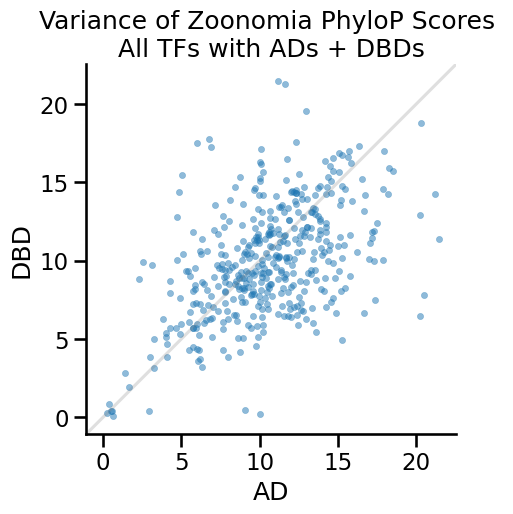

In [34]:
plt.style.use("default")
sns.set_context('talk')
plt.gca().set_aspect('equal', adjustable='box')

plt.axline((0, 0), slope=1, color = "gray", alpha = 0.25)
sns.scatterplot(data = variance_df, x = "AD", y = "DBD", edgecolor = None, alpha = 0.5, s = 20)
sns.despine()
plt.title("Variance of Zoonomia PhyloP Scores \nAll TFs with ADs + DBDs");

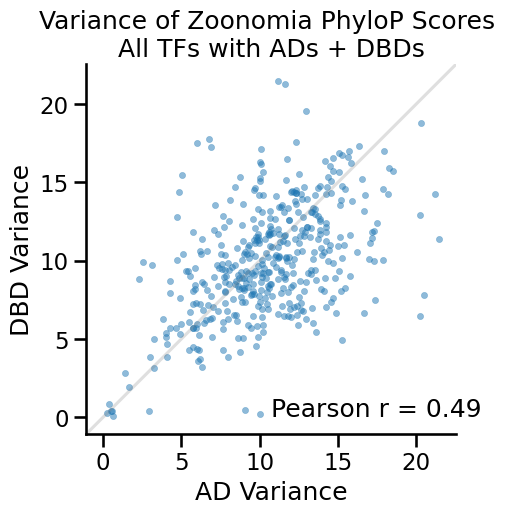

In [35]:
from scipy.stats import pearsonr

# Calculate Pearson correlation coefficient
pearson_corr, p_value = pearsonr(variance_df.dropna()["AD"], variance_df.dropna()["DBD"])

# Plot
plt.style.use("default")
sns.set_context('talk')
plt.gca().set_aspect('equal', adjustable='box')

plt.axline((0, 0), slope=1, color="gray", alpha=0.25)
sns.scatterplot(data=variance_df, x="AD", y="DBD", edgecolor=None, alpha=0.5, s=20)
sns.despine()

# Add Pearson correlation coefficient as text
plt.text(0.5, 0.1, f"Pearson r = {pearson_corr:.2f}", ha='left', va='top', transform=plt.gca().transAxes)

# Title and labels
plt.title("Variance of Zoonomia PhyloP Scores \nAll TFs with ADs + DBDs")
plt.xlabel("AD Variance")
plt.ylabel("DBD Variance")

plt.show()


In [28]:
# Is t-test valid? Checking variance - Yes, similar overall!

print(np.var(dbd_phylo_P["PhyloP"]))
print(np.var(ad_phylo_P["PhyloP"]))

12.271802853529937
12.673409050838949


In [29]:
from scipy.stats import ttest_ind

# Sample data
group1 = [5, 6, 7, 8, 9]
group2 = [10, 11, 12, 13, 14]

# Perform the t-test
t_stat, p_value = ttest_ind(group1, group2)

print(f"t-statistic: {t_stat}, p-value: {p_value}")


t-statistic: -5.0, p-value: 0.001052825793366539


In [30]:
# AD_variances = []
# DBD_variances = []
ENSTs = []
t_stats = []
p_vals = []
one_tailed_p_values = []

for ENST in set(cds_phylo_P["ENST"]) & set(tfs_tbl["ENST"]):
    ENSTs.append(ENST)
    AD_rows = ad_phylo_P[ad_phylo_P["ENST"] == ENST]["PhyloP"]
    DBD_rows = dbd_phylo_P[dbd_phylo_P["ENST"] == ENST]["PhyloP"]
    t_stat, p_value = ttest_ind(AD_rows, DBD_rows)

    if t_stat < 0:
        one_tailed_p_value = p_value / 2
    else:
        one_tailed_p_value = 1 - (p_value / 2)  # If t_stat > 0, this doesn't support group1 < group2
    
        
    t_stats.append(t_stat)
    p_vals.append(p_value)
    one_tailed_p_values.append(one_tailed_p_value)
    
t_test_df = pd.DataFrame({"ENST" : ENSTs, "t_stats" : t_stats, "p_vals" : p_vals, "one_tail_p_val" :one_tailed_p_values})
t_test_df

,ENST,t_stats,p_vals,one_tail_p_val
0,ENST00000273153,-1.737675,8.240031e-02,4.120015e-02
1,ENST00000599369,-6.110120,1.405721e-09,7.028605e-10
2,ENST00000526816,-0.494708,6.209341e-01,3.104671e-01
3,ENST00000403402,-16.688873,3.788051e-53,1.894026e-53
4,ENST00000677301,-1.758121,7.896560e-02,3.948280e-02
...,...,...,...,...
425,ENST00000343035,-5.395519,1.424412e-07,7.122062e-08
426,ENST00000318247,-0.482066,6.302194e-01,3.151097e-01
427,ENST00000408911,0.723188,4.697104e-01,7.651448e-01
428,ENST00000396009,-1.519517,1.288204e-01,6.441021e-02


In [31]:
t_test_df[t_test_df["p_vals"] < 0.05 / len(t_test_df)]

,ENST,t_stats,p_vals,one_tail_p_val
1,ENST00000599369,-6.110120,1.405721e-09,7.028605e-10
3,ENST00000403402,-16.688873,3.788051e-53,1.894026e-53
8,ENST00000221452,-7.233459,7.933787e-13,3.966894e-13
15,ENST00000226247,-5.247255,1.940059e-07,9.700297e-08
16,ENST00000283921,-6.259405,1.392380e-09,6.961901e-10
...,...,...,...,...
420,ENST00000308304,-6.434630,3.094409e-10,1.547205e-10
422,ENST00000252818,-7.055266,4.566956e-12,2.283478e-12
423,ENST00000505458,-4.148662,3.642332e-05,1.821166e-05
424,ENST00000162391,-7.102680,2.620818e-12,1.310409e-12


In [32]:
t_test_df[t_test_df["one_tail_p_val"] < 0.05 / len(t_test_df)]

,ENST,t_stats,p_vals,one_tail_p_val
1,ENST00000599369,-6.110120,1.405721e-09,7.028605e-10
3,ENST00000403402,-16.688873,3.788051e-53,1.894026e-53
8,ENST00000221452,-7.233459,7.933787e-13,3.966894e-13
15,ENST00000226247,-5.247255,1.940059e-07,9.700297e-08
16,ENST00000283921,-6.259405,1.392380e-09,6.961901e-10
...,...,...,...,...
420,ENST00000308304,-6.434630,3.094409e-10,1.547205e-10
422,ENST00000252818,-7.055266,4.566956e-12,2.283478e-12
423,ENST00000505458,-4.148662,3.642332e-05,1.821166e-05
424,ENST00000162391,-7.102680,2.620818e-12,1.310409e-12


<Axes: xlabel='one_tail_p_val', ylabel='Count'>

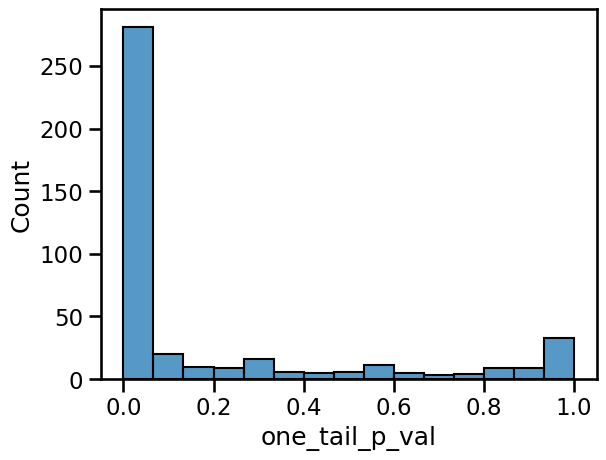

In [33]:
sns.histplot(t_test_df["one_tail_p_val"])

<Axes: xlabel='p_vals', ylabel='Count'>

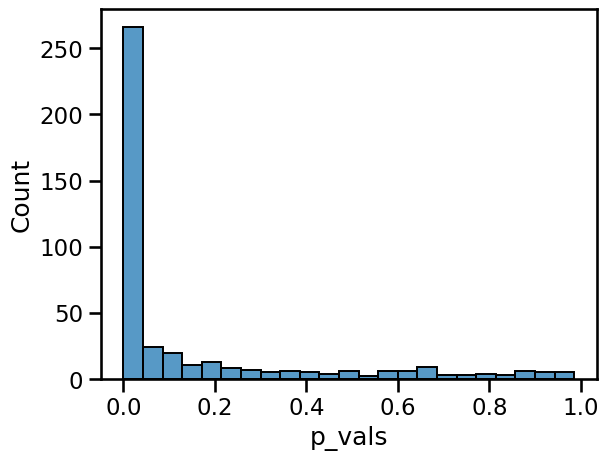

In [34]:
sns.histplot(t_test_df["p_vals"])

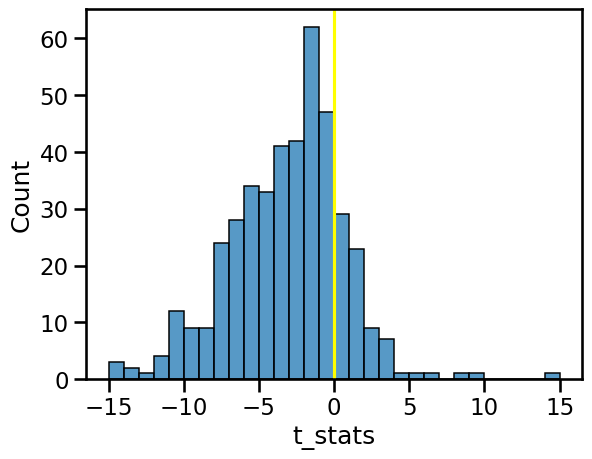

In [35]:
sns.histplot(t_test_df["t_stats"], bins = np.arange(-15,15.25,1))
plt.axvline(0, color = "yellow")
#AD mean < DBD mean when t_stat is negative

In [36]:
from scipy import stats

t_test_df = t_test_df.dropna()
t_test_df["bh_correc_p_val"] = stats.false_discovery_control(t_test_df["p_vals"])
t_test_df

,ENST,t_stats,p_vals,one_tail_p_val,bh_correc_p_val
0,ENST00000273153,-1.737675,8.240031e-02,4.120015e-02,1.213273e-01
1,ENST00000599369,-6.110120,1.405721e-09,7.028605e-10,6.252530e-09
2,ENST00000526816,-0.494708,6.209341e-01,3.104671e-01,6.851133e-01
3,ENST00000403402,-16.688873,3.788051e-53,1.894026e-53,8.087489e-51
4,ENST00000677301,-1.758121,7.896560e-02,3.948280e-02,1.174854e-01
...,...,...,...,...,...
425,ENST00000343035,-5.395519,1.424412e-07,7.122062e-08,4.944911e-07
426,ENST00000318247,-0.482066,6.302194e-01,3.151097e-01,6.935662e-01
427,ENST00000408911,0.723188,4.697104e-01,7.651448e-01,5.435403e-01
428,ENST00000396009,-1.519517,1.288204e-01,6.441021e-02,1.768692e-01


In [37]:
bh_sig = t_test_df[t_test_df["bh_correc_p_val"] < 0.05]
bh_sig

,ENST,t_stats,p_vals,one_tail_p_val,bh_correc_p_val
1,ENST00000599369,-6.110120,1.405721e-09,7.028605e-10,6.252530e-09
3,ENST00000403402,-16.688873,3.788051e-53,1.894026e-53,8.087489e-51
8,ENST00000221452,-7.233459,7.933787e-13,3.966894e-13,5.840909e-12
15,ENST00000226247,-5.247255,1.940059e-07,9.700297e-08,6.627243e-07
16,ENST00000283921,-6.259405,1.392380e-09,6.961901e-10,6.252530e-09
...,...,...,...,...,...
422,ENST00000252818,-7.055266,4.566956e-12,2.283478e-12,2.826218e-11
423,ENST00000505458,-4.148662,3.642332e-05,1.821166e-05,9.483388e-05
424,ENST00000162391,-7.102680,2.620818e-12,1.310409e-12,1.695590e-11
425,ENST00000343035,-5.395519,1.424412e-07,7.122062e-08,4.944911e-07


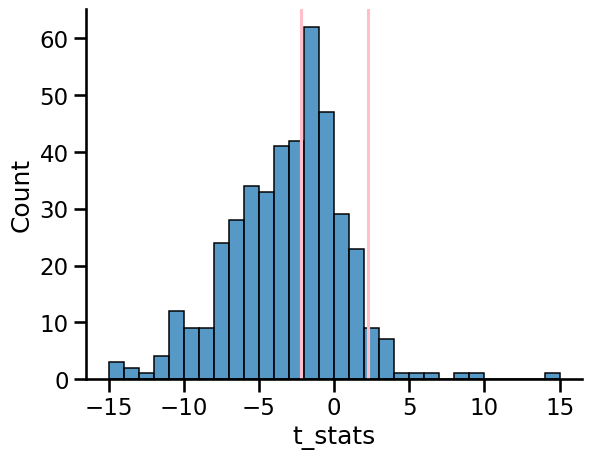

In [38]:
sns.histplot(t_test_df["t_stats"], bins = np.arange(-15,15.25,1))
plt.axvline(max(bh_sig[bh_sig["t_stats"] < 0]["t_stats"]), color = "pink")
plt.axvline(min(bh_sig[bh_sig["t_stats"] > 0]["t_stats"]), color = "pink")
sns.despine()
#AD mean < DBD mean when t_stat is negative

In [39]:
np.mean(ad_phylo_P["PhyloP"])

4.144291971346172

In [40]:
np.mean(cds_phylo_P["PhyloP"])

3.2532915072260393

In [41]:
np.mean(dbd_phylo_P["PhyloP"])

4.5866988826252

In [262]:
len(ad_phylo_P)

,0,1,2,3,4,5,6,ENST,8,9,10,11,12,13,14,15,PhyloP
414,6,53128616,53128617,AD,NaN,.,-,ENST00000259803,6,53128616,53128617,ENST00000259803,-1,6,53128616,53128617,-5.783
415,6,53128617,53128618,AD,NaN,.,-,ENST00000259803,6,53128617,53128618,ENST00000259803,-1,6,53128617,53128618,0.722
416,6,53128618,53128619,AD,NaN,.,-,ENST00000259803,6,53128618,53128619,ENST00000259803,-1,6,53128618,53128619,1.784
417,6,53128619,53128620,AD,NaN,.,-,ENST00000259803,6,53128619,53128620,ENST00000259803,-1,6,53128619,53128620,1.446
418,6,53128620,53128621,AD,NaN,.,-,ENST00000259803,6,53128620,53128621,ENST00000259803,-1,6,53128620,53128621,1.740
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2311,19,15379723,15379724,AD,NaN,.,-,ENST00000269701,19,15379723,15379724,ENST00000269701,-1,19,15379723,15379724,0.674
2312,19,15379724,15379725,AD,NaN,.,-,ENST00000269701,19,15379724,15379725,ENST00000269701,-1,19,15379724,15379725,6.849
2313,19,15379725,15379726,AD,NaN,.,-,ENST00000269701,19,15379725,15379726,ENST00000269701,-1,19,15379725,15379726,0.712
2314,19,15379726,15379727,AD,NaN,.,-,ENST00000269701,19,15379726,15379727,ENST00000269701,-1,19,15379726,15379727,4.610


In [281]:
samp_means = []

for i in np.arange(10000):
    rand_samp = cds_phylo_P['PhyloP'].sample(n=len(ad_phylo_P), replace = True)
    samp_mean = np.mean(rand_samp)
    samp_means.append(samp_mean)

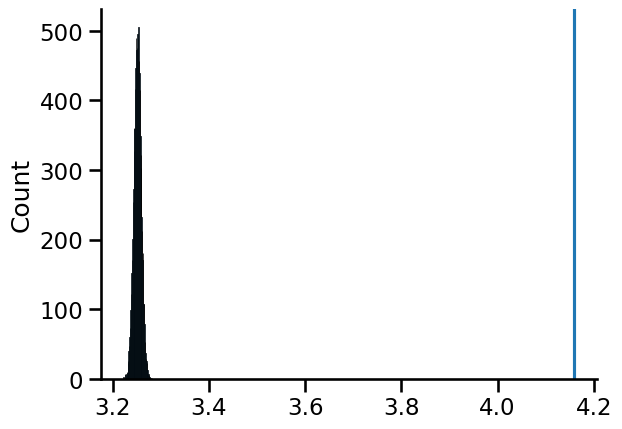

In [290]:
sns.set_context('talk')
sns.histplot(samp_means)
sns.despine()
plt.axvline(np.mean(ad_phylo_P['PhyloP']));

In [291]:
ad_phylo_P

,0,1,2,3,4,5,6,ENST,8,9,10,11,12,13,14,15,PhyloP
414,6,53128616,53128617,AD,NaN,.,-,ENST00000259803,6,53128616,53128617,ENST00000259803,-1,6,53128616,53128617,-5.783
415,6,53128617,53128618,AD,NaN,.,-,ENST00000259803,6,53128617,53128618,ENST00000259803,-1,6,53128617,53128618,0.722
416,6,53128618,53128619,AD,NaN,.,-,ENST00000259803,6,53128618,53128619,ENST00000259803,-1,6,53128618,53128619,1.784
417,6,53128619,53128620,AD,NaN,.,-,ENST00000259803,6,53128619,53128620,ENST00000259803,-1,6,53128619,53128620,1.446
418,6,53128620,53128621,AD,NaN,.,-,ENST00000259803,6,53128620,53128621,ENST00000259803,-1,6,53128620,53128621,1.740
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2311,19,15379723,15379724,AD,NaN,.,-,ENST00000269701,19,15379723,15379724,ENST00000269701,-1,19,15379723,15379724,0.674
2312,19,15379724,15379725,AD,NaN,.,-,ENST00000269701,19,15379724,15379725,ENST00000269701,-1,19,15379724,15379725,6.849
2313,19,15379725,15379726,AD,NaN,.,-,ENST00000269701,19,15379725,15379726,ENST00000269701,-1,19,15379725,15379726,0.712
2314,19,15379726,15379727,AD,NaN,.,-,ENST00000269701,19,15379726,15379727,ENST00000269701,-1,19,15379726,15379727,4.610


In [303]:
SFARI_TFs = pd.read_csv("../data/SFARI_TFs_with_ENST_corrected.csv")
SFARI_TFs["ENST"] = SFARI_TFs["ENST"].str.split(".").str[0]
SFARI_TFs

,Unnamed: 0,uniprotID,ENST
0,0,Q9H2P0,ENST00000349014
1,1,Q5TGY3,ENST00000247087
2,2,Q96QS3,ENST00000379044
3,3,Q96JM3,ENST00000361283
4,4,Q96RK0,ENST00000575354
...,...,...,...
117,117,Q8NEK5,ENST00000366197
118,118,Q9BR84,ENST00000393883
119,119,Q68DY1,ENST00000601440
120,120,Q9Y462,ENST00000276123


In [306]:
t_test_df["sfari"] = t_test_df["ENST"].isin(SFARI_TFs["ENST"])
t_test_df

,ENST,t_stats,p_vals,one_tail_p_val,bh_correc_p_val,sfari
0,ENST00000249499,-2.404241,1.664668e-02,8.323341e-03,3.024737e-02,False
1,ENST00000508793,-8.577230,4.300237e-17,2.150119e-17,5.738129e-16,False
2,ENST00000355995,3.556623,4.115356e-04,9.997942e-01,9.912016e-04,True
3,ENST00000278836,0.207460,8.357234e-01,5.821383e-01,8.833017e-01,False
4,ENST00000617811,-1.616935,1.063992e-01,5.319962e-02,1.583013e-01,False
...,...,...,...,...,...,...
425,ENST00000556155,-8.857888,2.073675e-18,1.036838e-18,3.279479e-17,False
426,ENST00000339562,6.961831,1.004970e-11,1.000000e+00,6.337213e-11,True
427,ENST00000695966,-1.637807,1.021160e-01,5.105800e-02,1.529949e-01,False
428,ENST00000252818,-7.192467,1.817388e-12,9.086939e-13,1.410954e-11,False


In [308]:
SFARI_t_test_df = t_test_df[t_test_df["sfari"]]
SFARI_t_test_df

,ENST,t_stats,p_vals,one_tail_p_val,bh_correc_p_val,sfari
2,ENST00000355995,3.556623,4.115356e-04,9.997942e-01,9.912016e-04,True
16,ENST00000367265,-7.503289,2.693736e-13,1.346868e-13,2.396303e-12,True
21,ENST00000288319,-0.711120,4.772142e-01,2.386071e-01,5.691912e-01,True
49,ENST00000348332,-1.586072,1.129527e-01,5.647633e-02,1.648896e-01,True
62,ENST00000303329,-2.530569,1.159621e-02,5.798107e-03,2.143543e-02,True
73,ENST00000056233,-7.385348,3.897761e-13,1.948880e-13,3.396620e-12,True
81,ENST00000317216,0.149840,8.809278e-01,5.595361e-01,9.020532e-01,True
83,ENST00000437473,2.348143,1.901610e-02,9.904919e-01,3.376197e-02,True
109,ENST00000377142,1.257109,2.096004e-01,8.951998e-01,2.814446e-01,True
113,ENST00000428368,6.101440,1.365054e-09,1.000000e+00,6.623613e-09,True


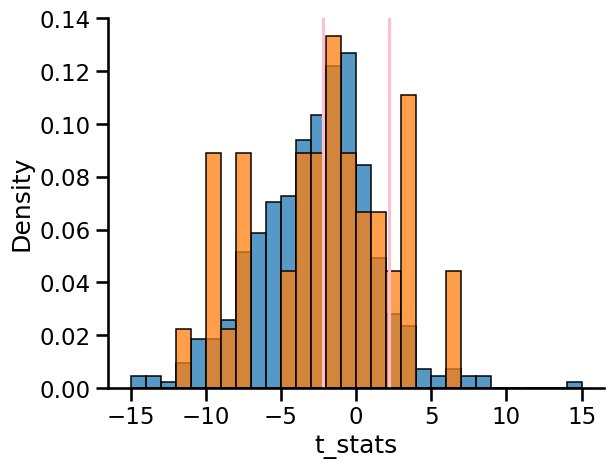

In [310]:
sns.histplot(t_test_df["t_stats"], bins = np.arange(-15,15.25,1), stat = 'density')
sns.histplot(SFARI_t_test_df["t_stats"], bins = np.arange(-15,15.25,1), stat = 'density')

plt.axvline(max(bh_sig[bh_sig["t_stats"] < 0]["t_stats"]), color = "pink")
plt.axvline(min(bh_sig[bh_sig["t_stats"] > 0]["t_stats"]), color = "pink")
sns.despine()
#AD mean < DBD mean when t_stat is negative

In [315]:
len(set(cds_phylo_P["ENST"]) & set(tfs_tbl["ENST"]))

430

HOXD9


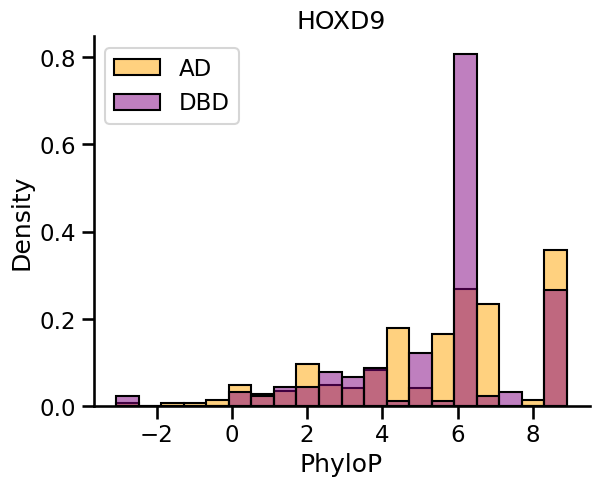

TP53 - p53 - TP53


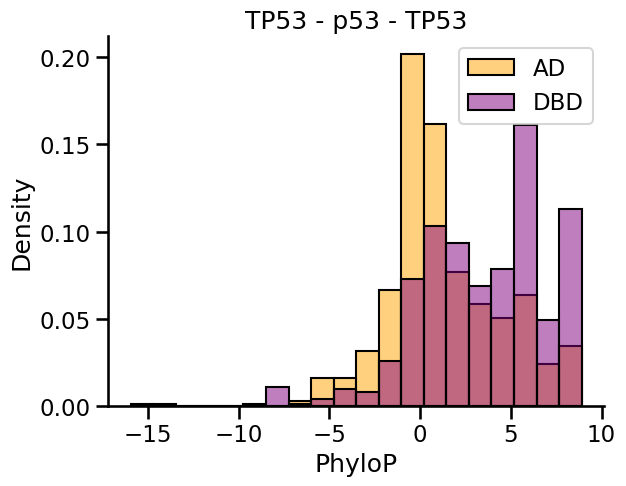

TCF7L2


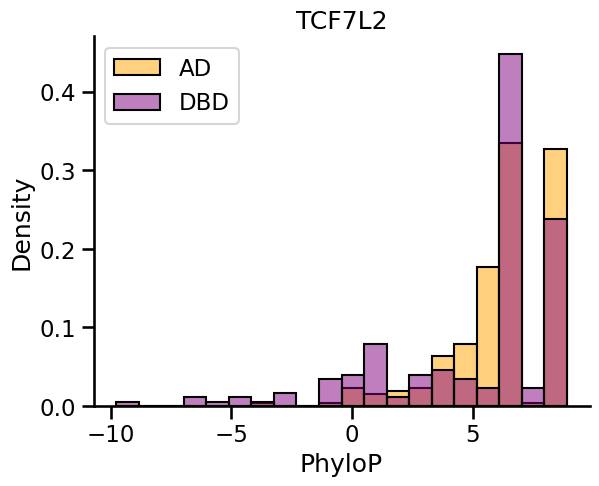

MYRF


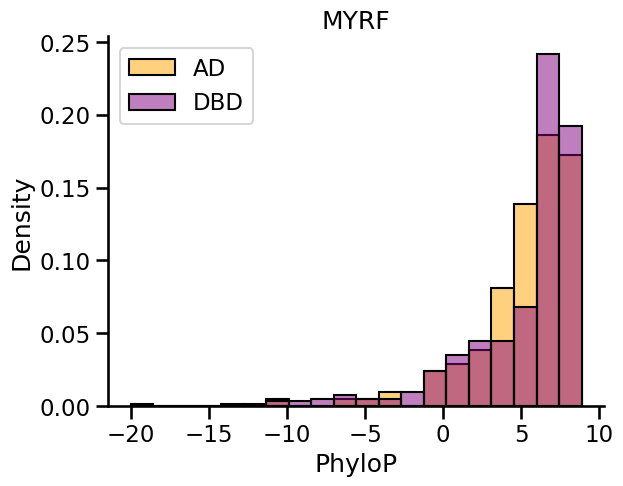

HNF1B


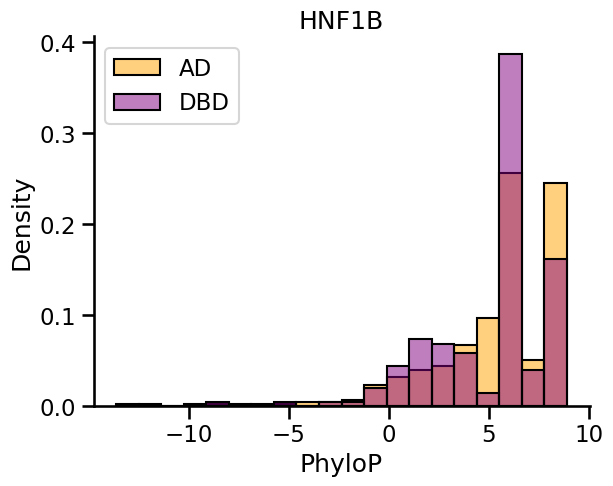

DDIT3


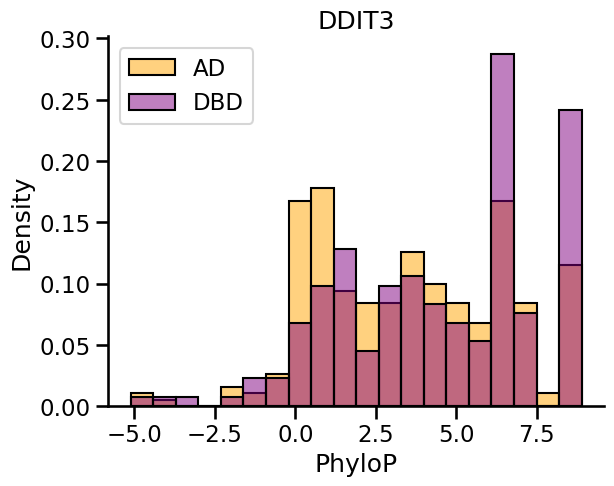

POU2AF1


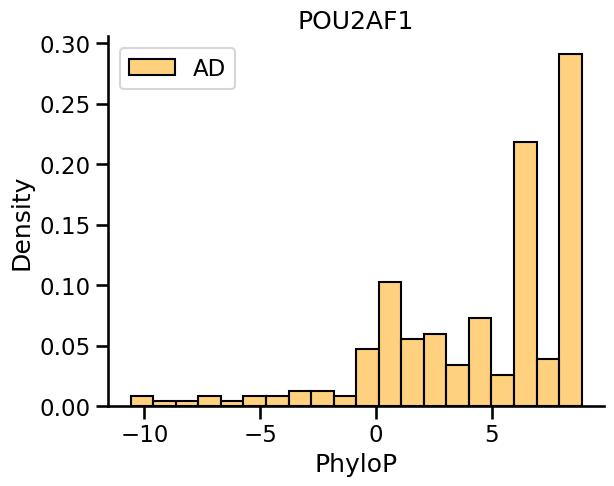

PHF1


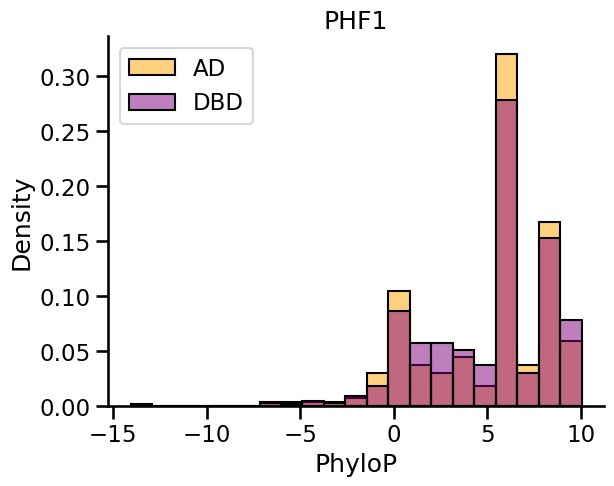

HSF2


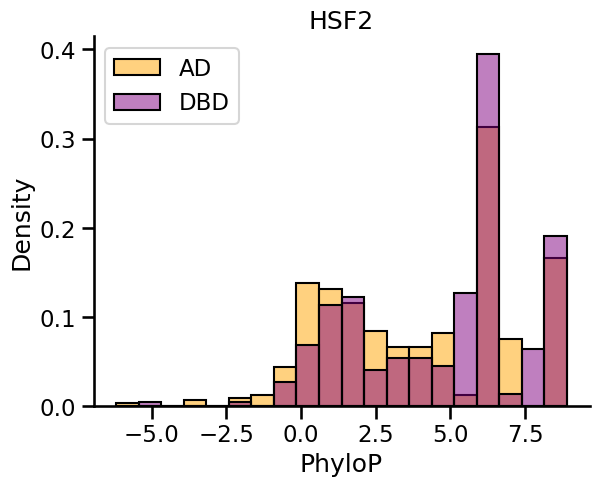

HOXD4


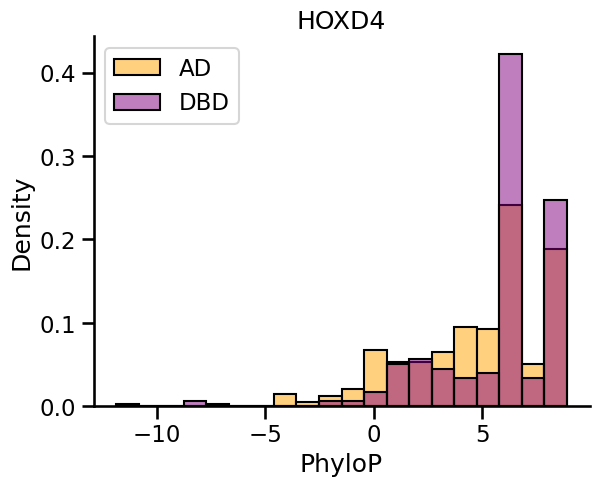

PIT1-POU1F1-GHF1 - POU1F1


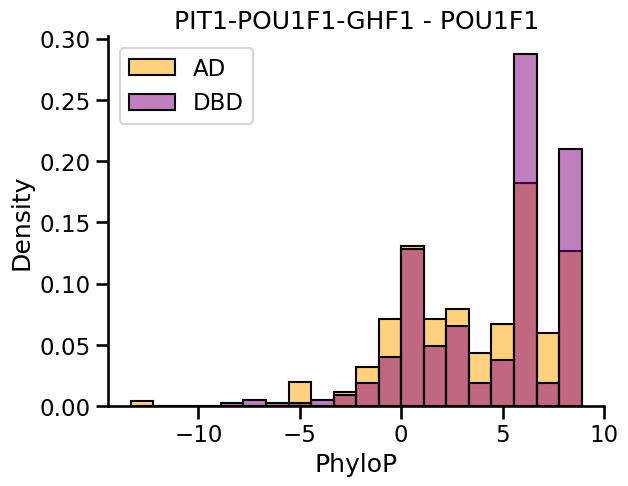

RBSN


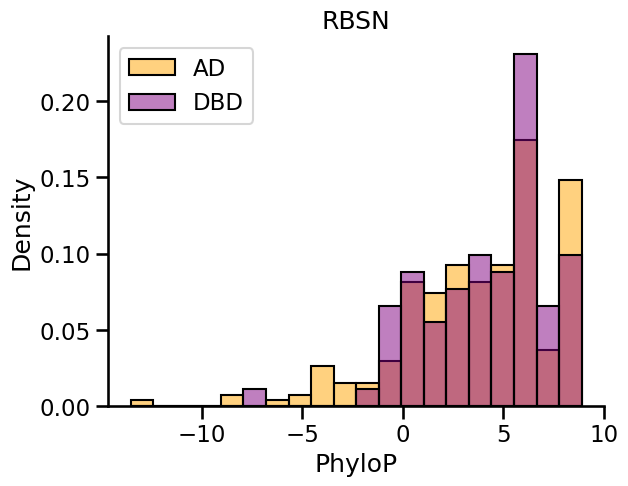

PTF1A


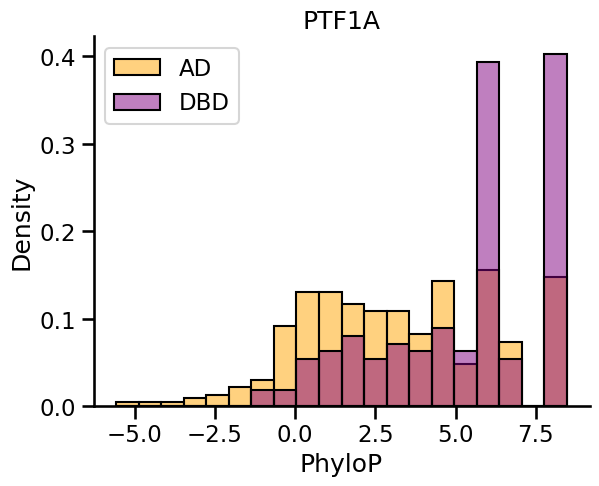

POU5F1B


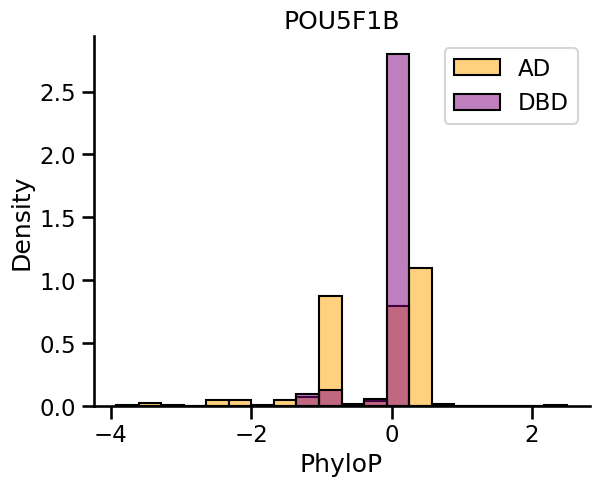

FOXO4


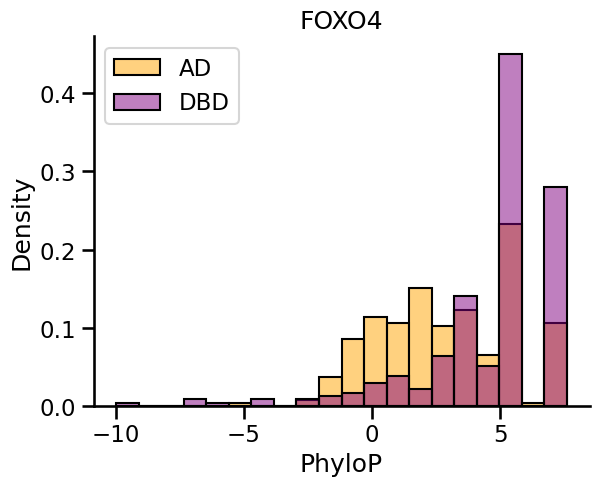

KMT2B


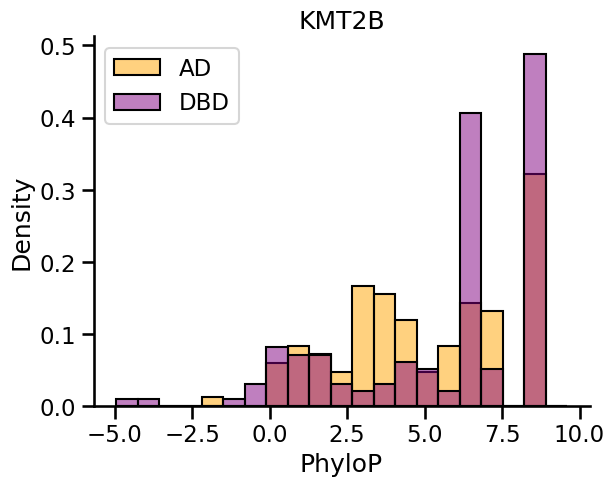

KDM5B


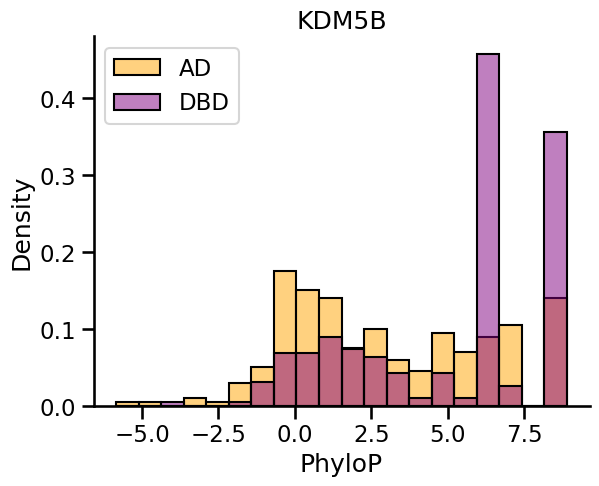

HIC2


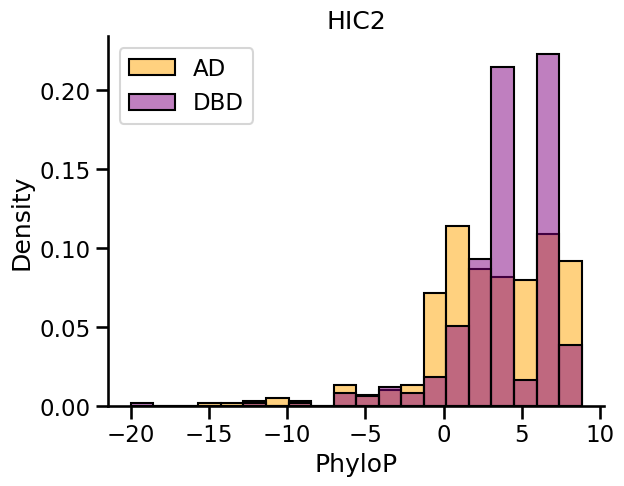

HIF3A


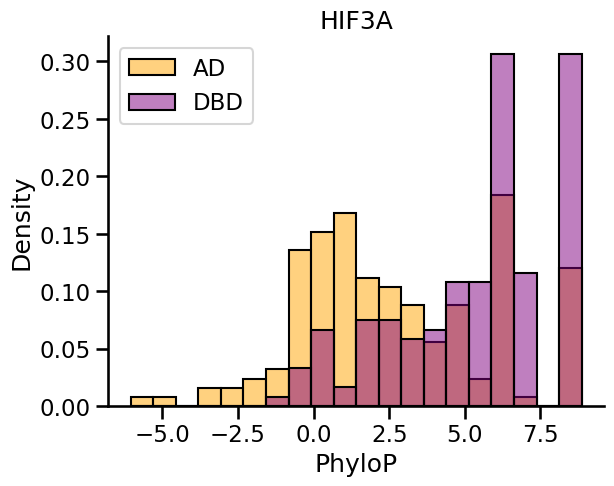

ELF1


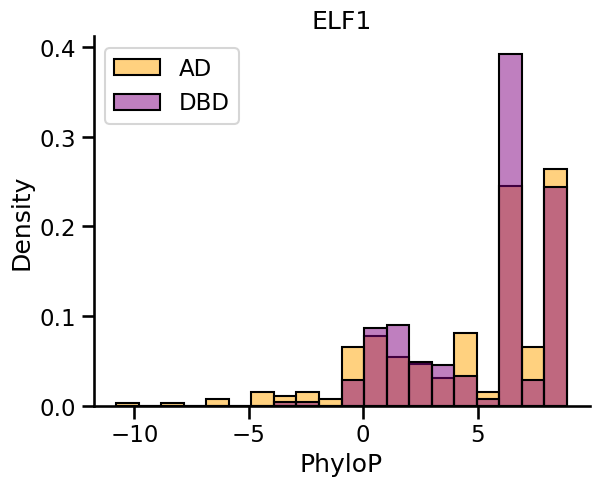

SIX2


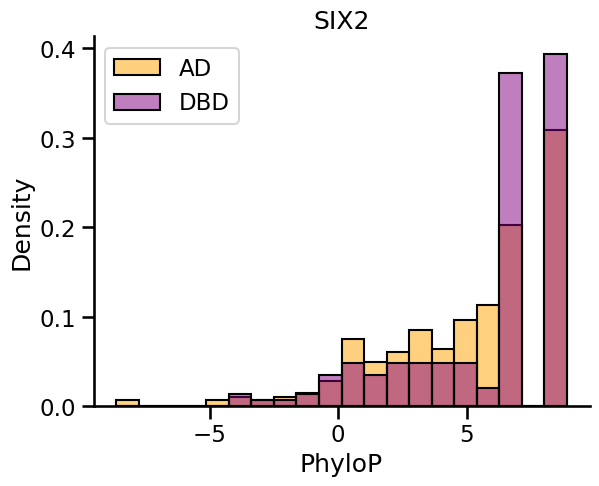

ERG


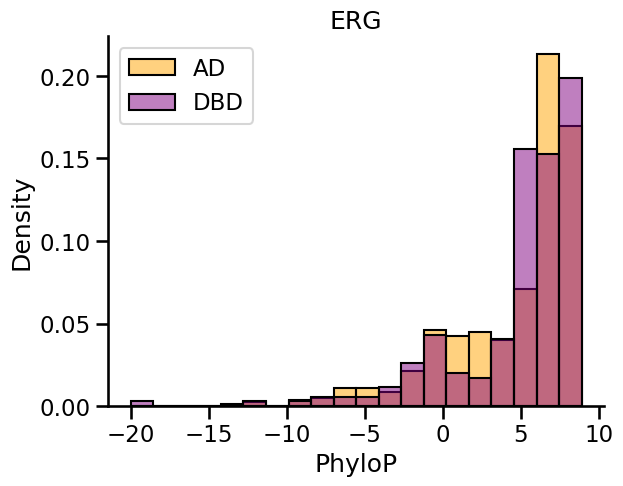

ZNF644


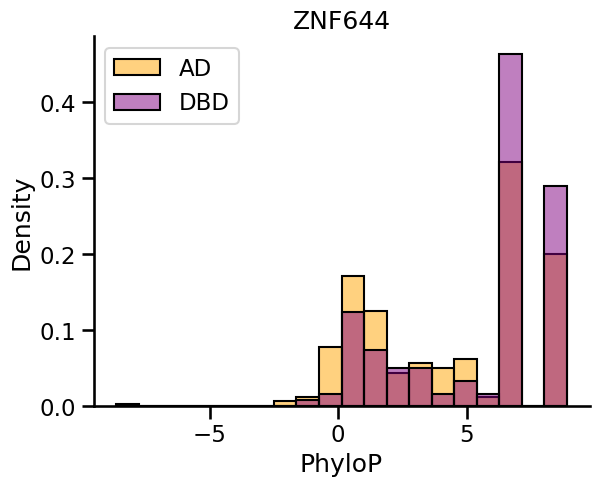

FOXN1


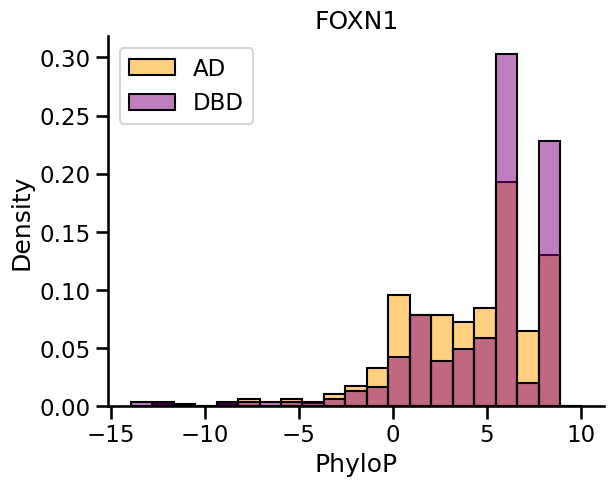

GCM2


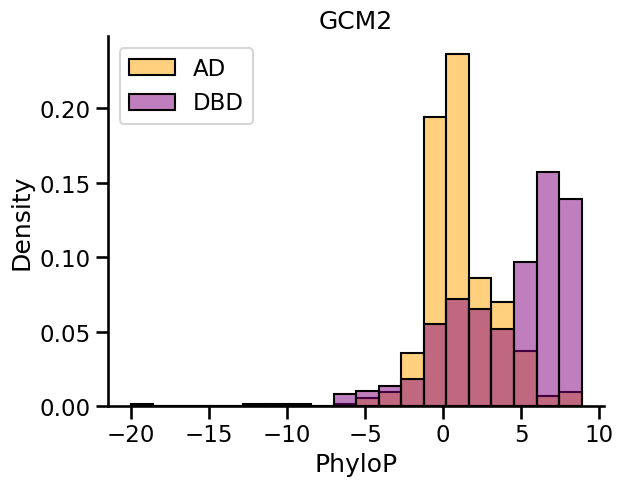

NFE2 - NF-E2 - NFE2


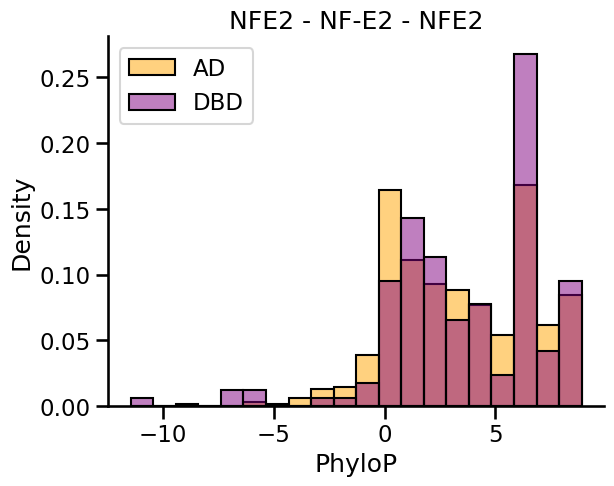

CREM


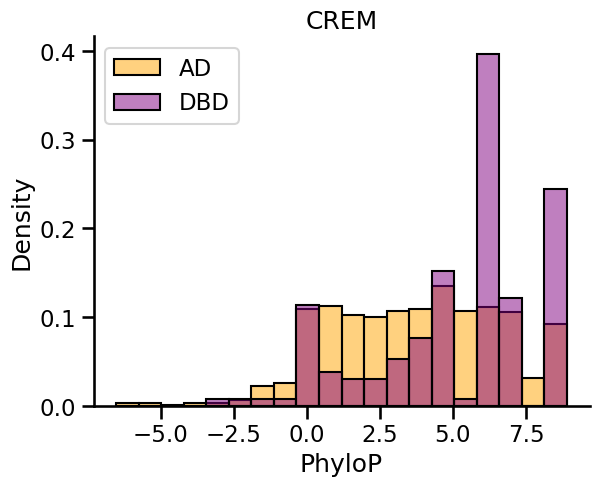

ZN473


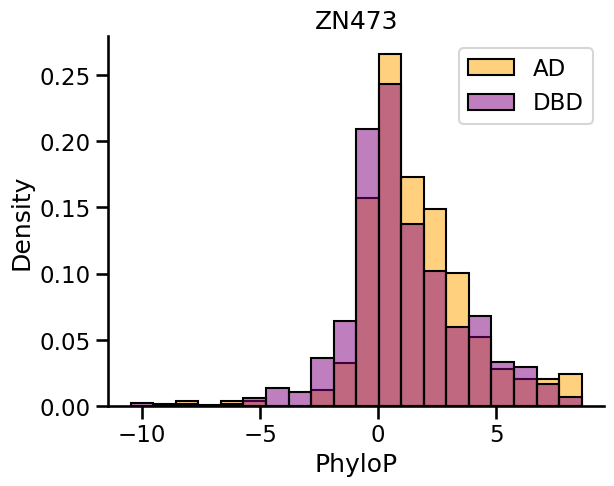

CDX4


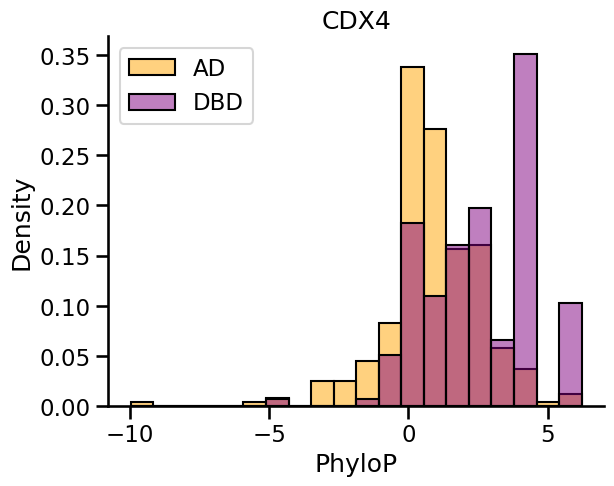

JUNB


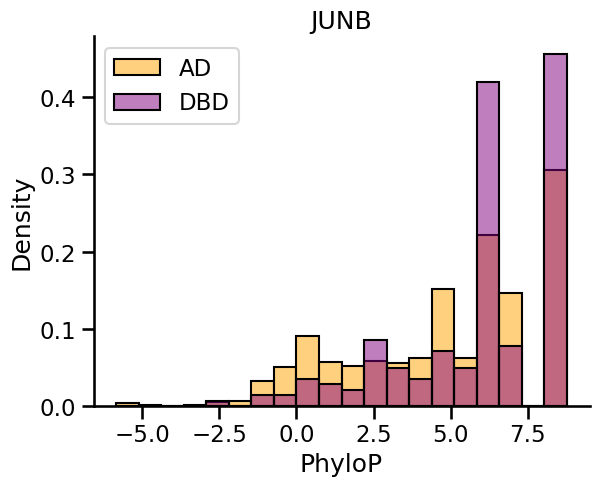

MYB - c-Myb - MYB


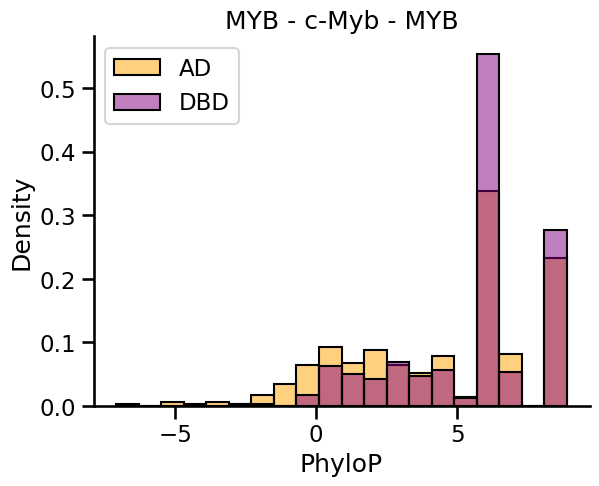

SOX17


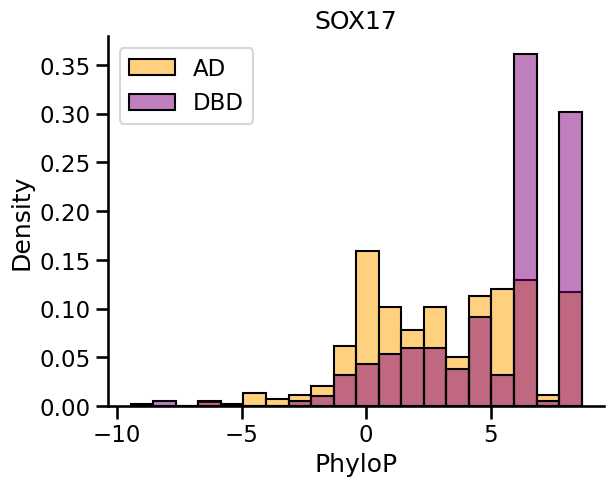

ESRRA


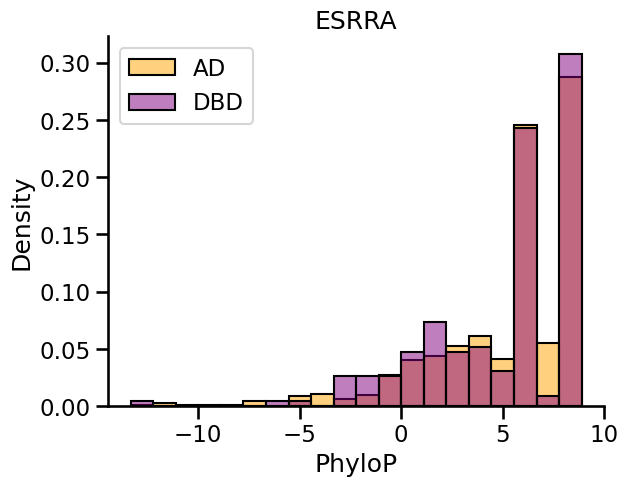

ALX3


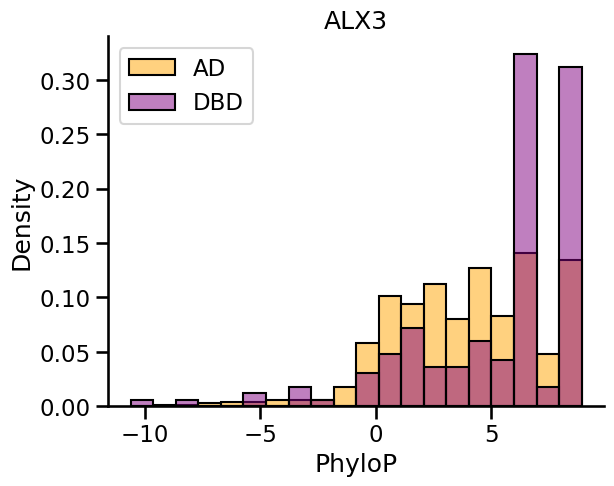

ETV2


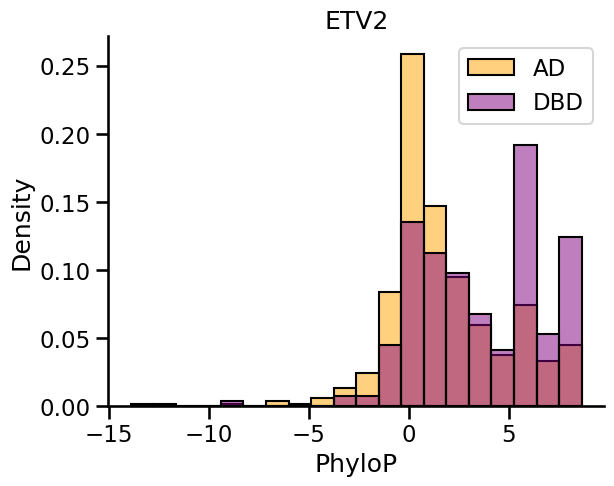

FOSB


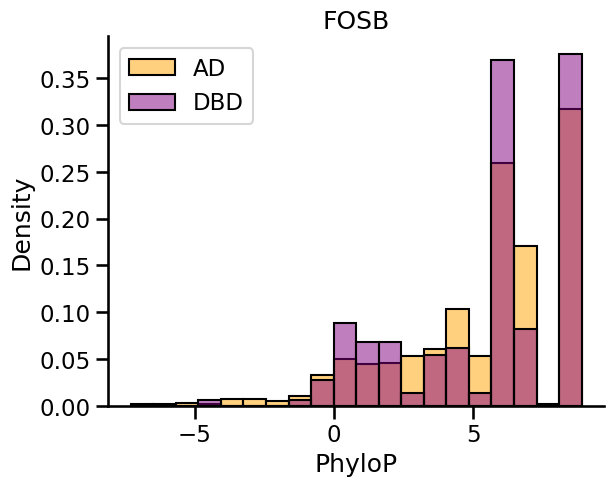

PAX7


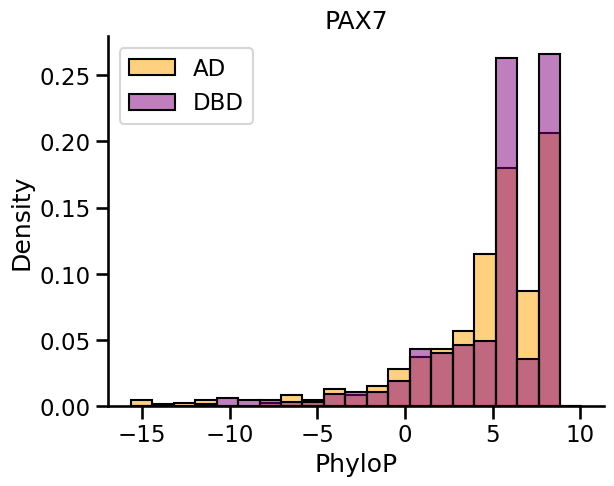

SMAD1


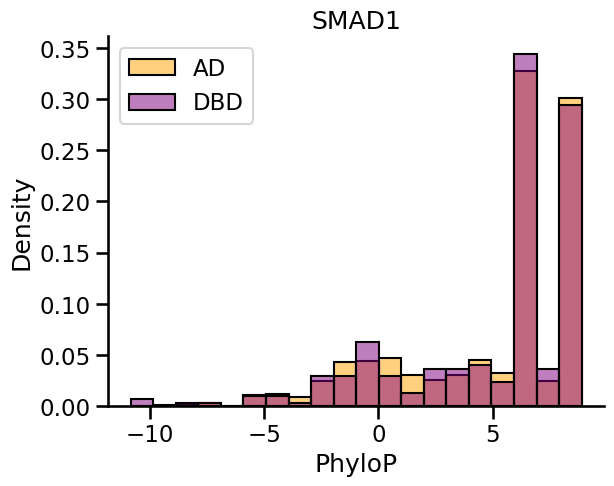

SP1


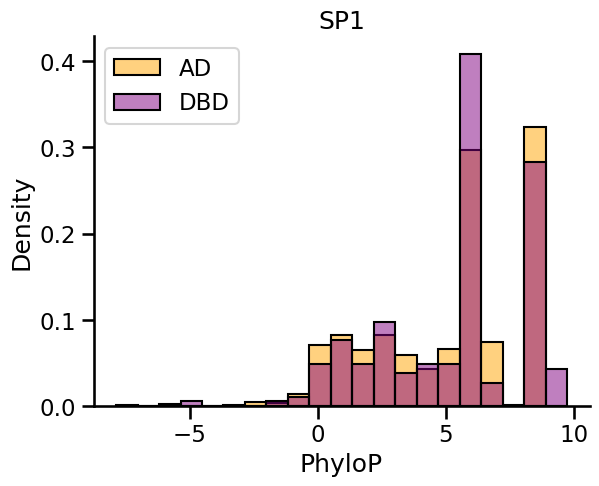

KLF8


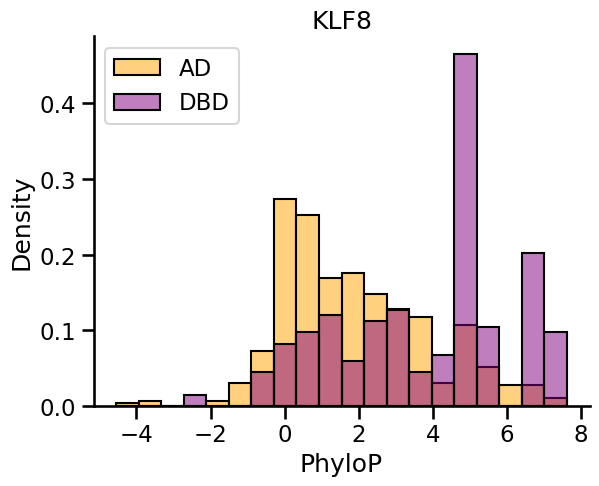

BMAL2 - ARNTL2


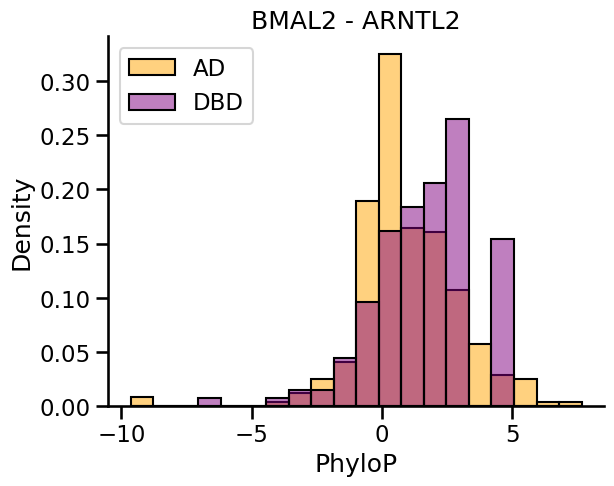

CSRNP1


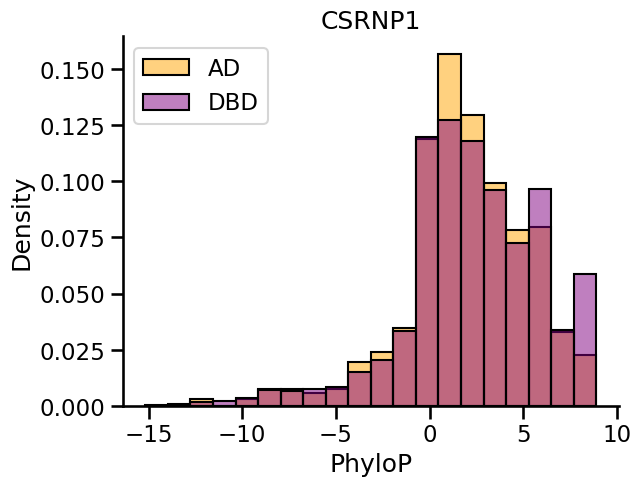

TBX21


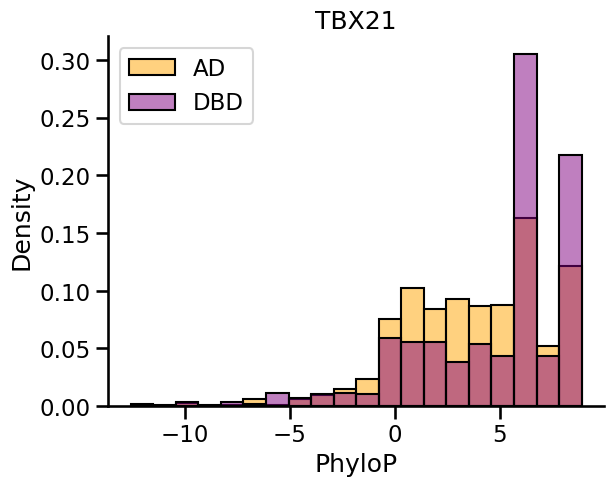

MAF


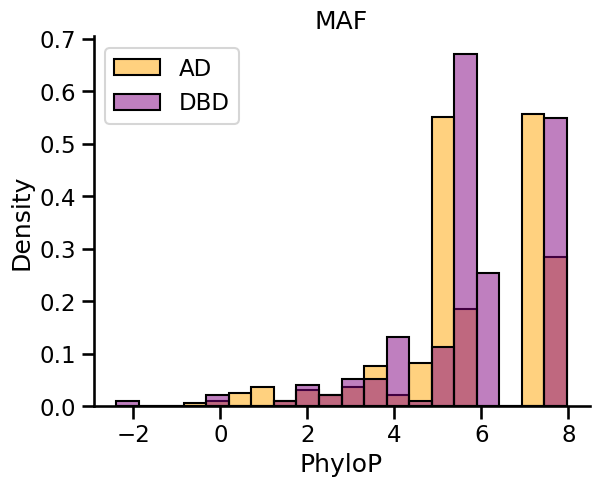

ZNF516


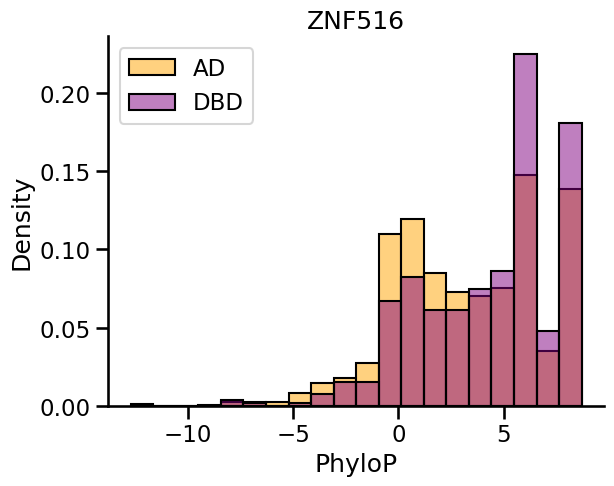

REL


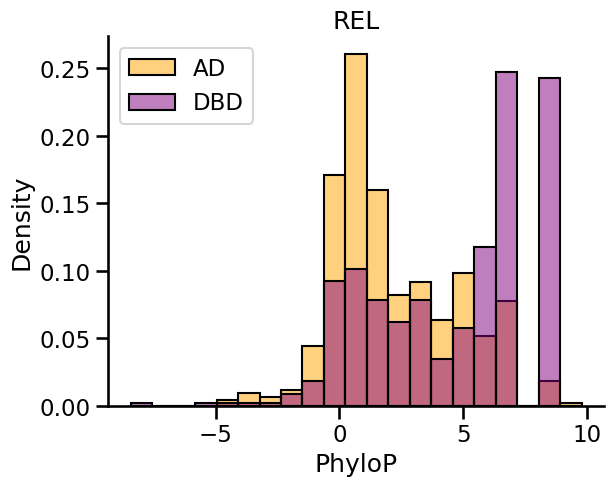

SOX4


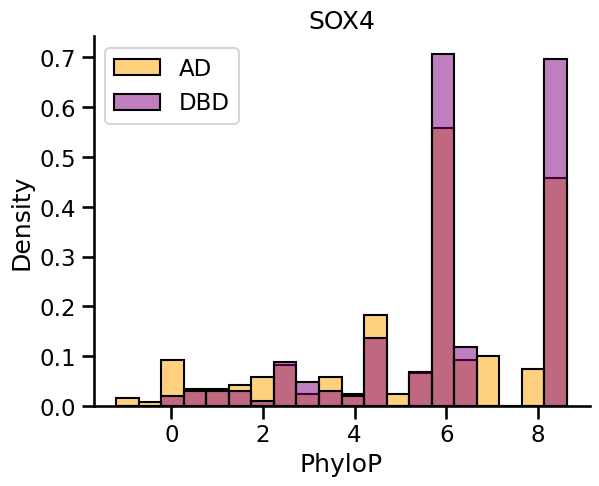

PITX2


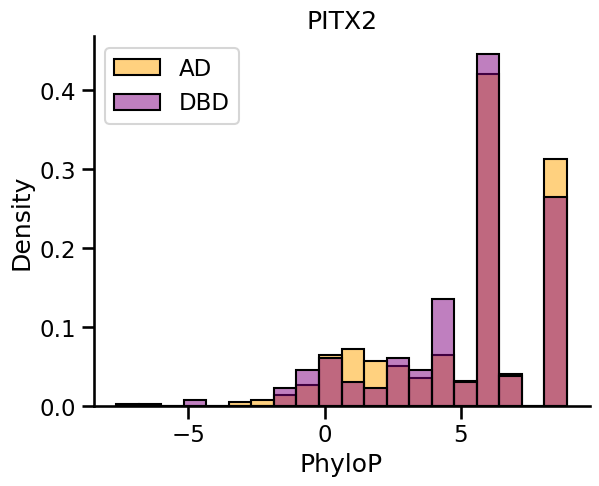

ZNF200


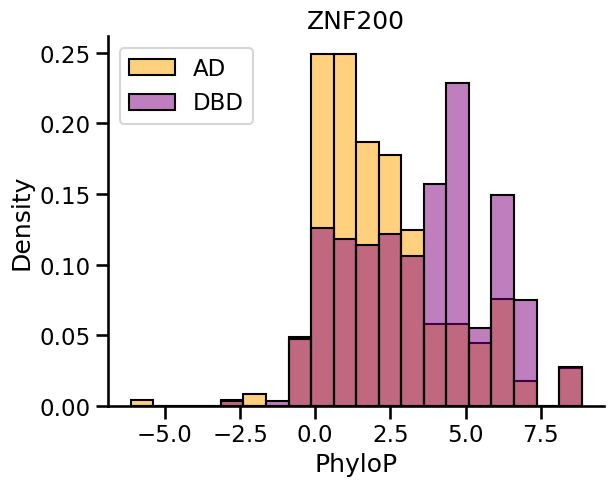

NCOA1


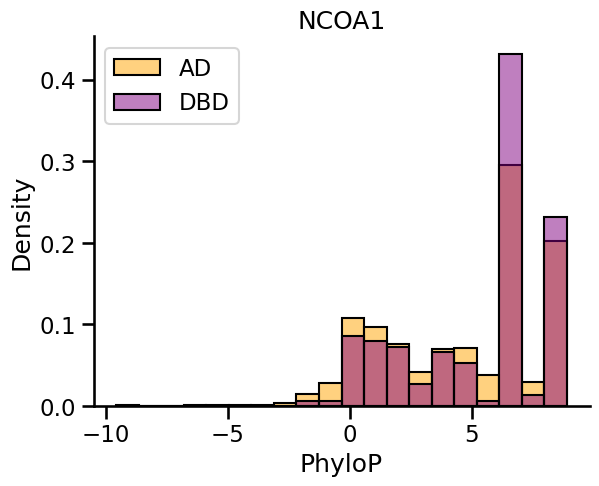

NFIC


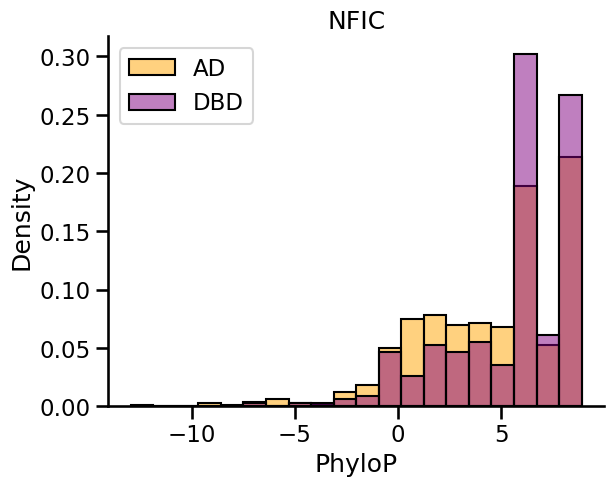

STAT5A


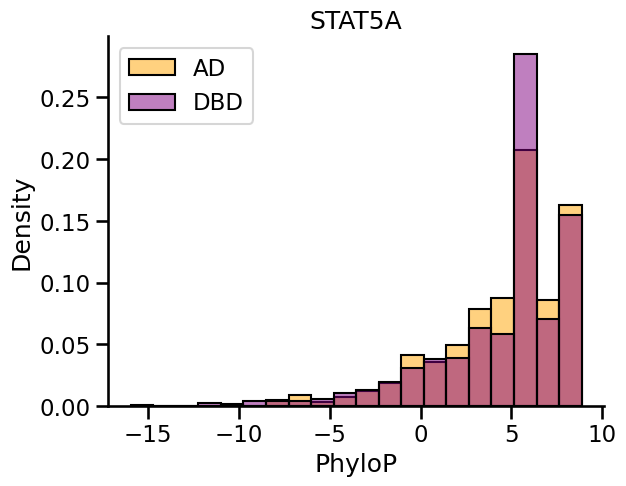

IRF6


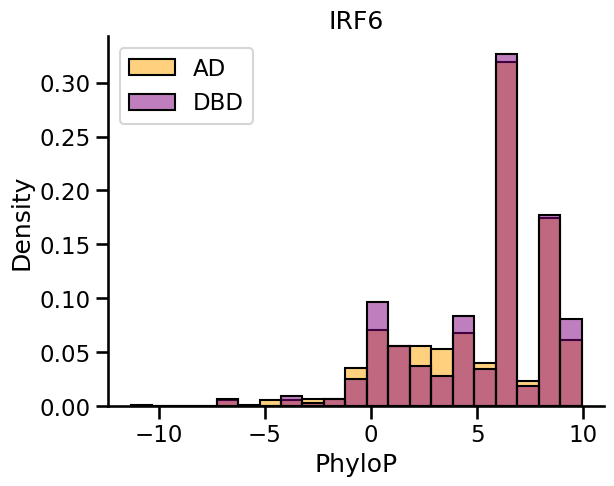

NR4A1


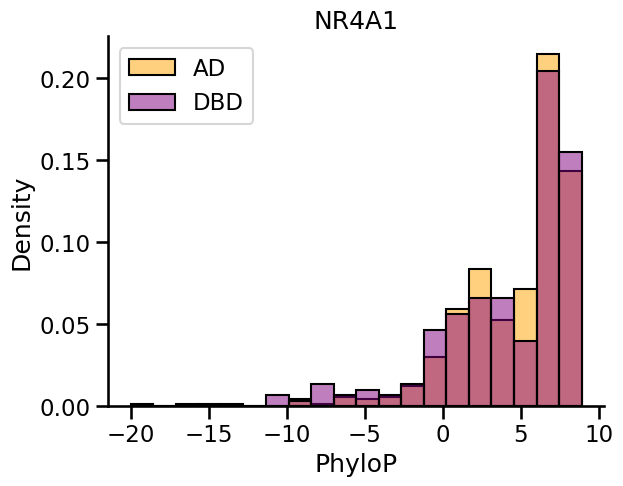

CAMTA1


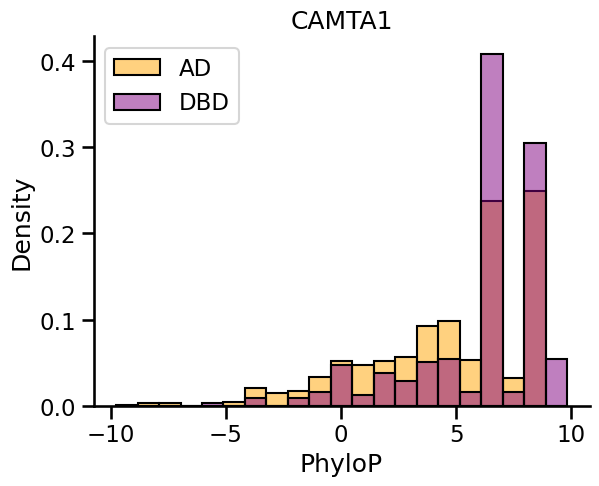

ATF5


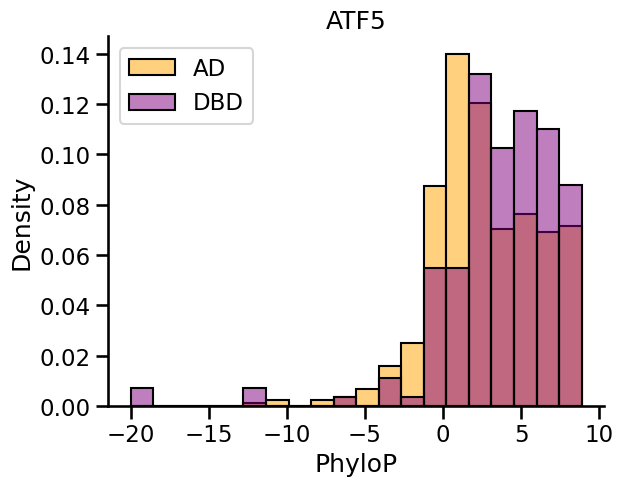

NEUROD2


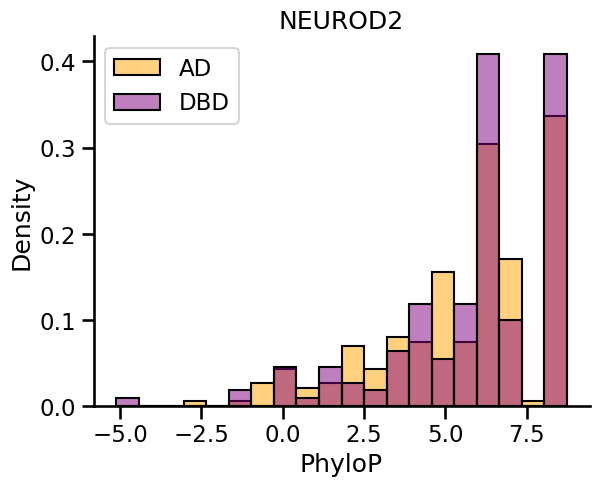

PGR


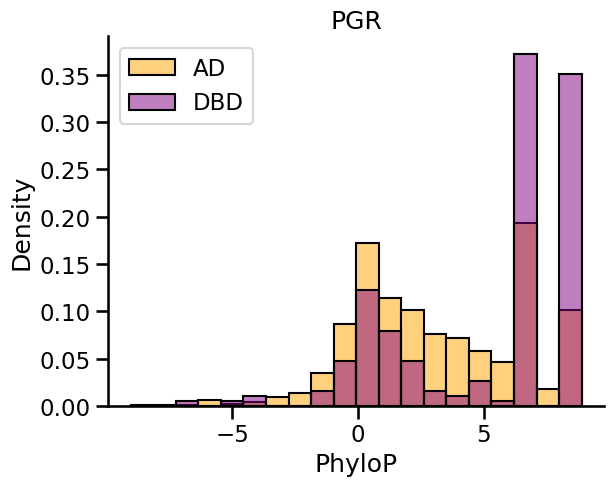

SP5


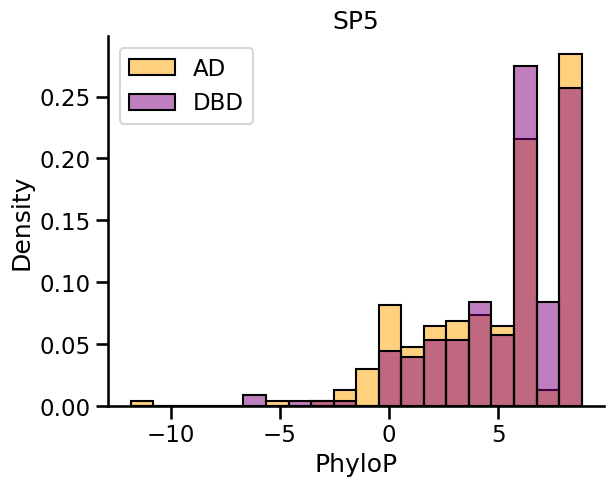

TBX20


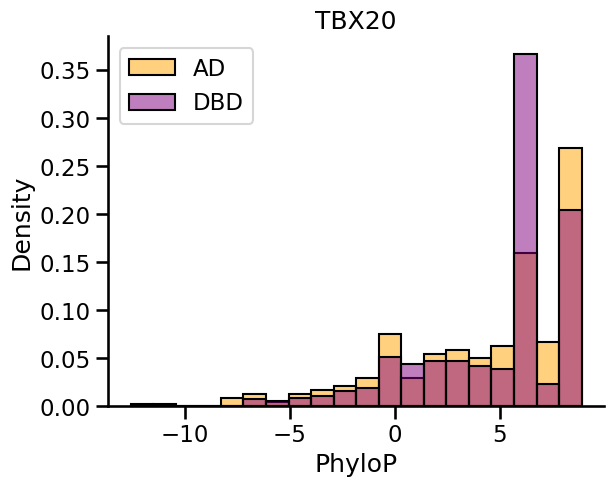

FOXC1


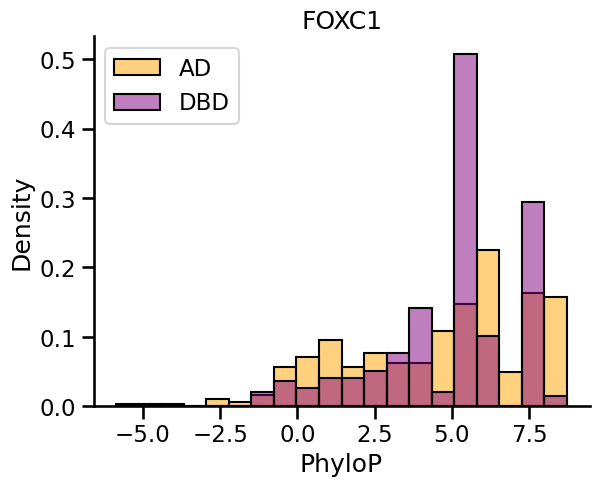

NKX2-1


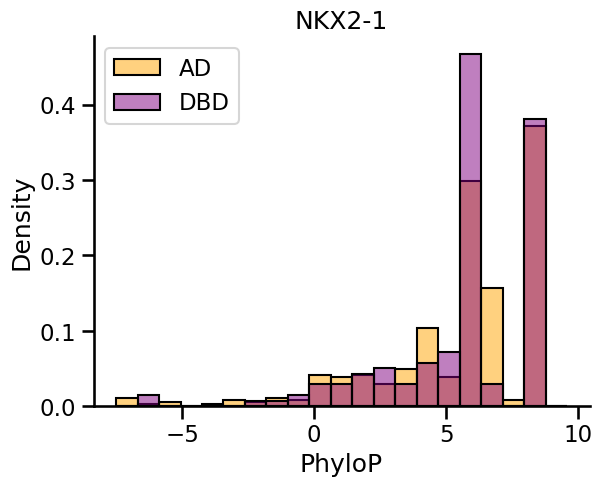

ARNT2


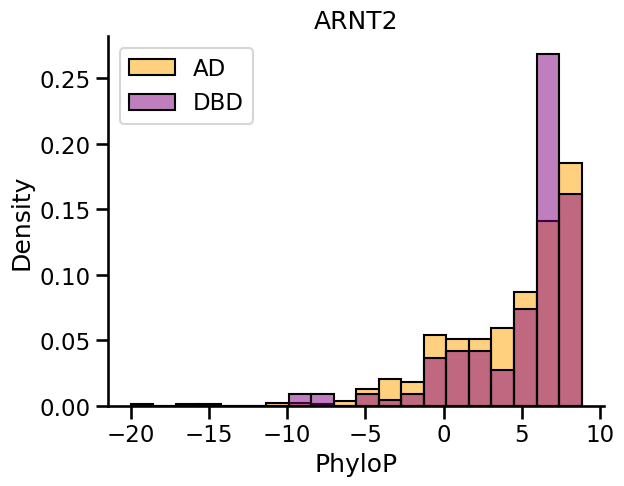

MYOD1 - MyoD


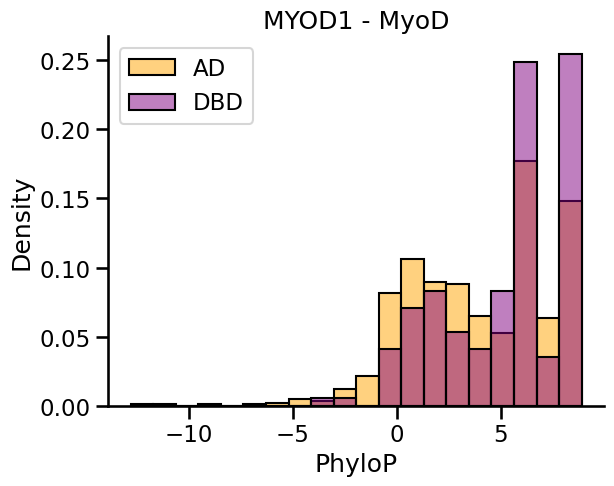

CEBPE


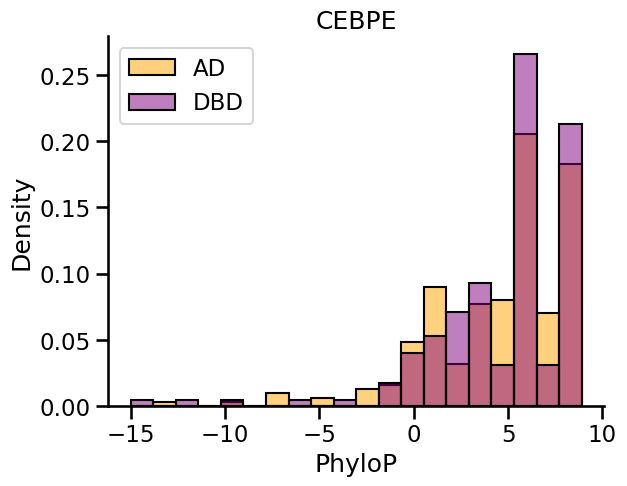

GRHL1


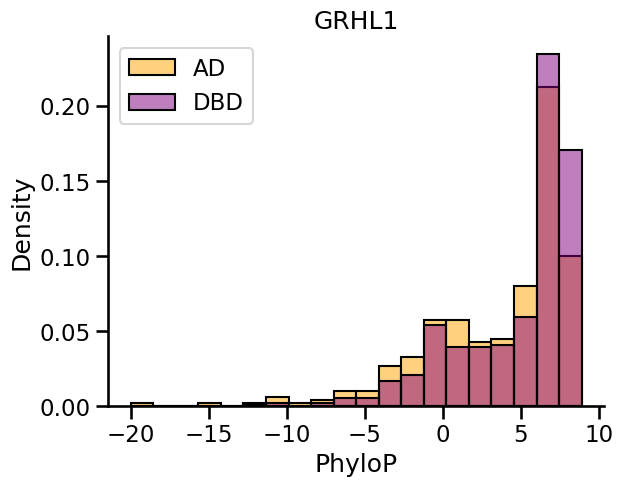

SOX1


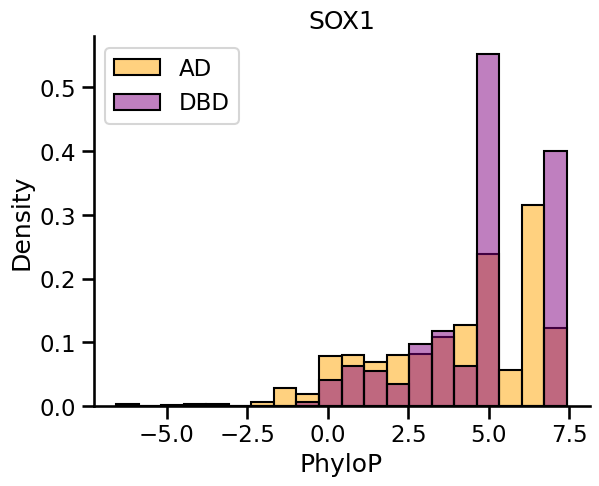

STAT4


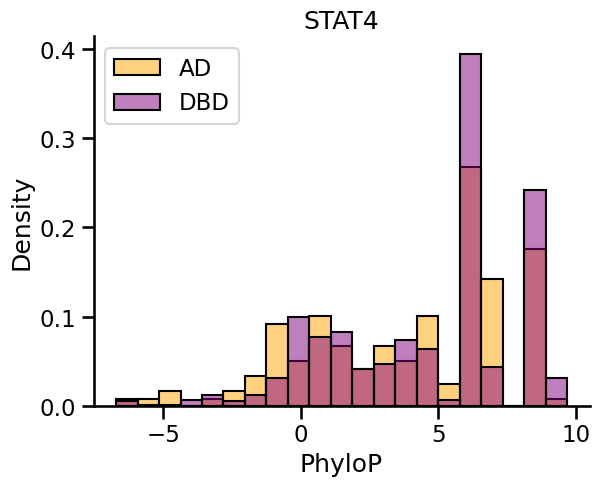

CEBPD


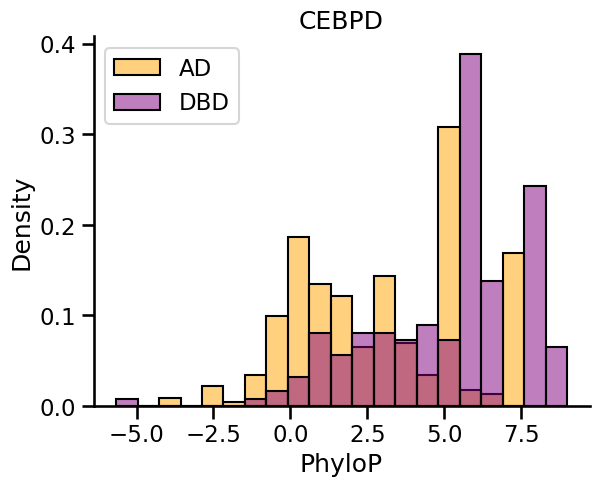

GMEB1


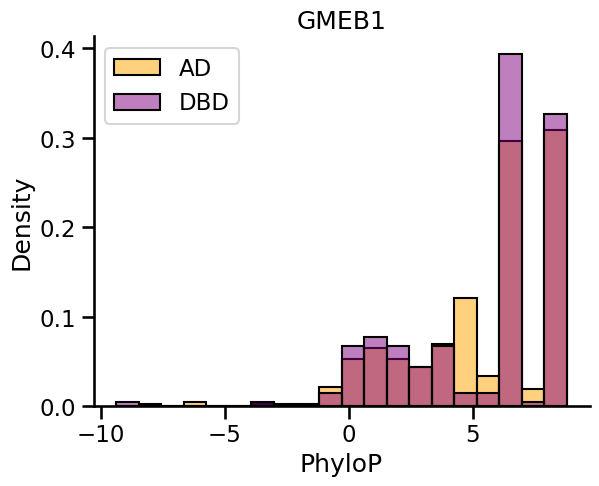

STAT3


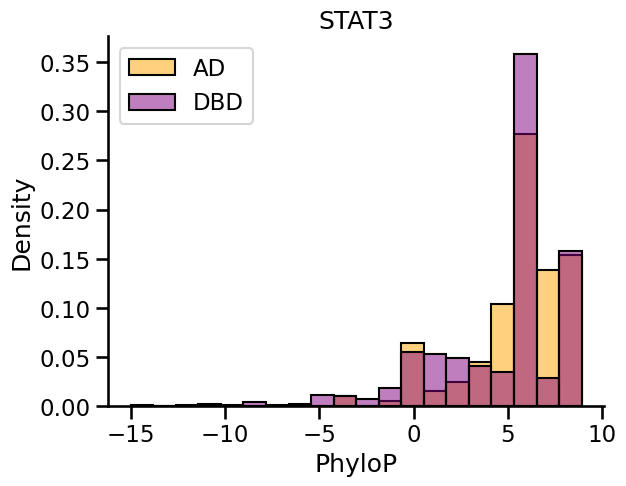

TFAP2C


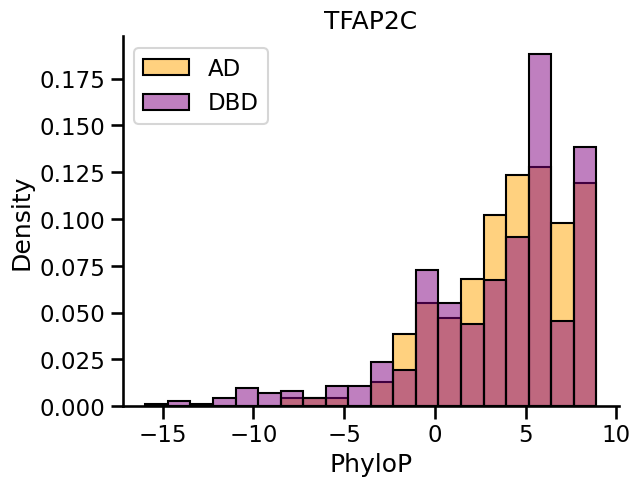

NR1H3


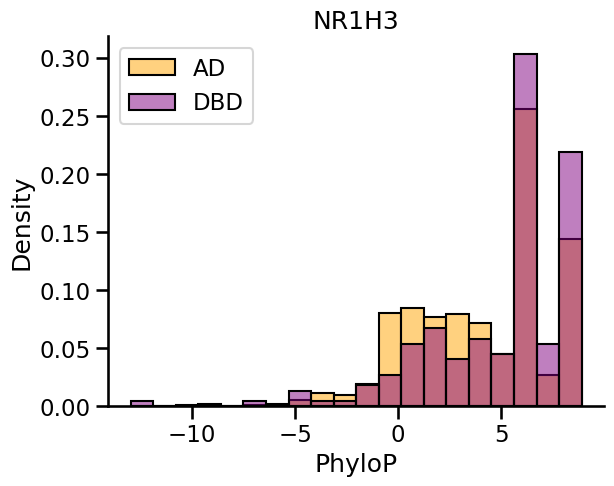

NFE2L3 - NF2L3


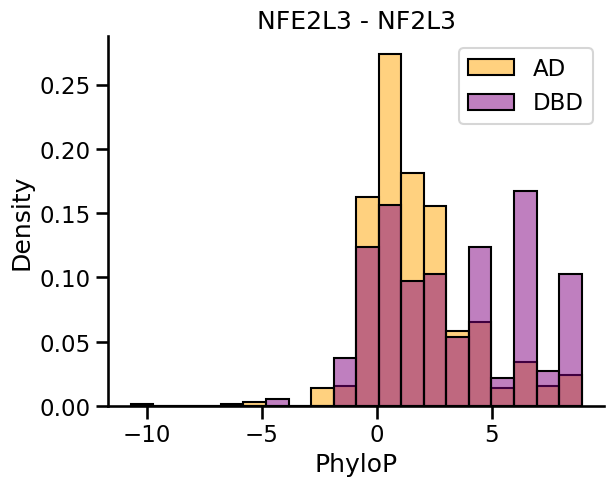

FOXA1


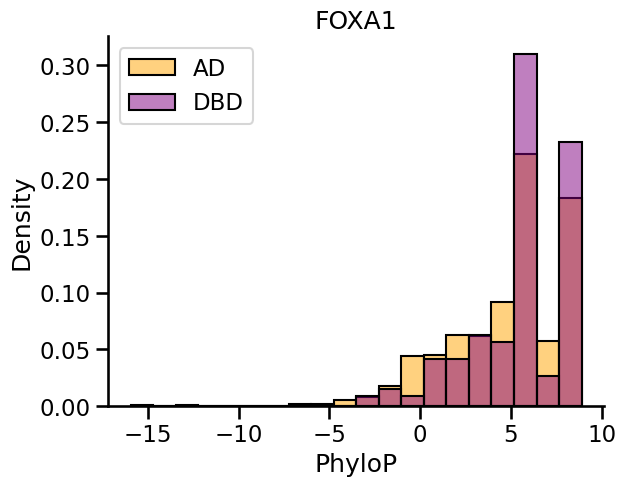

MYC


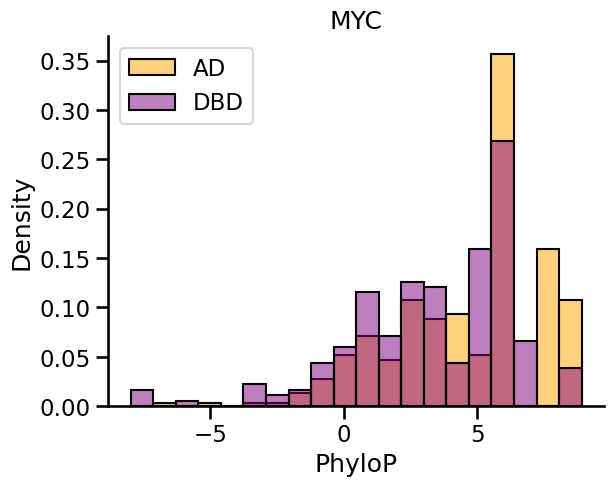

NR5A2


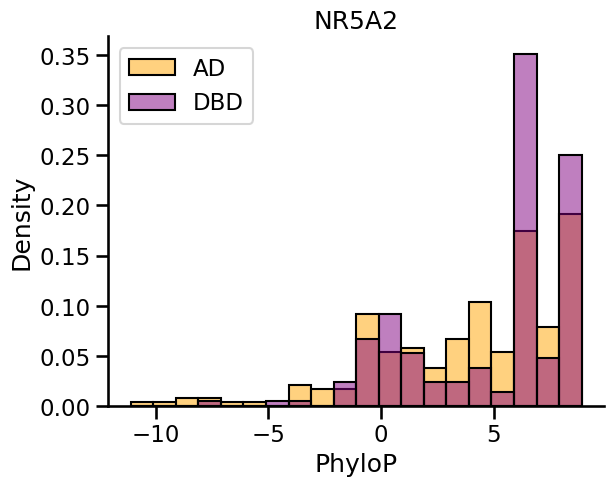

ARID5A


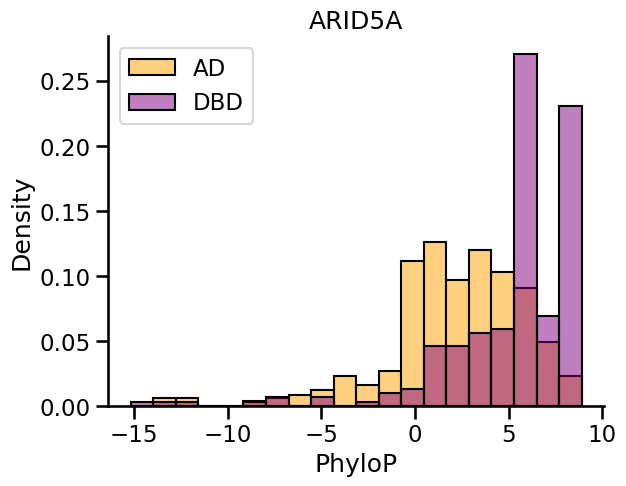

ZNF641


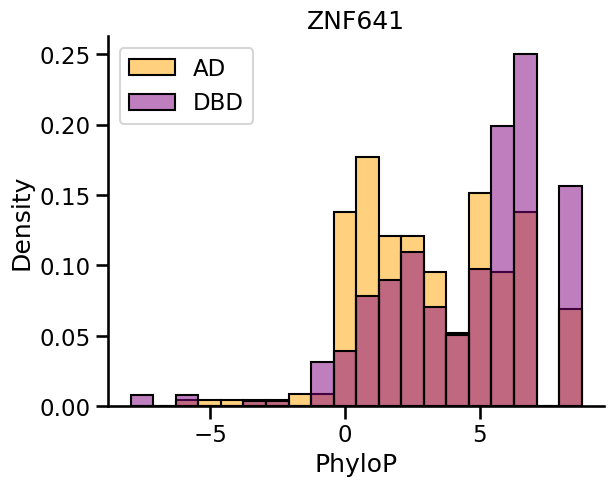

SRBP2 - SREBF2


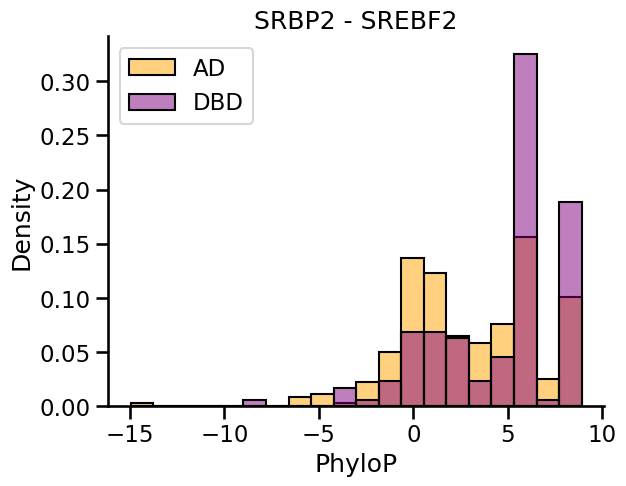

ZN561


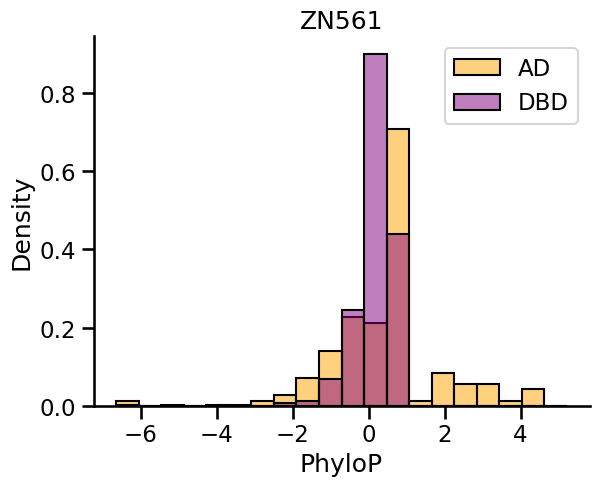

EGR3


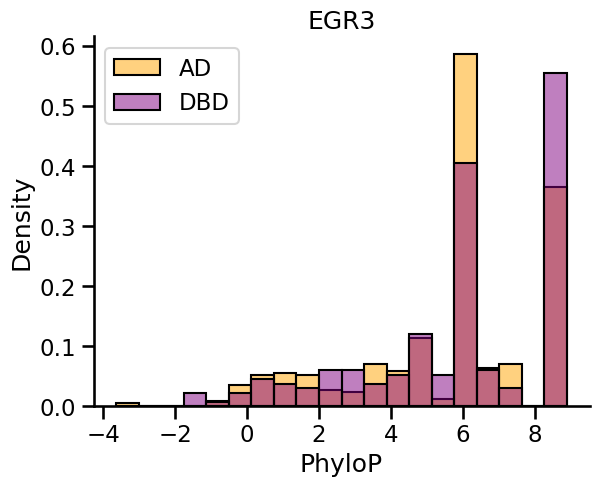

KLF5


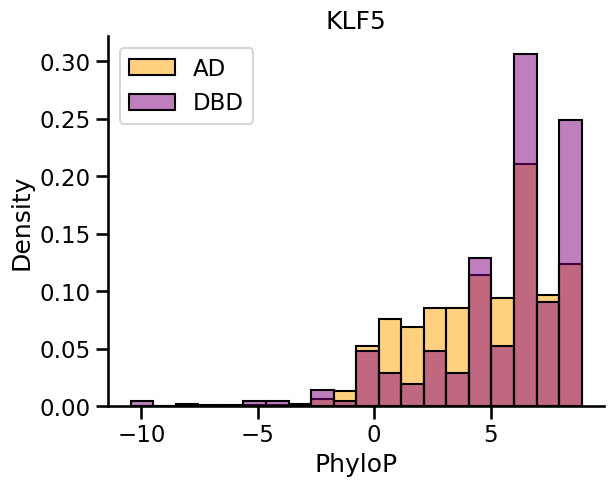

MEF2C


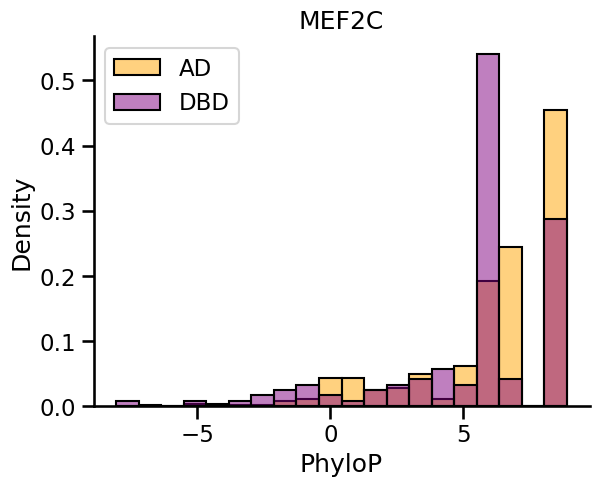

SPIB


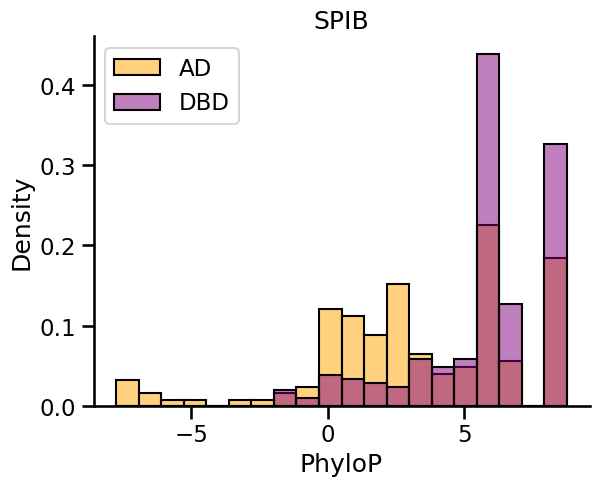

TIGD4


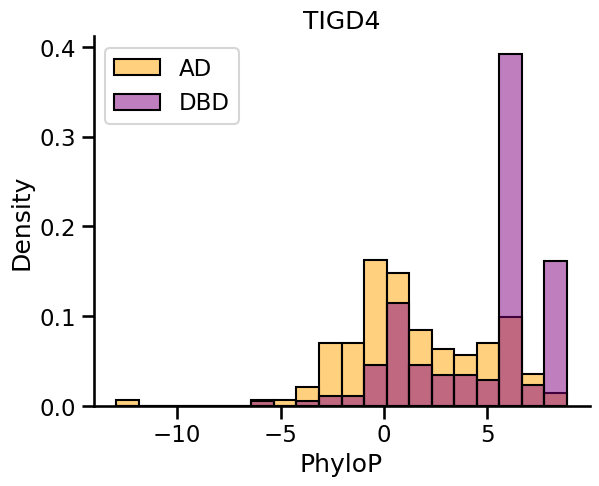

ZBTB48


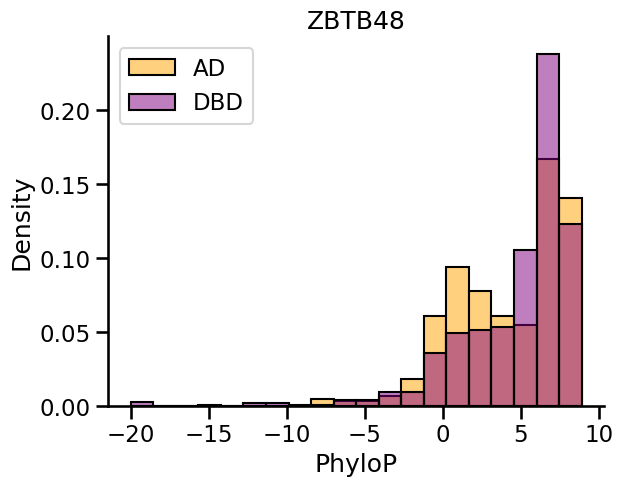

NFATC2 - NFAT1


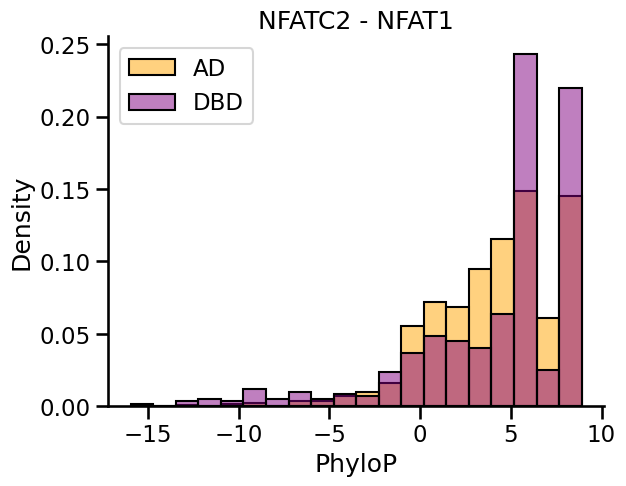

TFAP2B


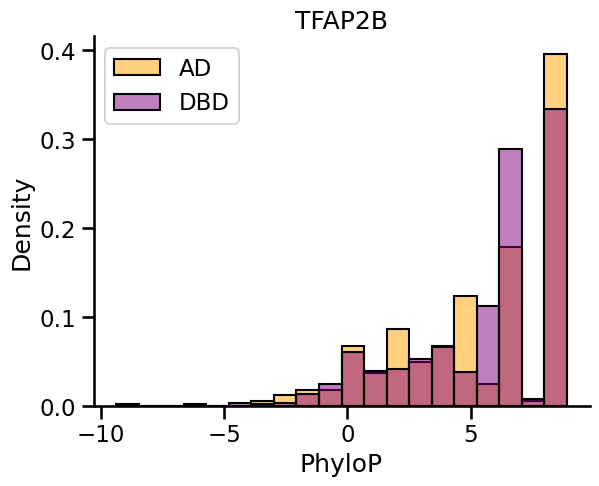

SRBP1 - SREBF1


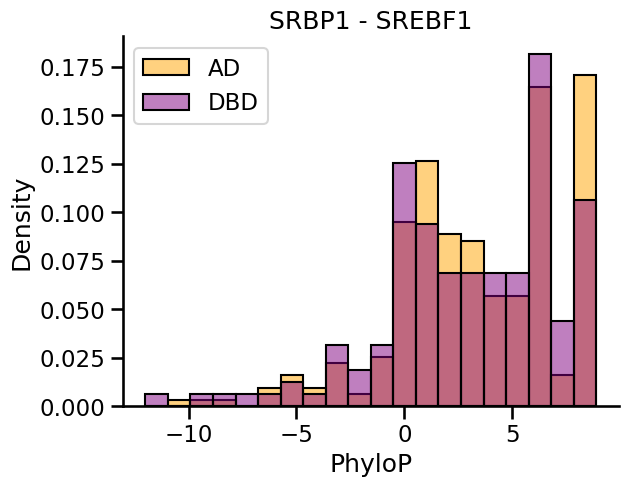

RUNX3


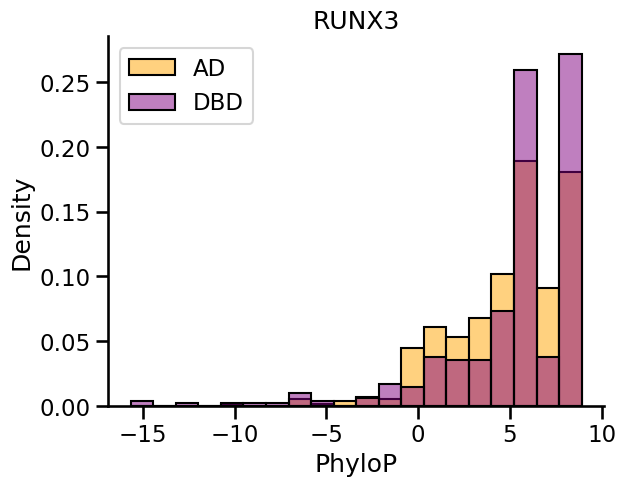

SP100


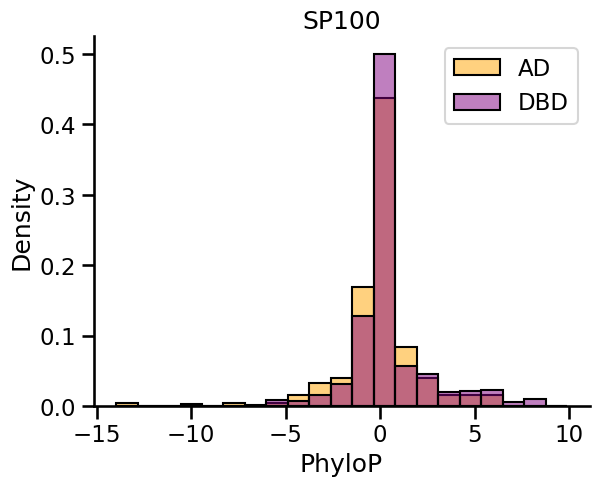

SP3


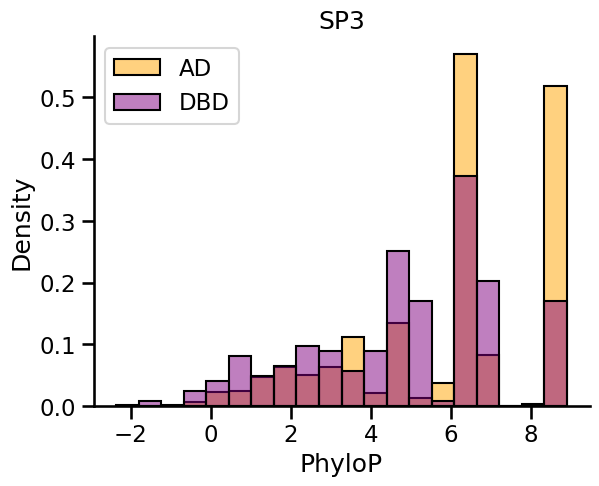

YY2


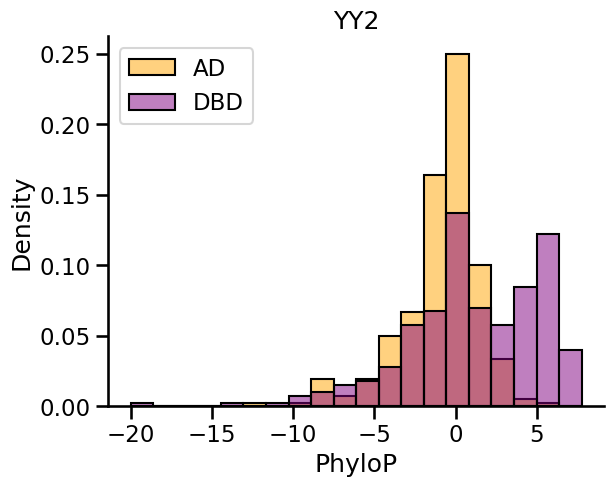

NFKB1


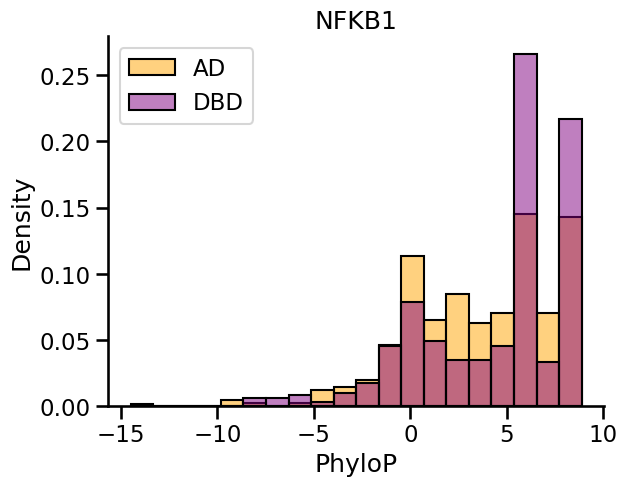

PHF19


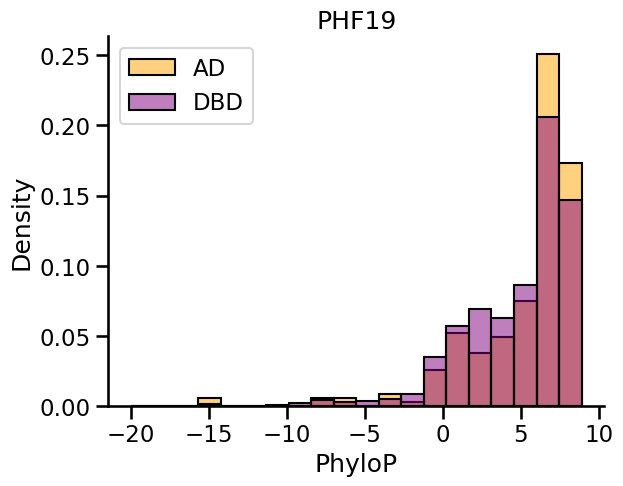

PPARalpha


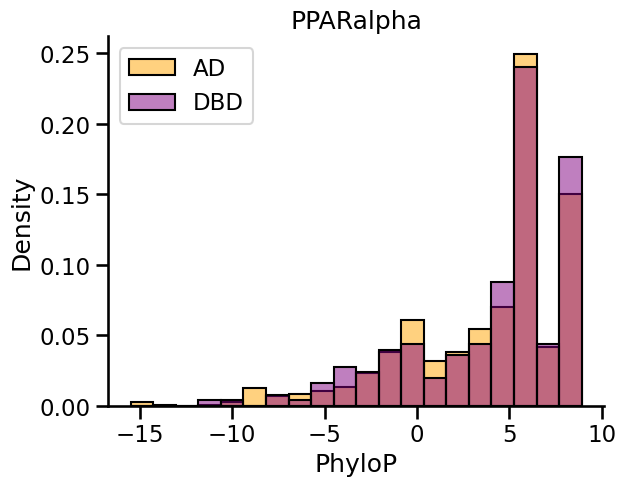

JAZF1


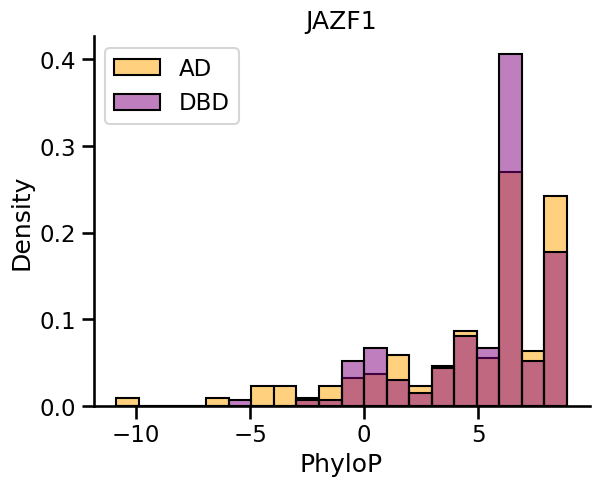

E2F5


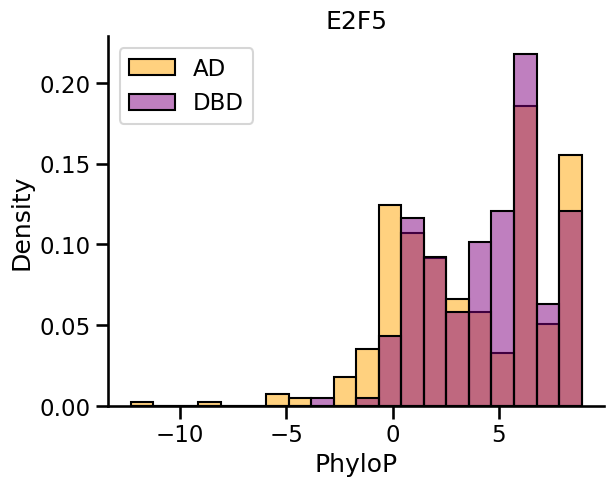

NEUROG2


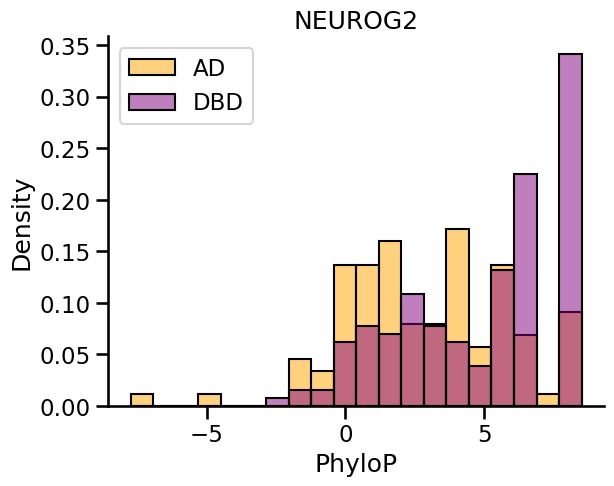

ZXDC


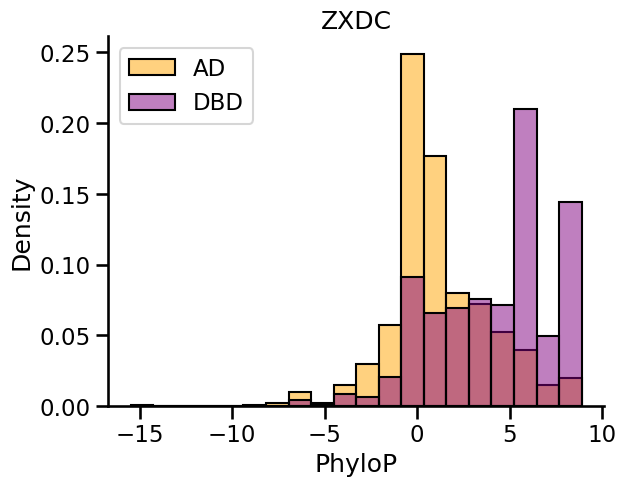

TIGD1


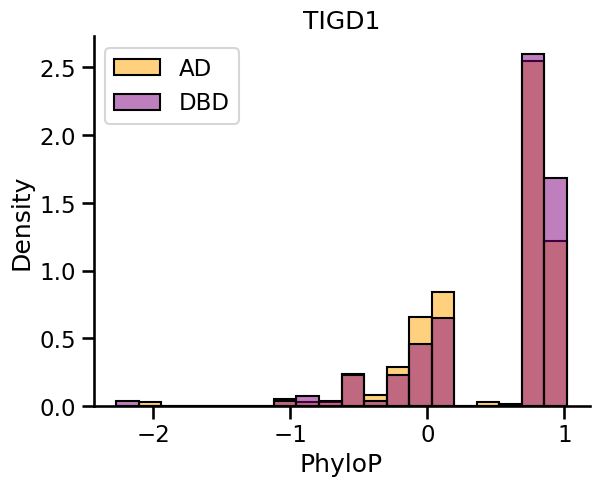

DMRT1


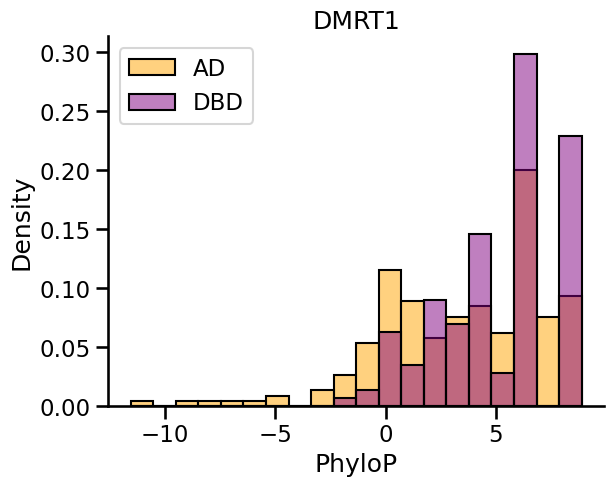

TAL1


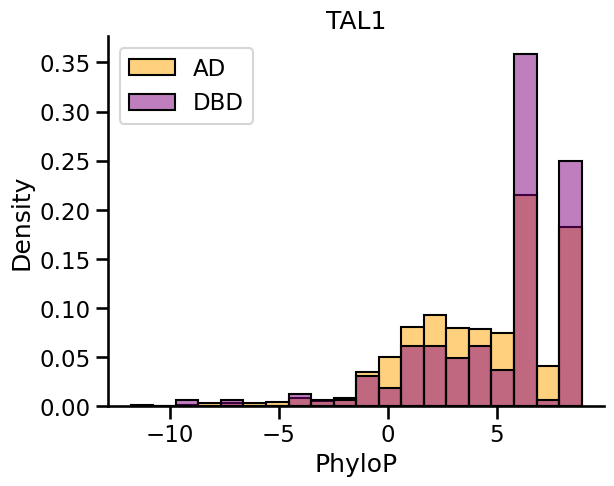

GCM1


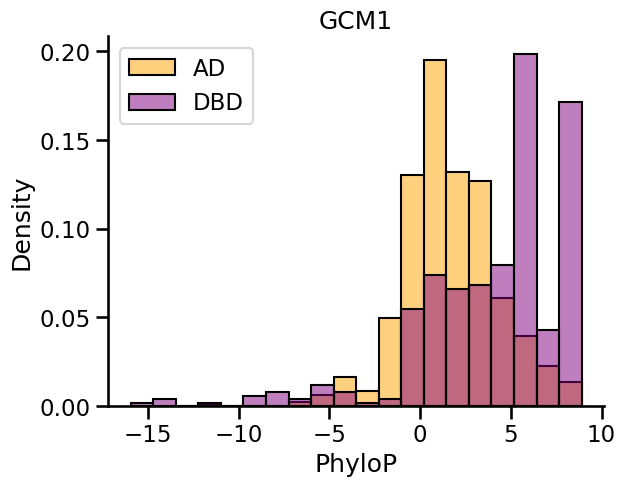

MAFB


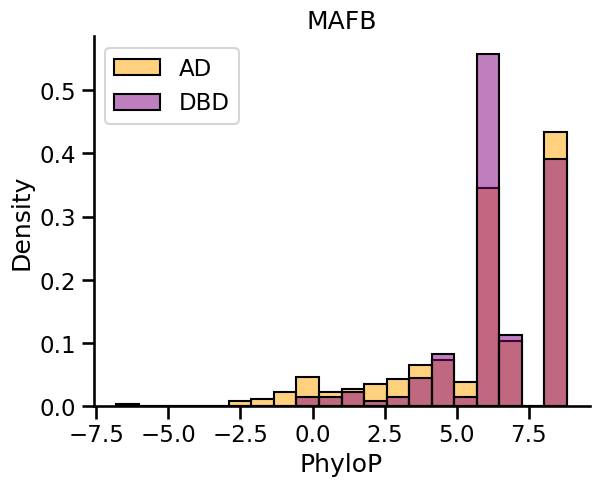

FOG2


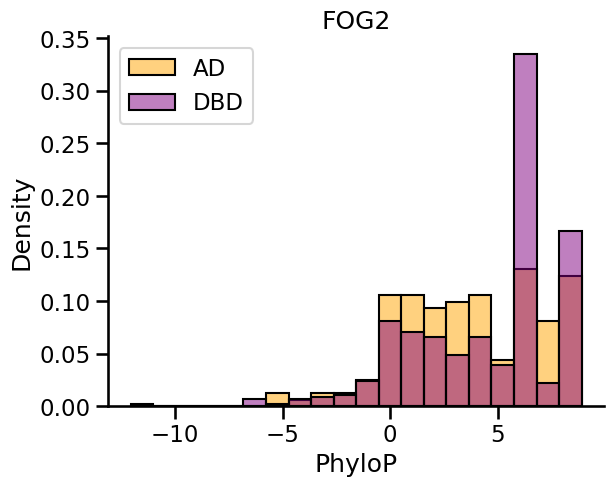

GRHL3


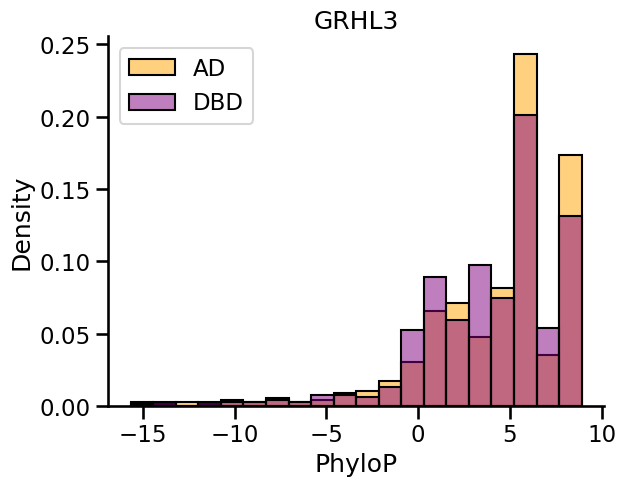

NR5A1


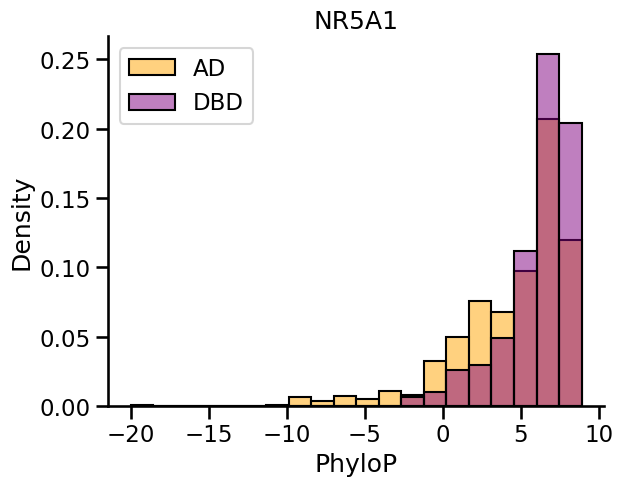

NKX2-2


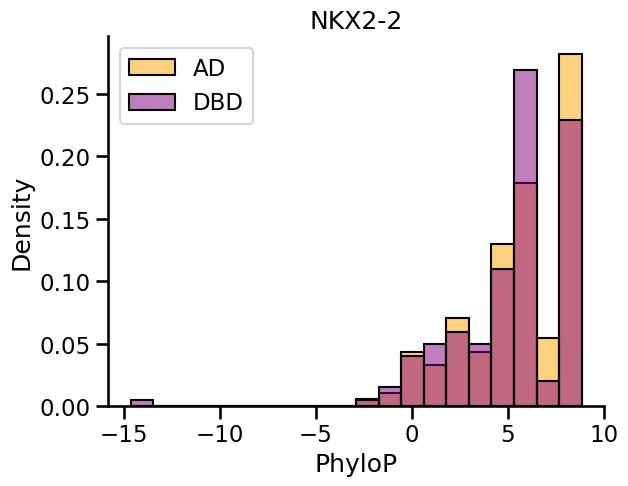

FLI1


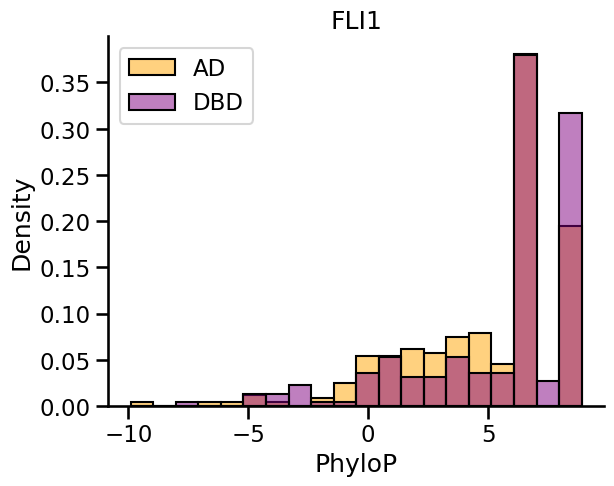

ETS2


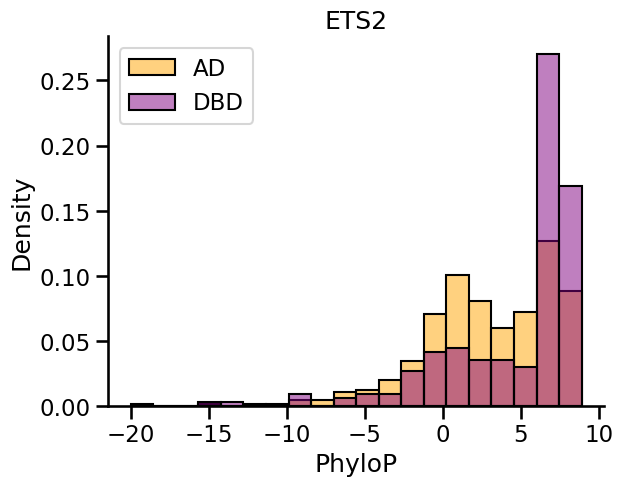

SMAD3


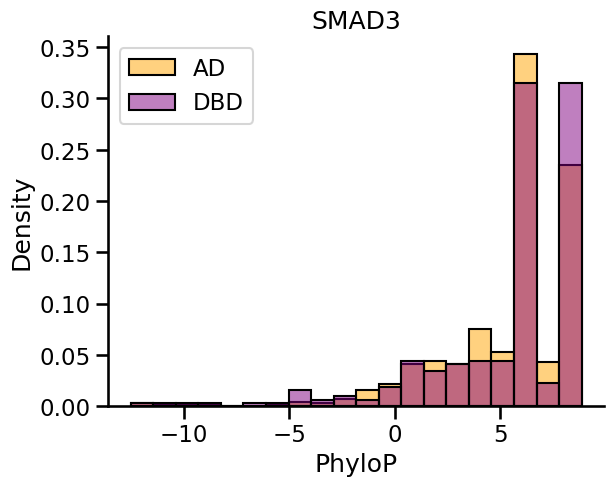

MYT1L


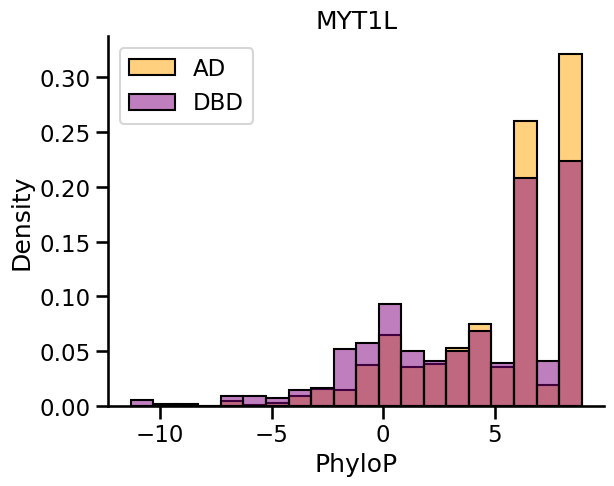

BSX


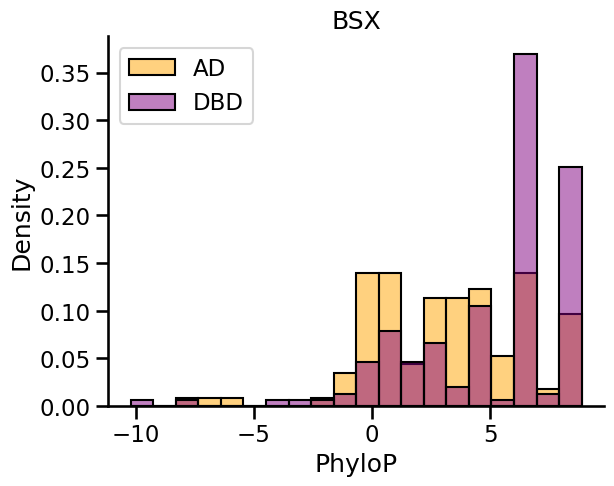

POU4F2


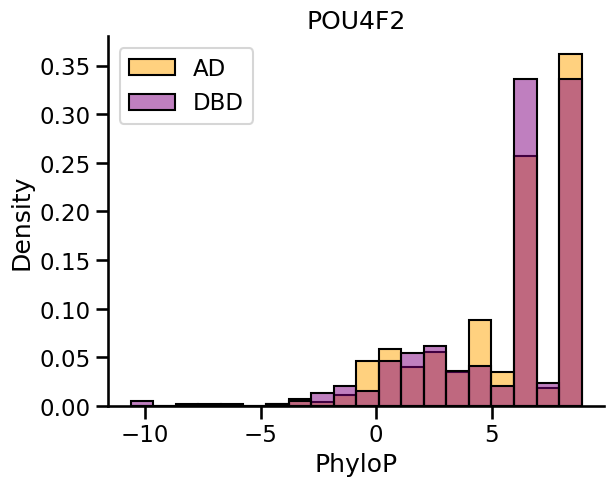

PAX6


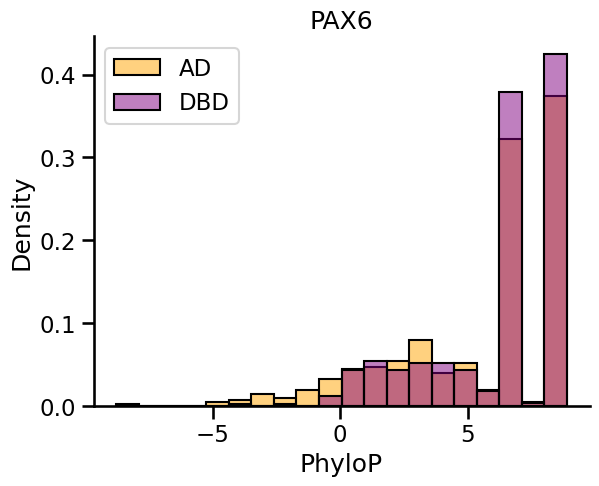

KAT7


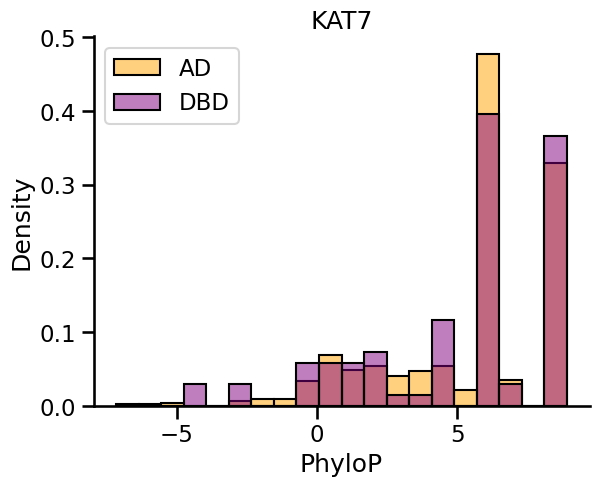

MLXIPL


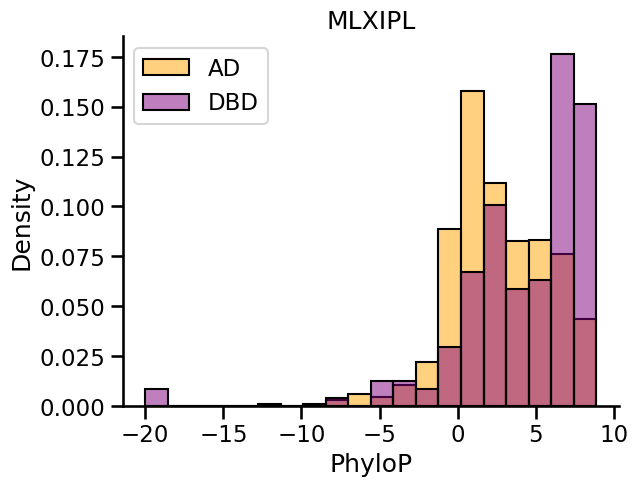

MTERF3


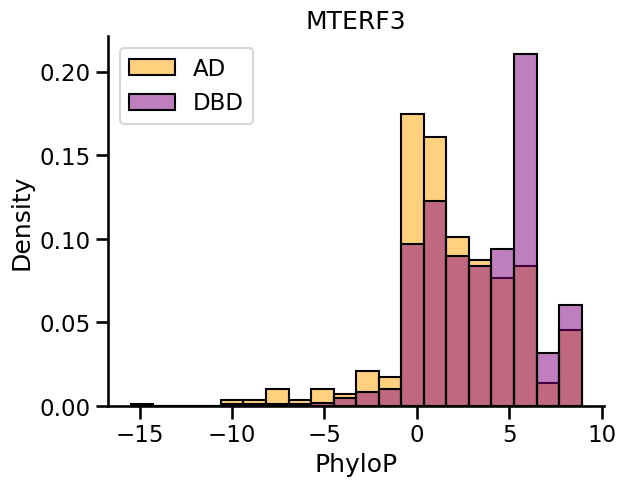

SMAD4


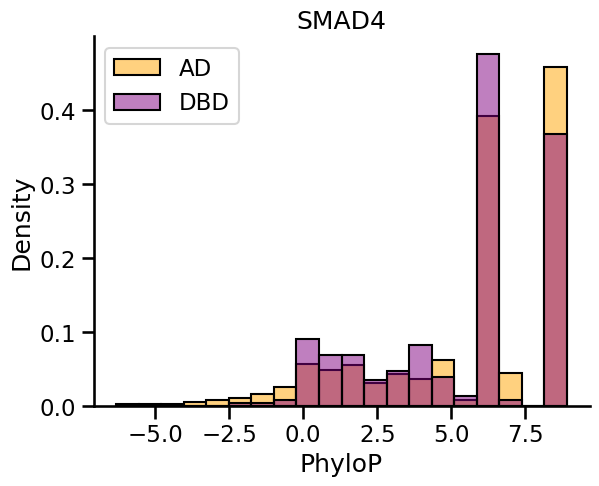

TCF20


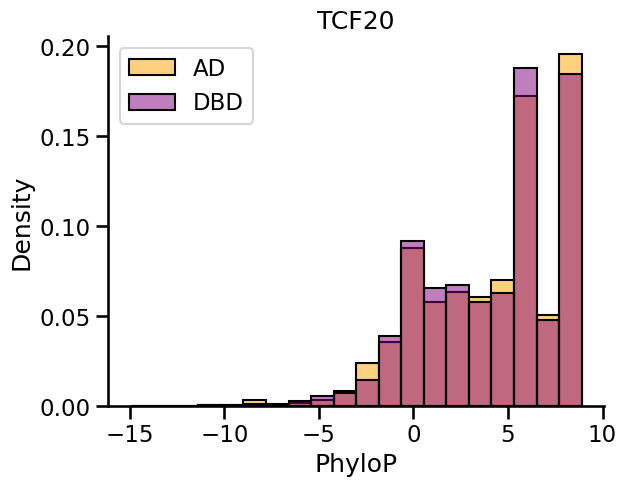

GLMP


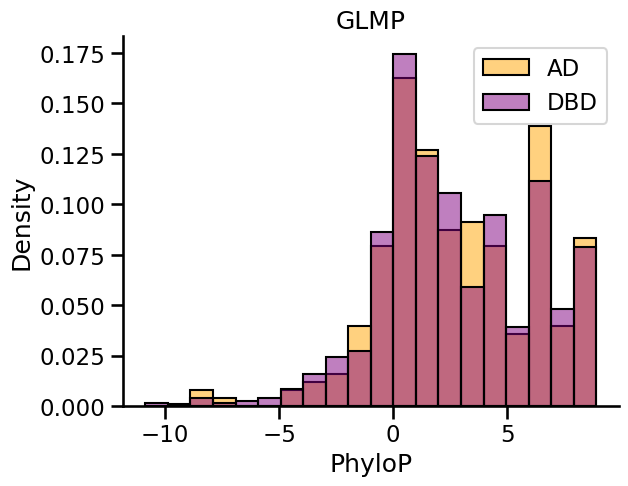

GATA2


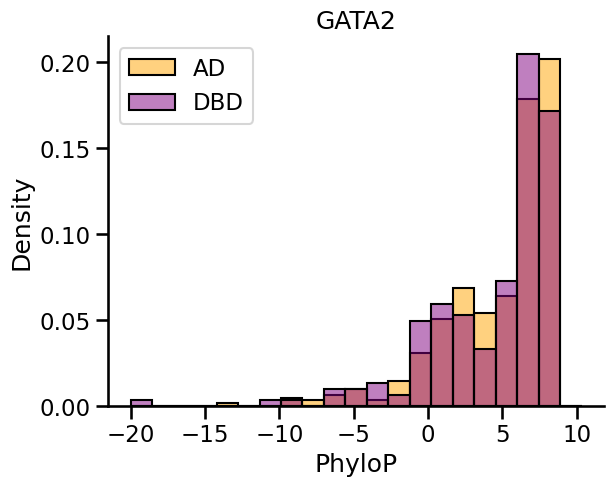

HOXD13


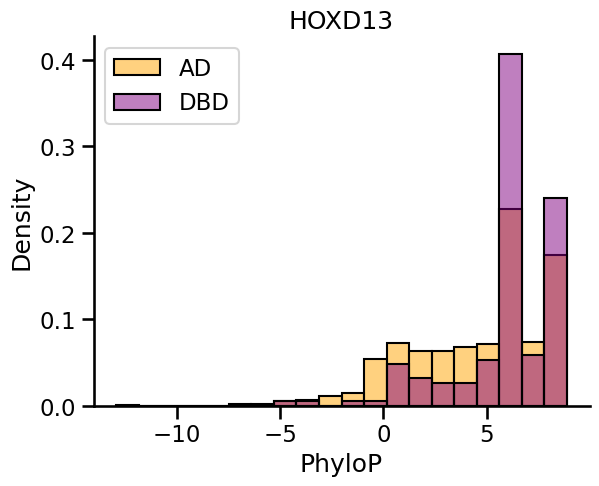

PHOX2A


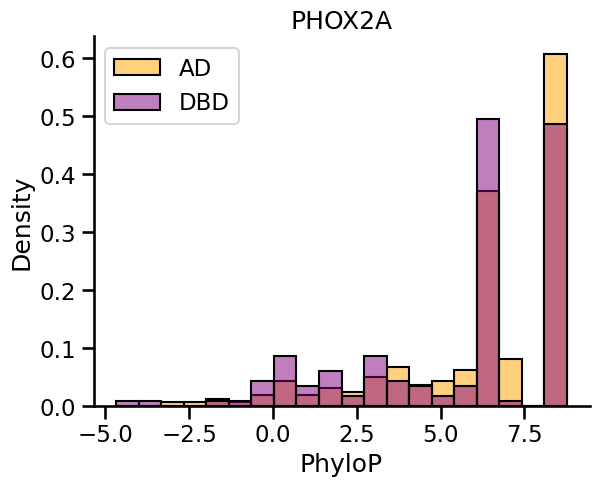

KLF7


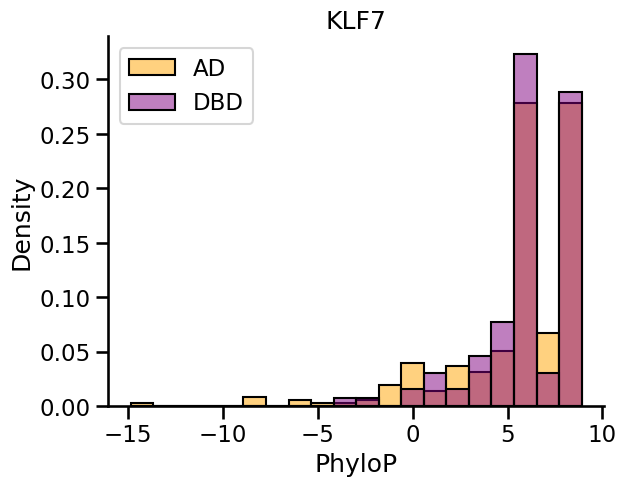

CREB3L4


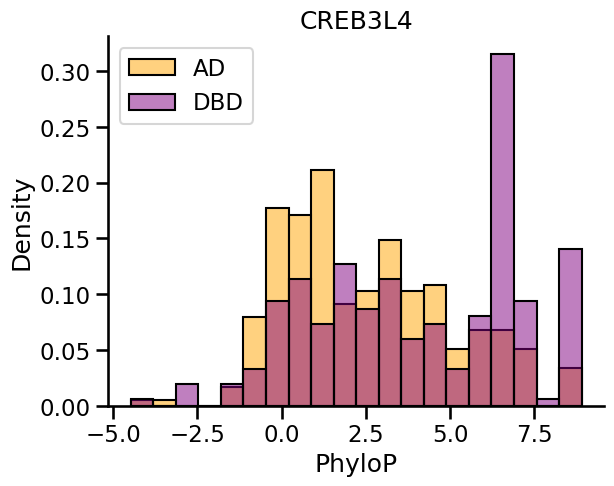

PITX1


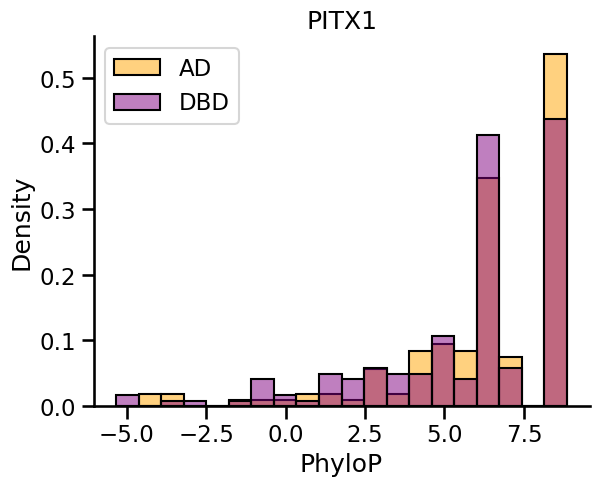

NR6A1


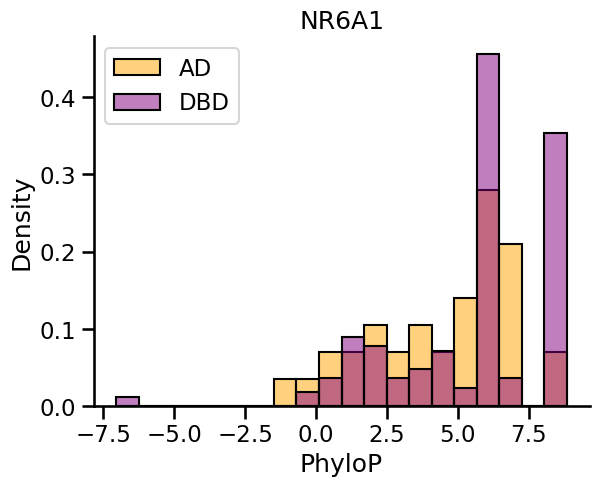

NR3C1 - GlucocorticoidReceptor


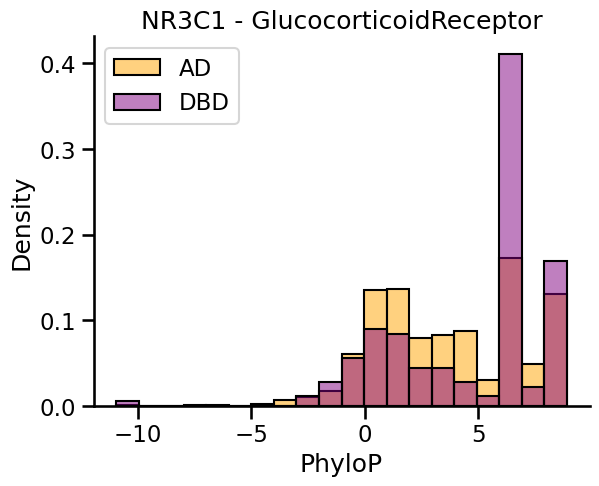

MYF6 - MYF6-MRF4


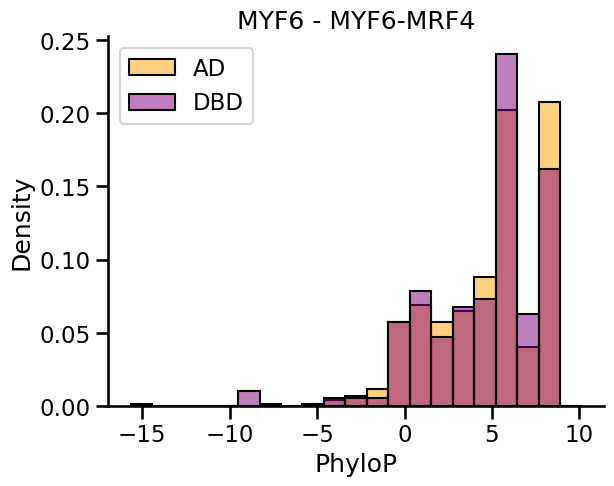

ESRRG


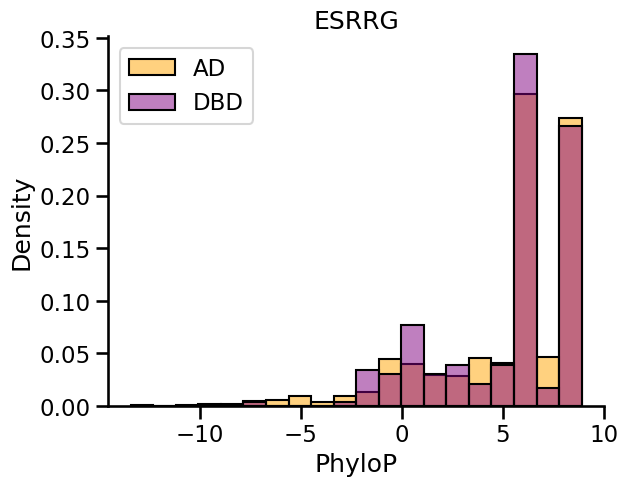

XBP1-TREB5


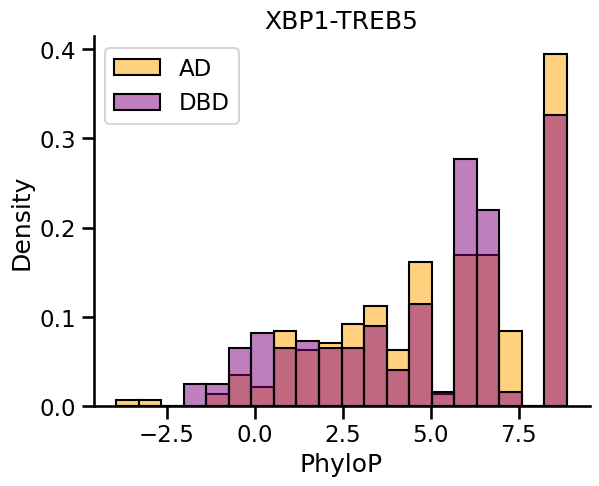

POU2F2 - Oct2


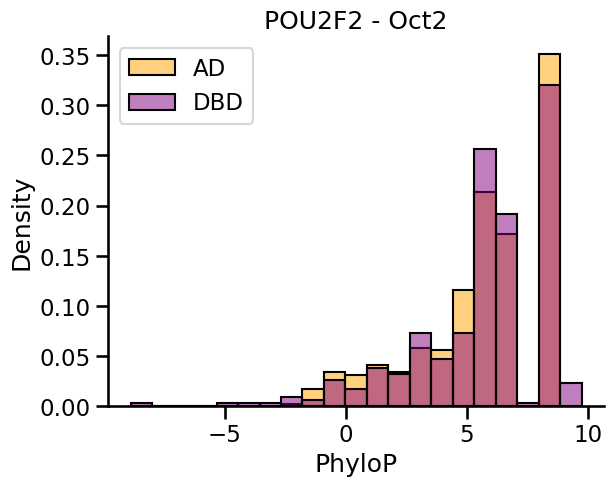

LHX2


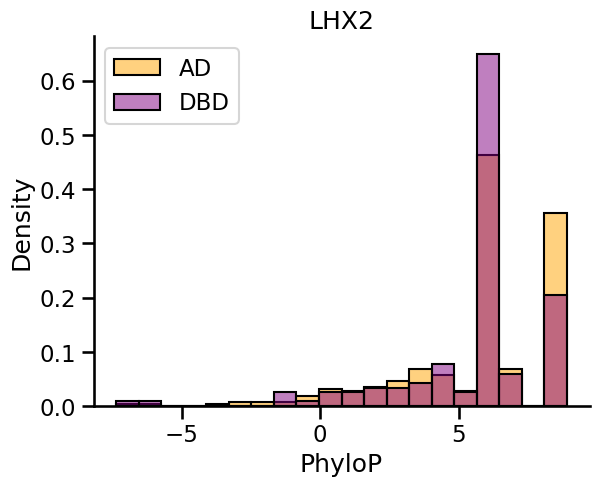

ETV1 - ETV1-ER81


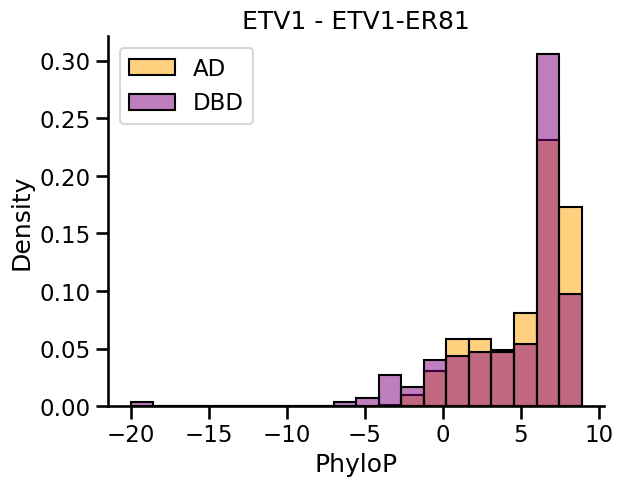

GATA3


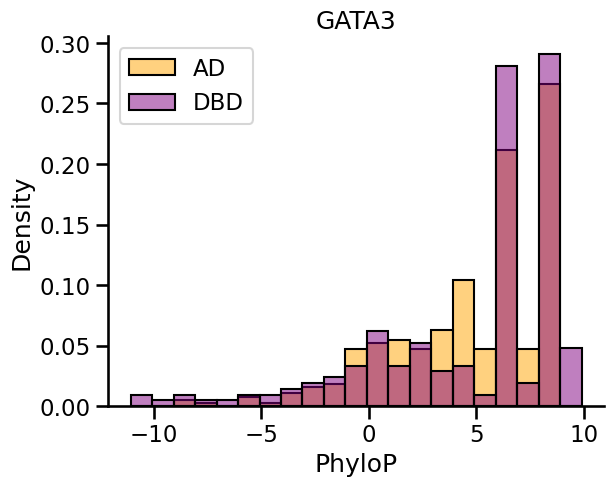

ELF5


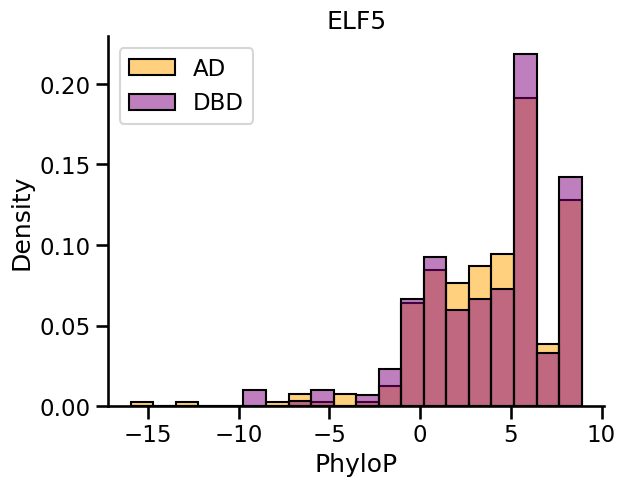

NCOA2


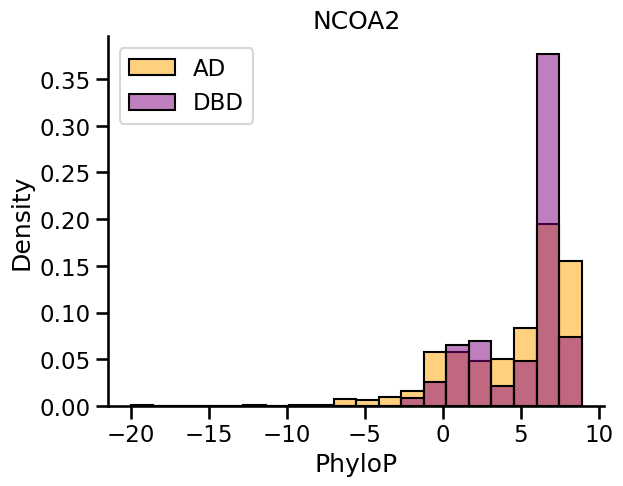

CREB3L3


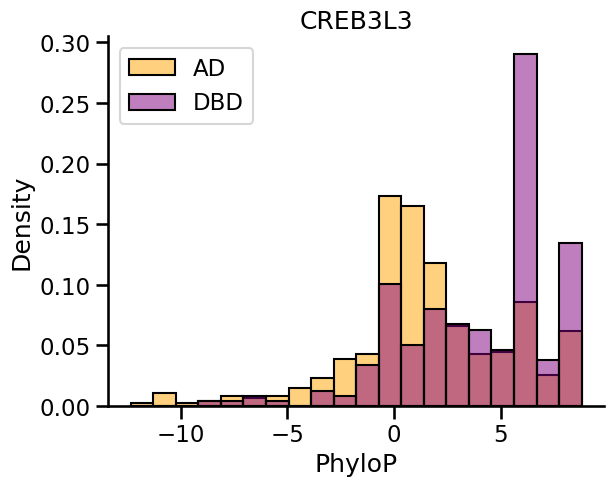

ELF4


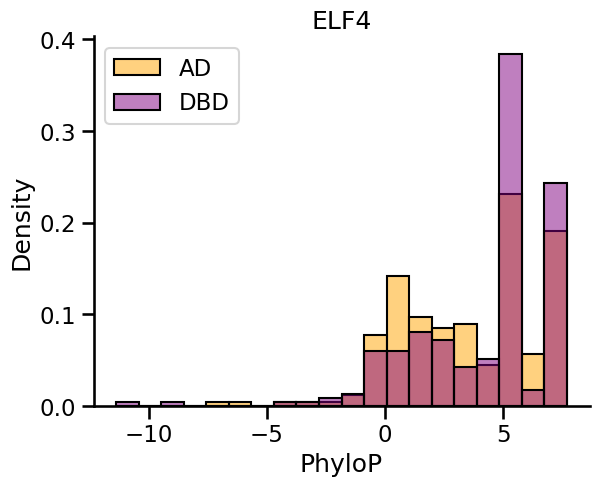

IRF1


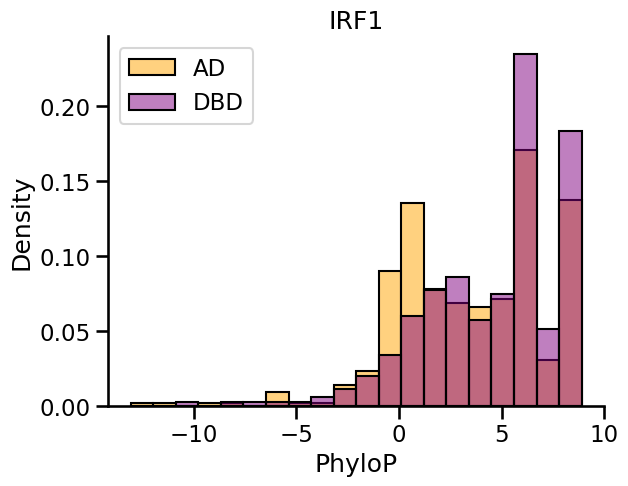

HOXB2


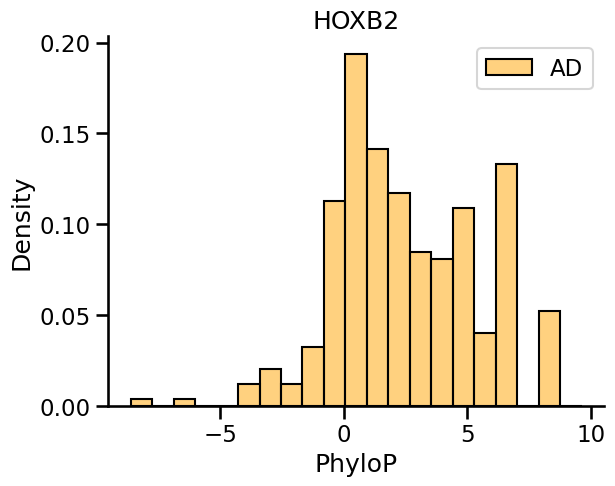

SMAD5


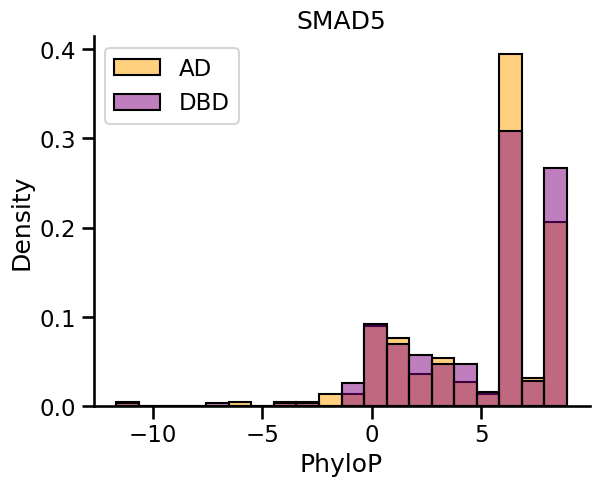

ZN777


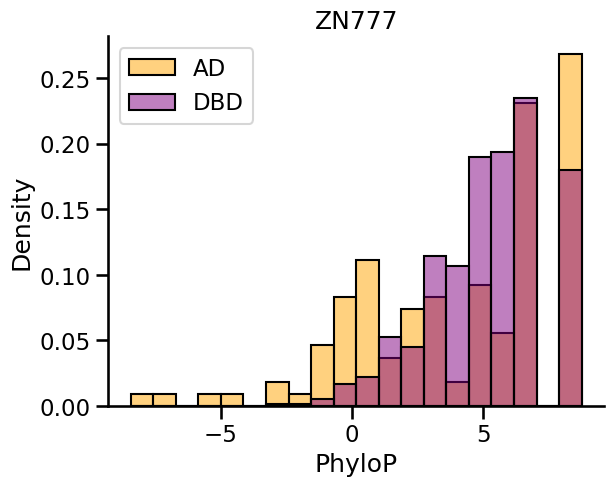

GATA6


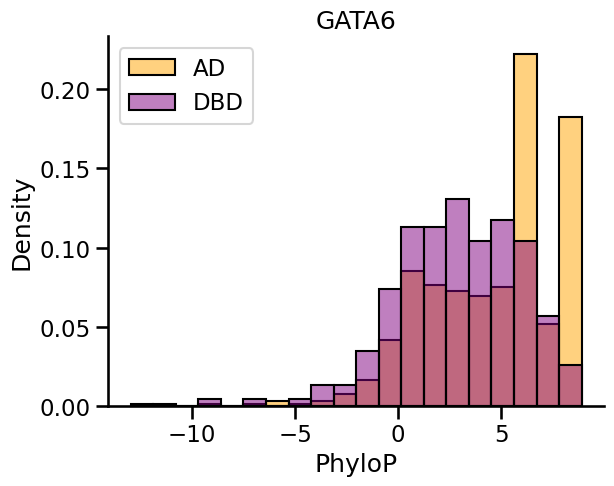

IRF3


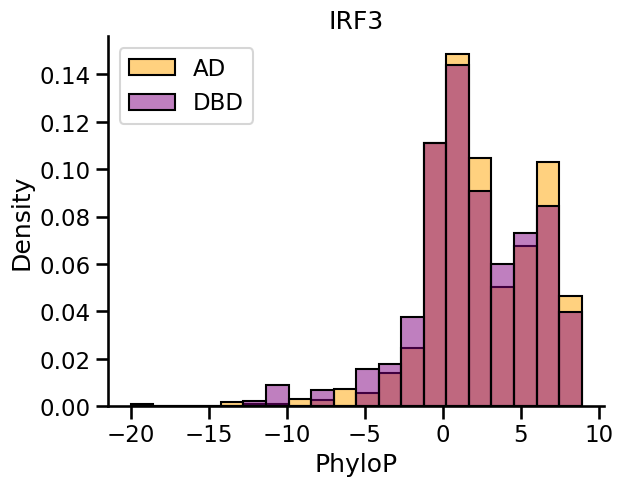

NFIA


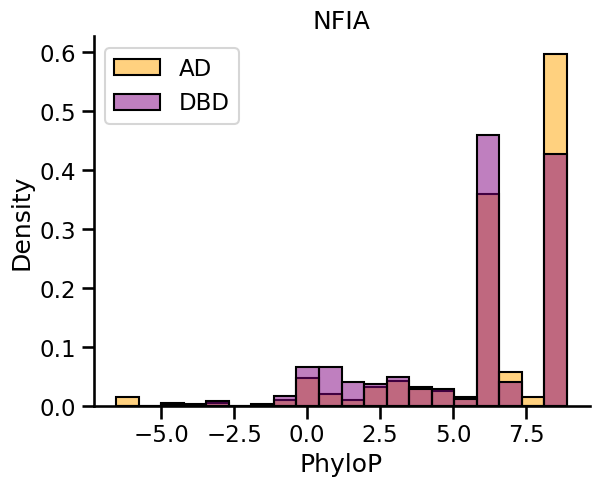

TFDP1


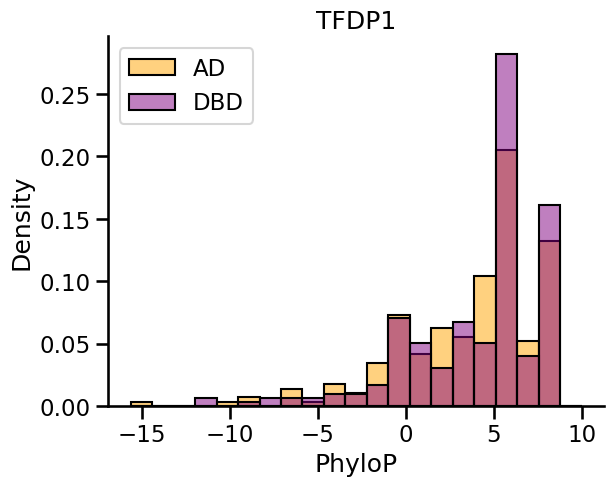

TBPL2


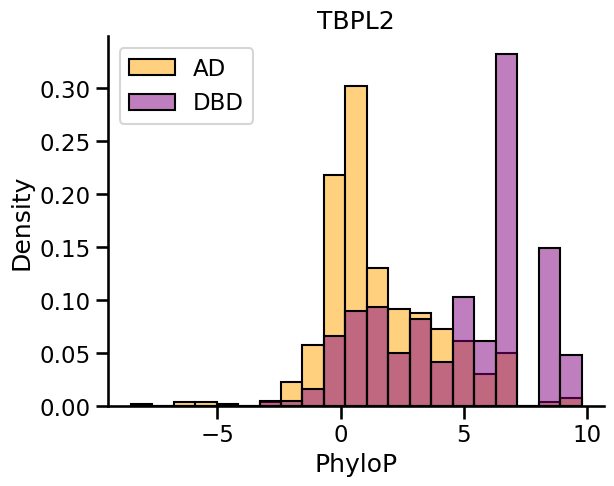

PLSCR1


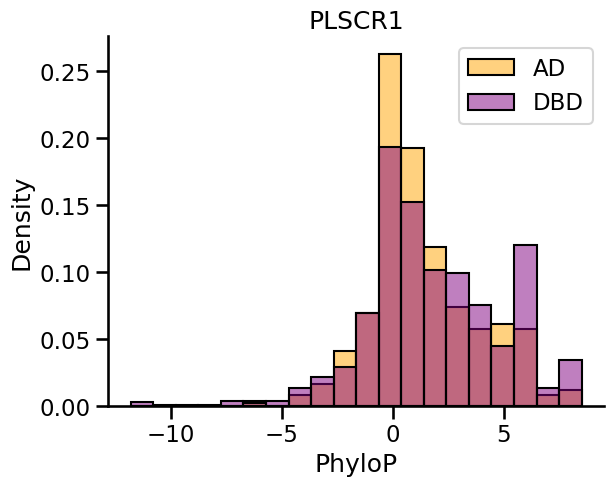

SOX9


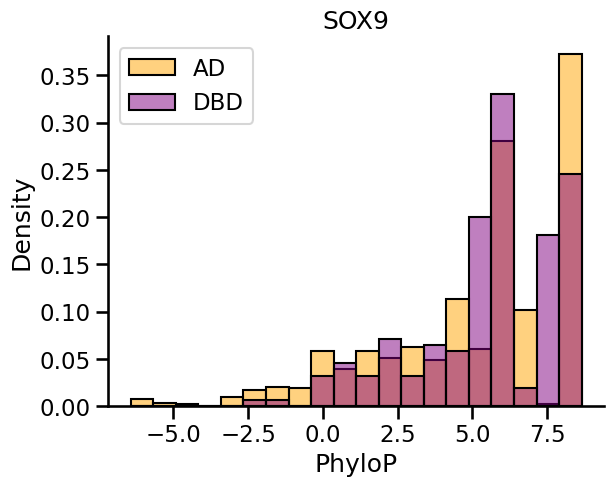

TBXT


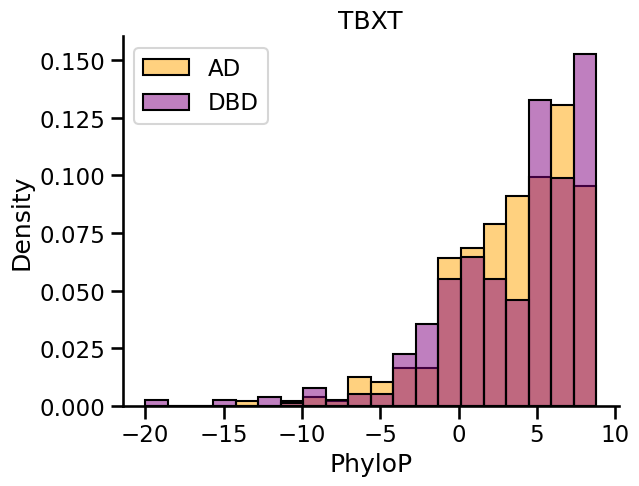

HOXA7


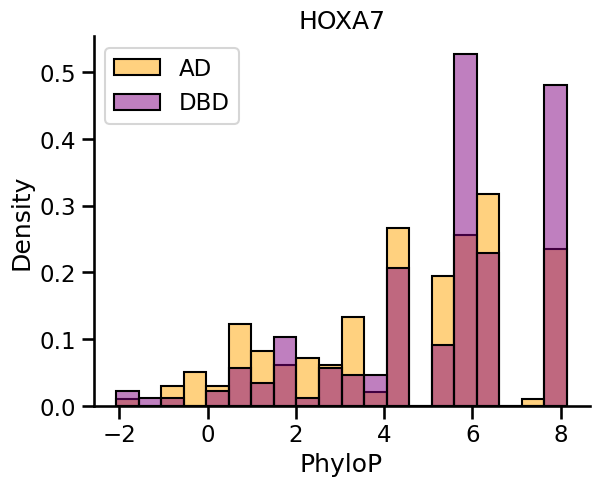

KLF6


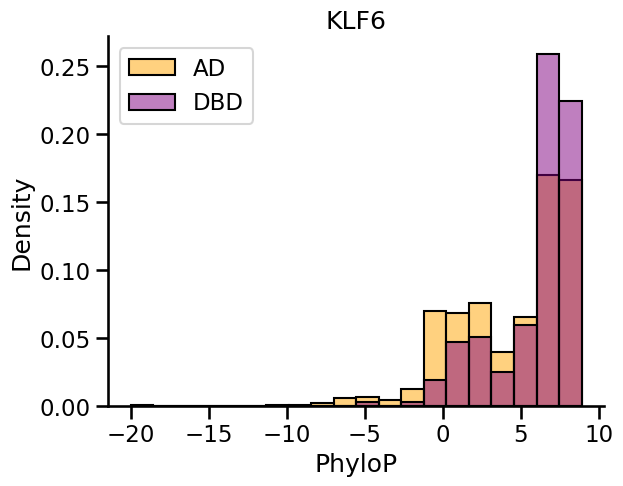

EGR1


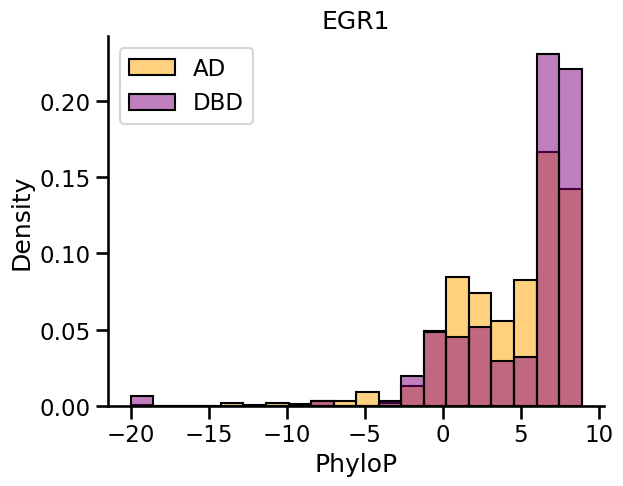

ONECUT1


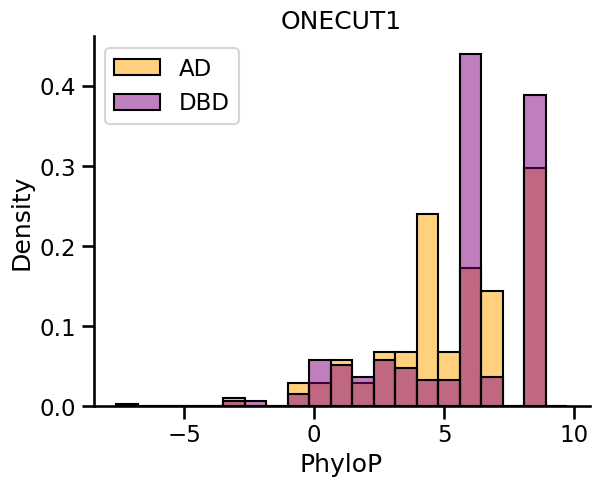

HIVEP3


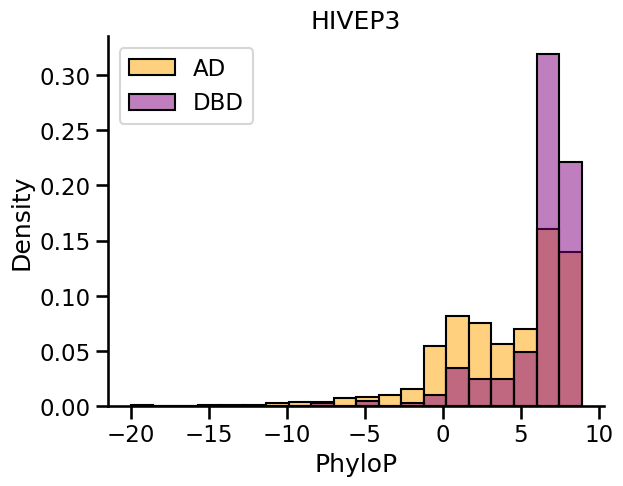

TFE3


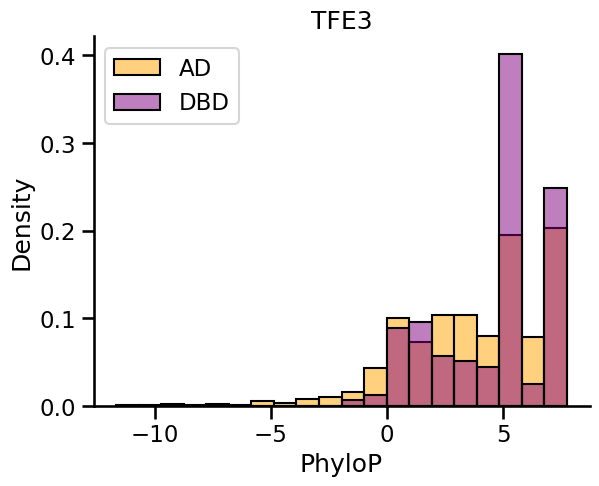

HHEX


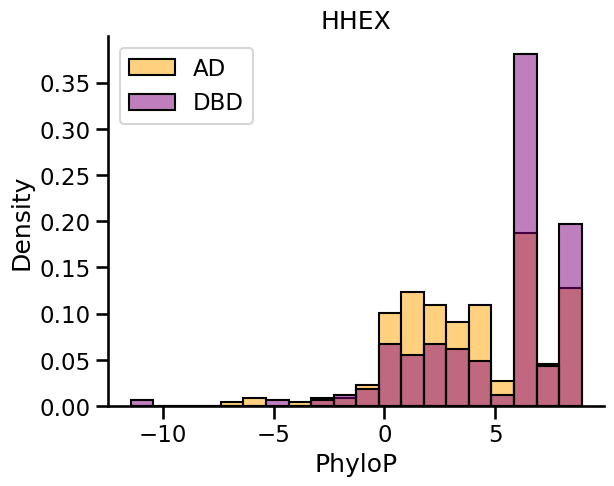

NPAS3


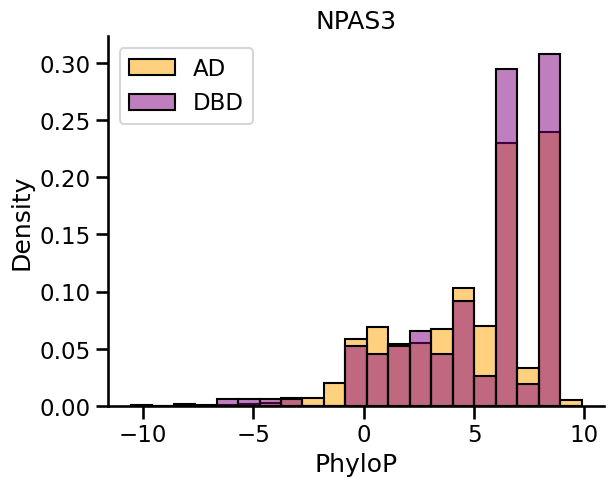

HOXA2


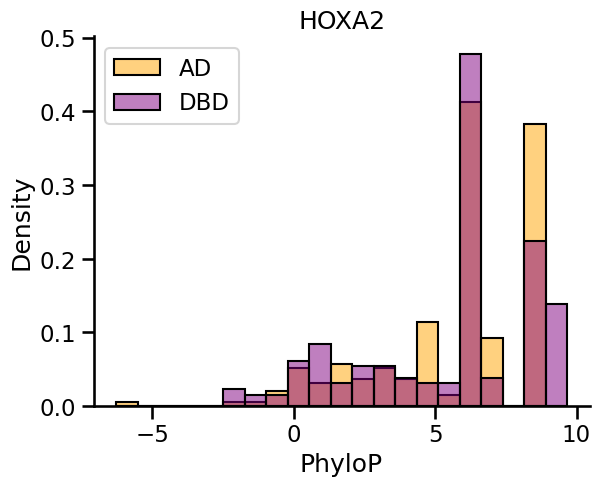

SRF


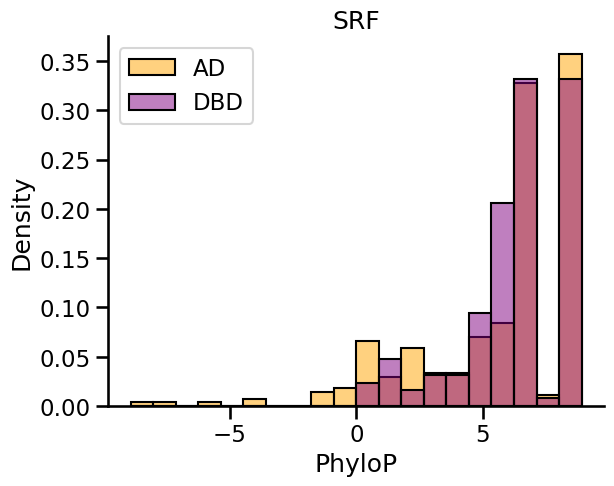

FOXI1


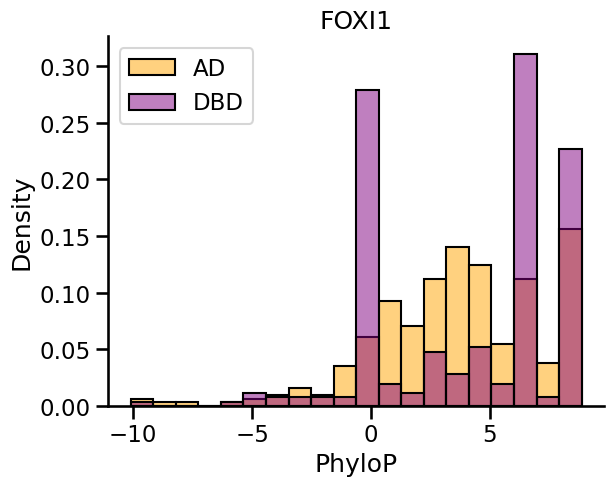

HOXB6


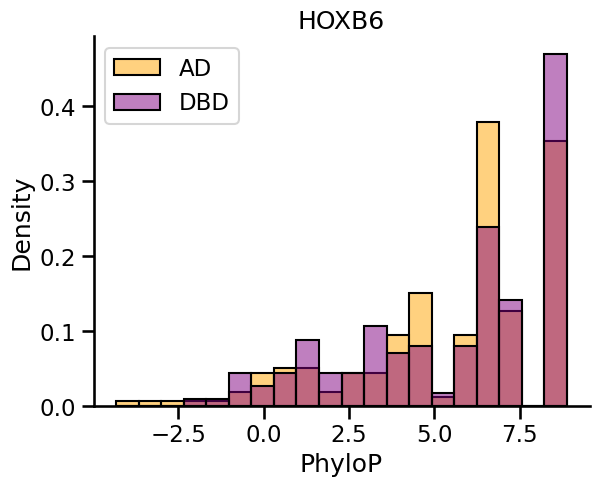

OVOL2


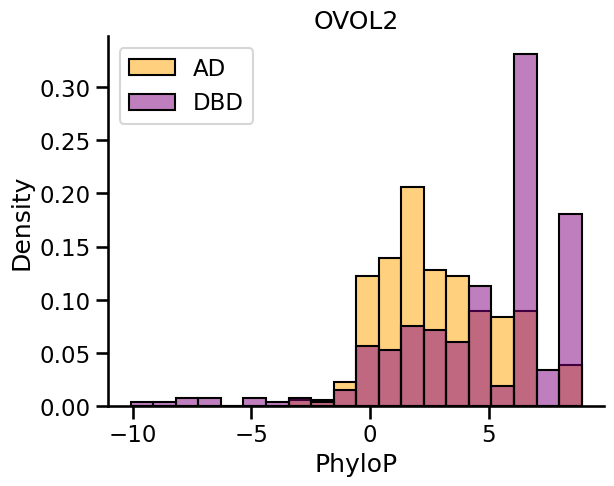

LHX1


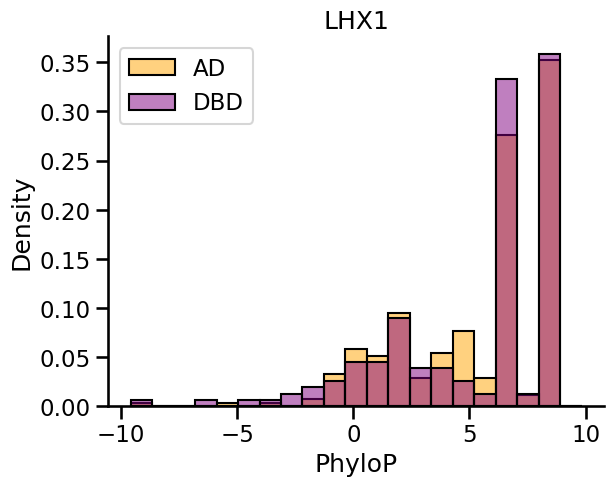

ZNF532


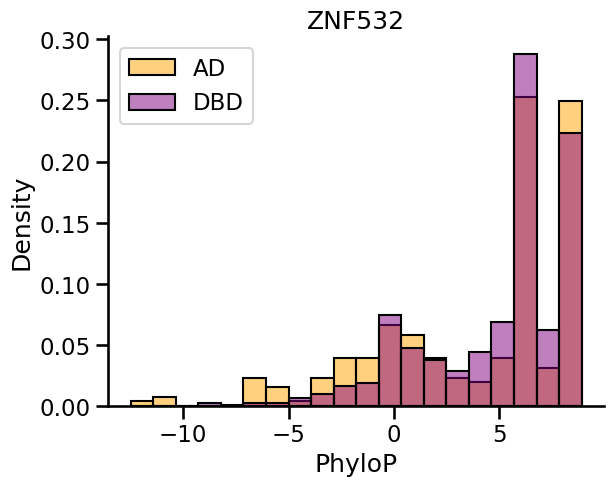

FOXF2


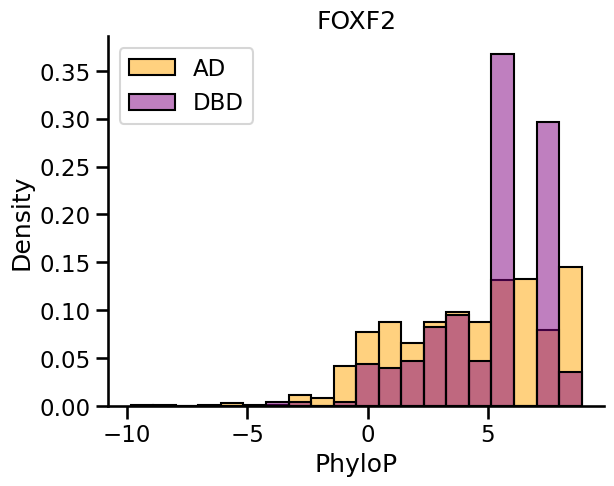

MYOG


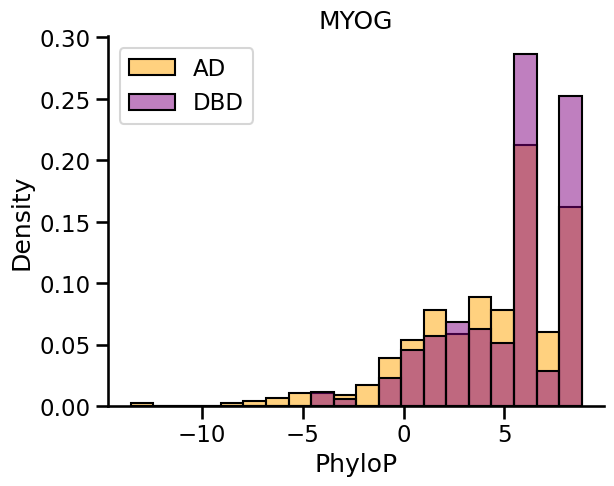

ZNF16


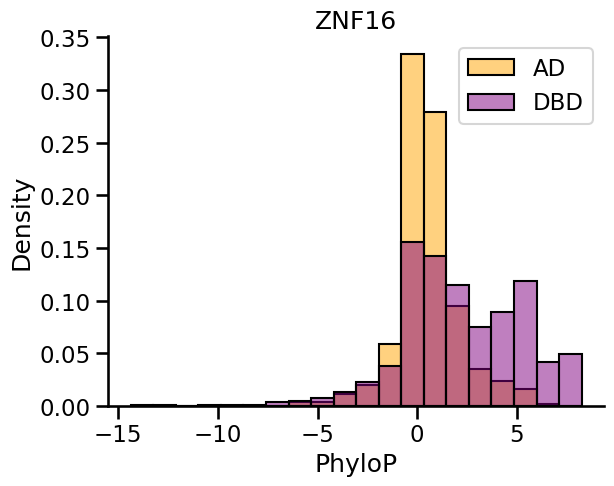

PLAGL2


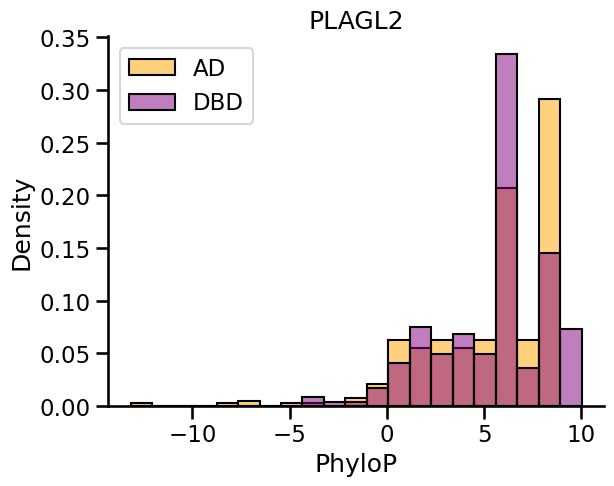

NKX6-1


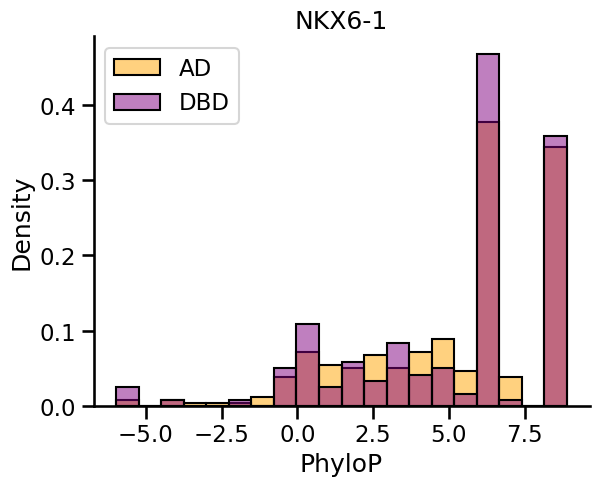

HSF5


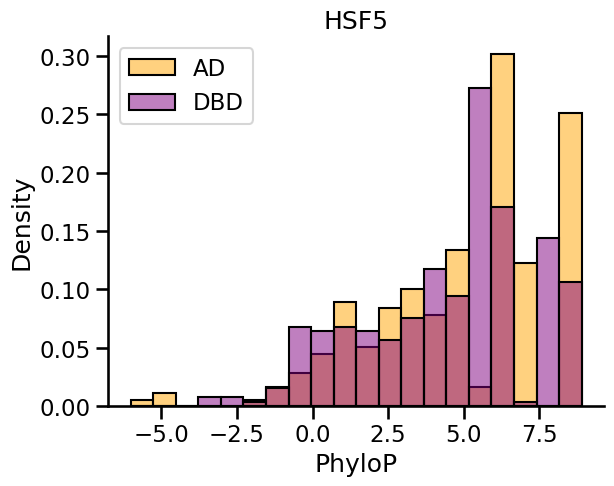

RARG


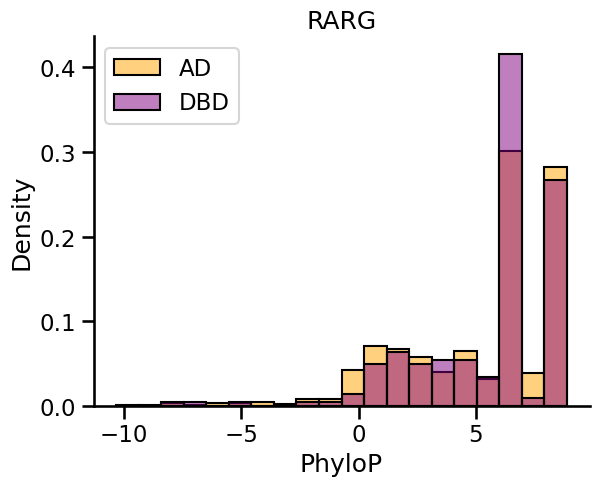

CREB1


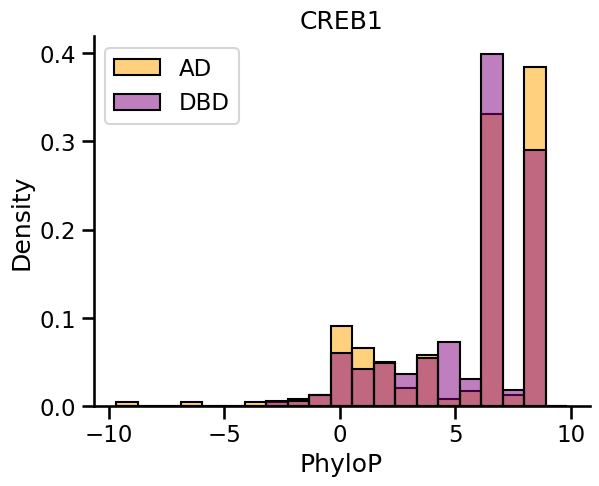

C2D1A


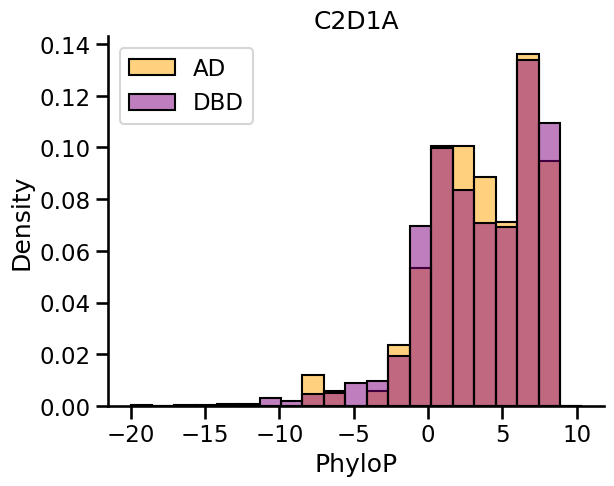

NEUROG3


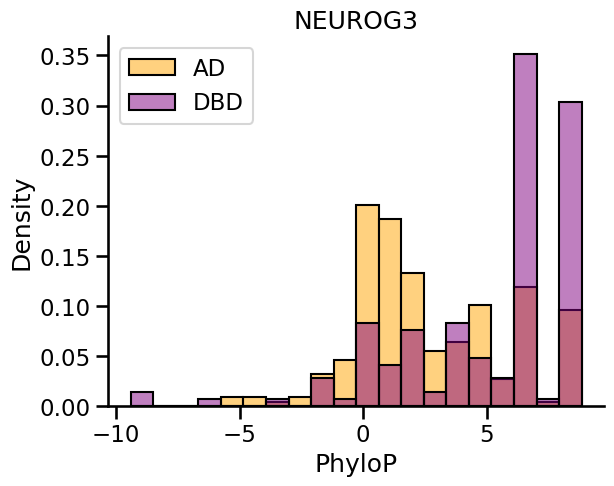

ZIC2


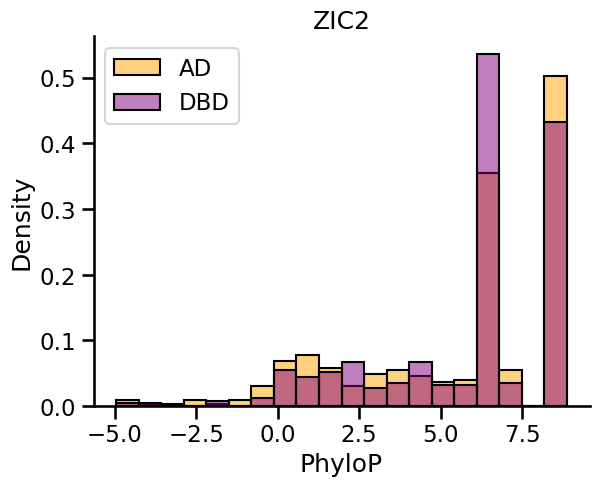

KMT2A - KMT2A-ALL1-HRX - KMT2A-MLL1-CXXC7


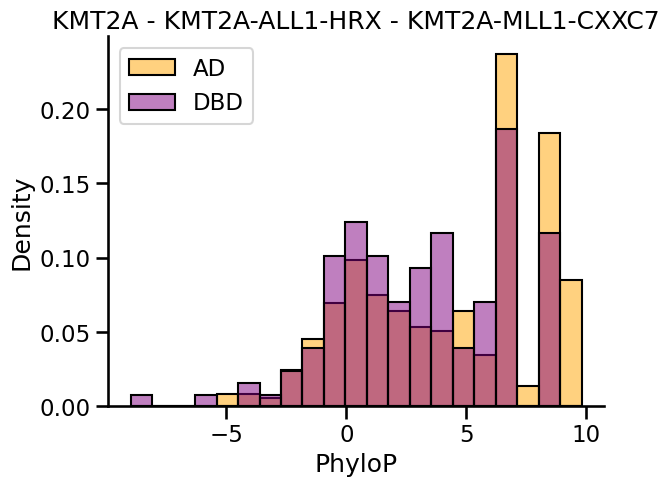

CAMTA2


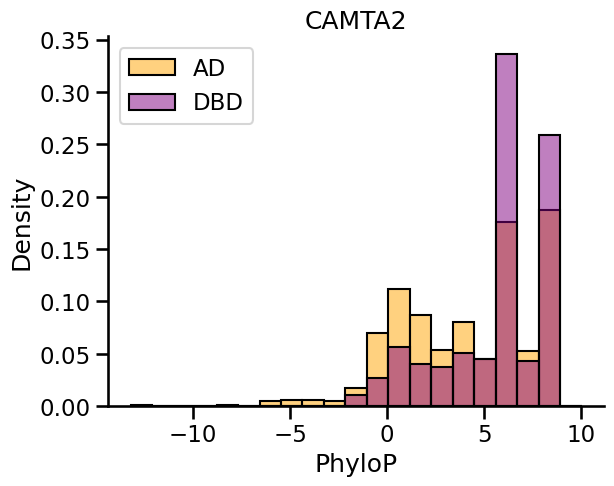

NFATC1


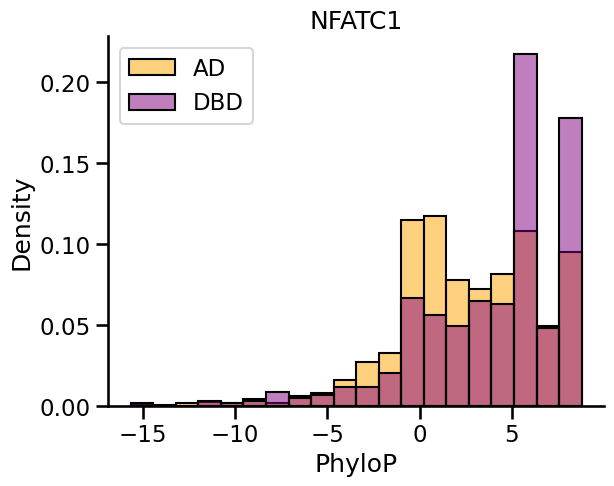

SIX4


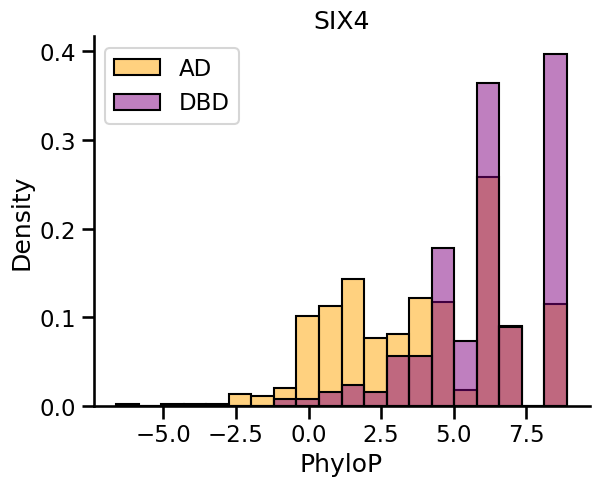

Hif1a - HIF1A - HIF1A


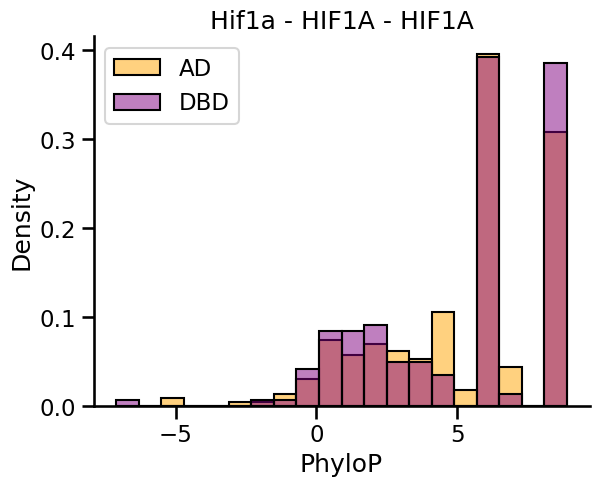

GATA5


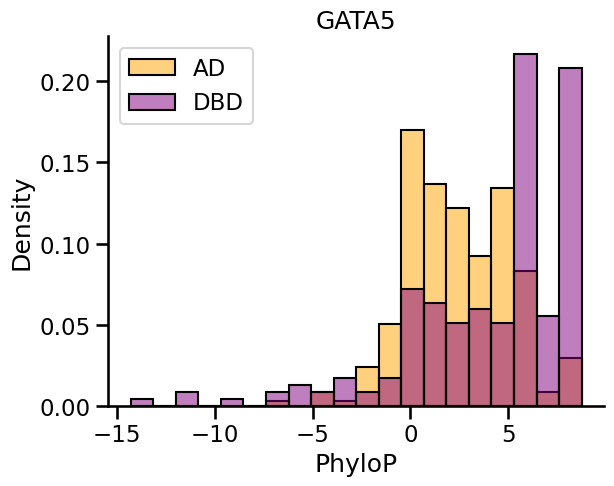

TCF7L1


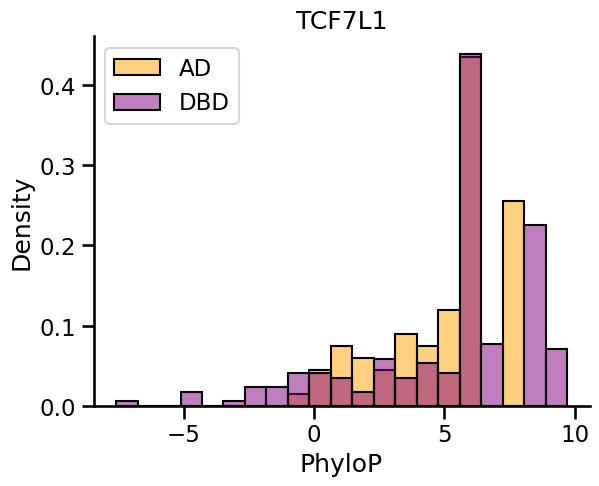

ATF6alpha - ATF6 - ATF6 - ATF6A


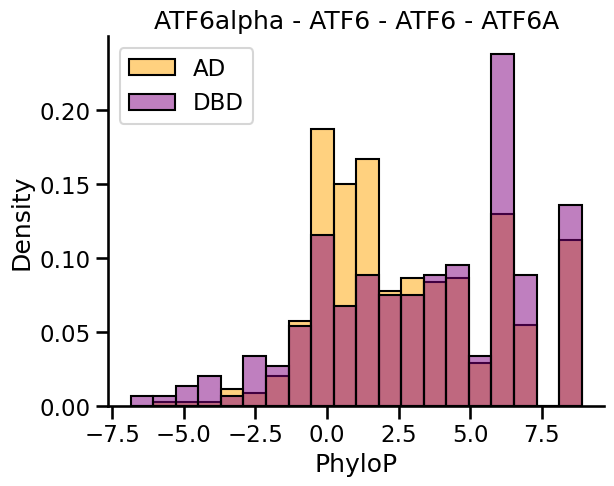

NR1D1


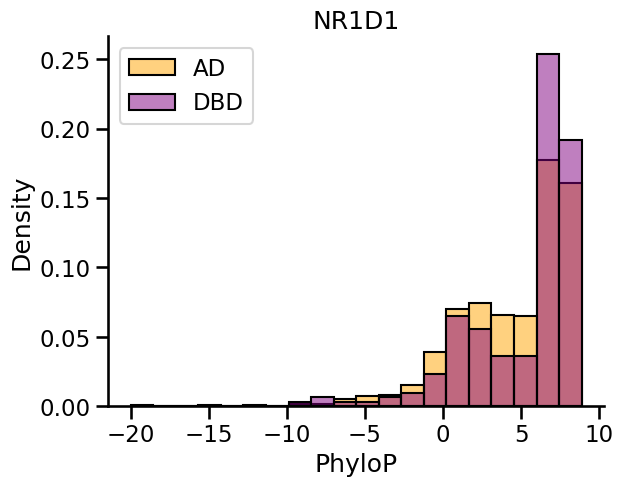

NKX2-5


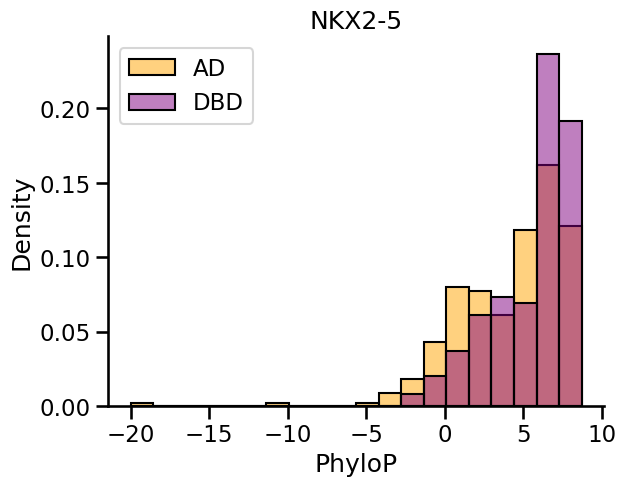

TP63


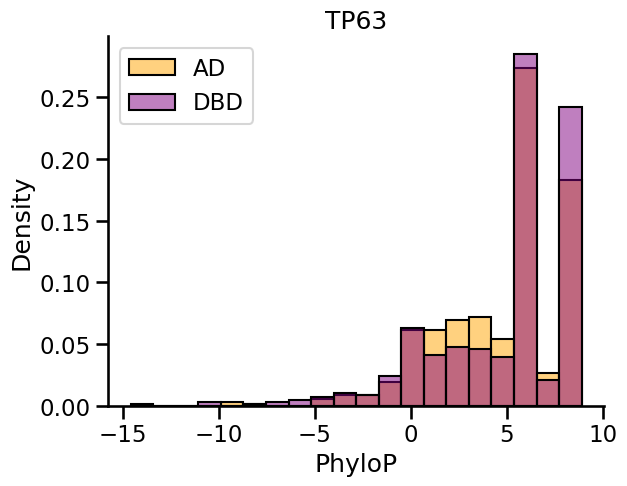

HNF4A


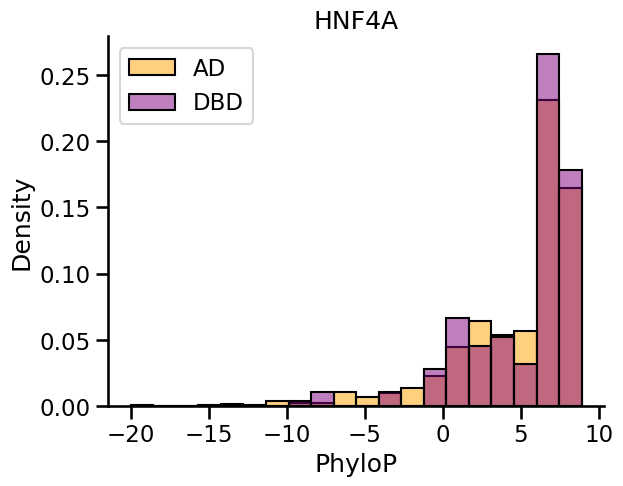

TBX4


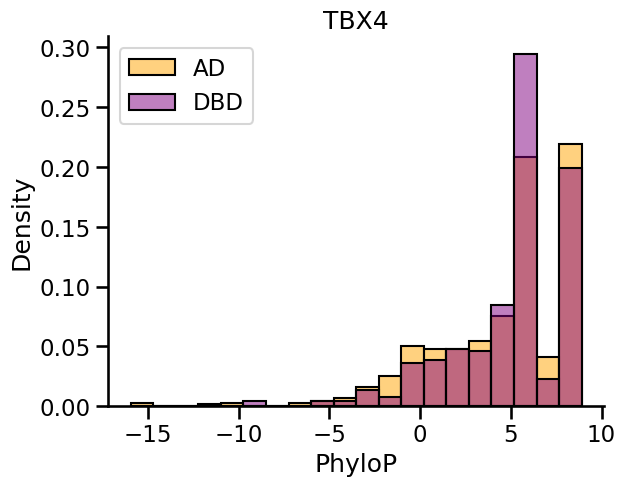

AKAP8


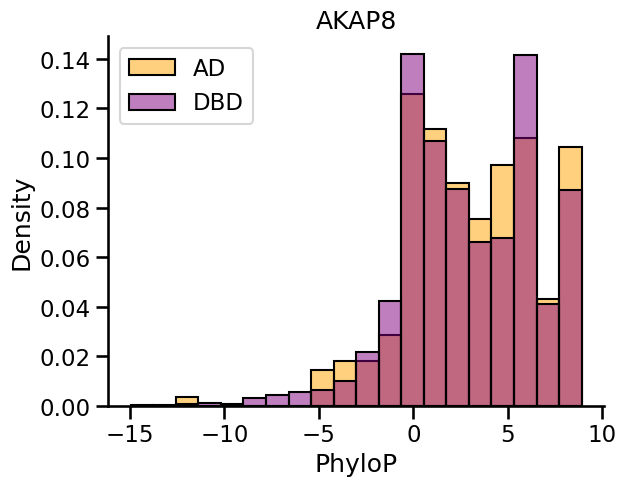

ATF3


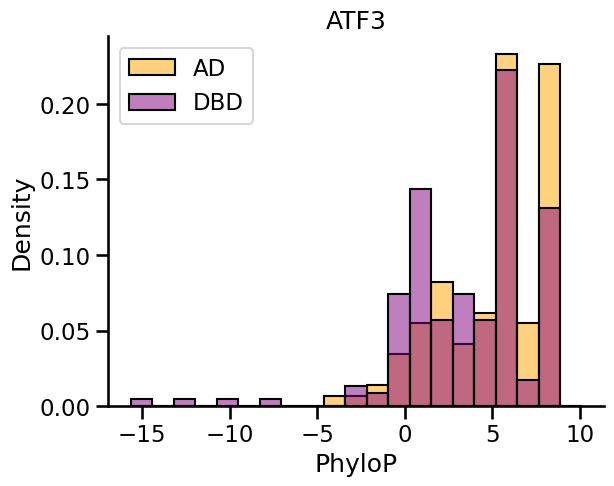

ZXDA


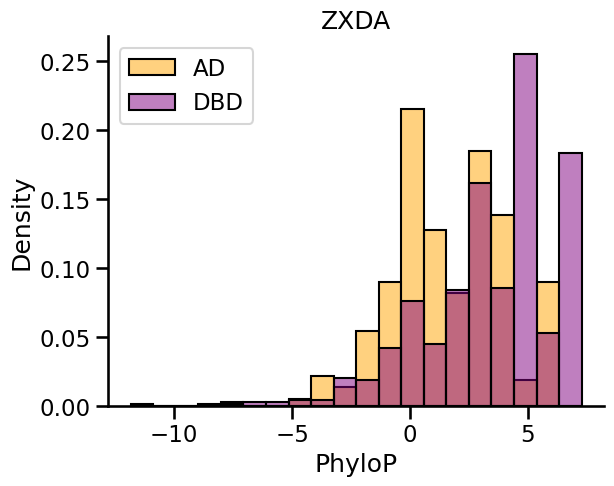

MSX1


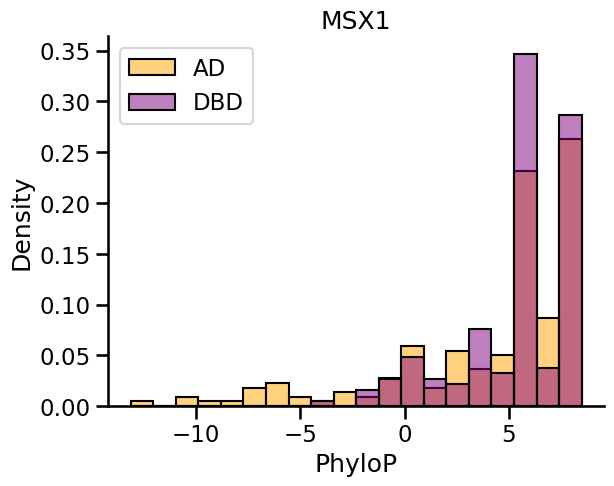

MAFA


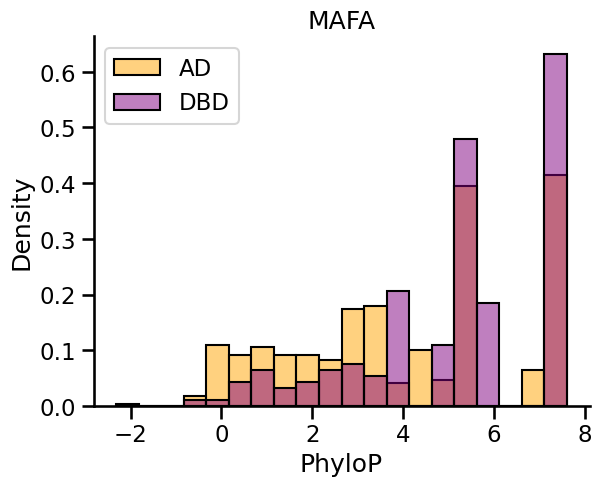

KLF15


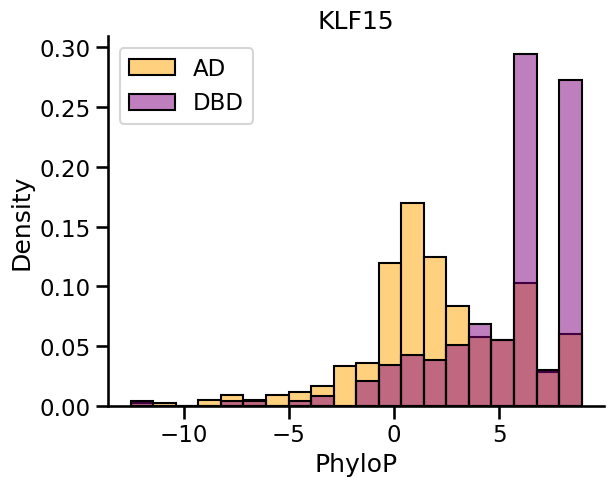

TBX22


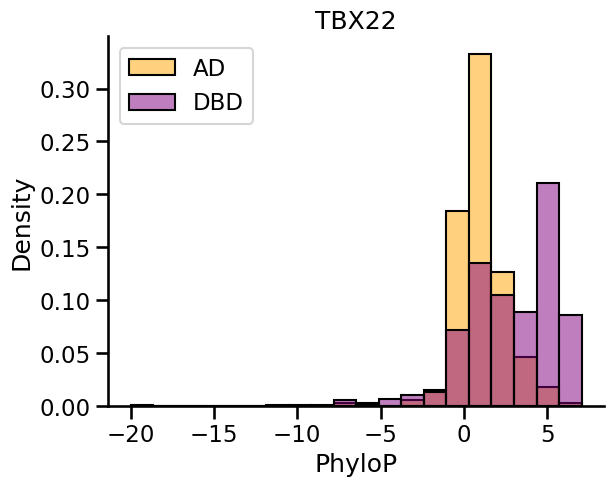

NFAT5


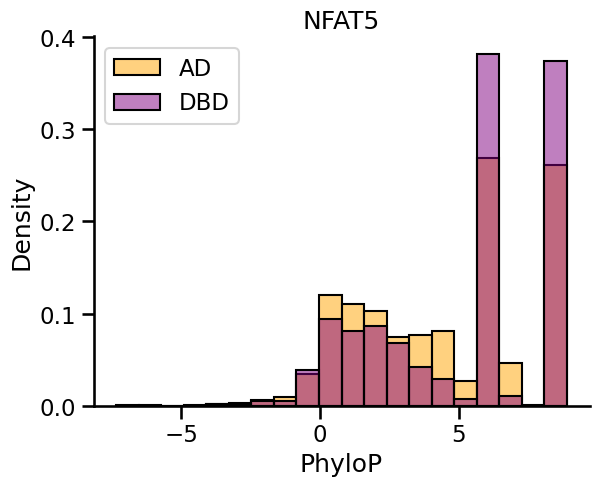

FOXC2


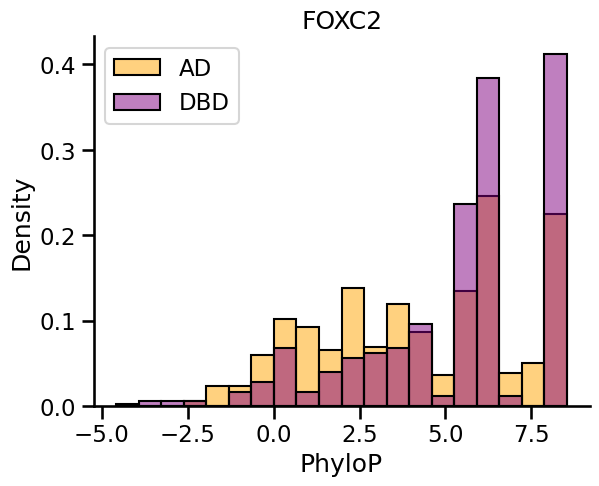

ZBTB17


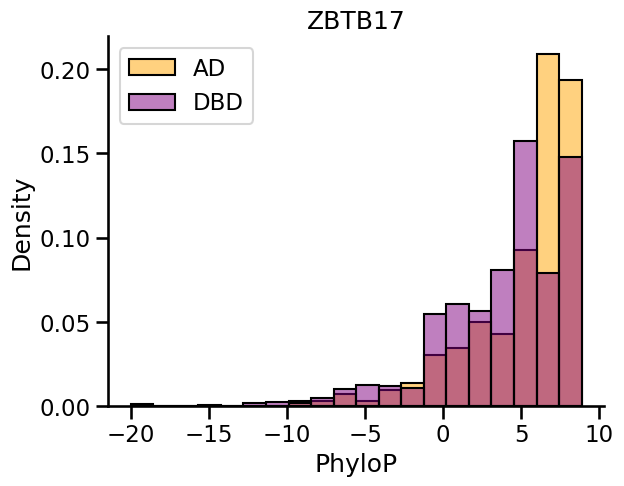

IRF5


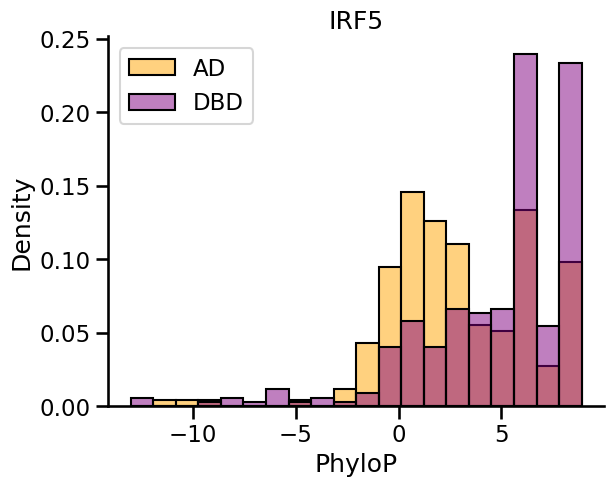

OTP


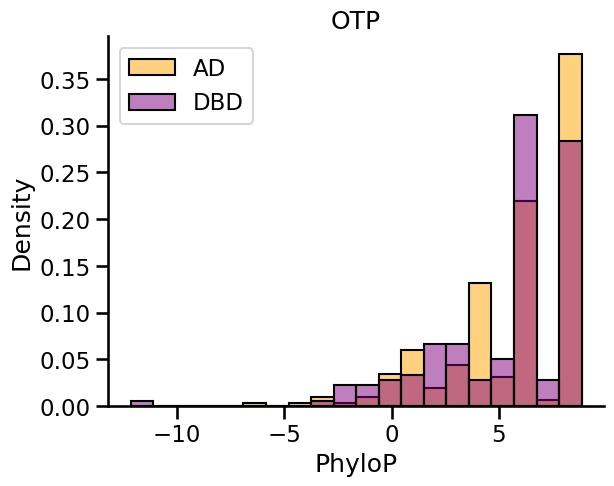

MYBL2


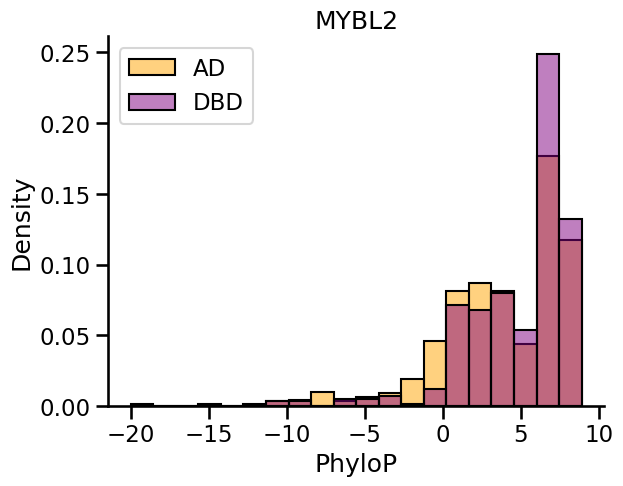

PLAGL1


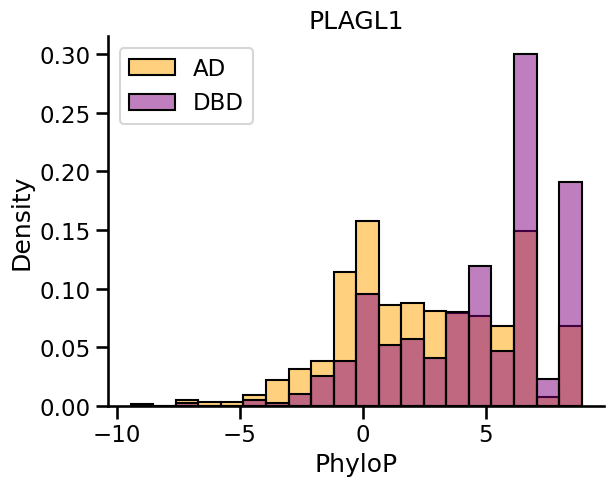

TET2


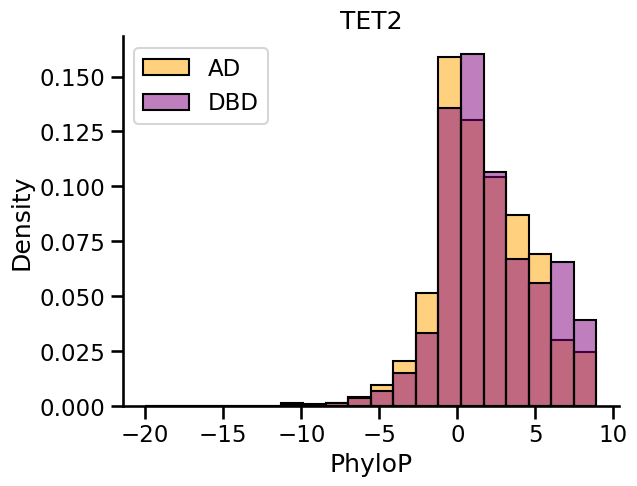

PROP1


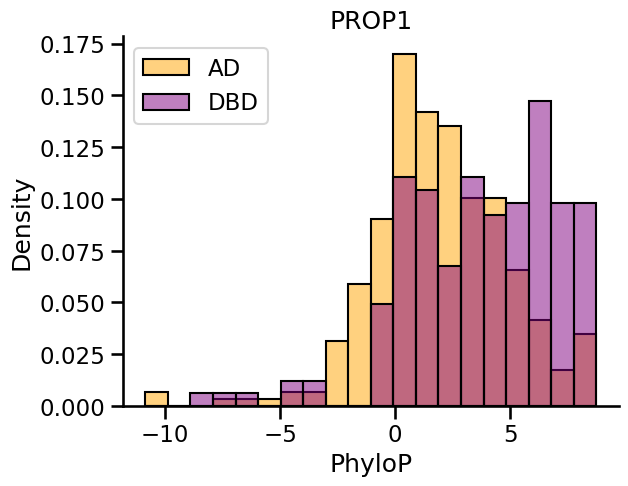

c-Jun-AP-1


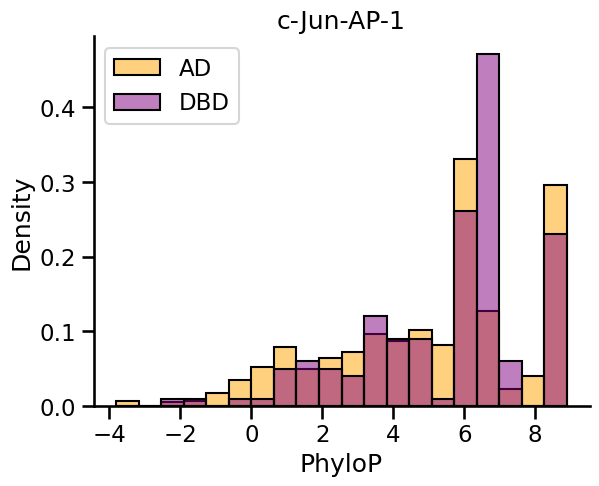

TFCP2


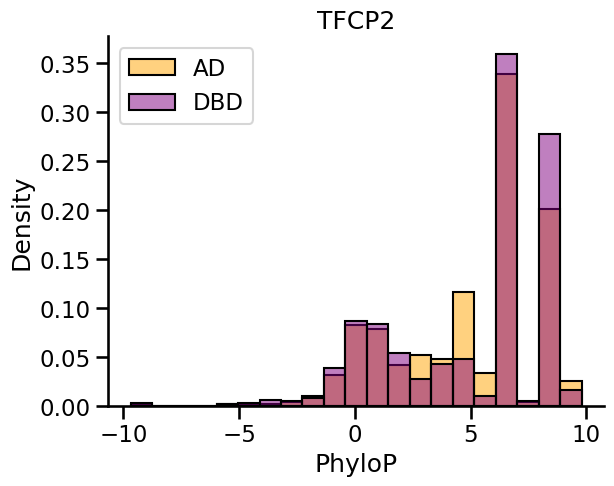

HOXA13


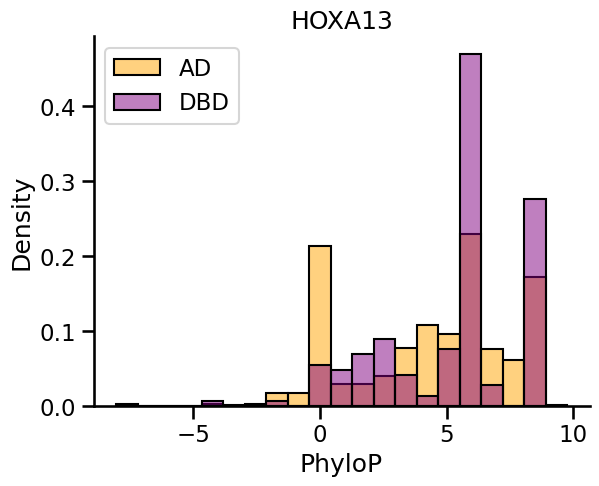

FOXO6


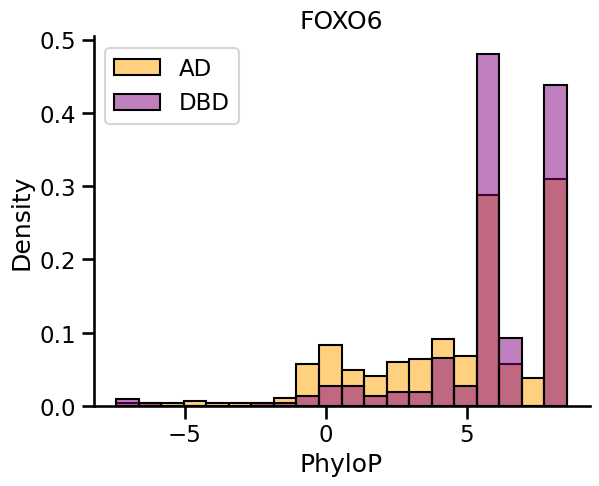

TBX3


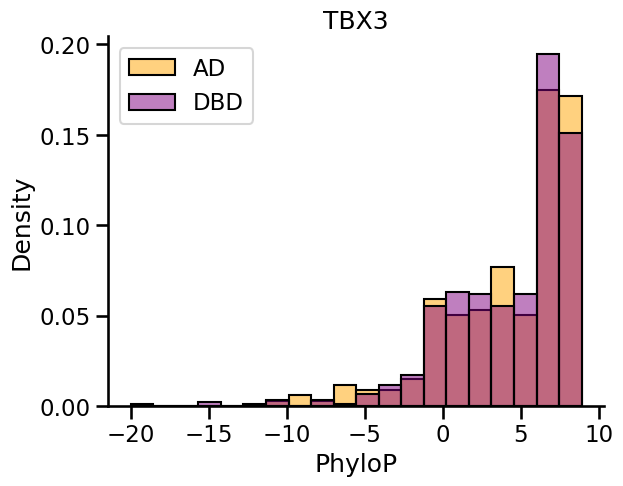

NOBOX


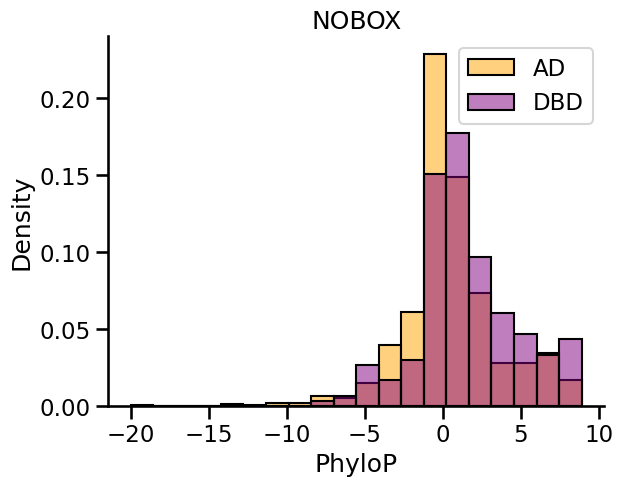

KLF2


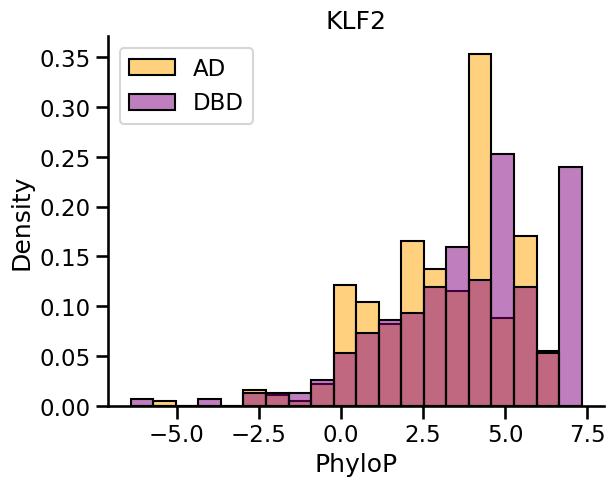

ETV4 - ETV4-PEA3


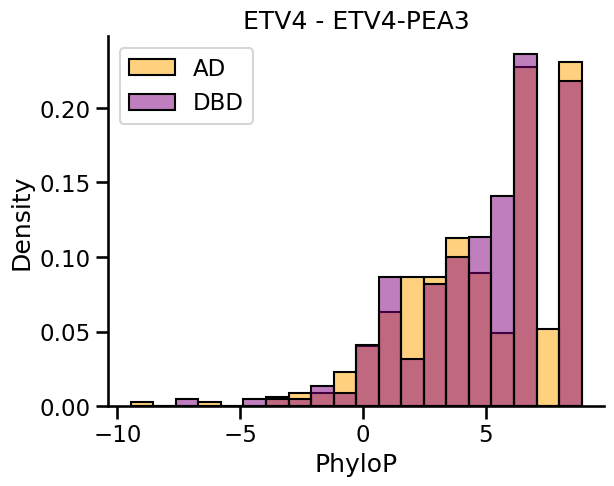

PPARG


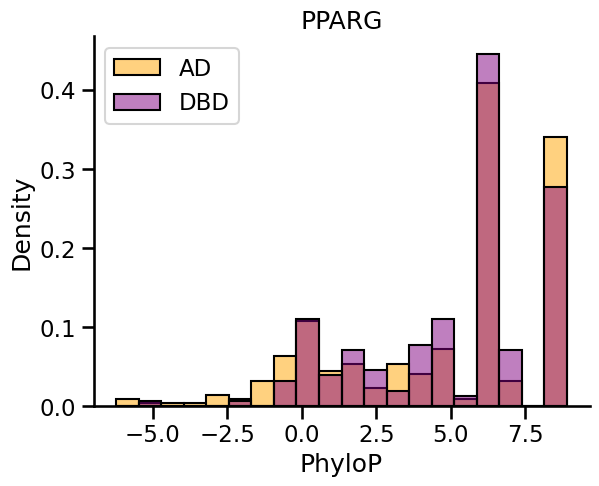

TIGD7


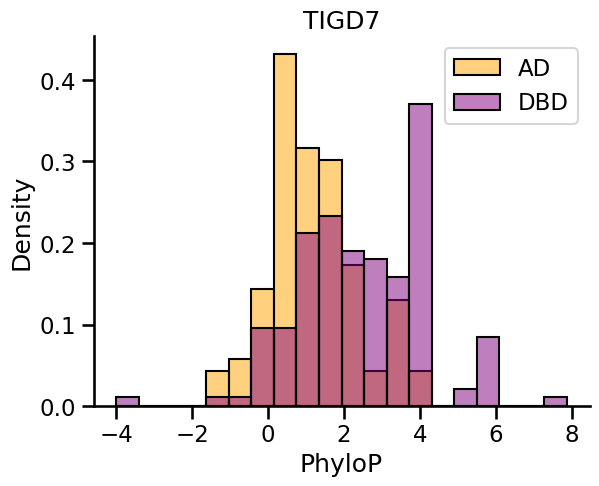

NANOG


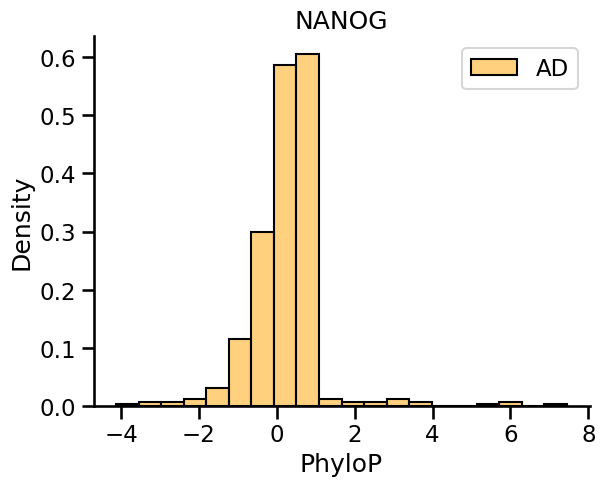

TEAD4


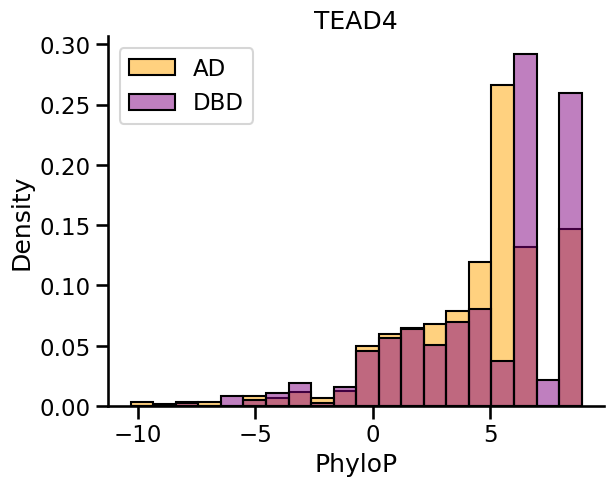

PAX3


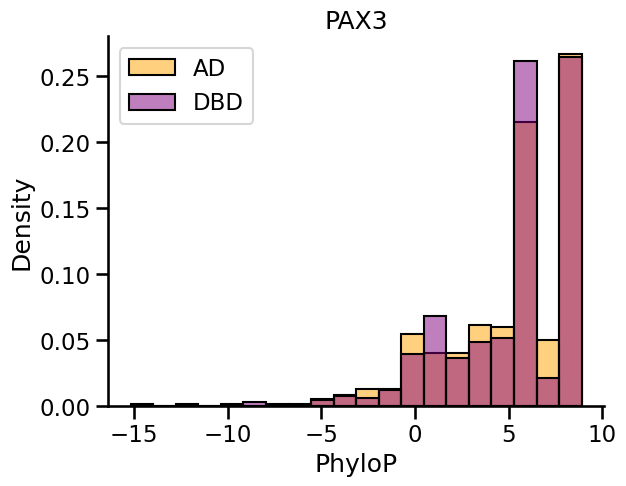

MYF5


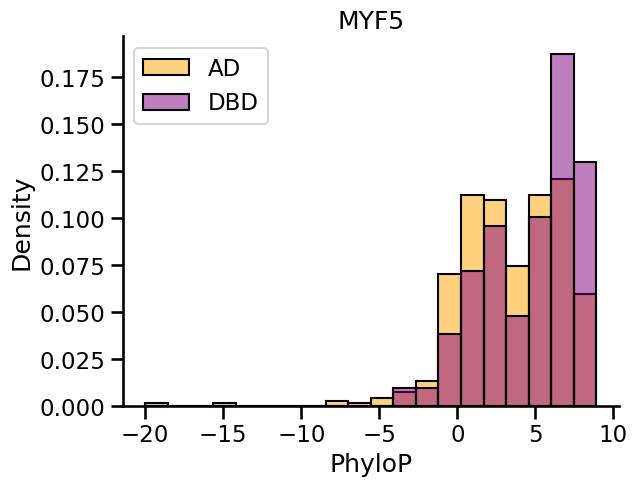

SOX3


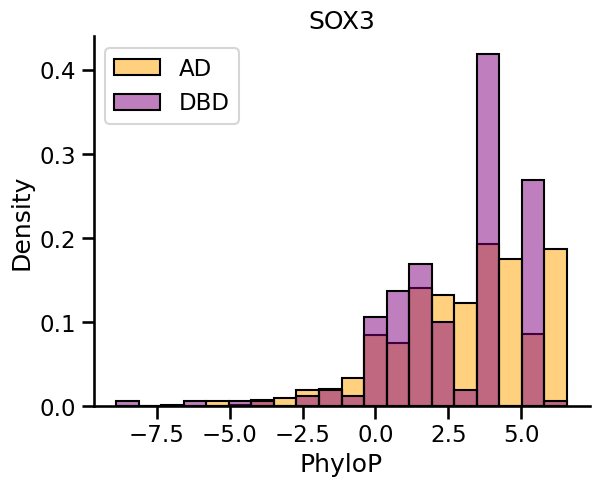

NEUROD6


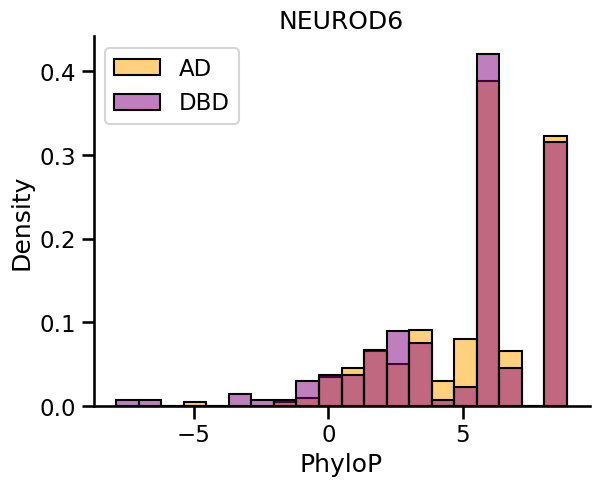

RELA - TF65 - RELA - p65


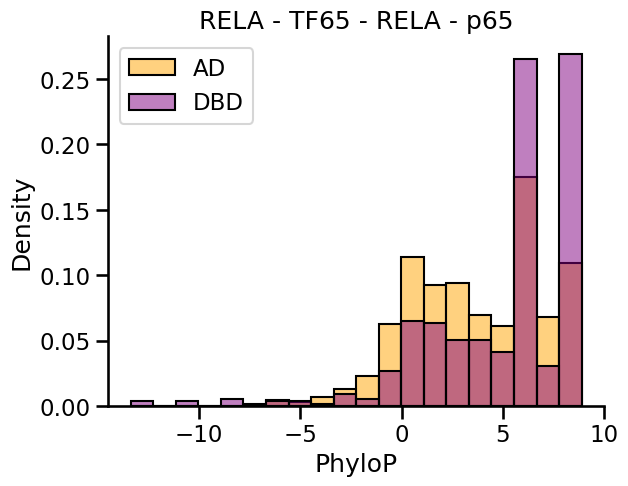

FOXN4


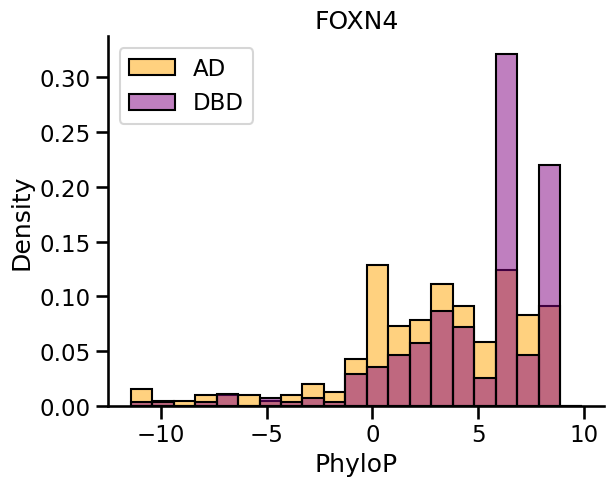

VDR


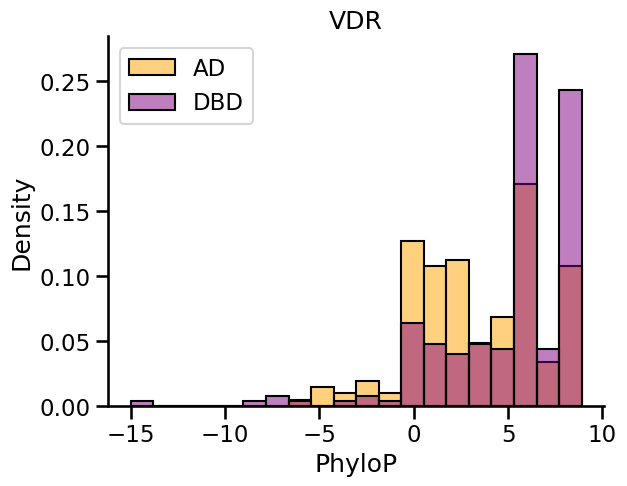

TFEC


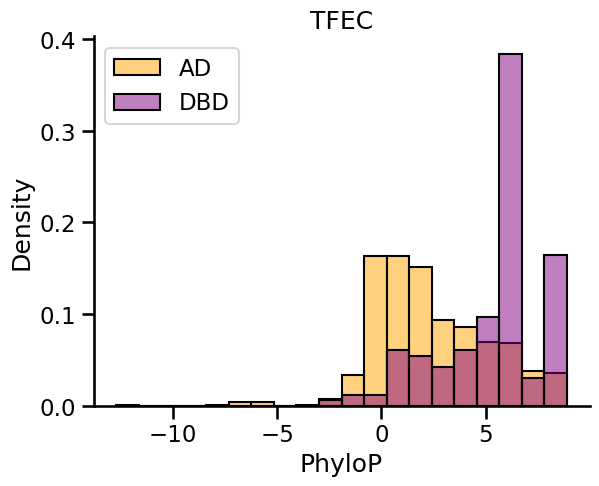

AEBP1


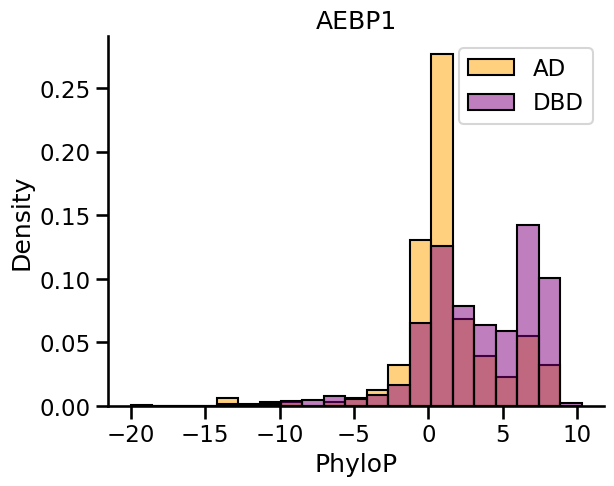

NRF1


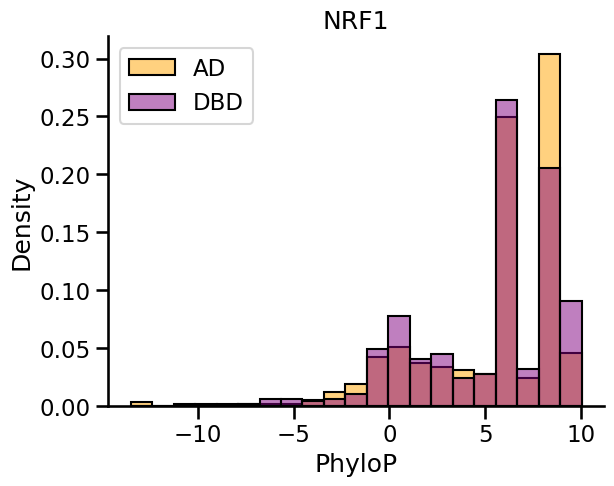

AHCTF1


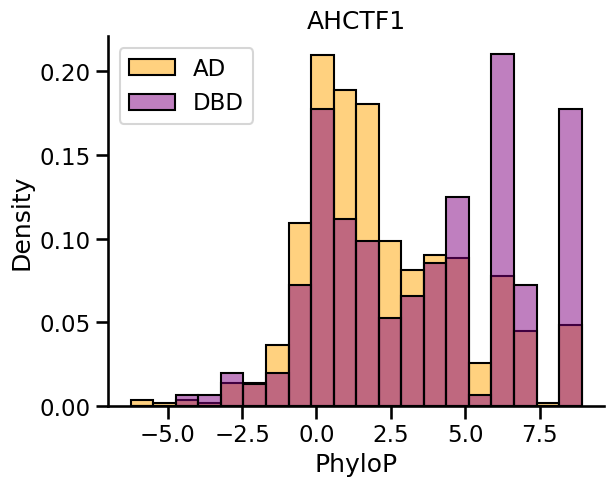

ETV5 - ETV5-ETV-PEA3-ERM


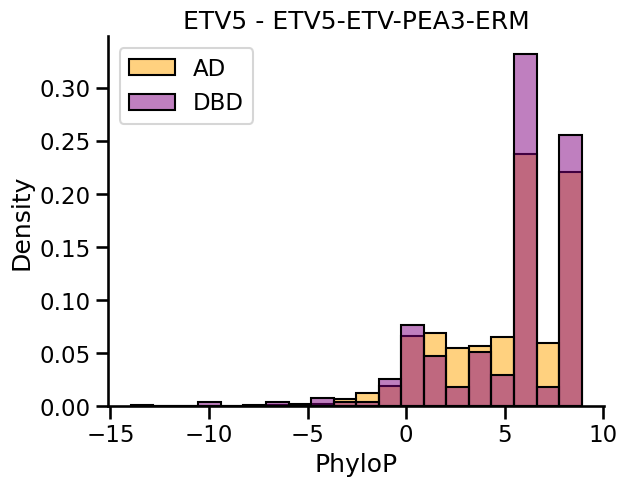

TFEB


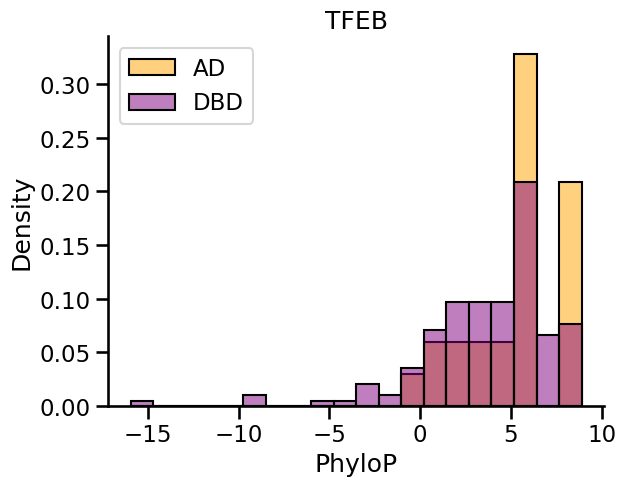

ARX


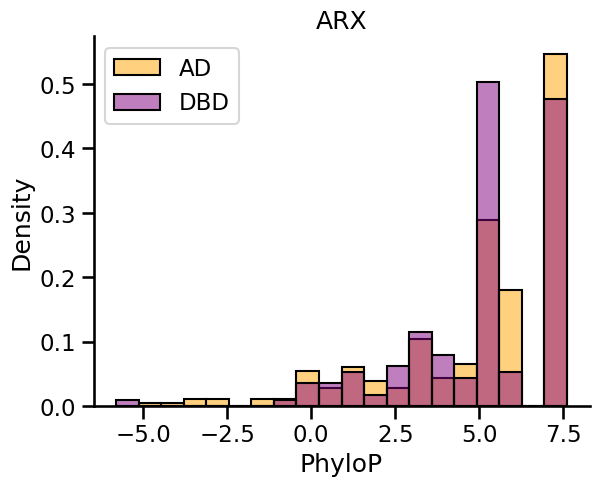

GMEB2


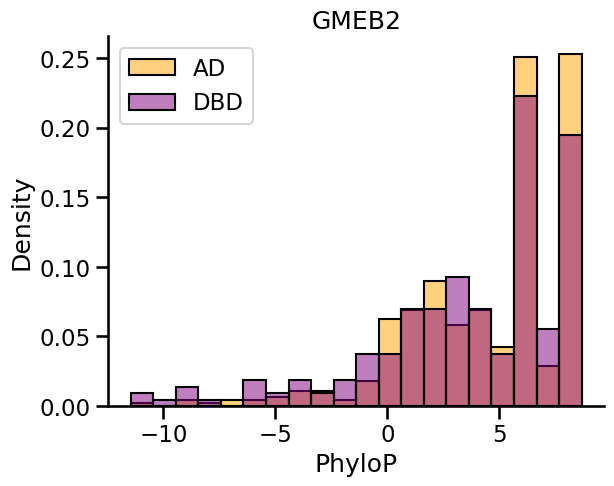

NFE2L1


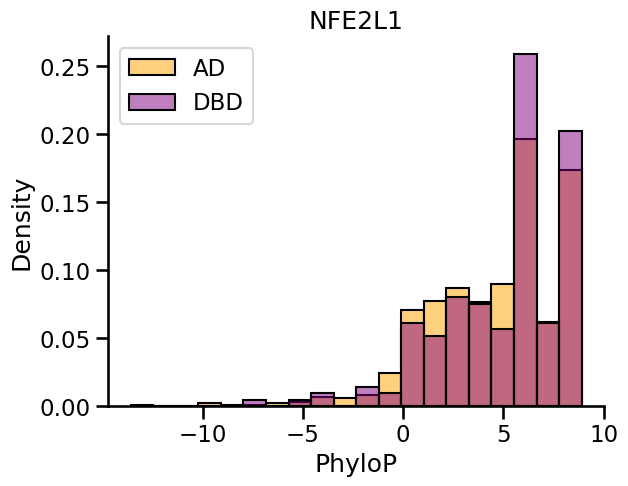

FOXN2


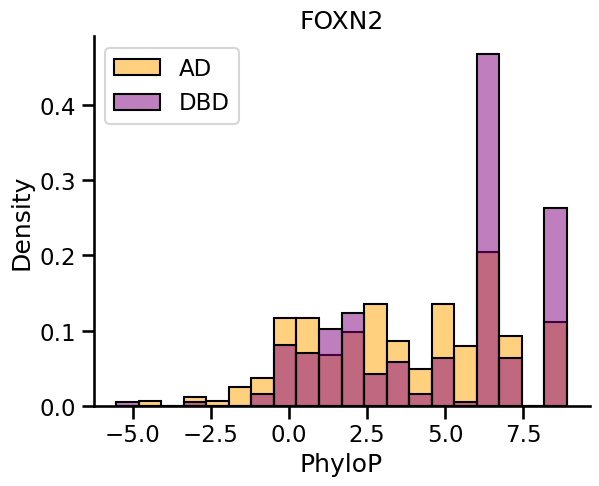

ATF7


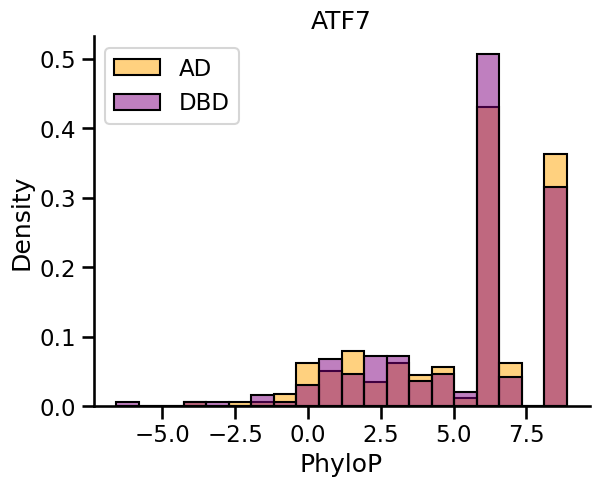

NANOGP8


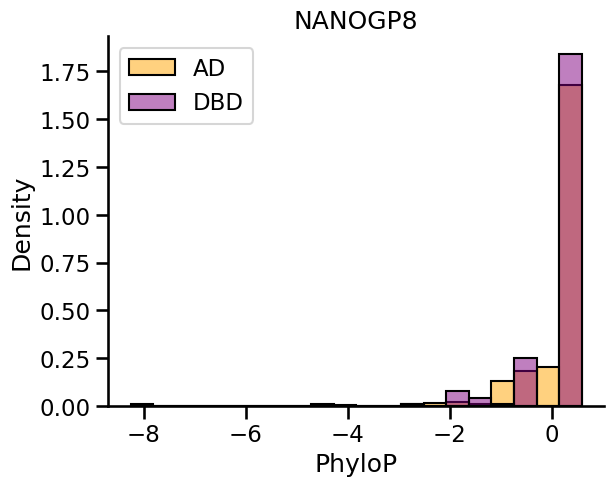

STAT5B


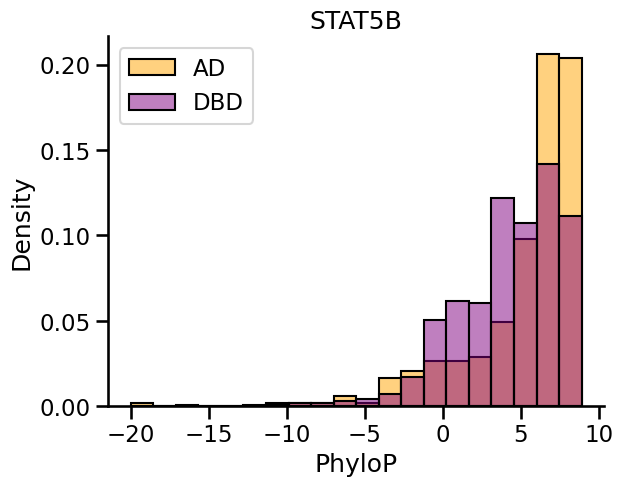

USF2


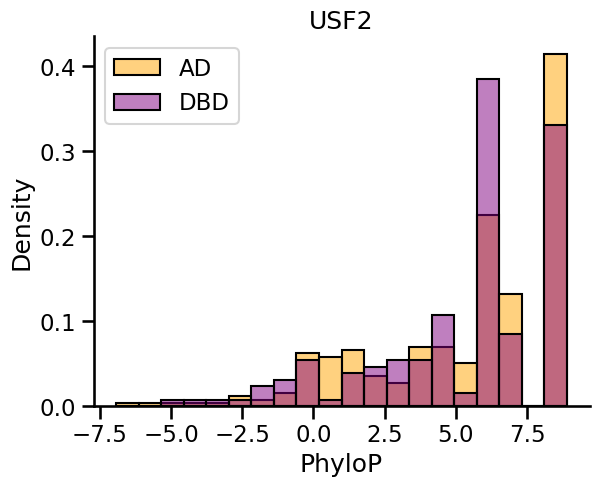

KLF9


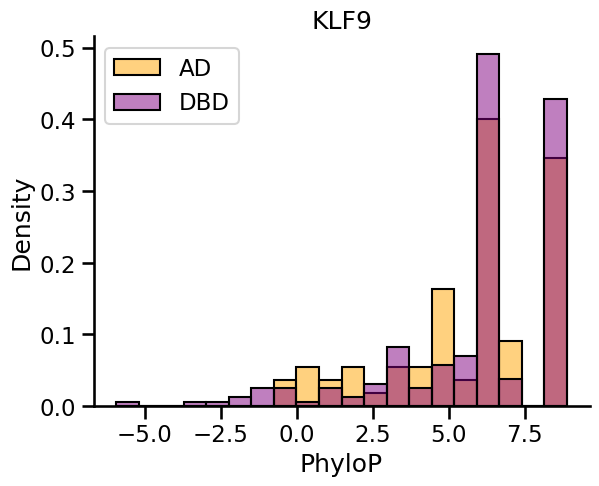

ELK3


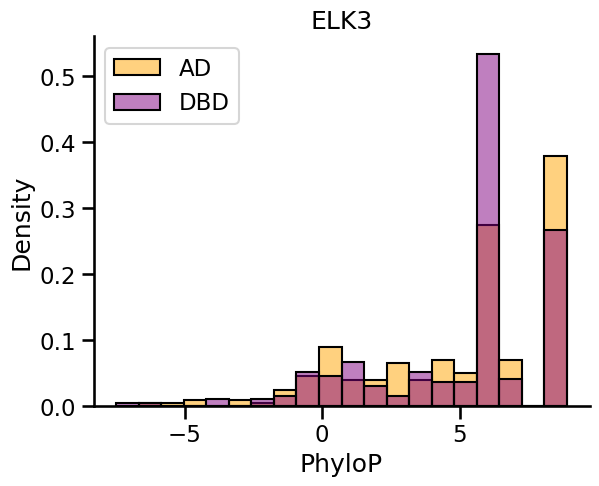

CEBPB


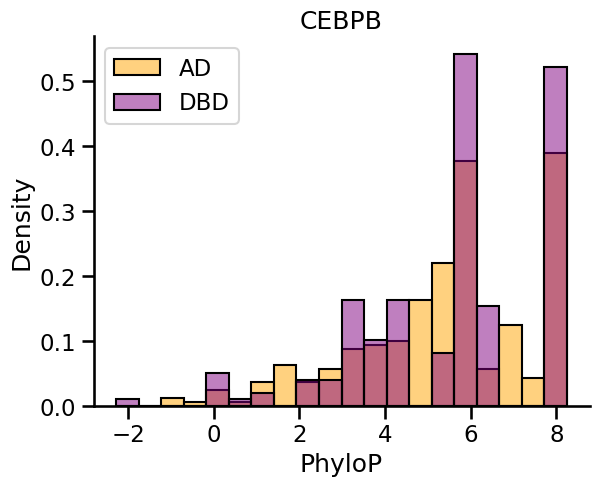

HOXB13


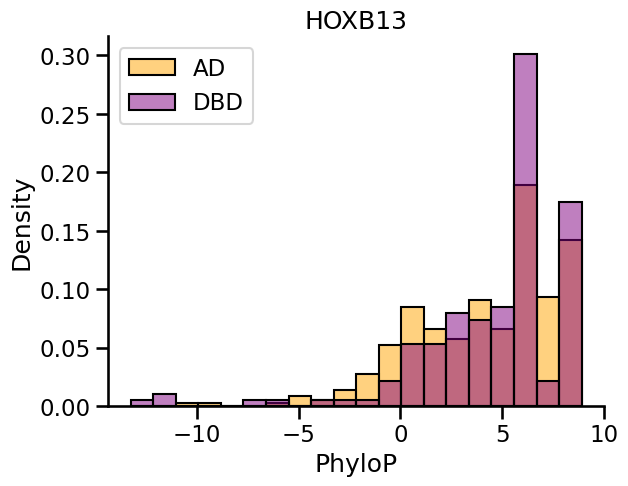

FOXJ2


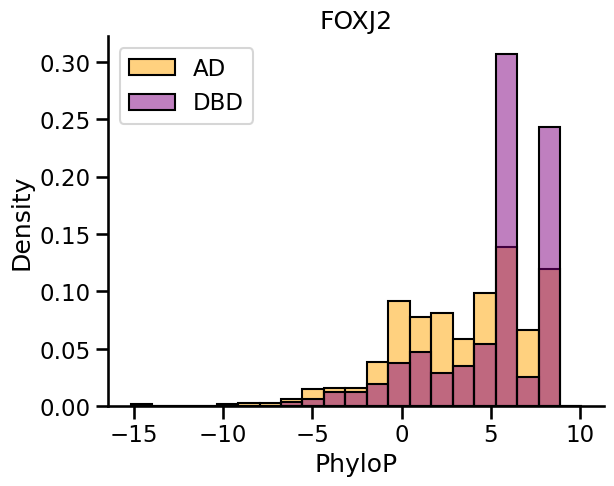

SOX8


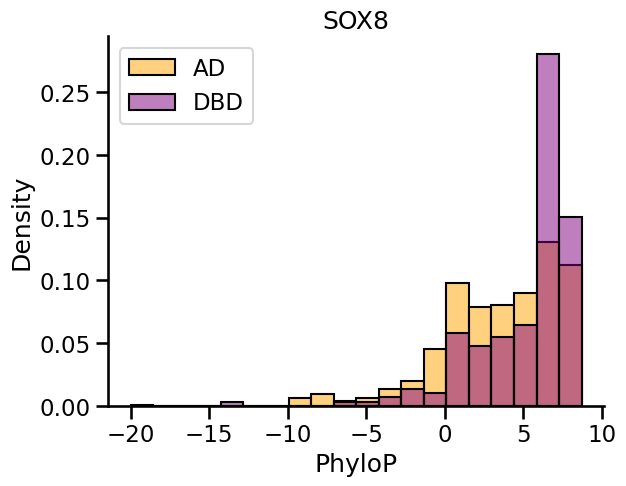

NPAS4


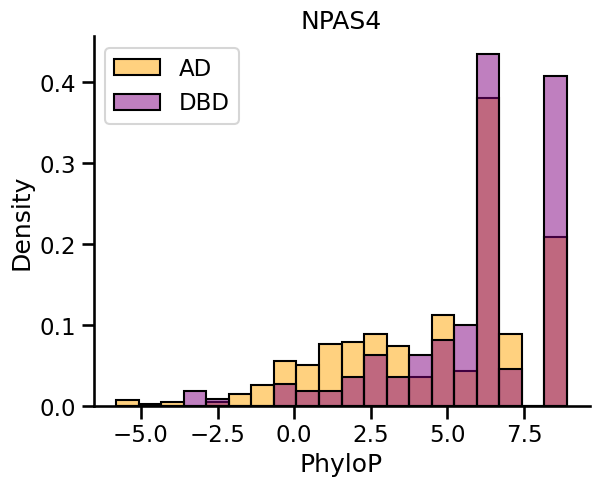

HOXB1


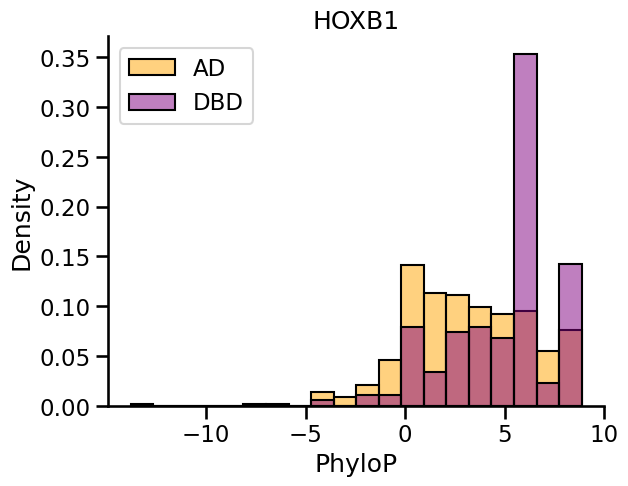

HOXB3


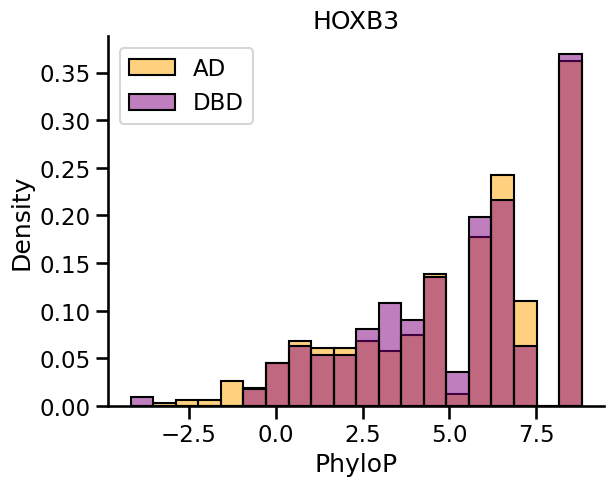

ESR1


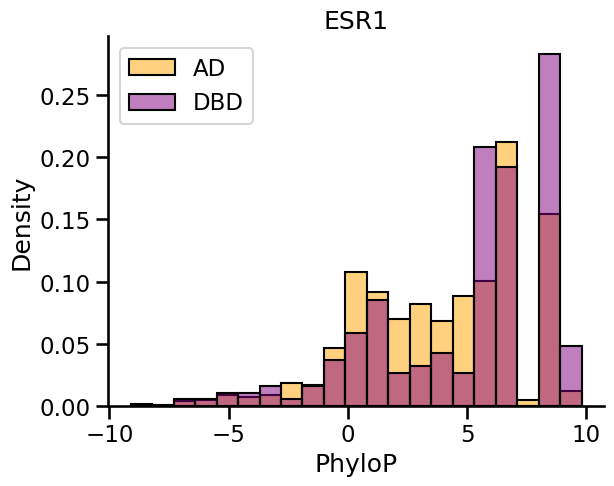

CR3L1 - CREB3L1


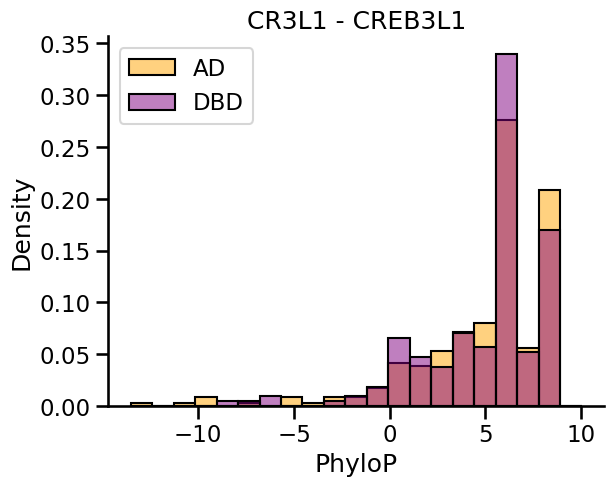

OTX2


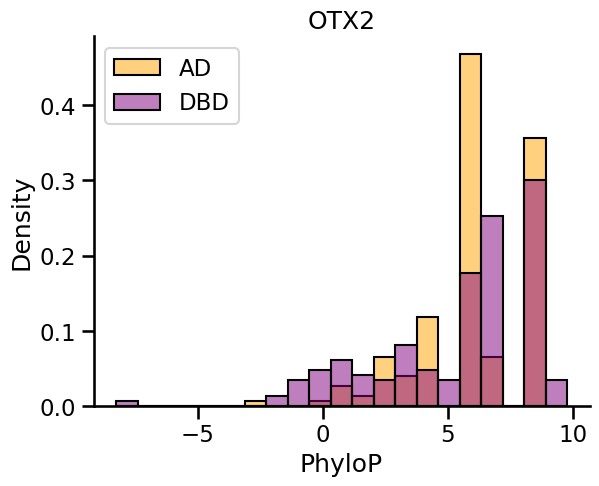

EOMES


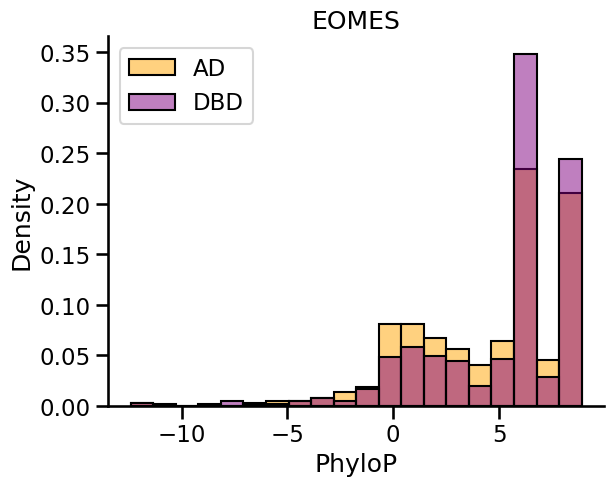

NFYA


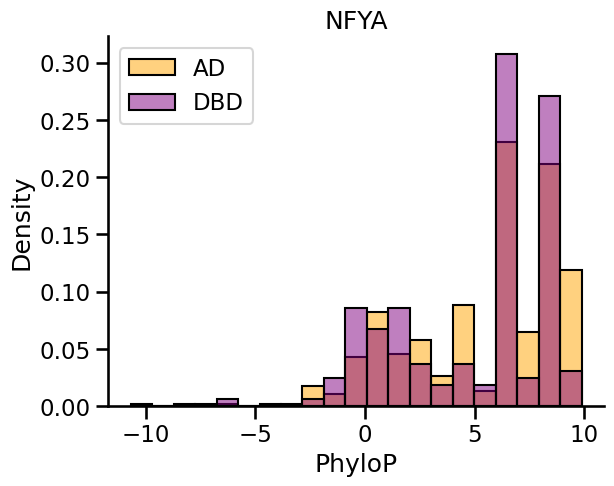

PHF20


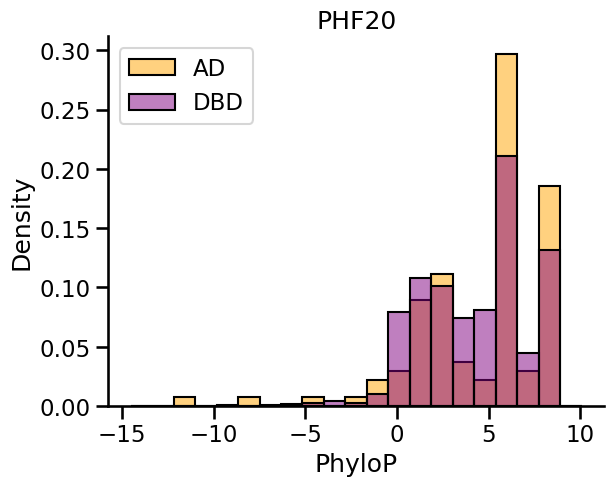

FOXF1


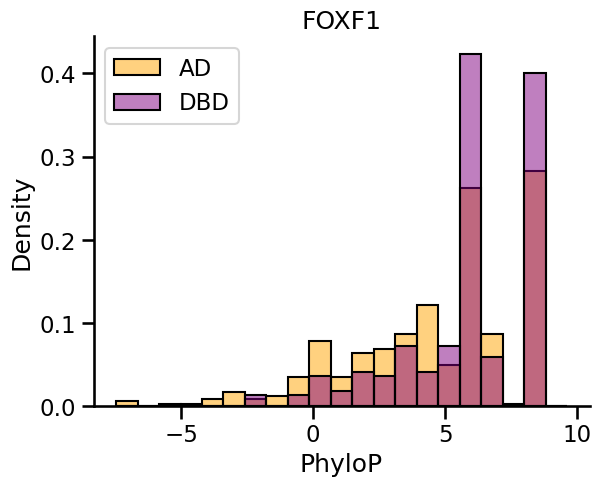

SOX12


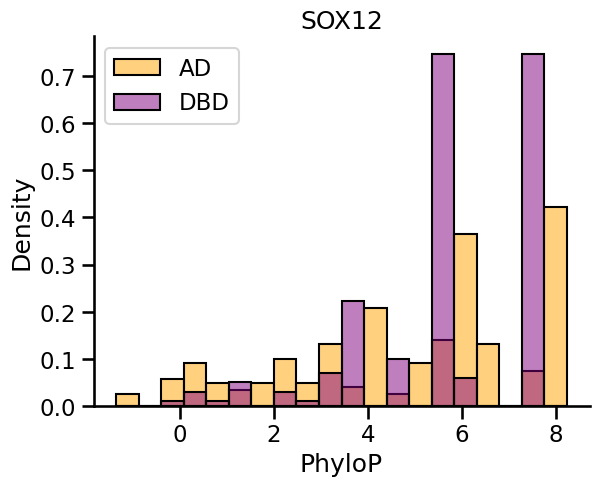

TP73


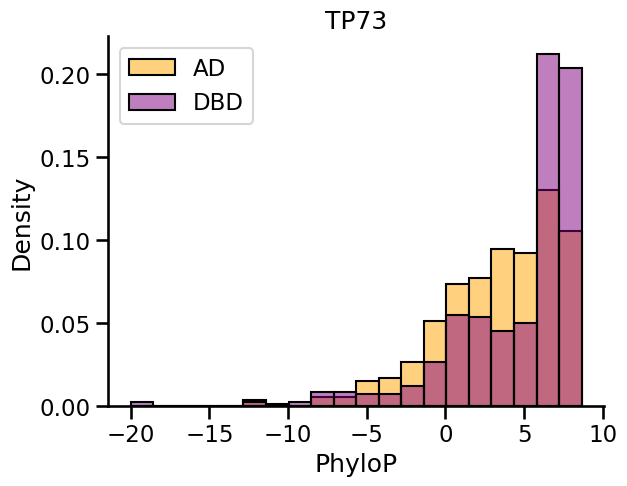

RFX1


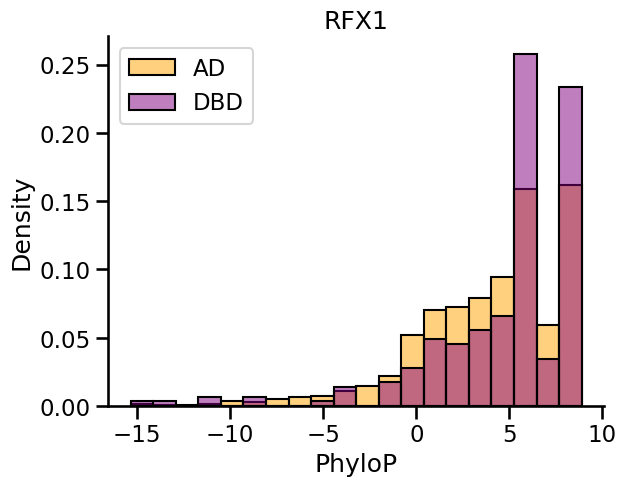

GLI1


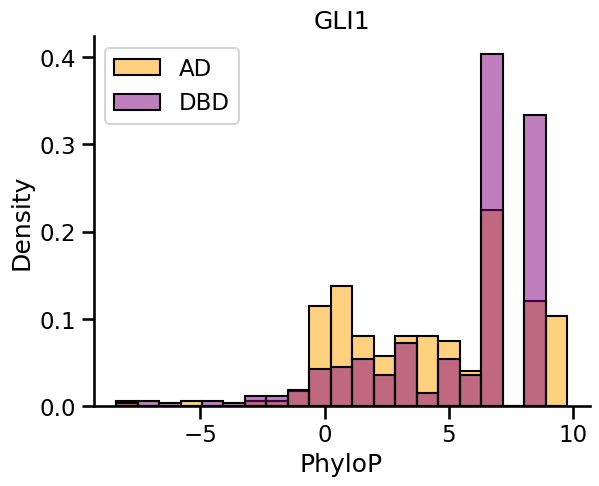

ESX-ELF3 - ELF3


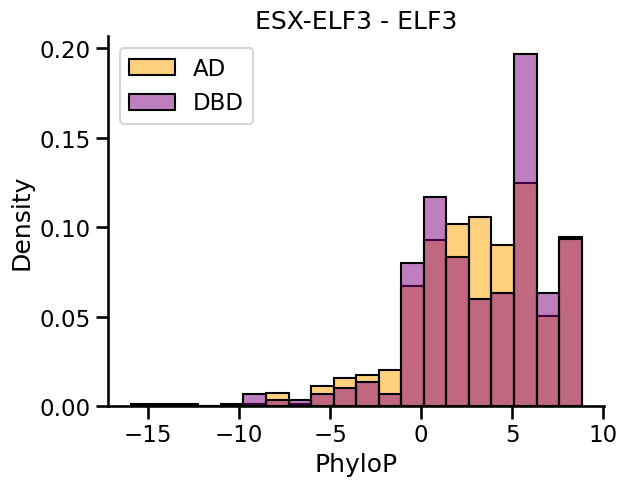

SP9


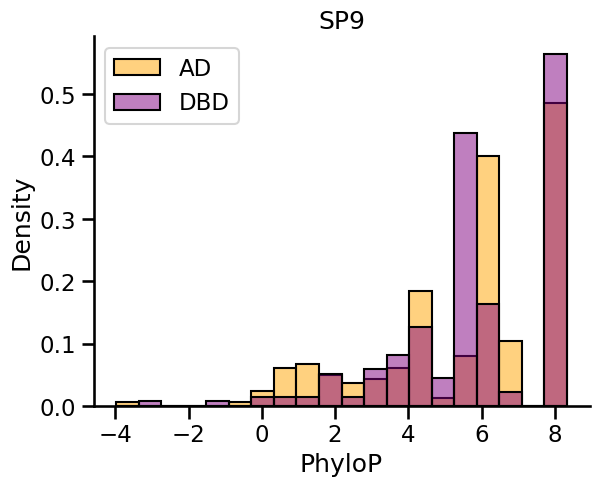

CEBPA


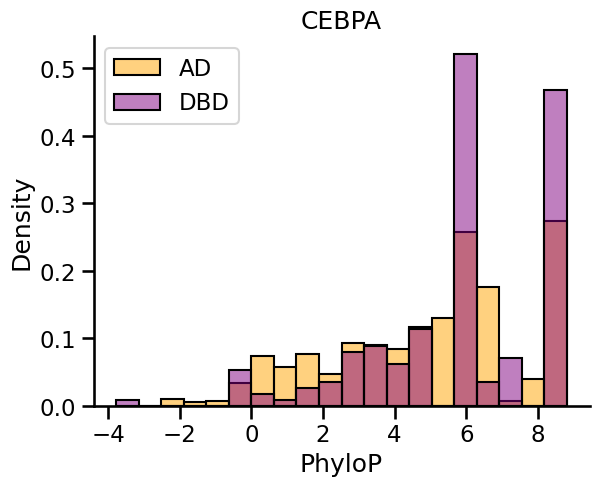

AKAP8L


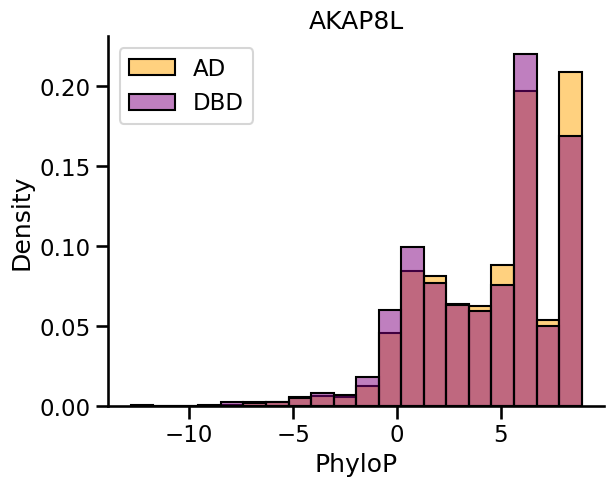

TCF4


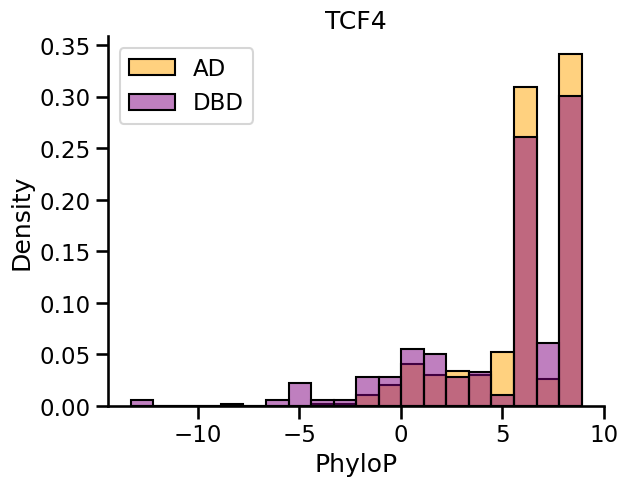

TBX5


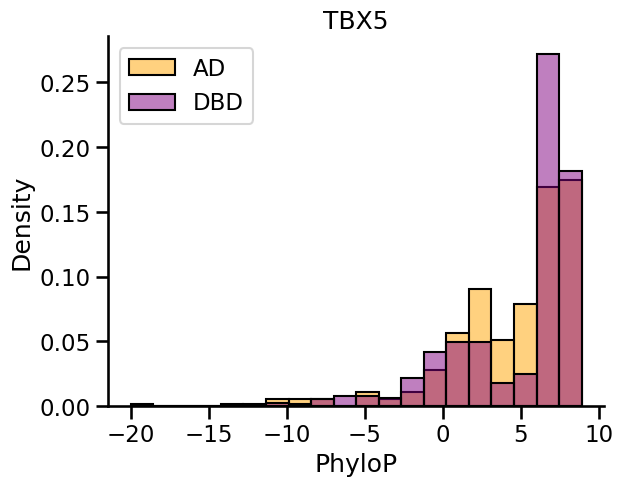

MEF2A


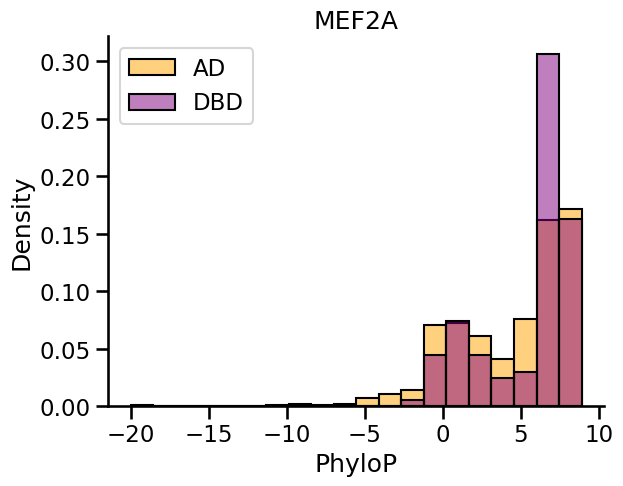

MTF1


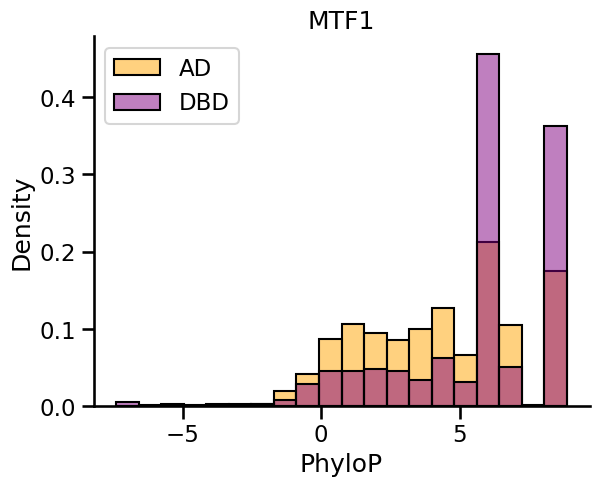

ZFX


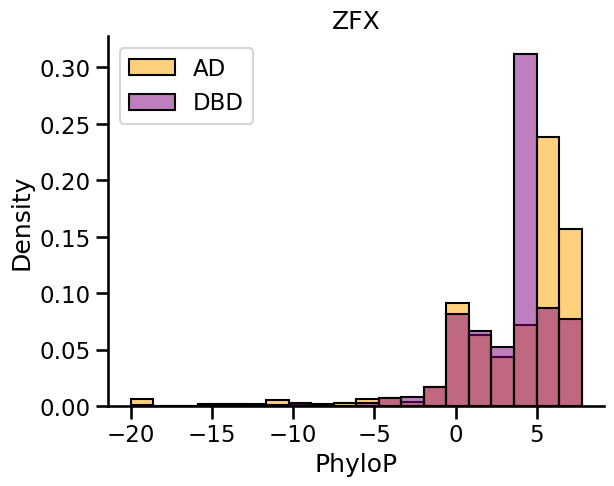

ARGFX


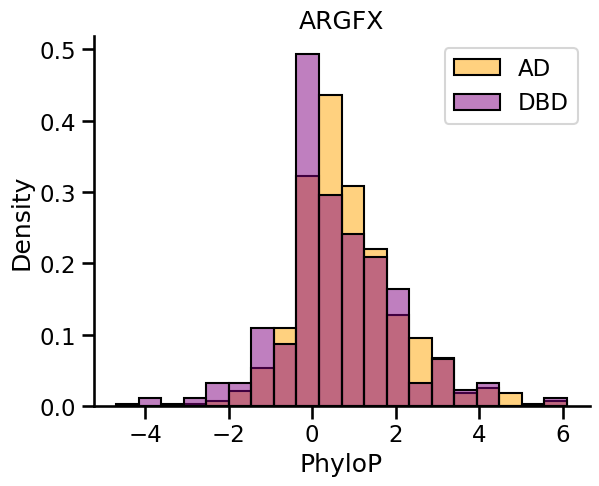

MGA - MGAP


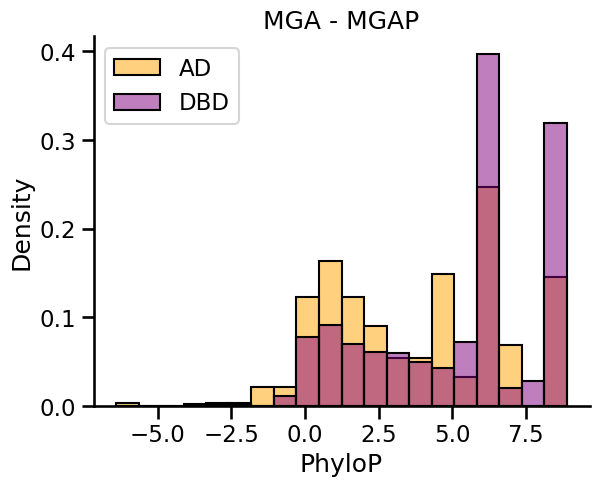

ZNF426


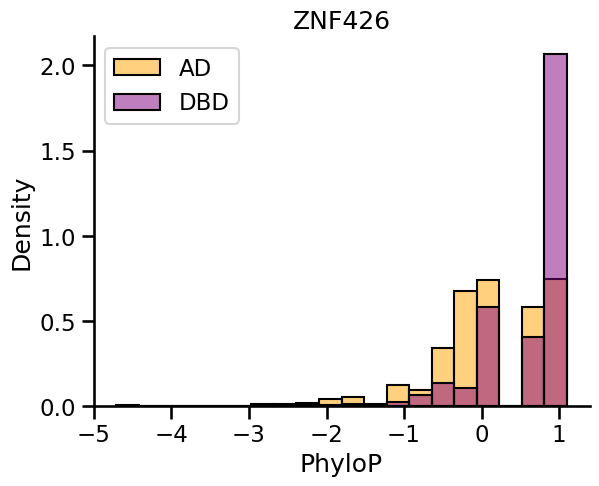

HMGA2


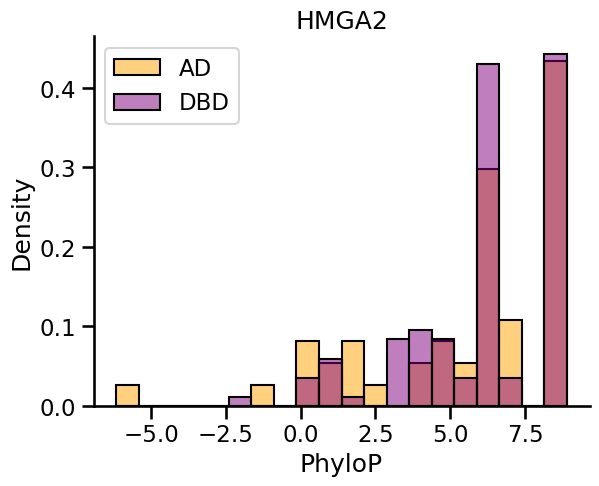

NFE2L2


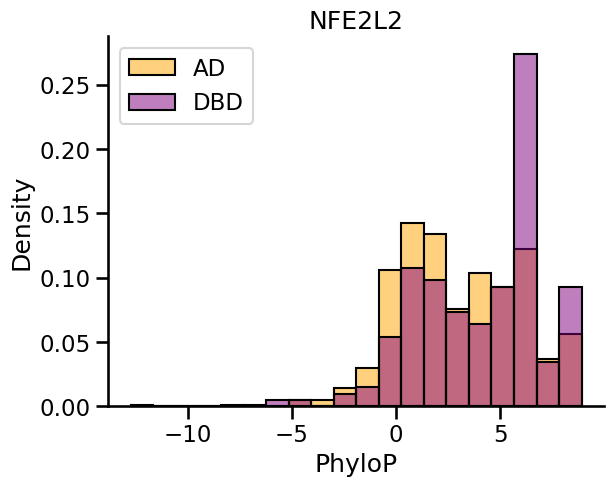

PAX5


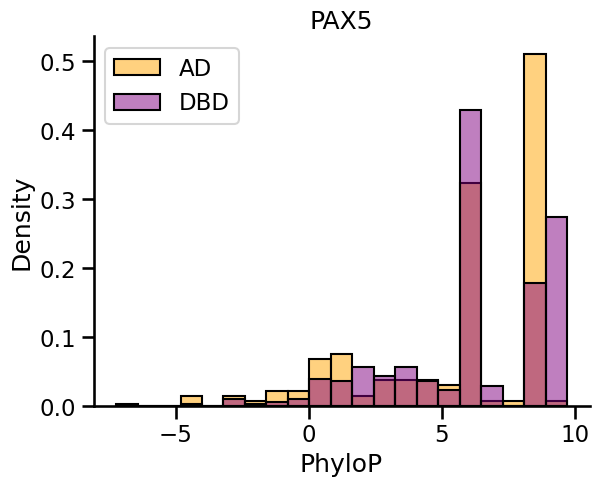

TRAFD1


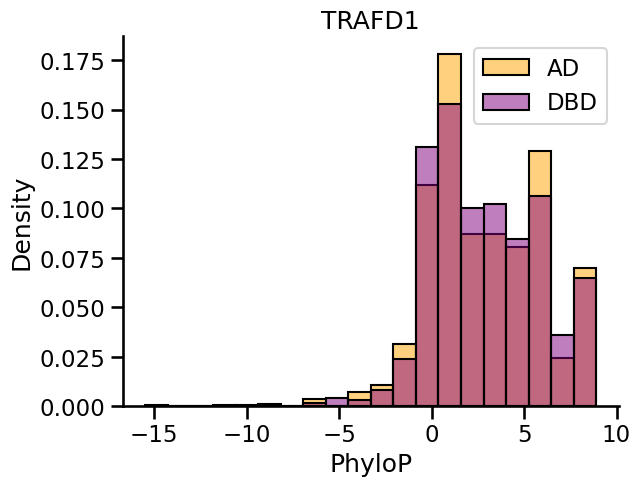

CDX1


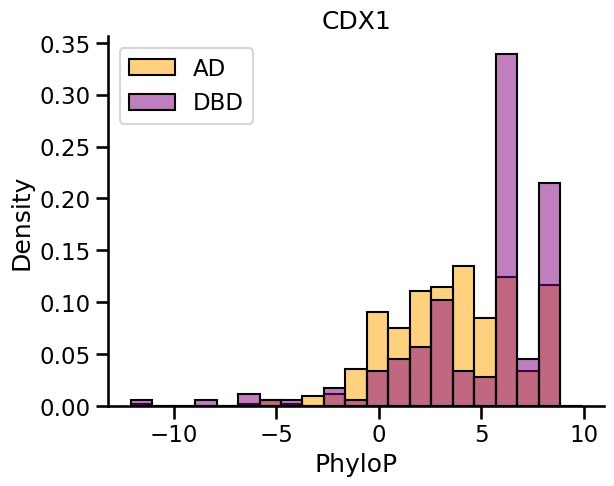

ZHANG - CREBZF


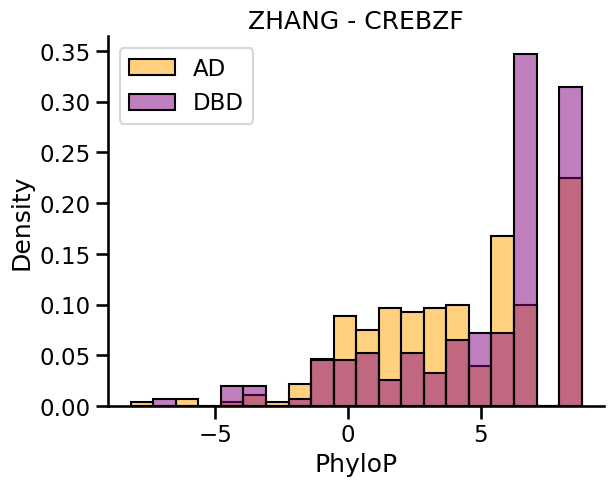

PU1-SPI1 - SPI1


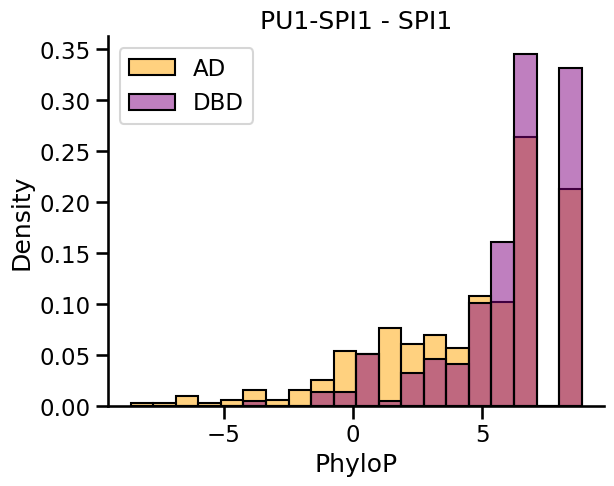

TFAP2D


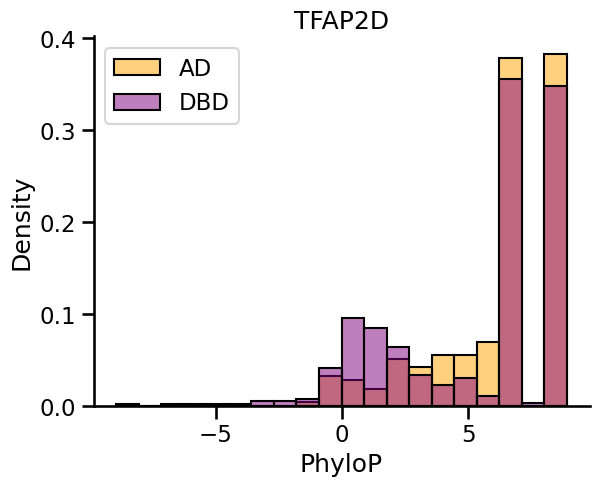

ZNF143


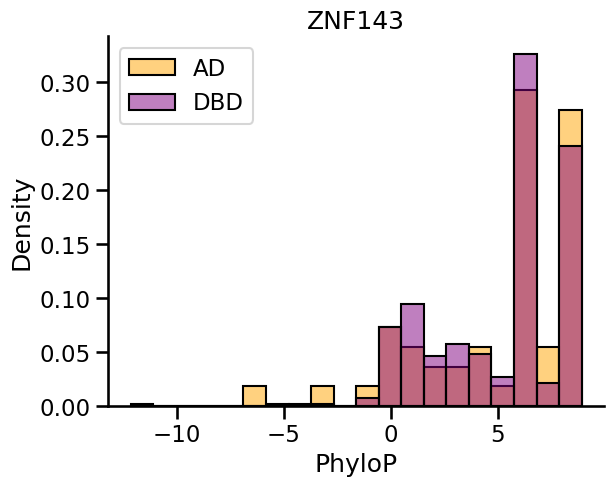

CXXC1


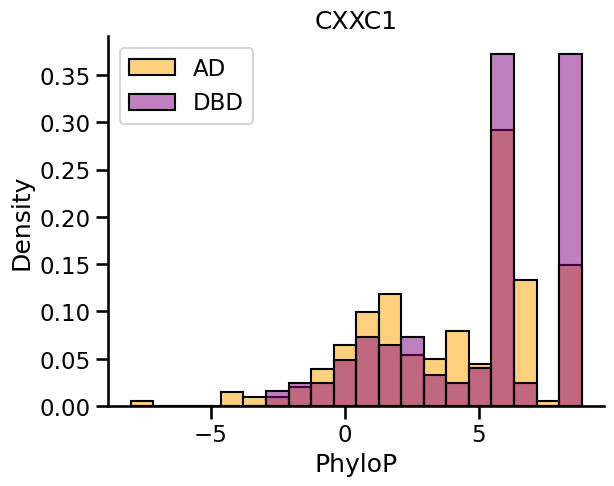

MSX2


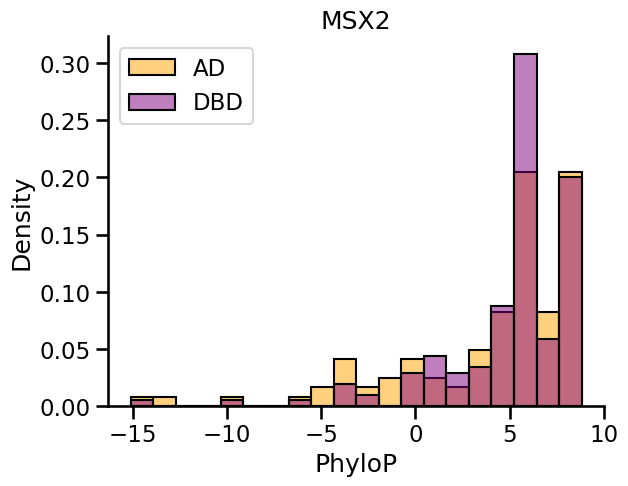

RELB


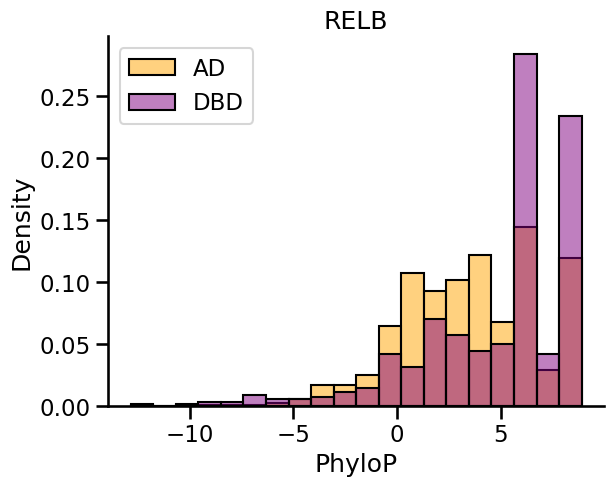

HOXB7


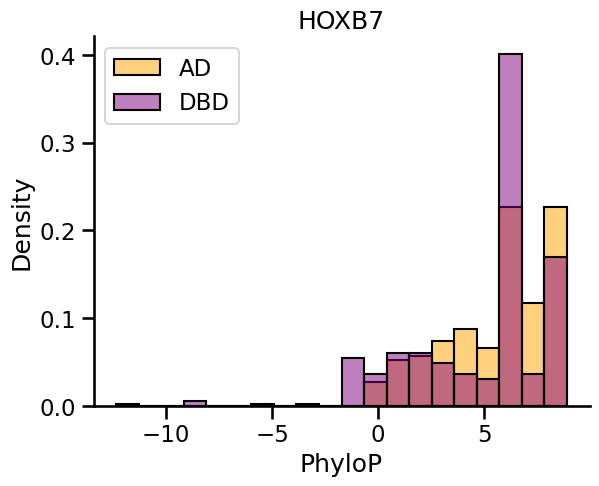

MIXL1


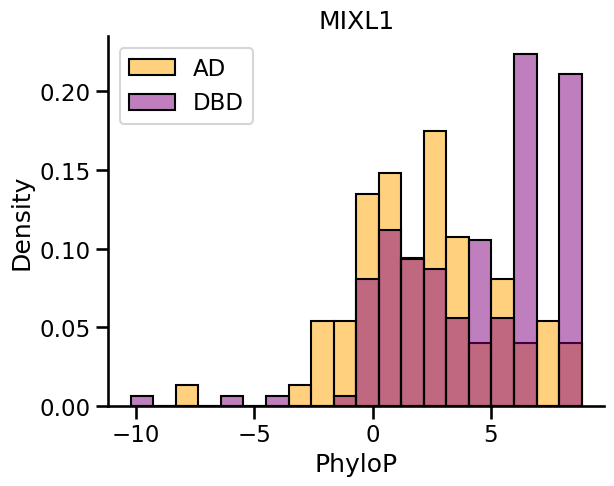

KLF13


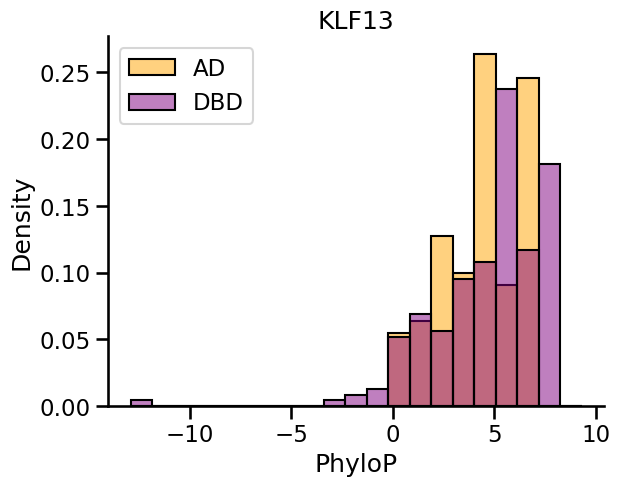

NR1I3


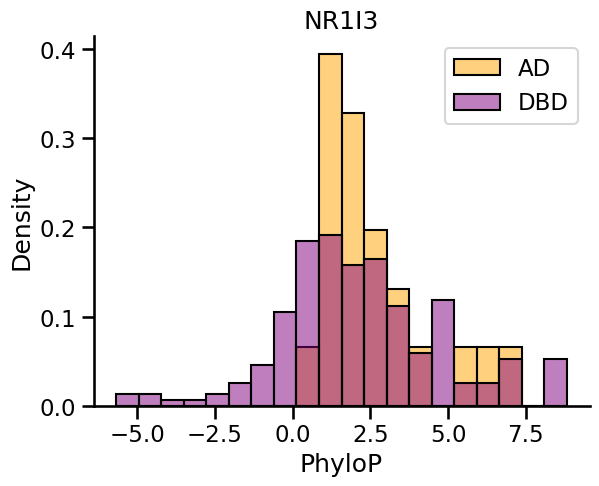

MBD2


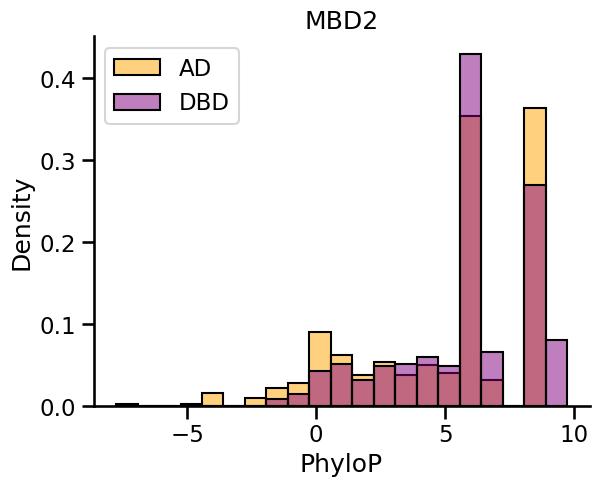

HINFP


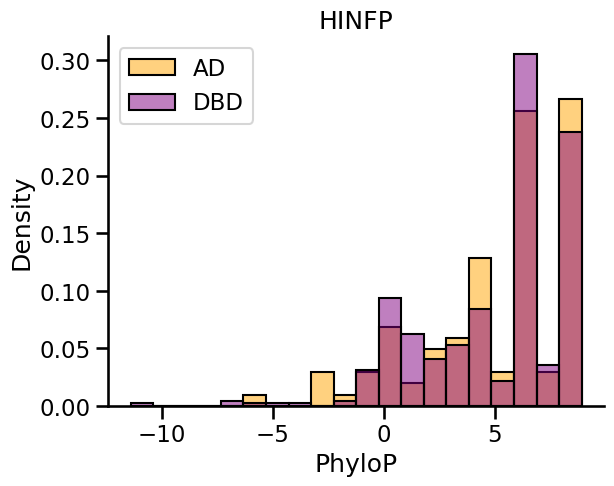

RXRA


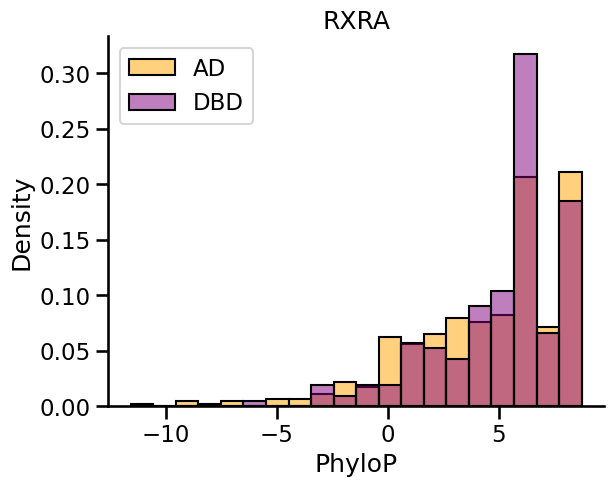

VAX2


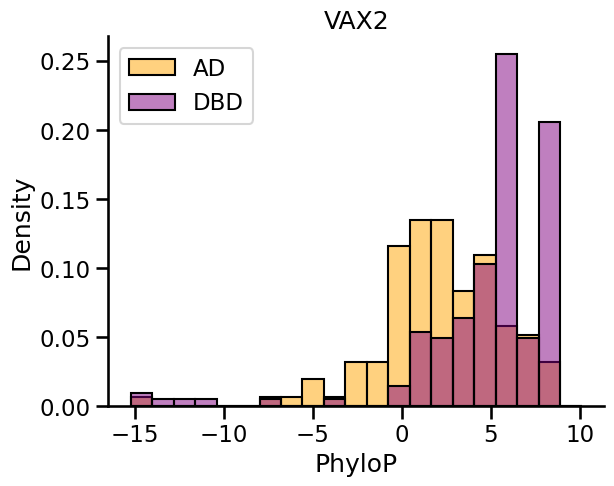

GLIS3


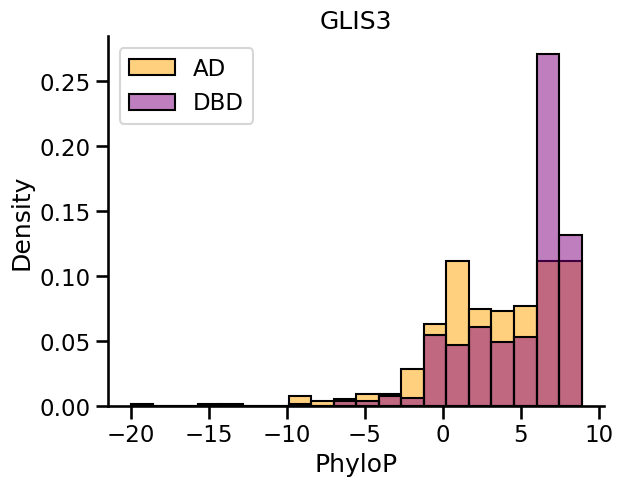

TEAD3


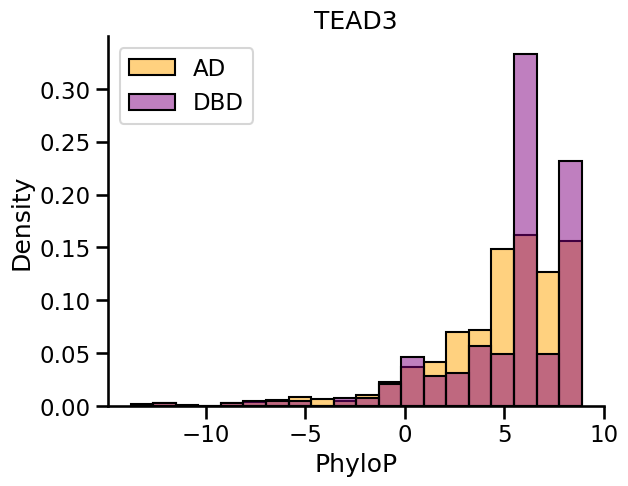

NFIX


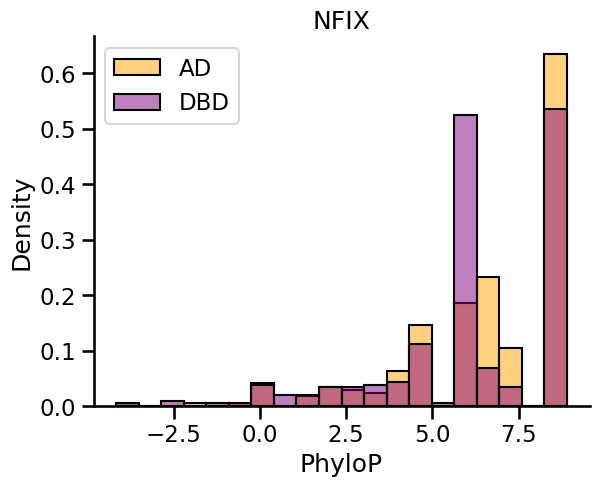

SOX18


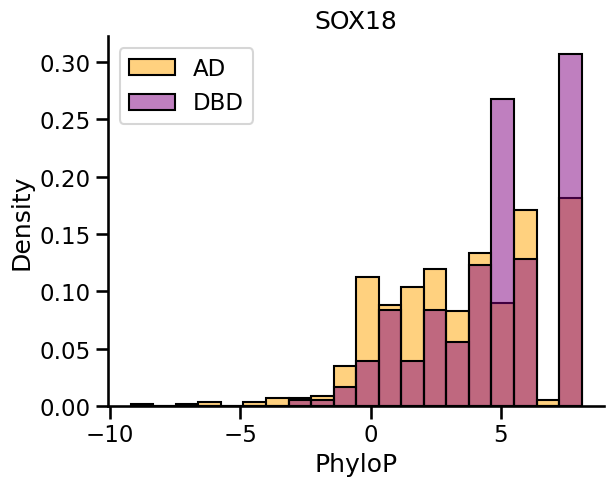

AIRE


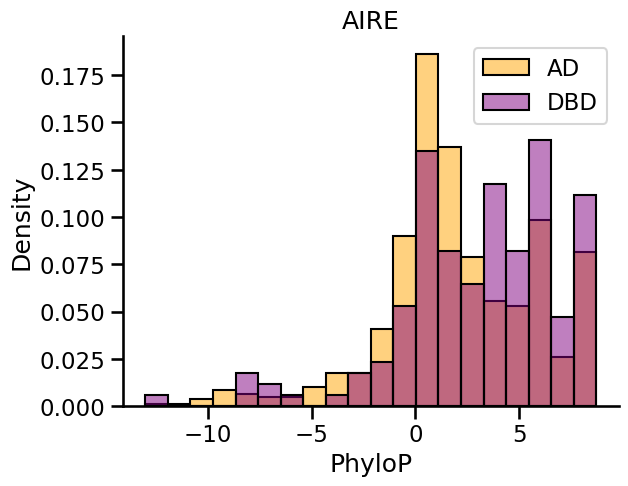

STAT1


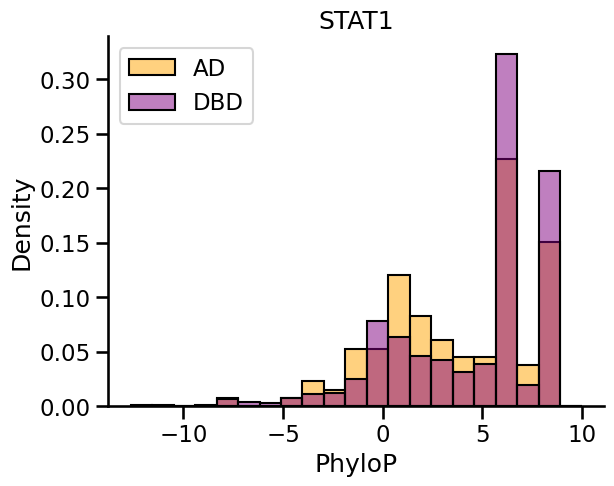

KLF16


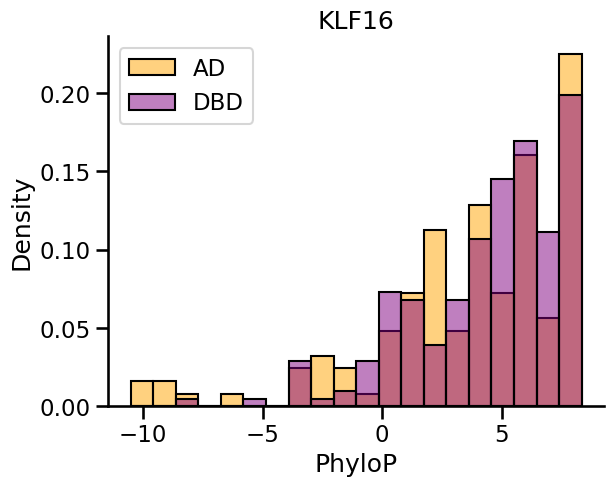

LHX3


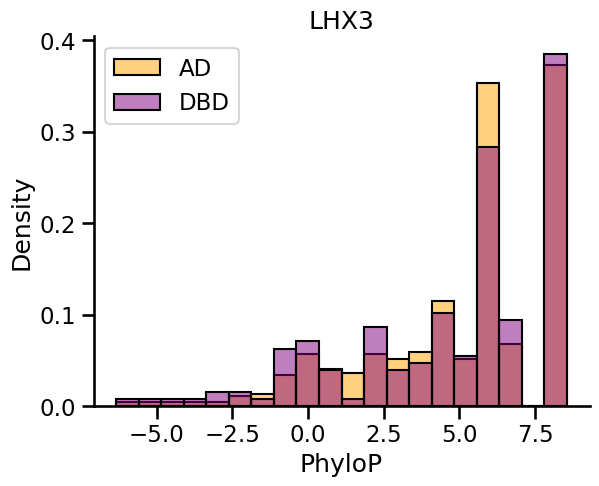

CREB3


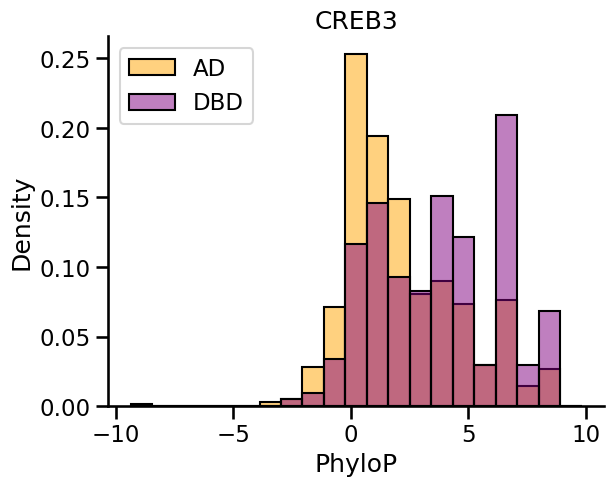

FOXJ3


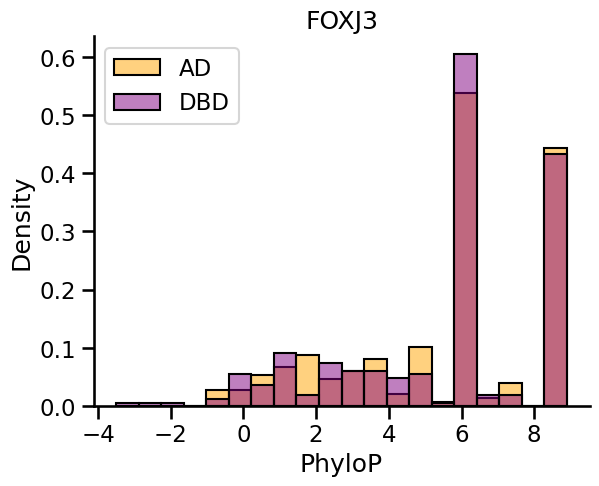

CASZ1


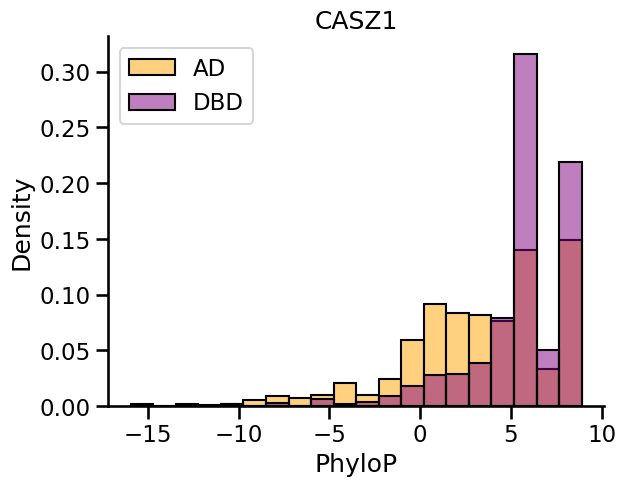

VAX1


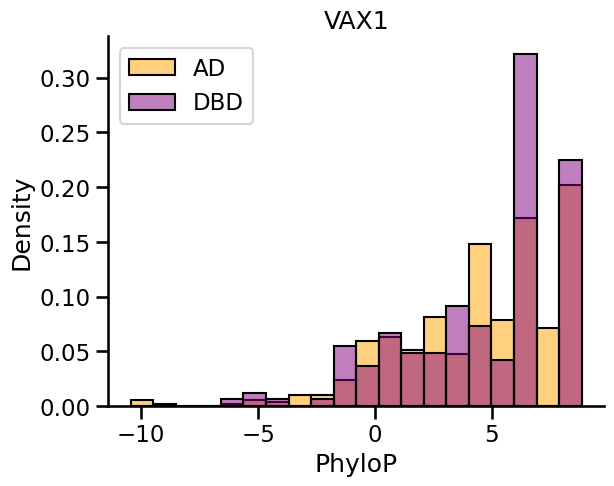

FOXI3


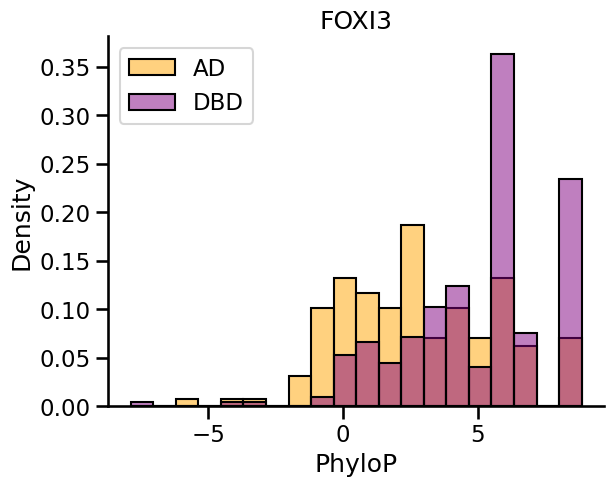

ARNT


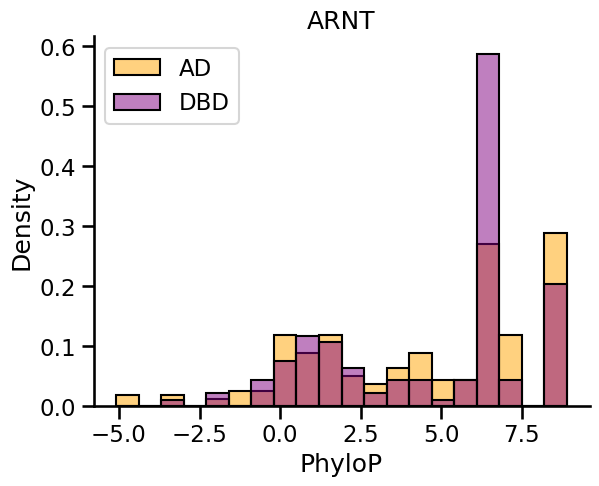

TEAD2


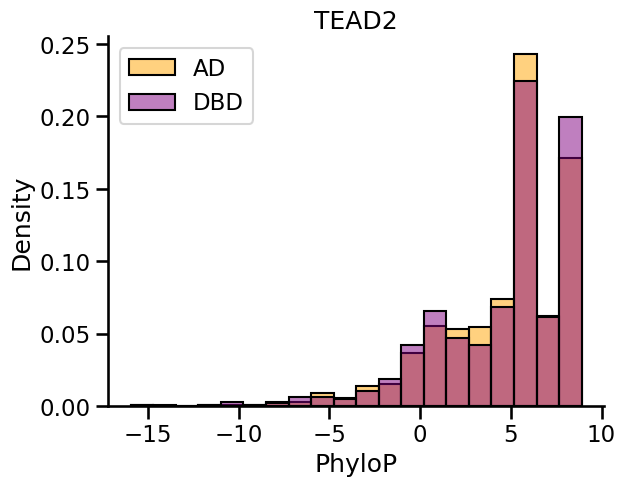

ZNF280D


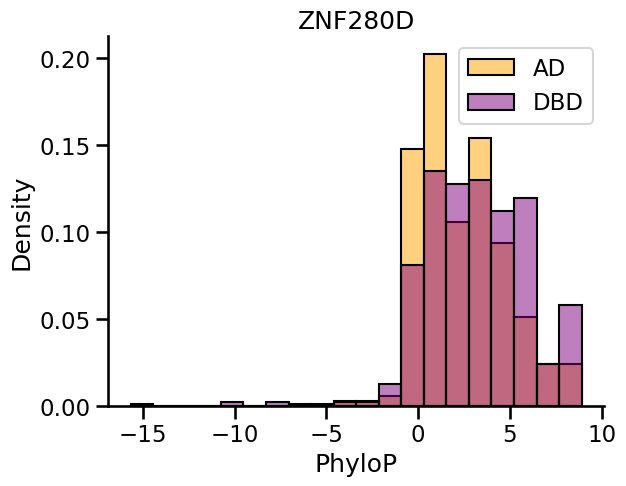

HAND2


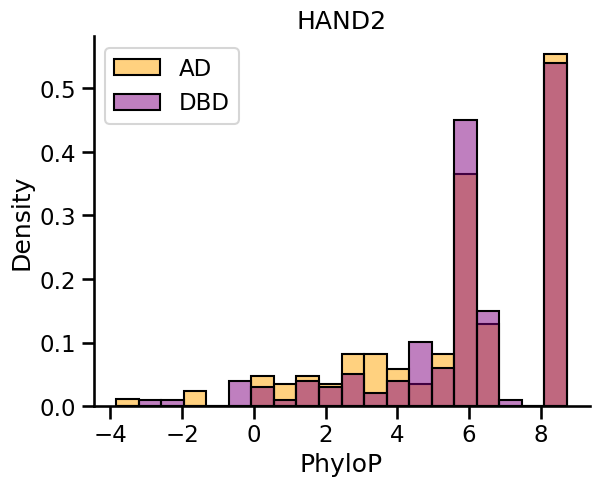

MEIS2


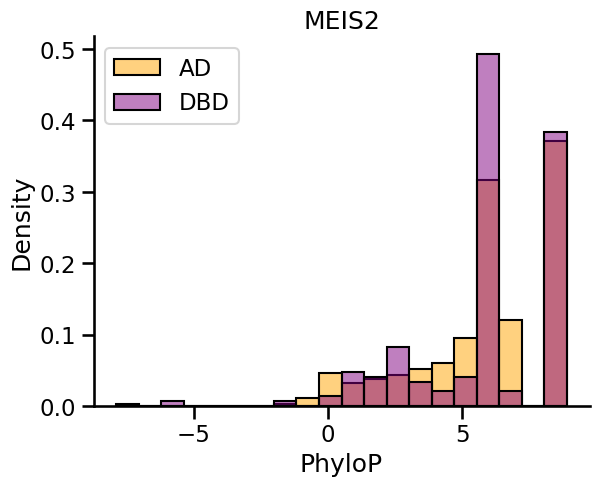

HMGA1


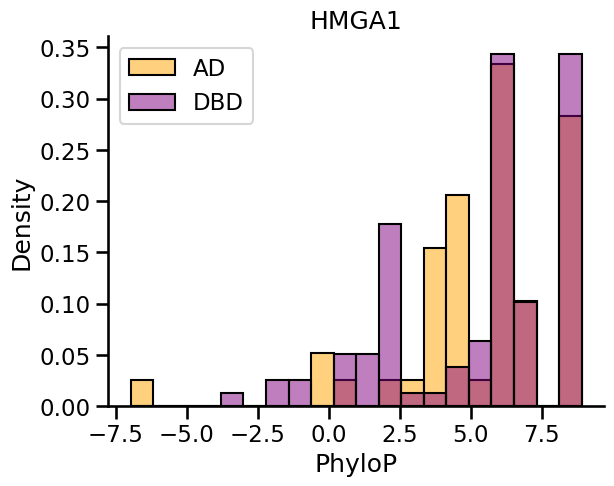

GLI3


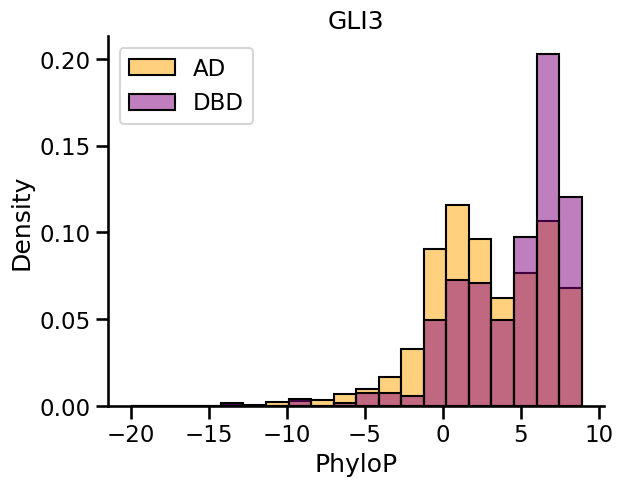

FOSL1


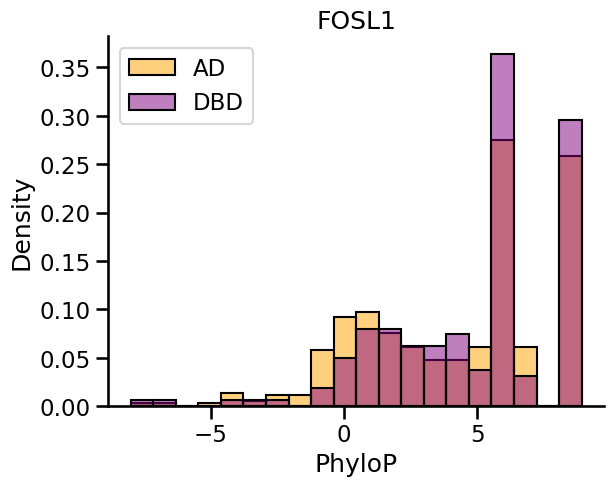

GLI2


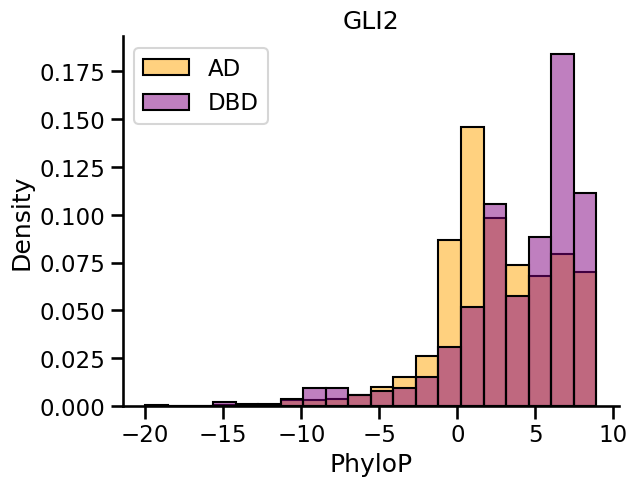

NR1H2


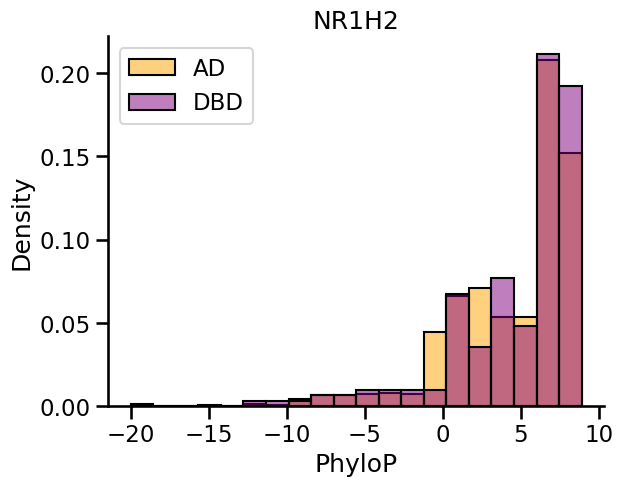

TEF


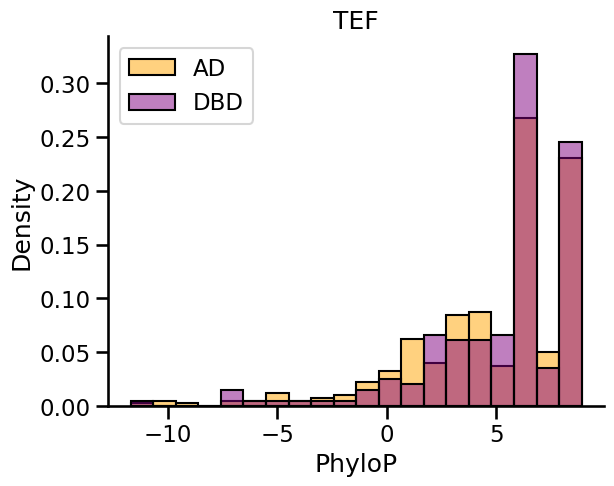

ZNF592


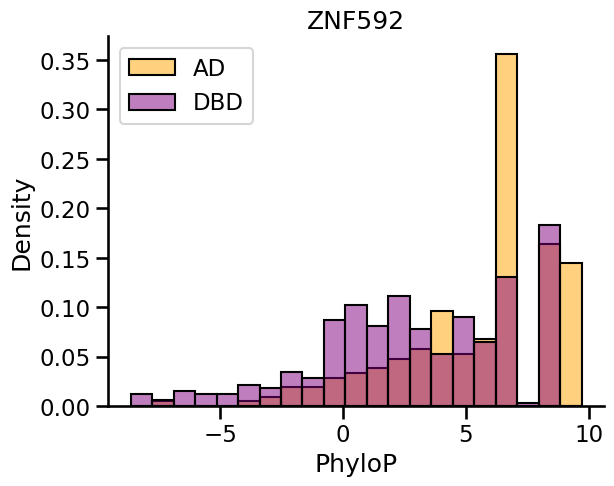

FOXA2-HNF3B - FOXA2


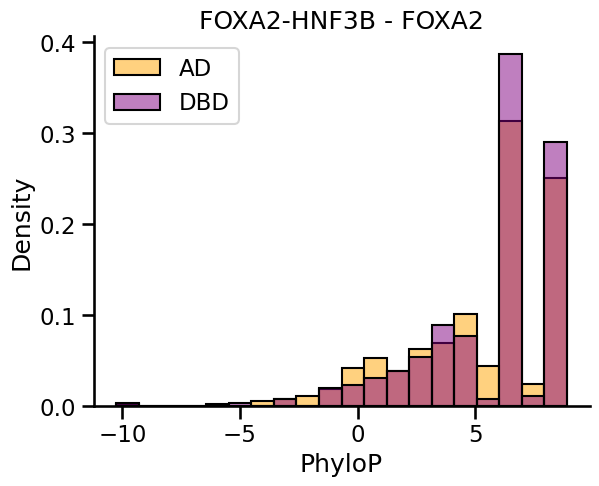

CREB3L2


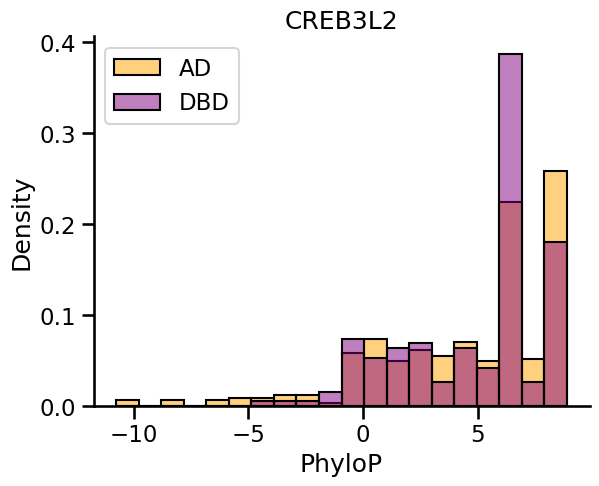

HOXA6


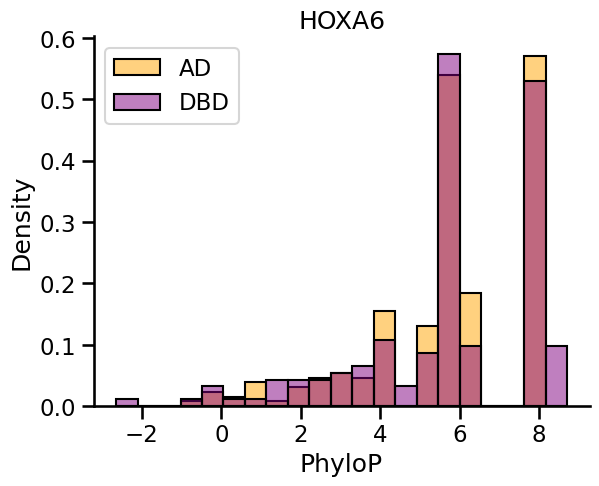

RUNX2


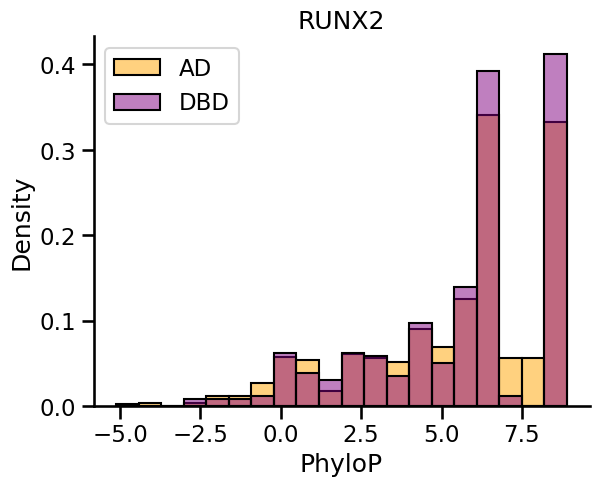

ZFY


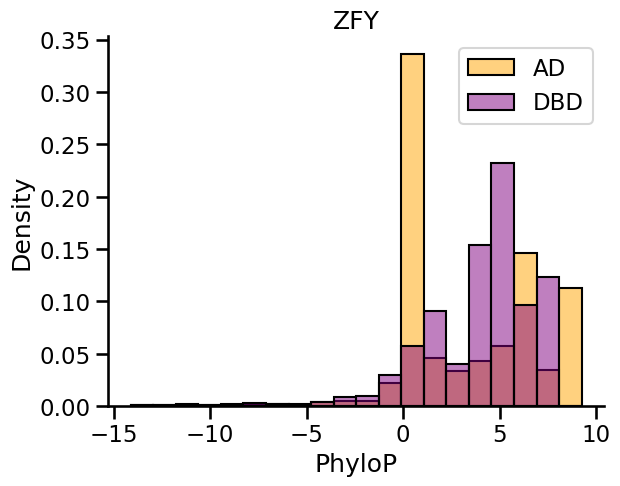

EPAS1


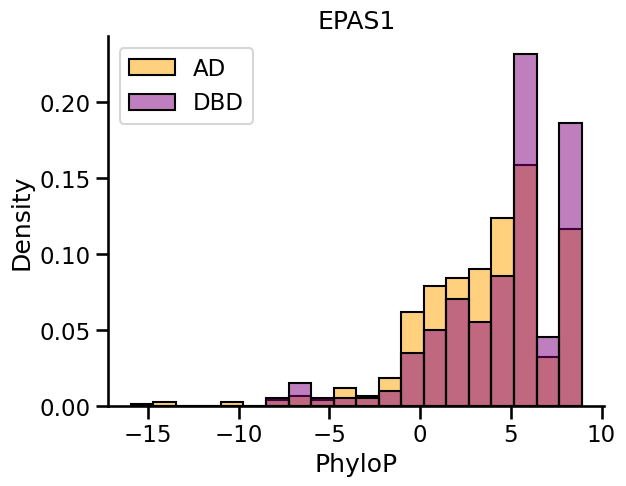

SOX11


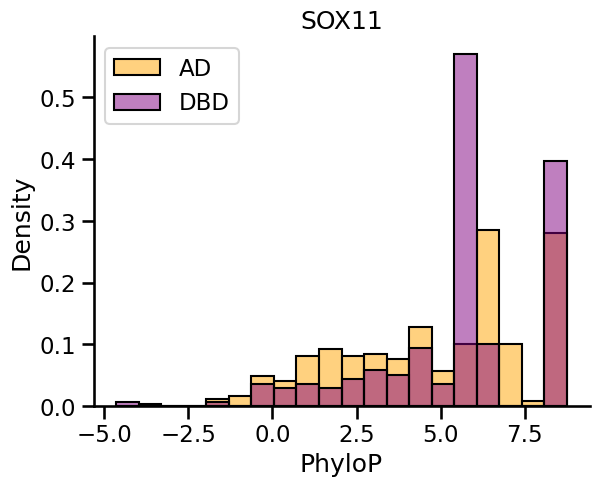

MYBL1


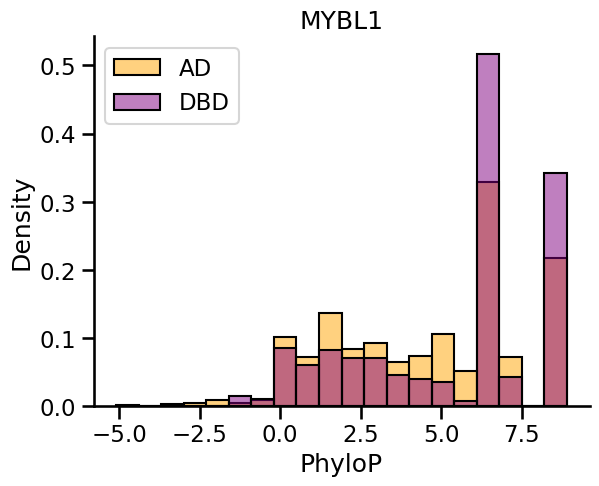

MZF1


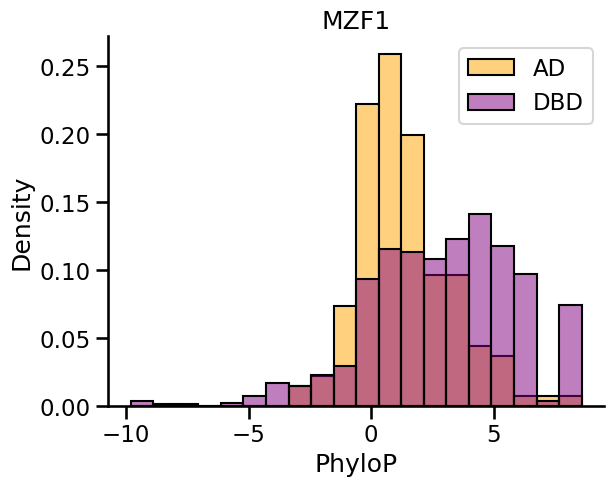

AHR


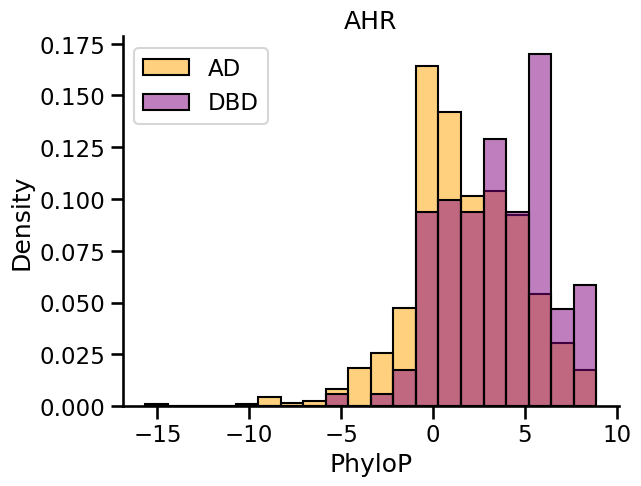

POU3F1


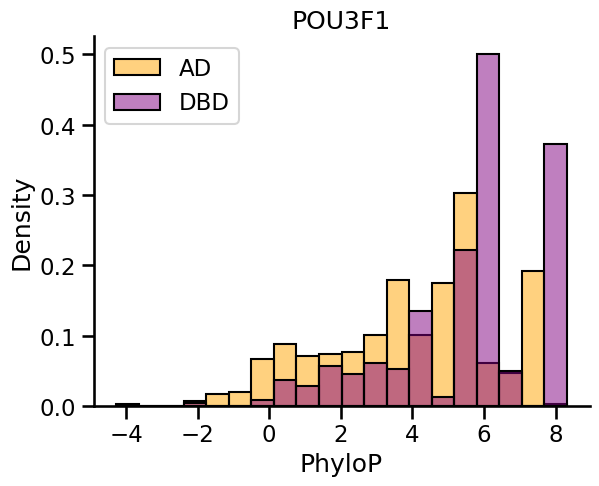

ZNF326


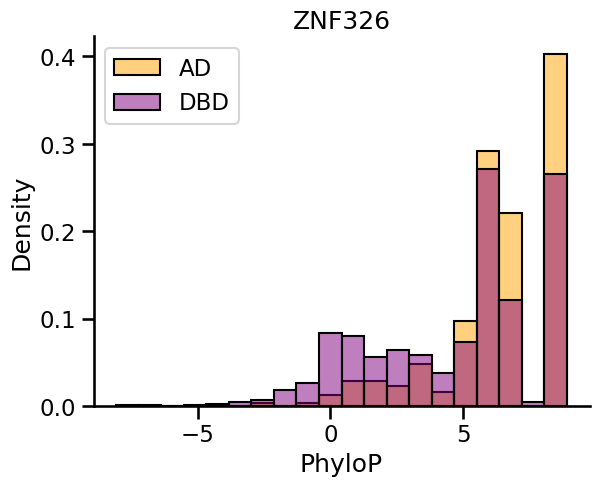

E2F4


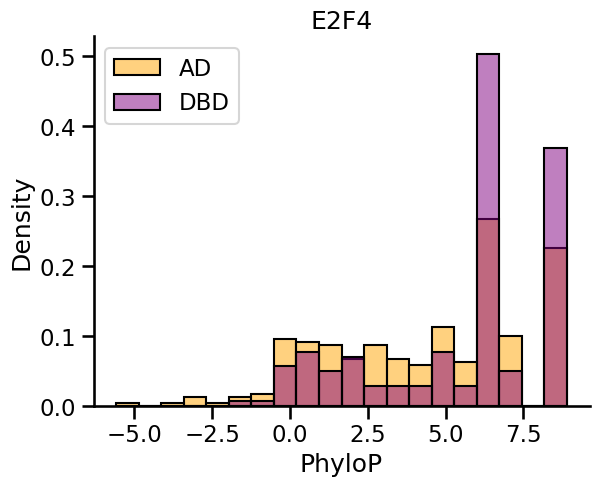

HOXA10


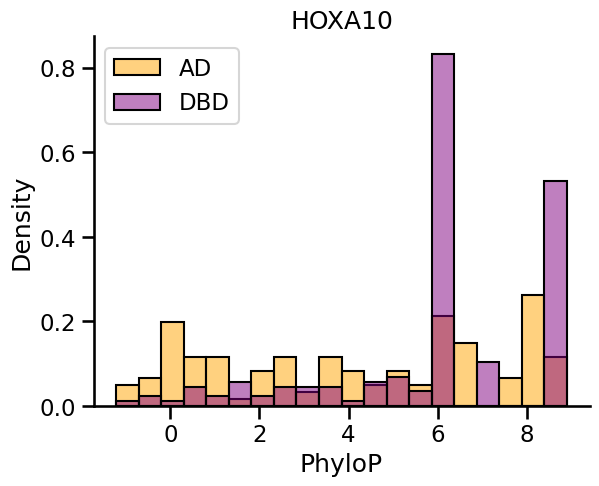

ELF2


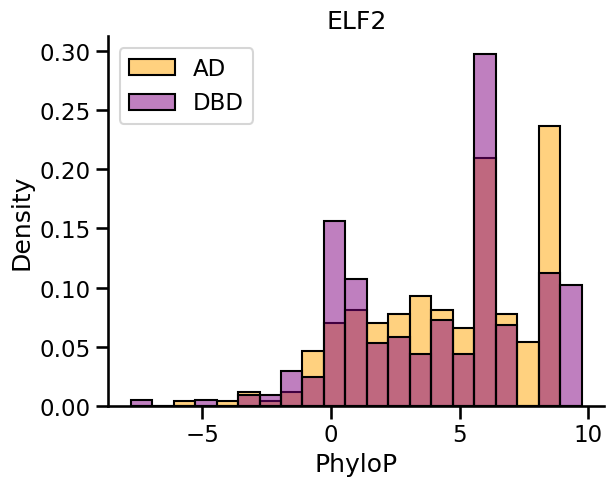

NEUROD1


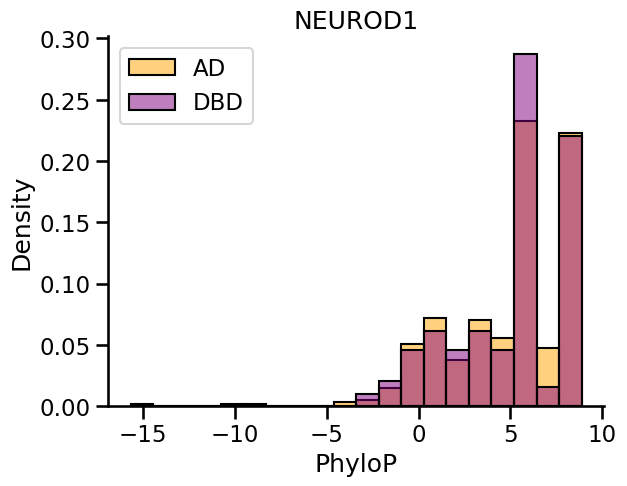

IKZF1


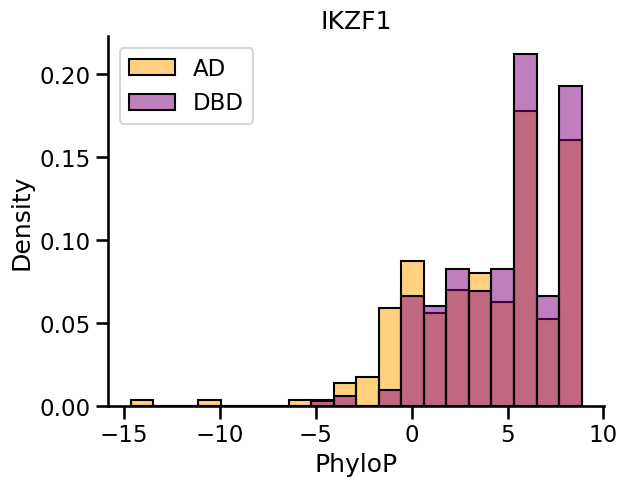

PLAG1


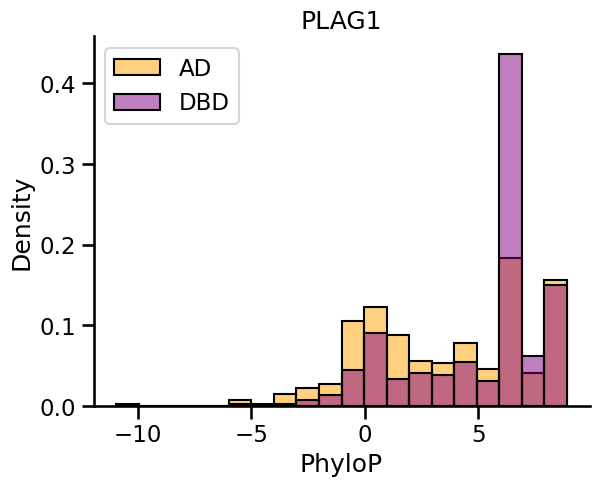

NCOA3


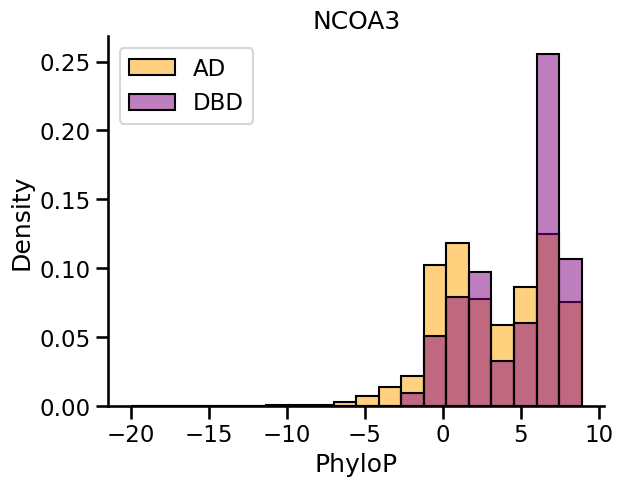

E2F2


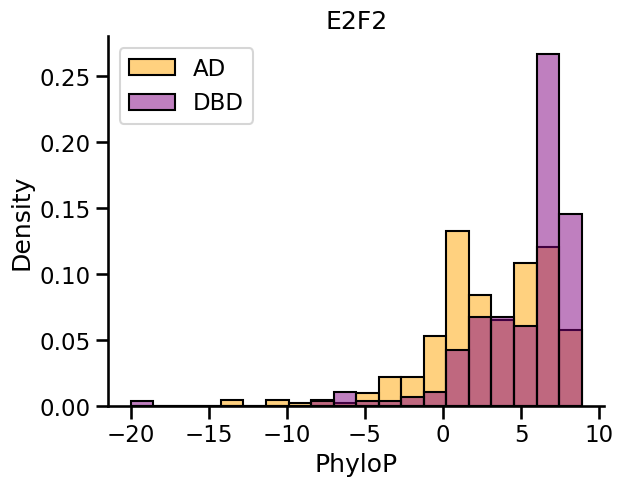

TCF12


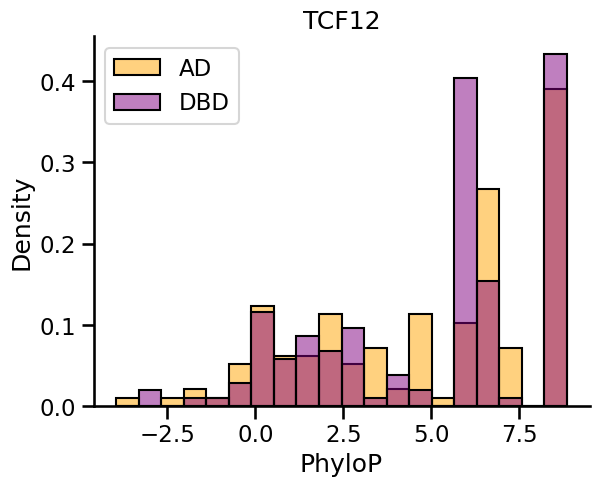

SPIC


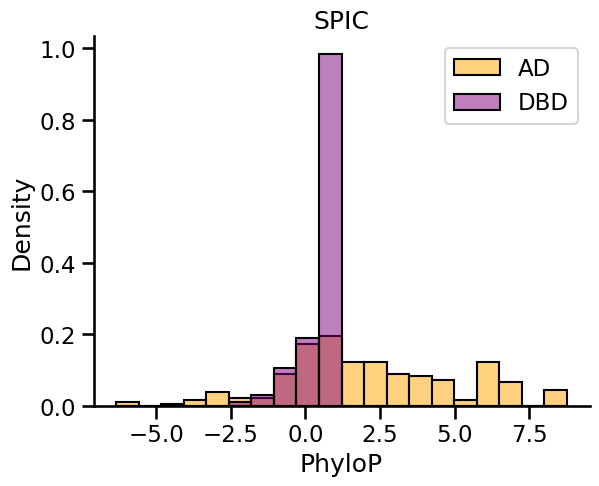

TET1


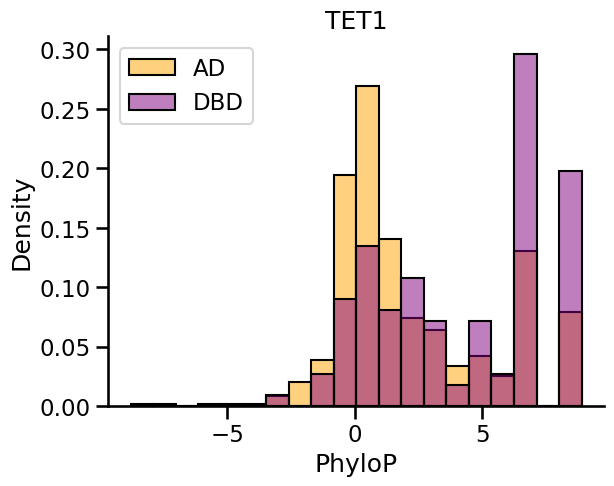

NEUROG1


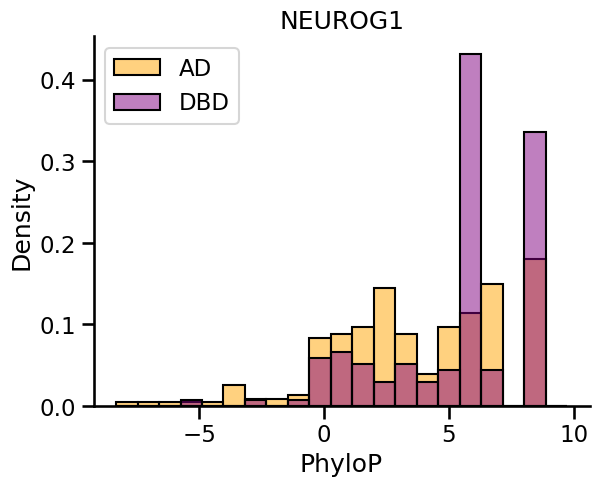

SOX2 - SOX-2


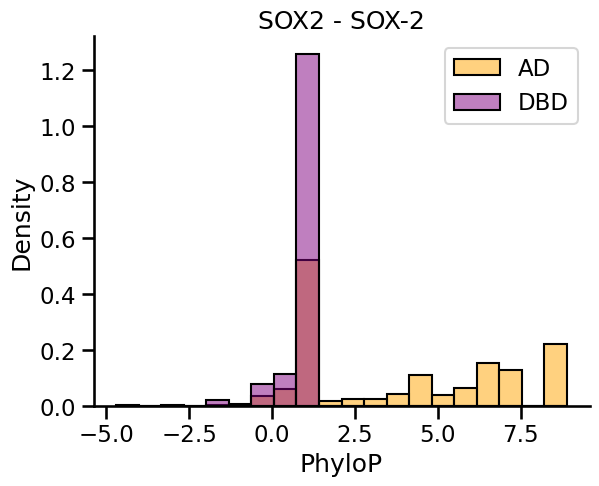

MYCN


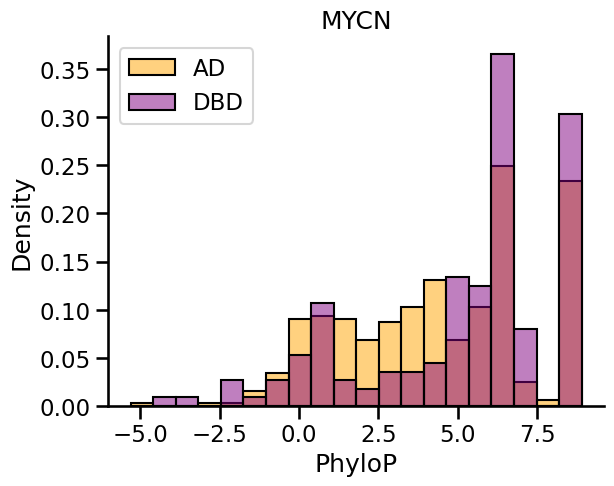

ETS1 - c-ETS1


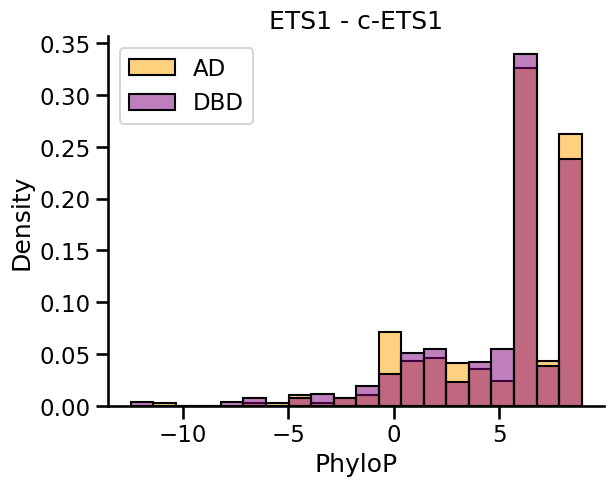

MEIS1


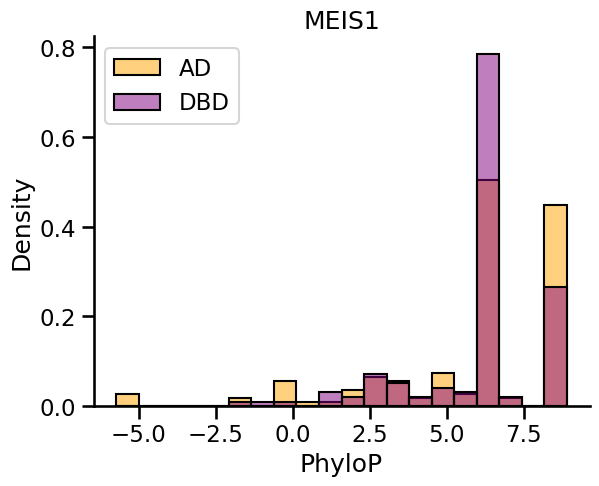

GATA1


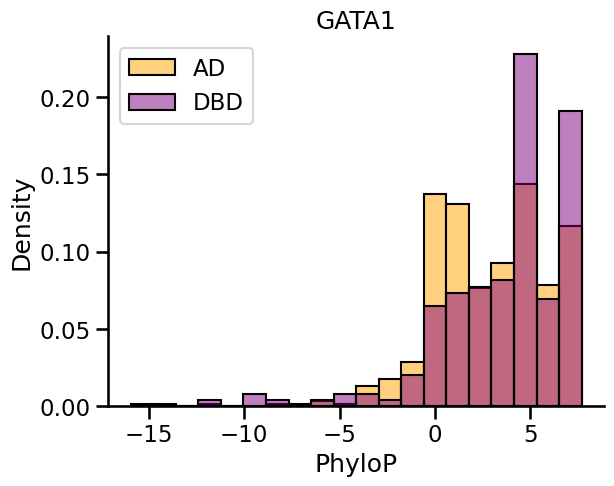

THRA


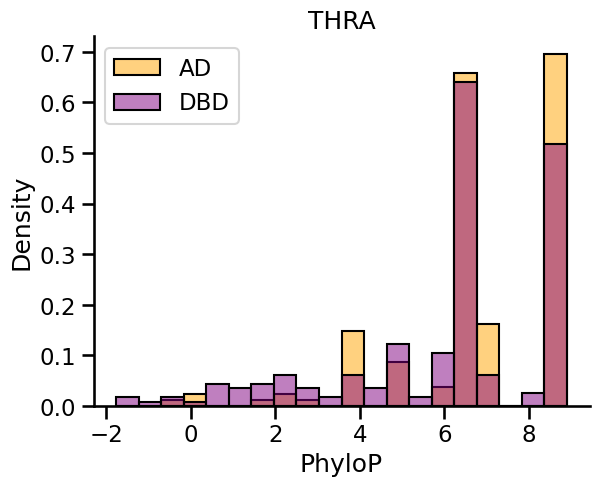

JRKL


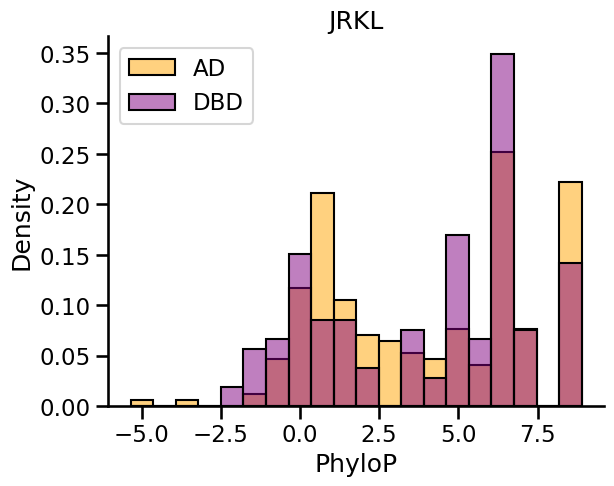

PDX1 - PDX1 - PDX-1


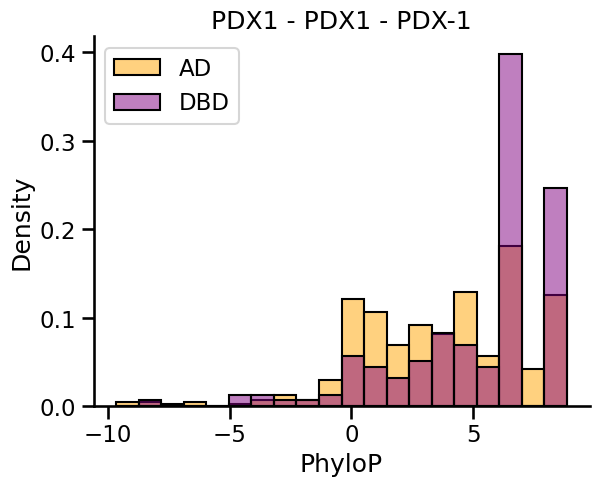

FOXJ1


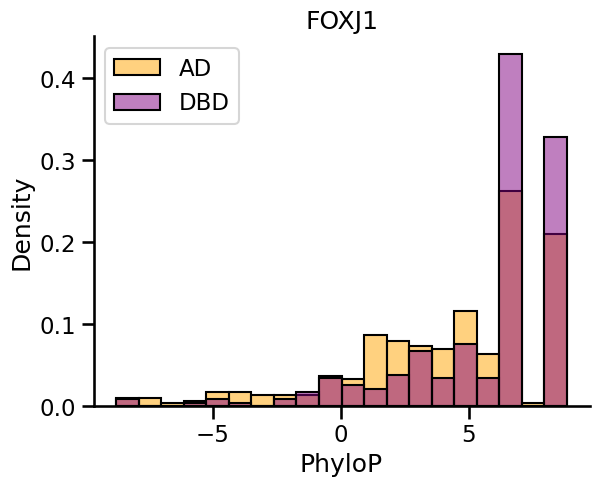

PRRX2


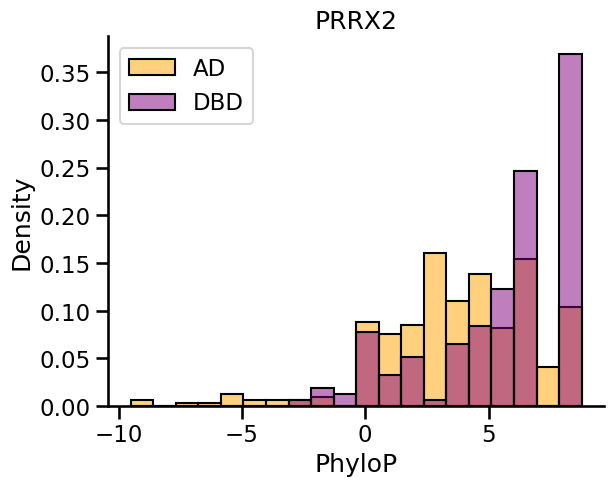

PRRX1


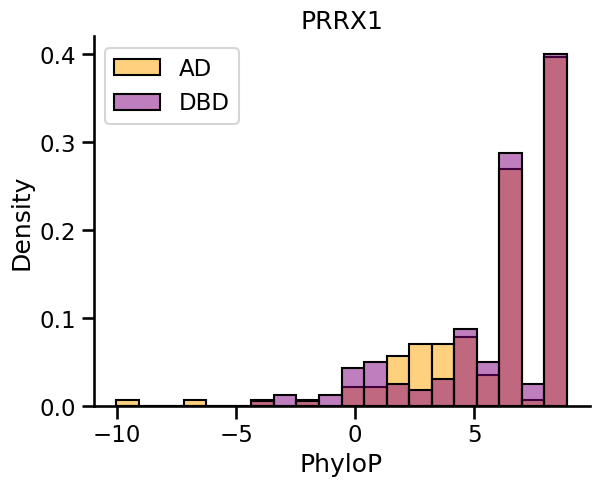

ESR2


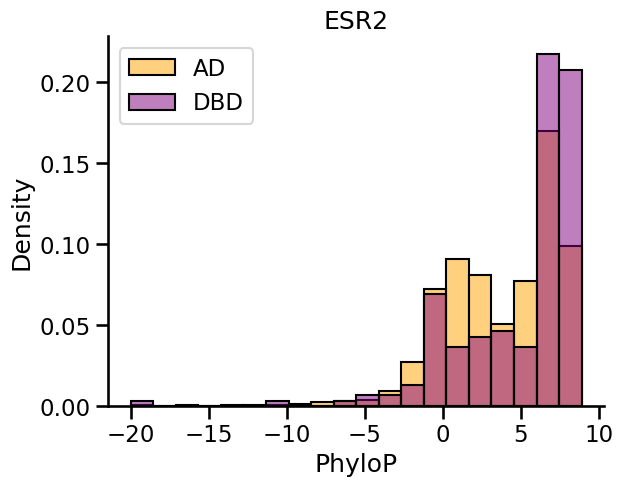

EBF3


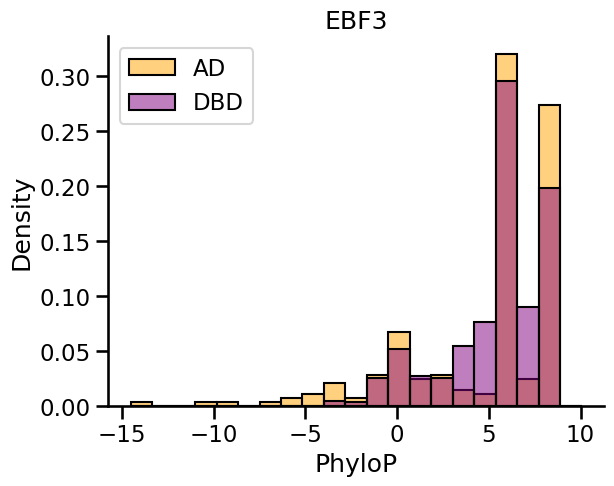

FOXR1


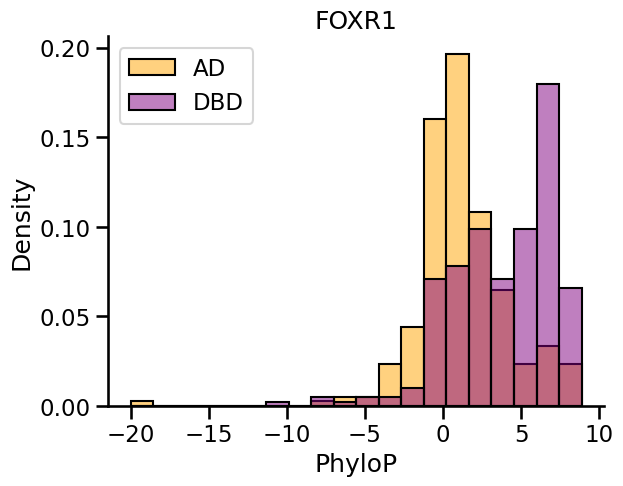

NR1I2


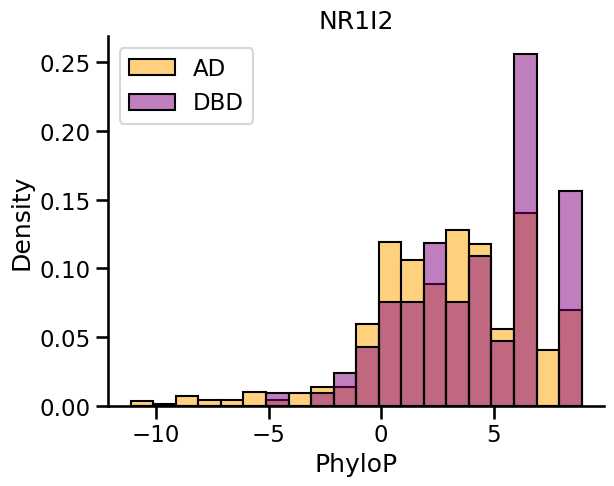

SOX15


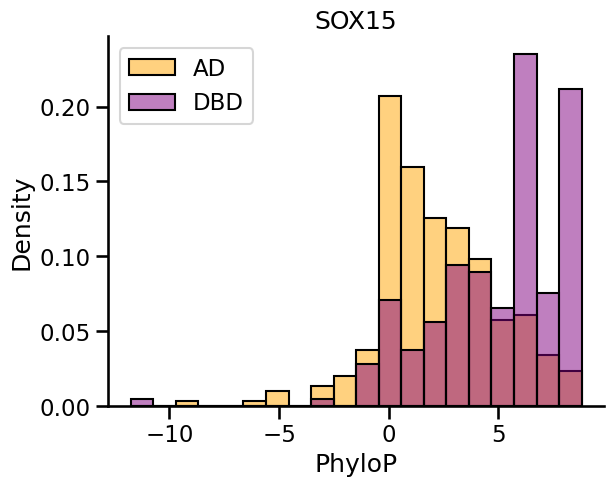

ALX1


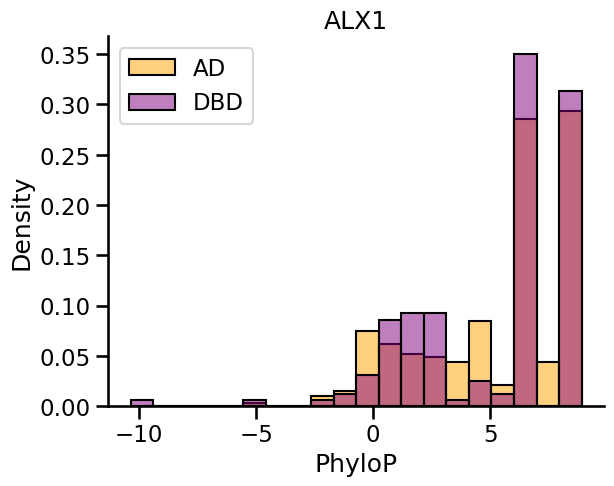

EGR4


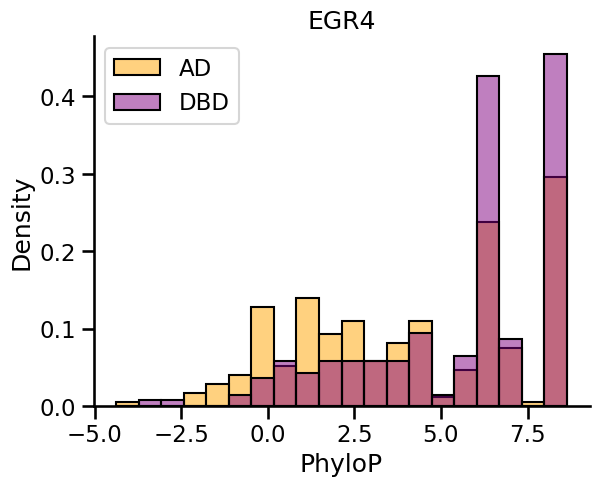

EGR2


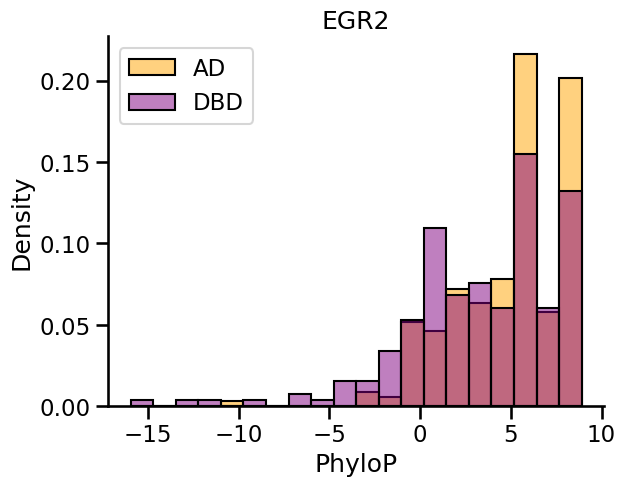

IRF2


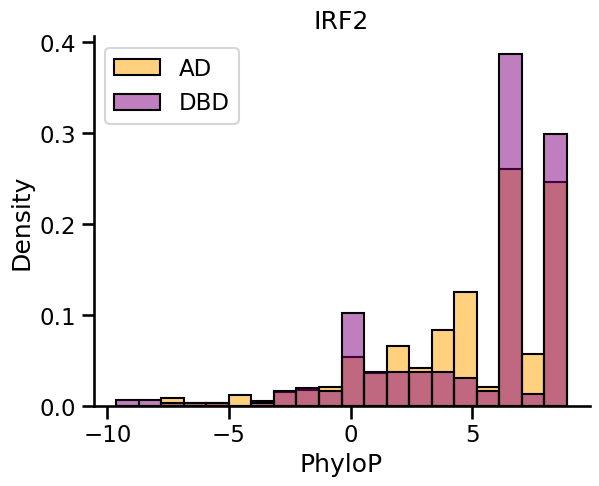

PAX2


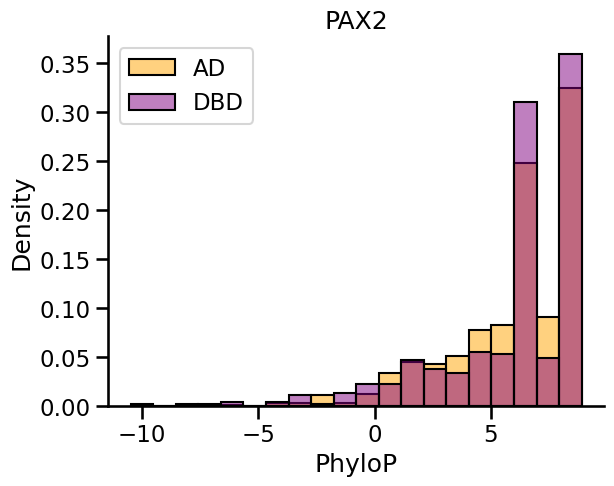

ARNTL


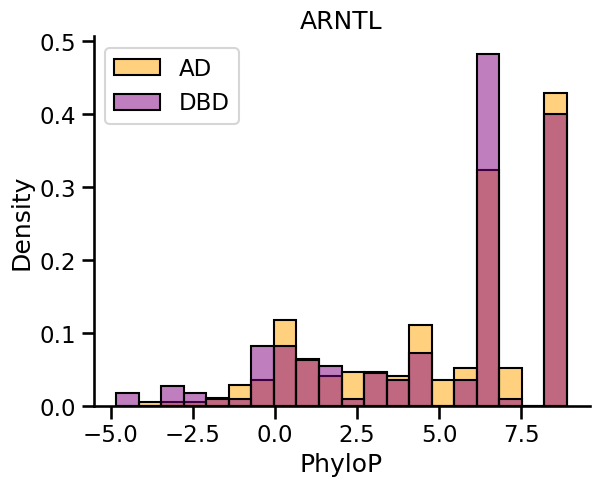

CRX


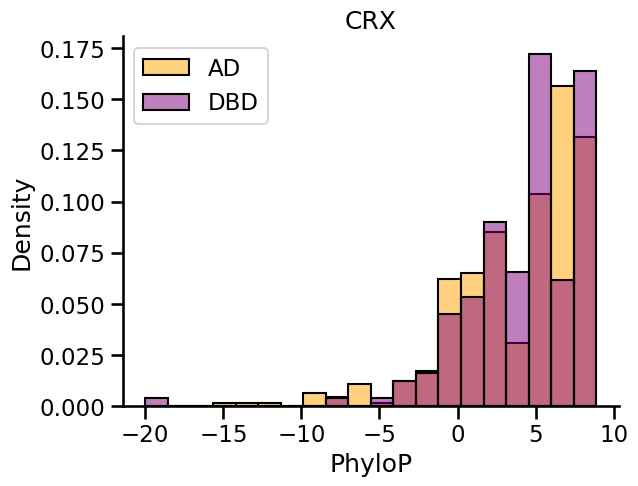

TEAD1-TEF1


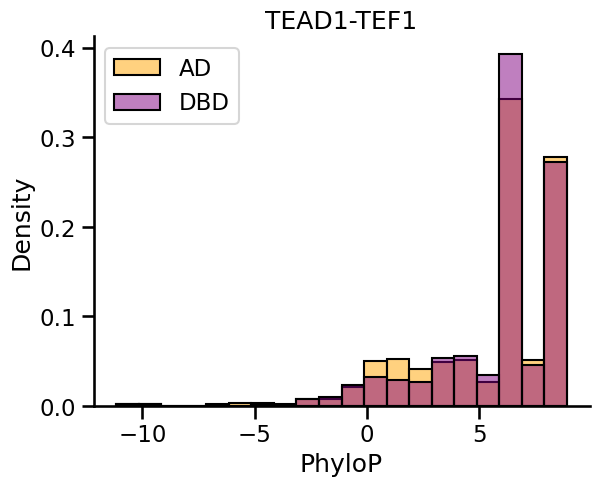

PPARD


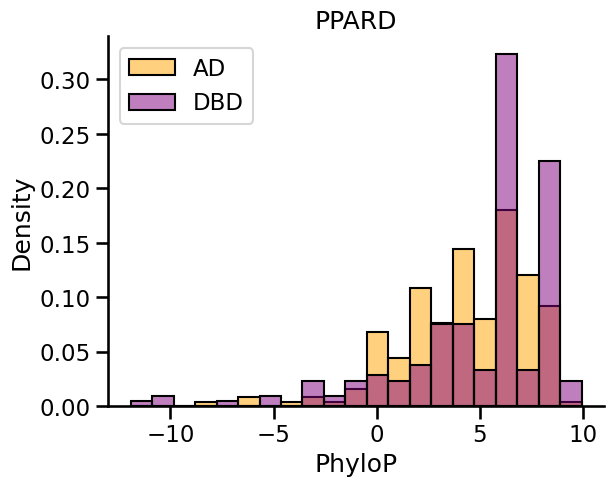

E2F3


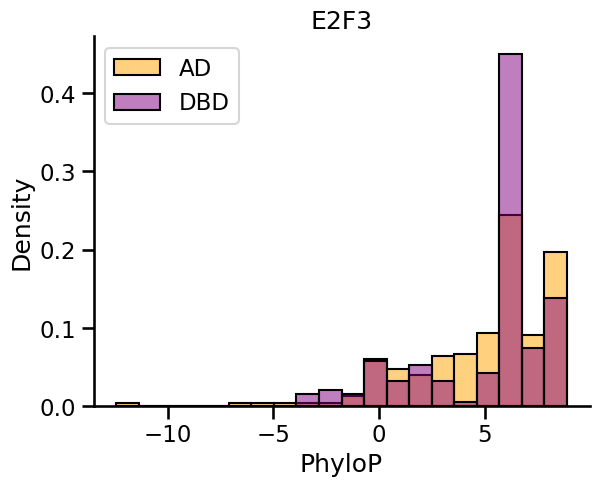

FOXR2


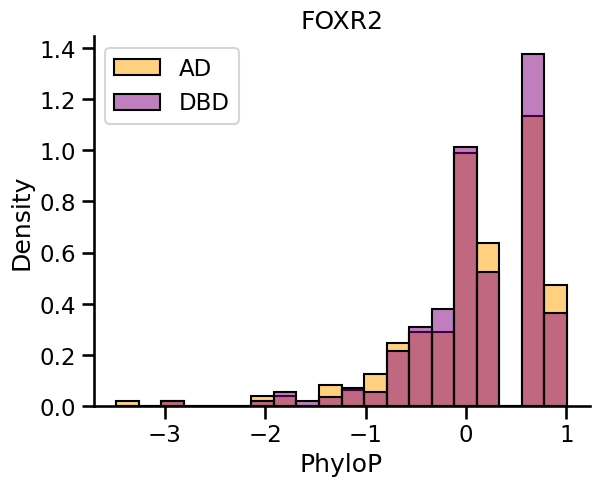

EBF1


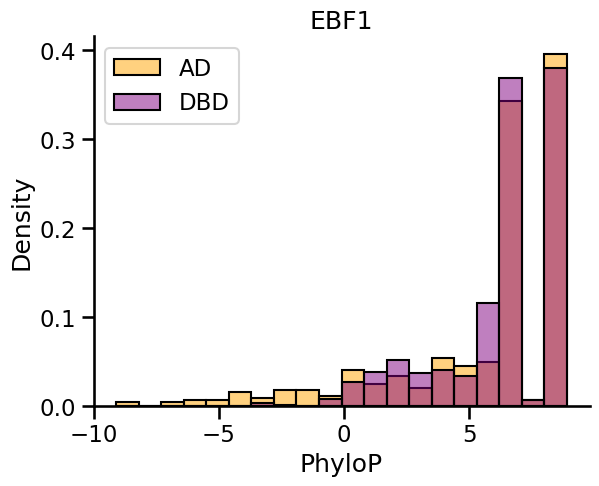

ZN513


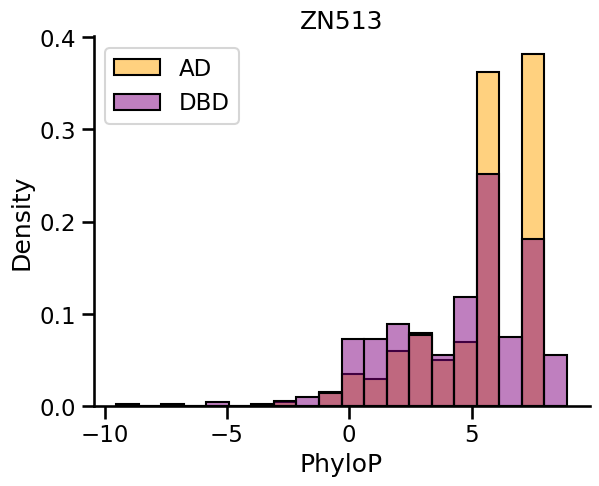

CDX2


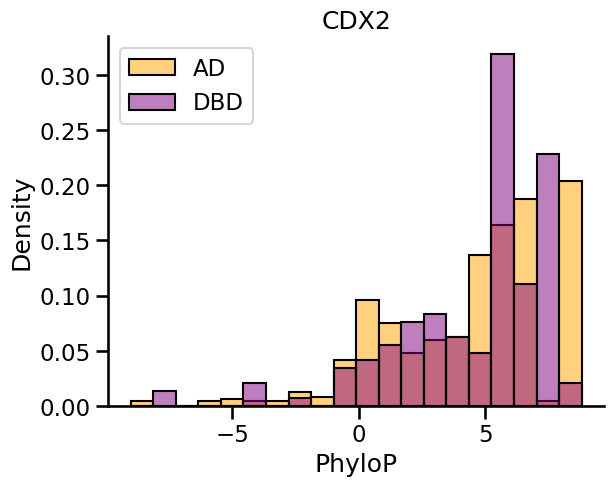

MYRFL - MRFL


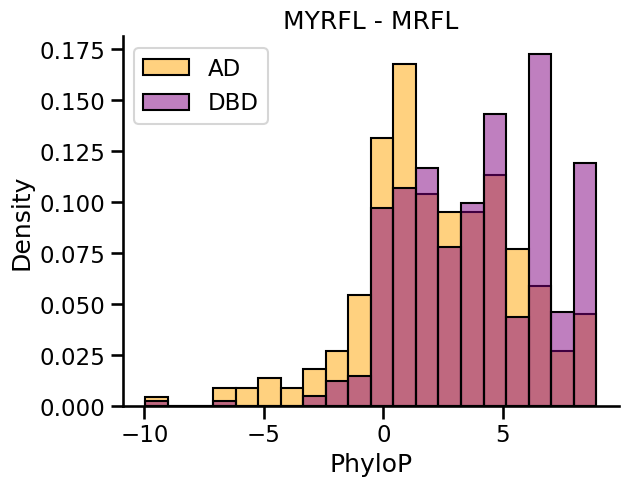

ATF2-CREB2 - ATF2


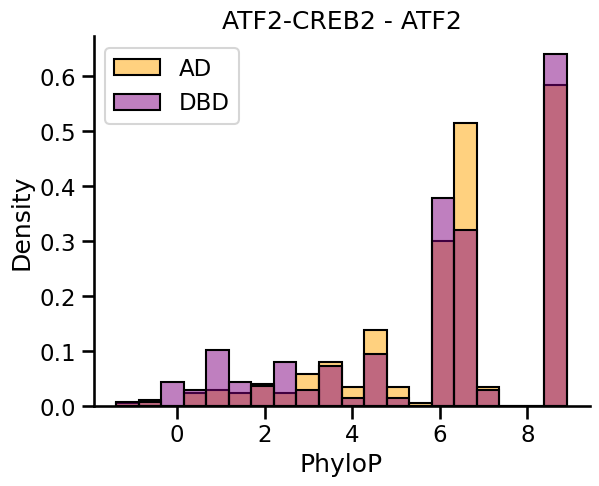

LMX1A


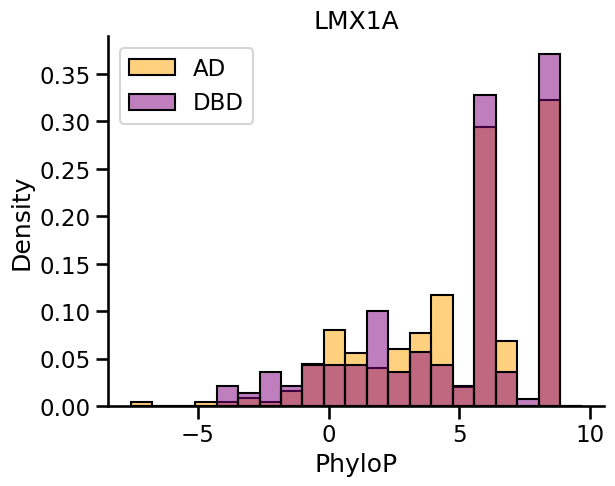

RORC


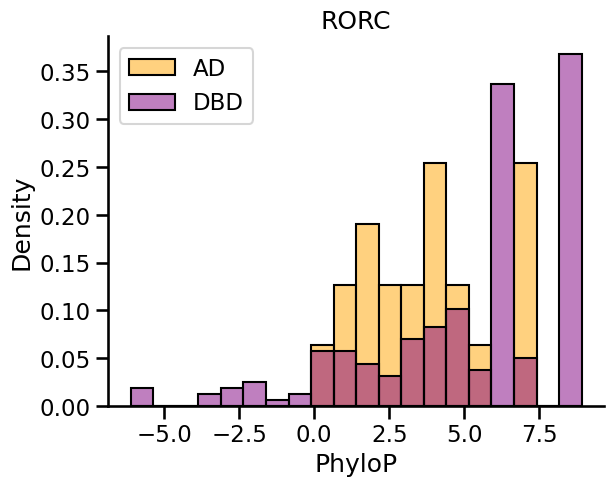

GLIS2


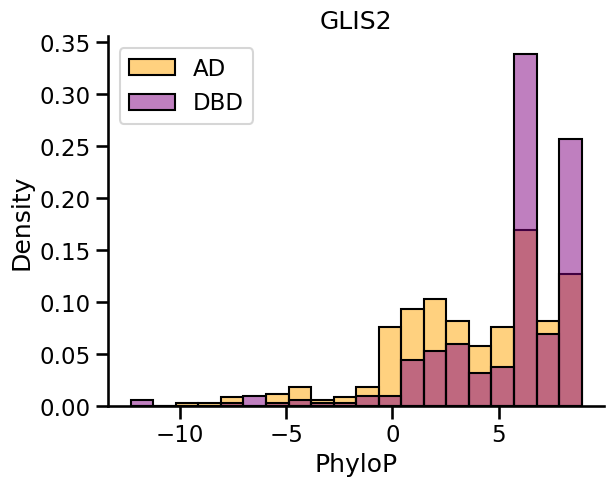

PAX8


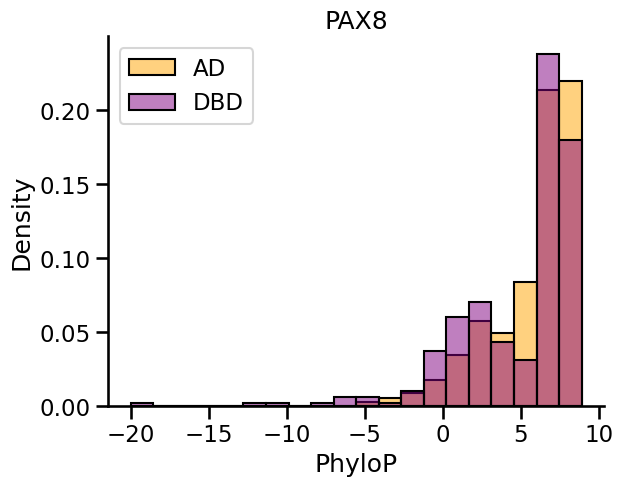

FOXM1


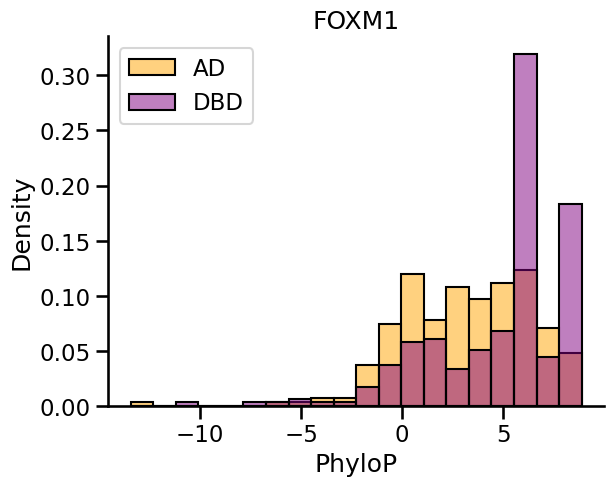

IRX4


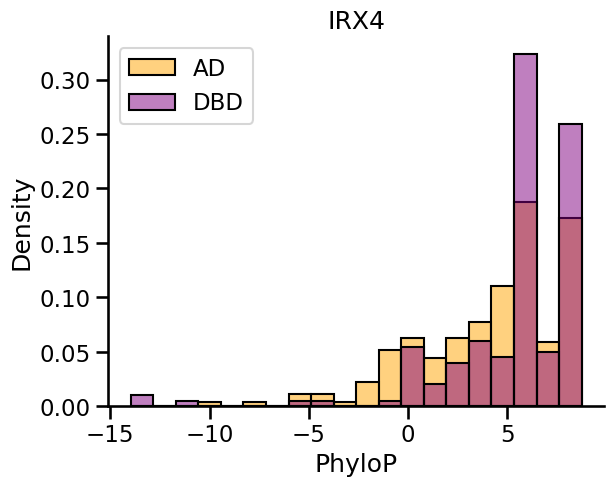

RORA


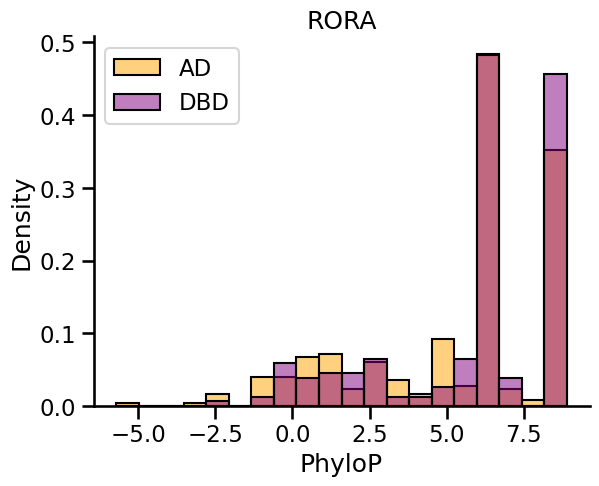

SOX10


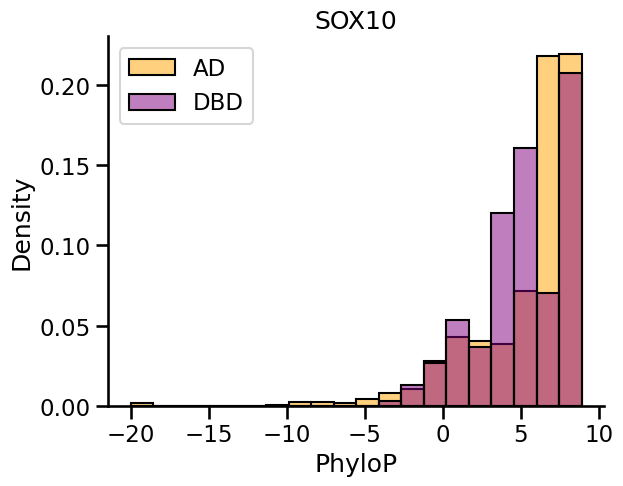

GRHL2


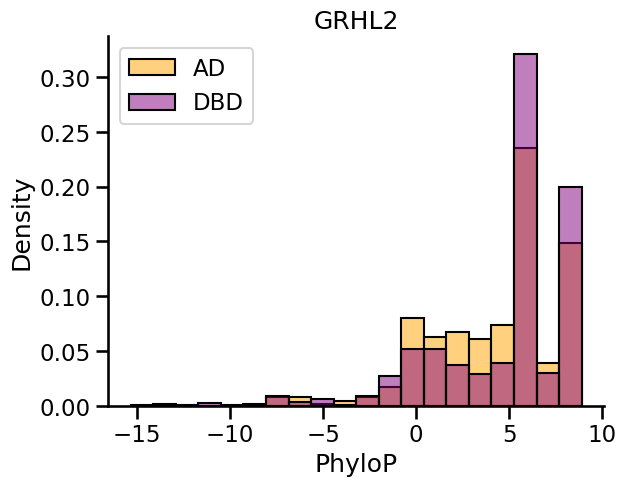

ZNF687


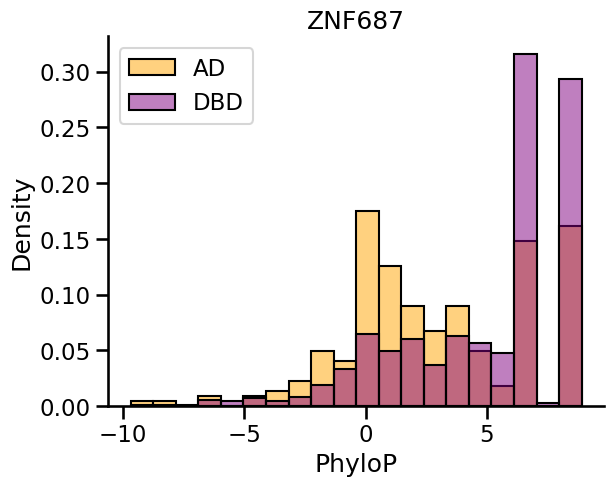

E2F1 - E2F-1 - E2F1


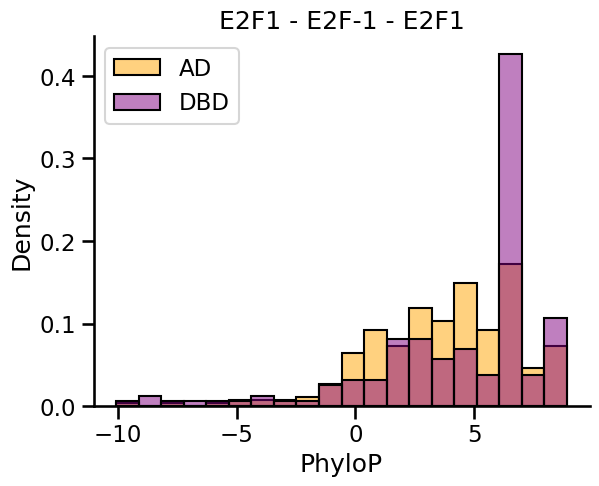

TWIST1


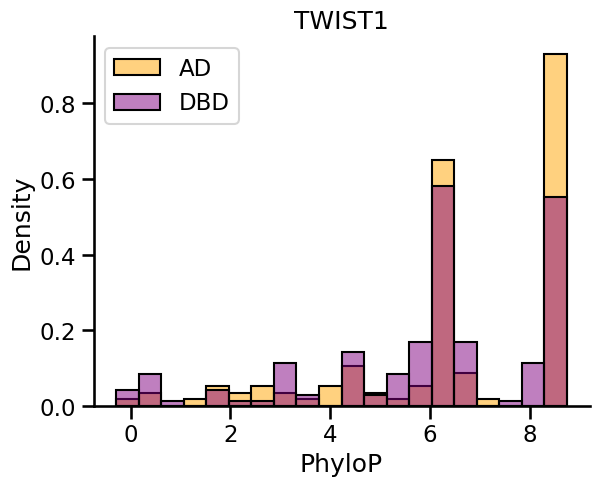

OTX1


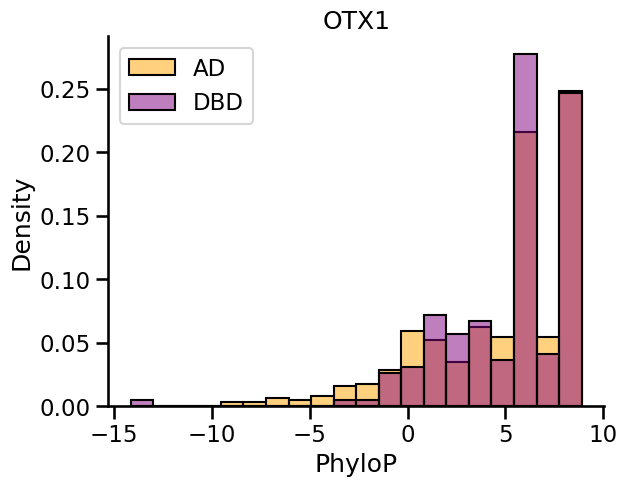

RUNX1 - RUNX1-AML1


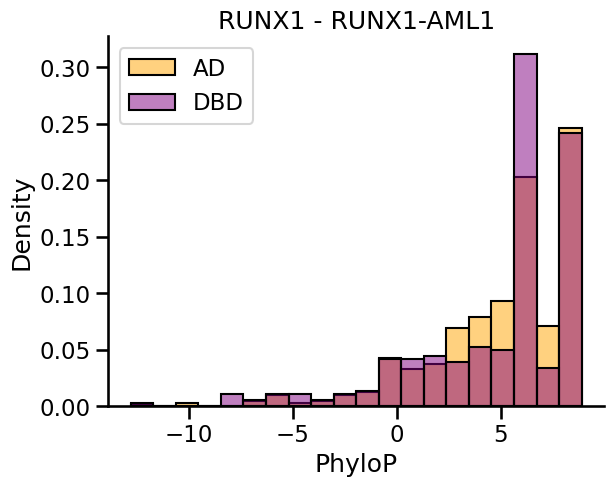

ETV3


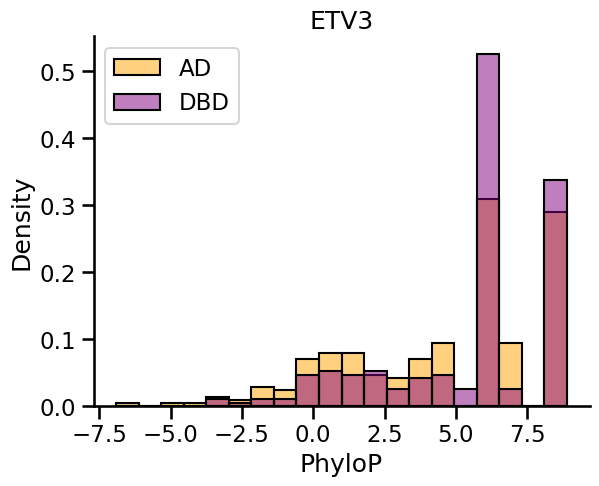

ZSCAN20


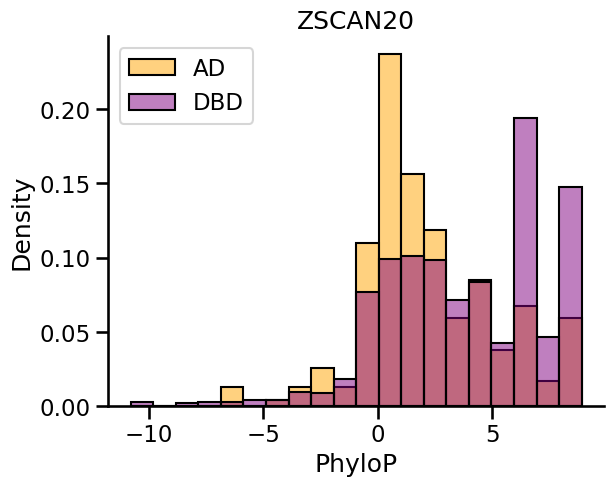

DLX3


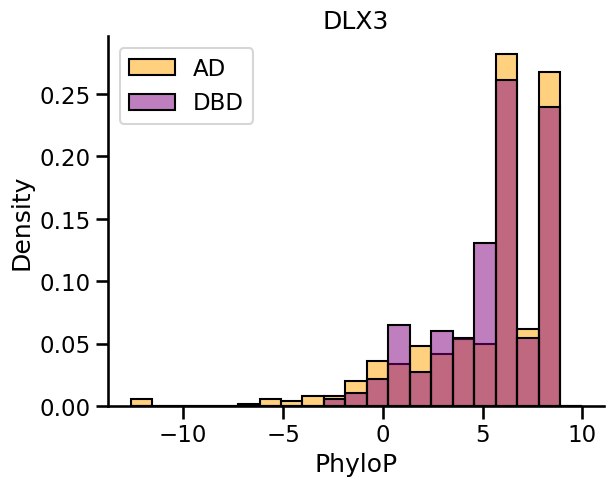

PAX9


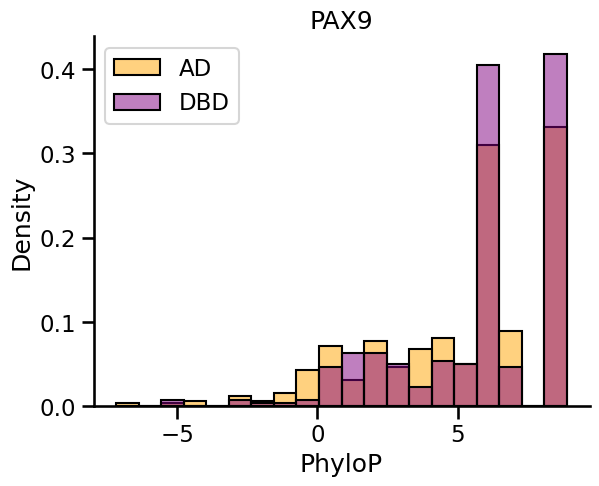

YY1


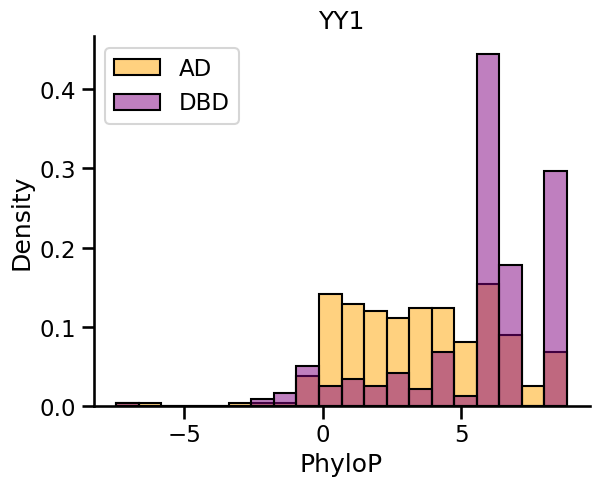

ATF4


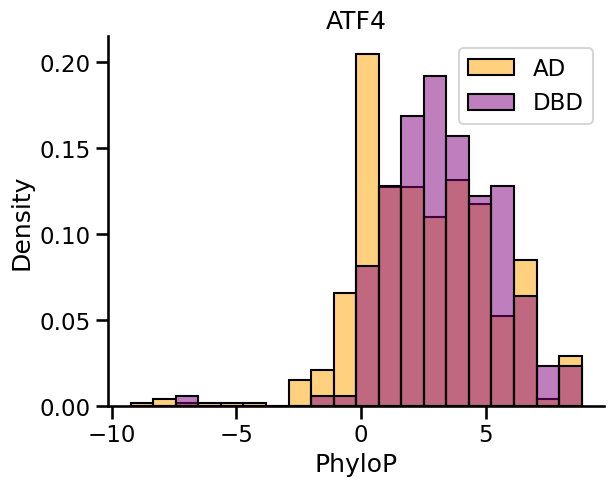

PRMT3 - ANM3


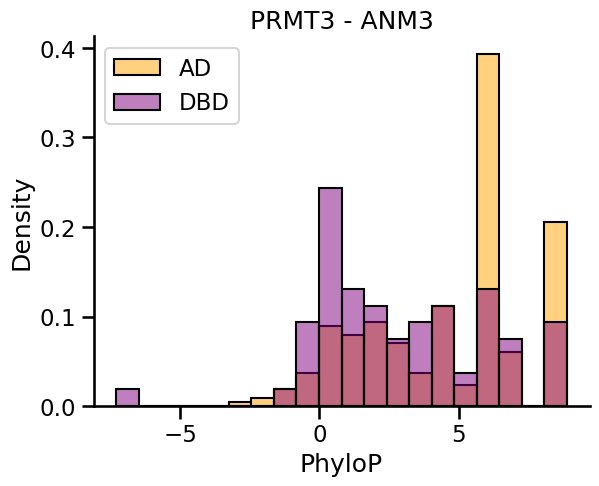

ZN654


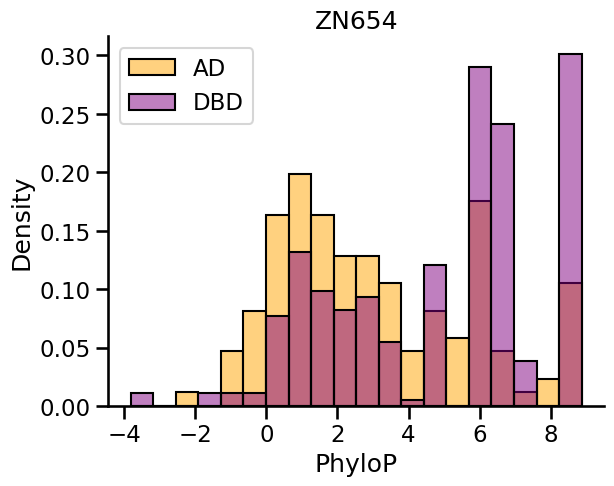

RARA


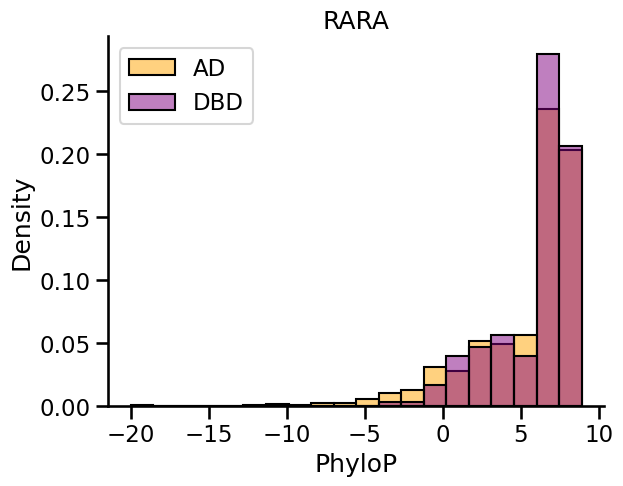

STAT2


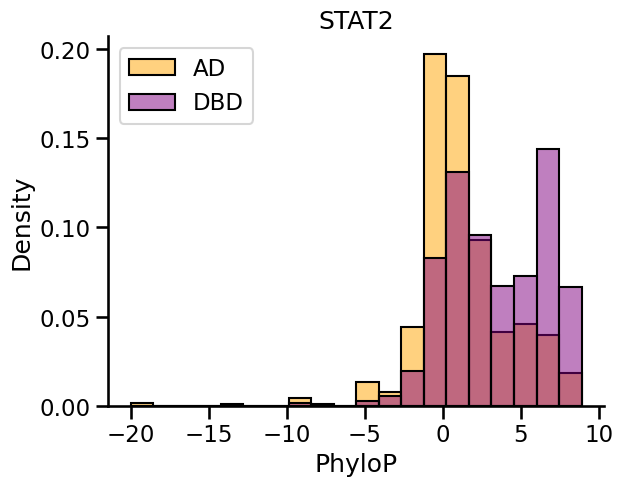

LEF1


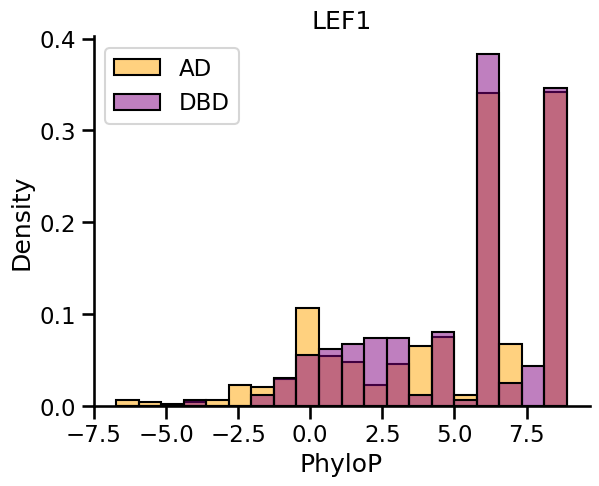

FOS


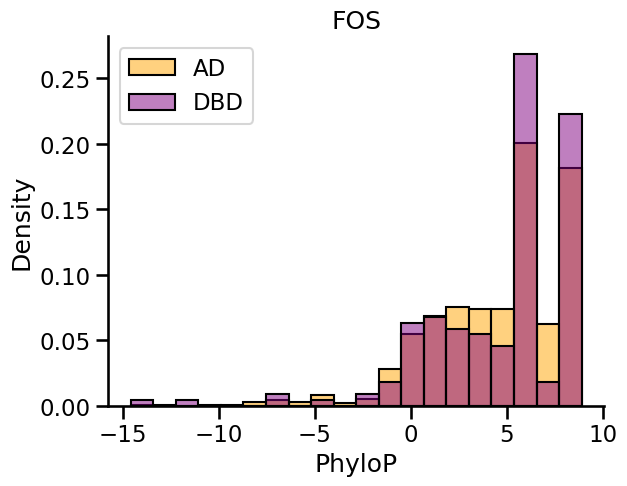

RXRG


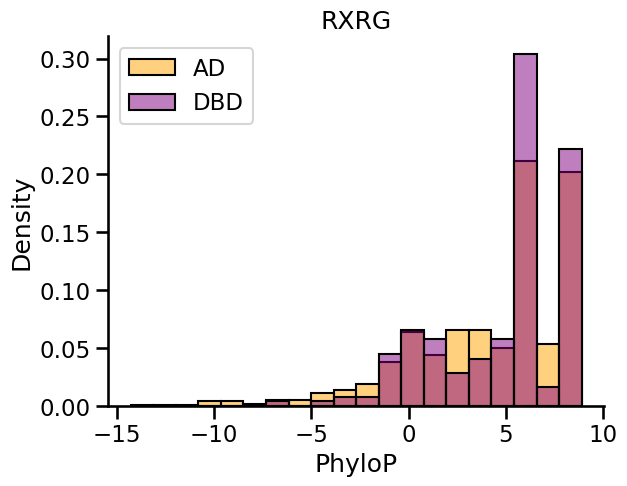

NFATC3


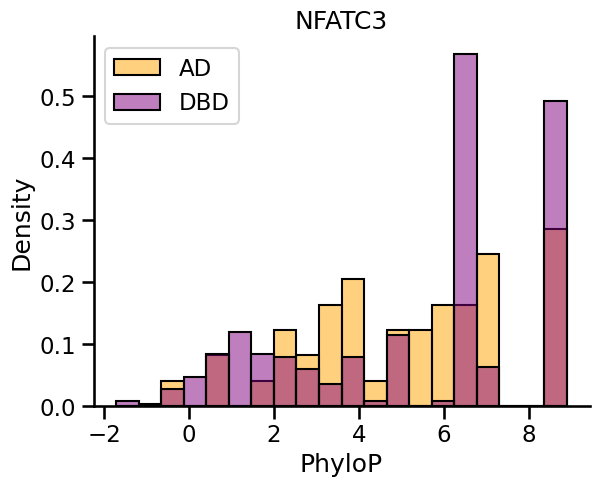

HLF


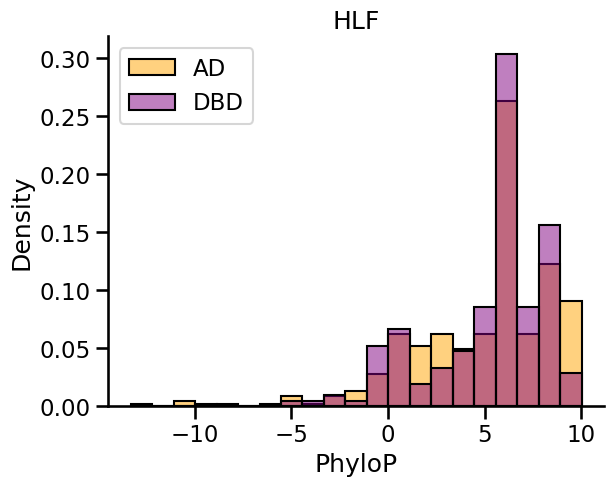

FOXO3


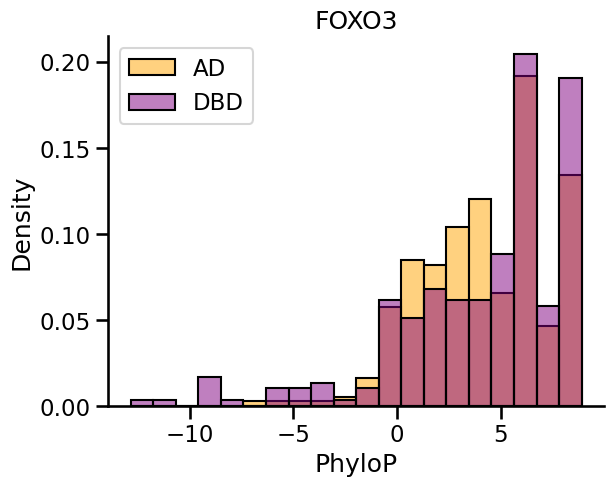

ELK4-SAP1 - ELK4


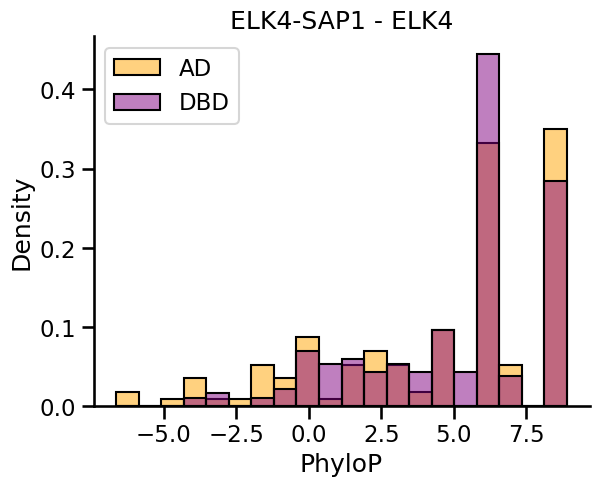

GLIS1


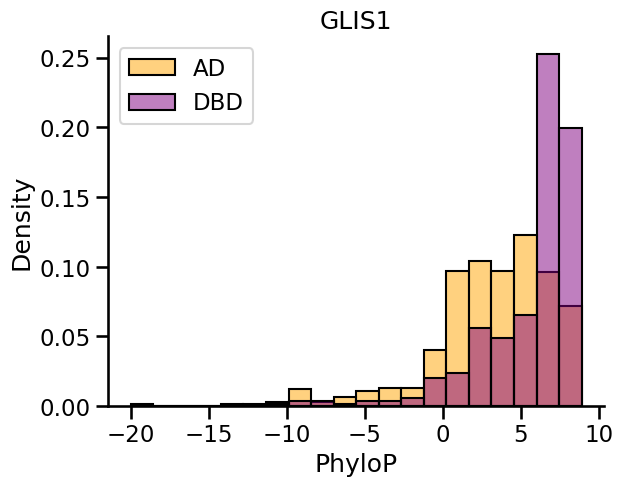

HOXB9


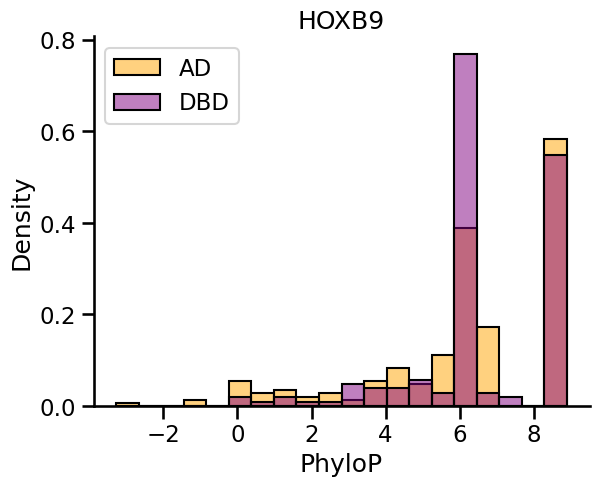

KLF1


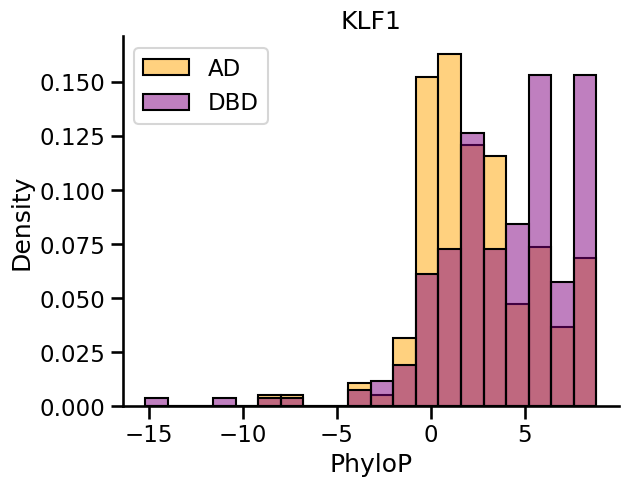

MYCL


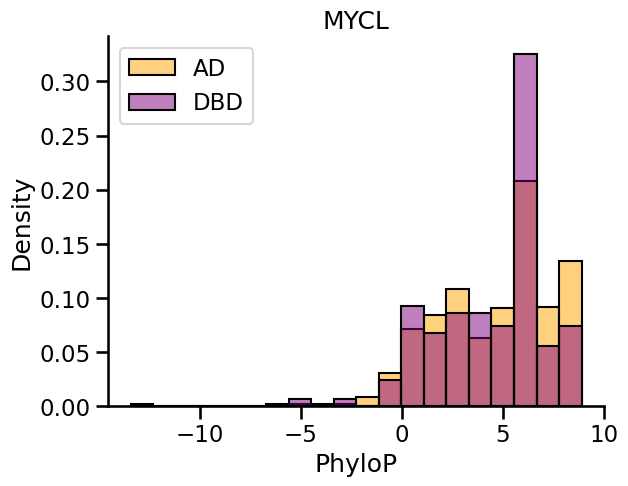

ZNF148


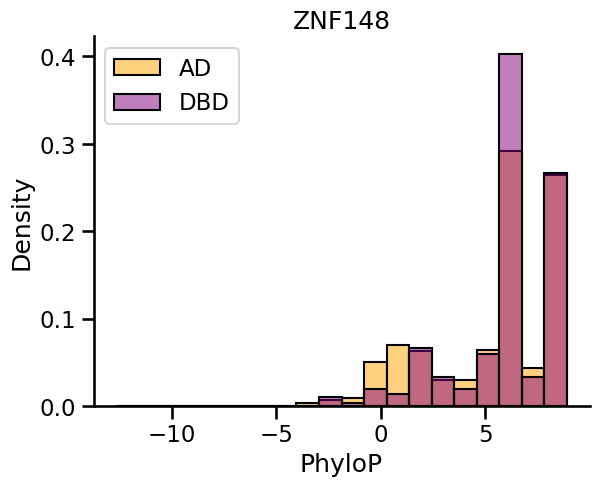

POU2F1


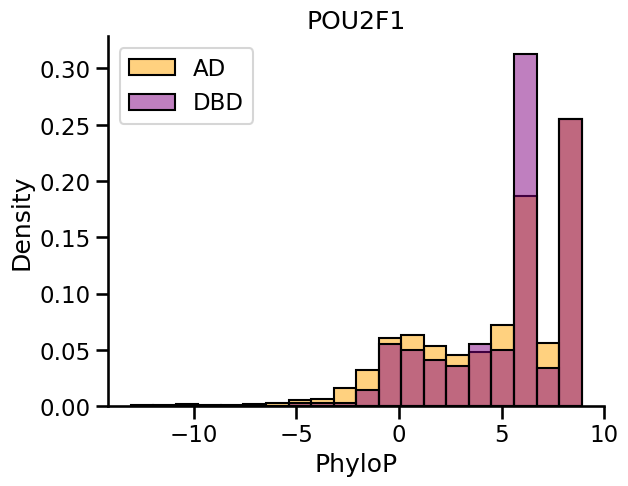

THRB


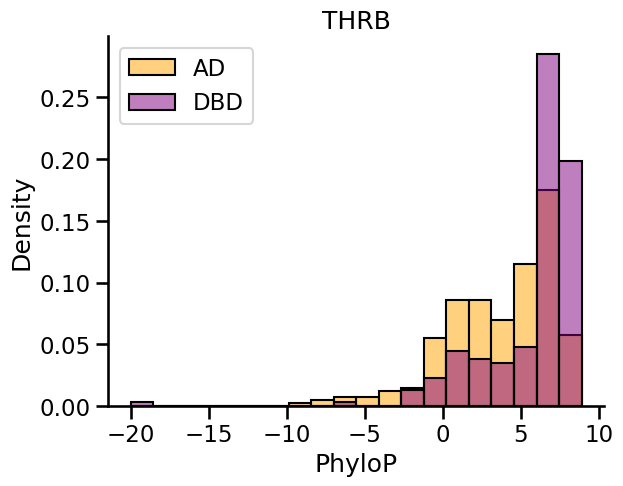

SP6


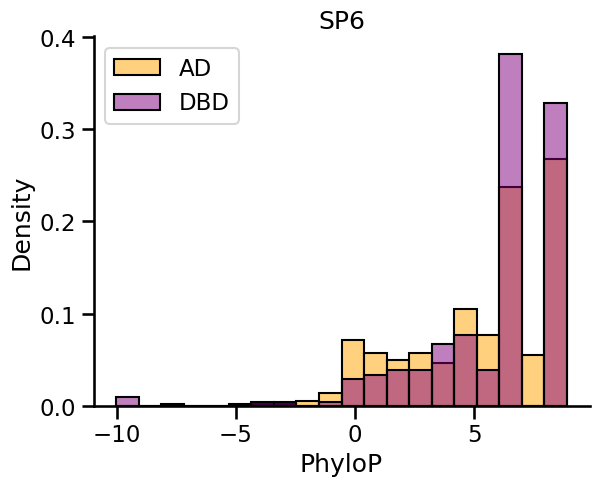

SOX14


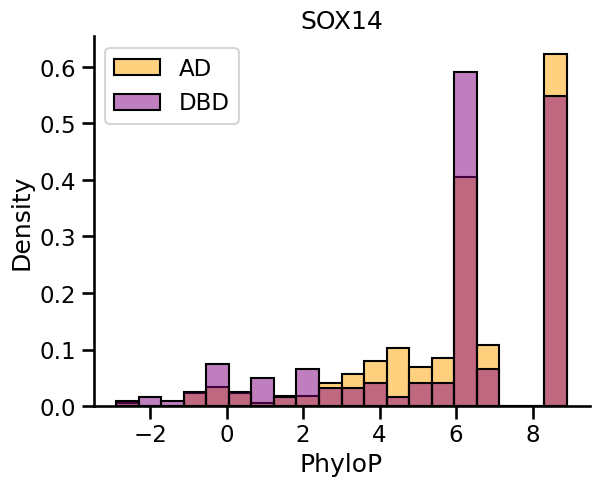

AR


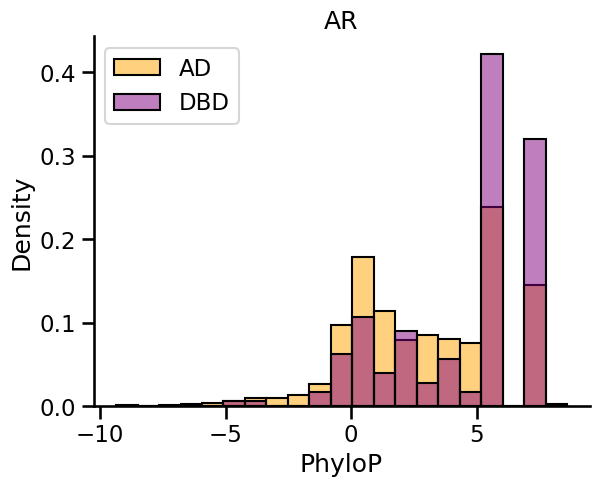

ELK1


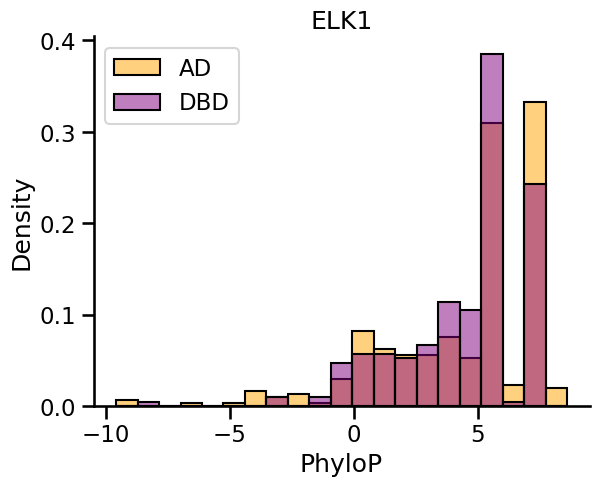

DMTF1


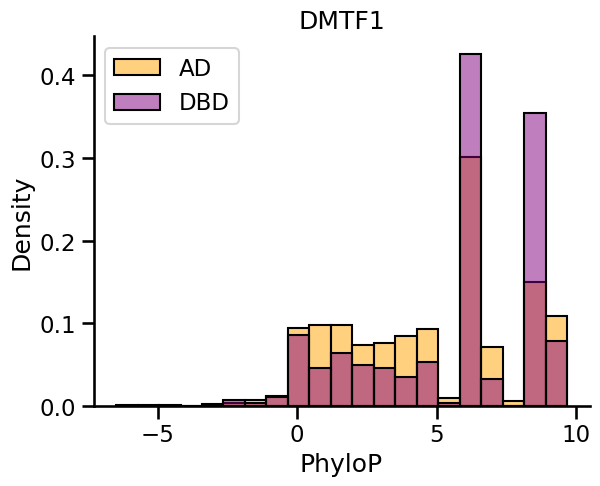

ZXDB


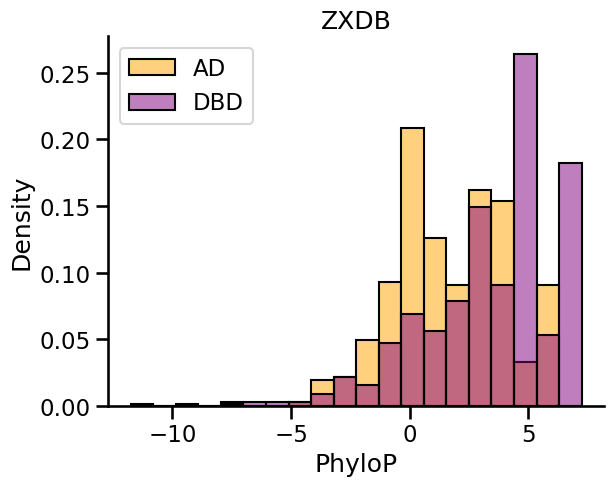

SRCAP


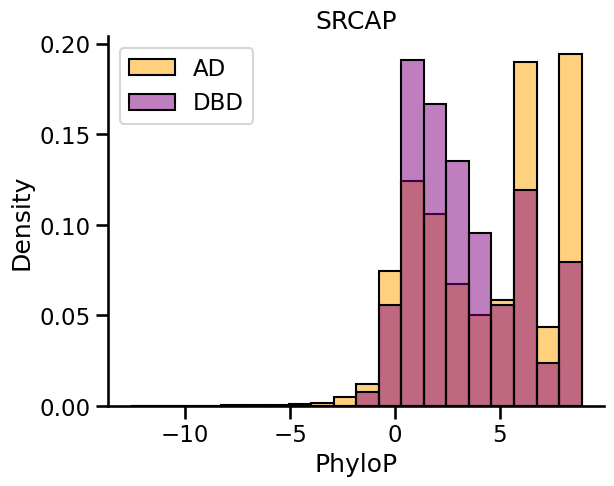

MITF


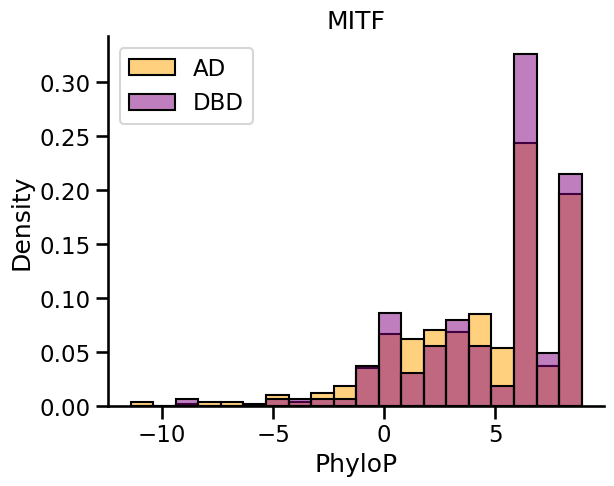

FOXO1


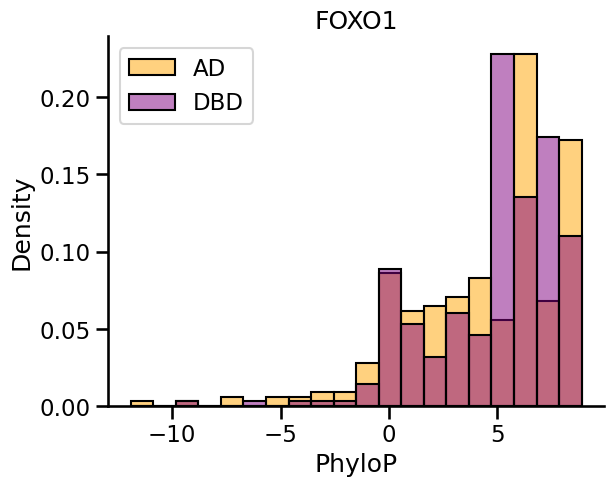

USF1


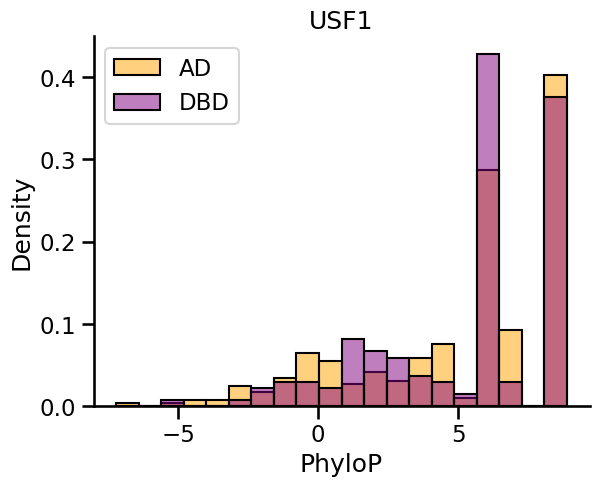

DBP


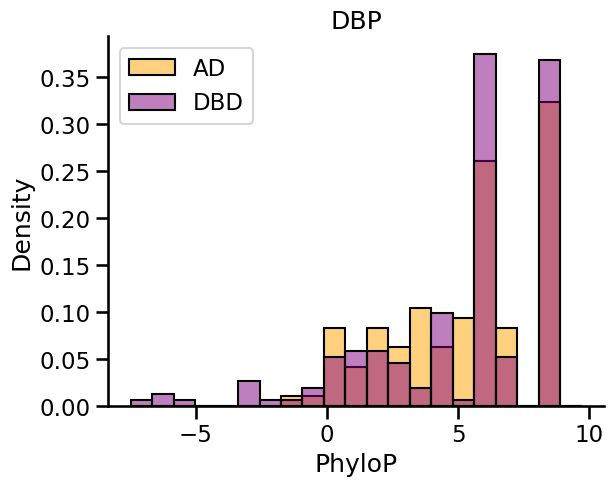

NR4A3


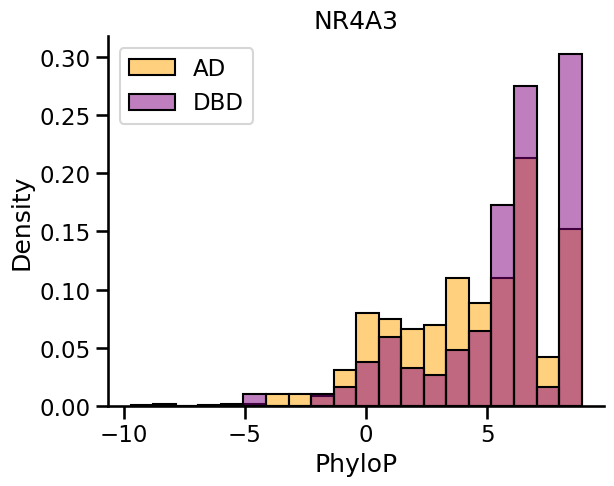

STAT6


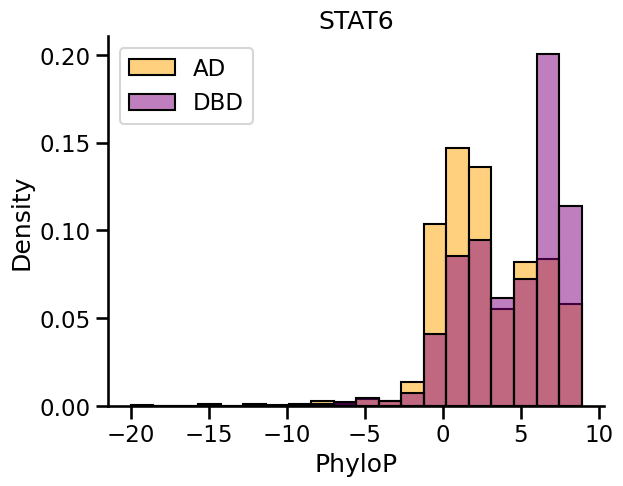

NR4A2


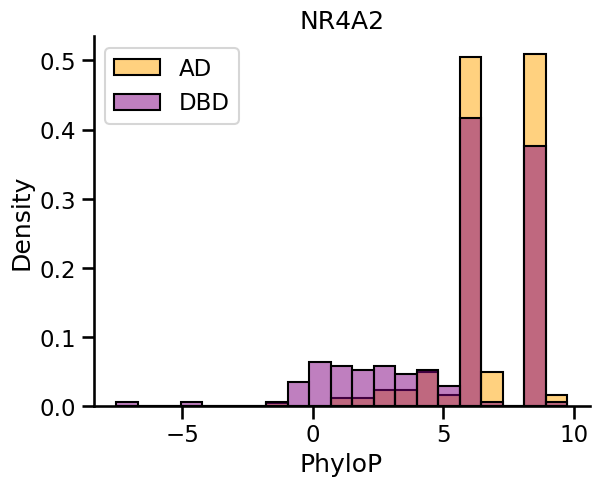

TRERF1


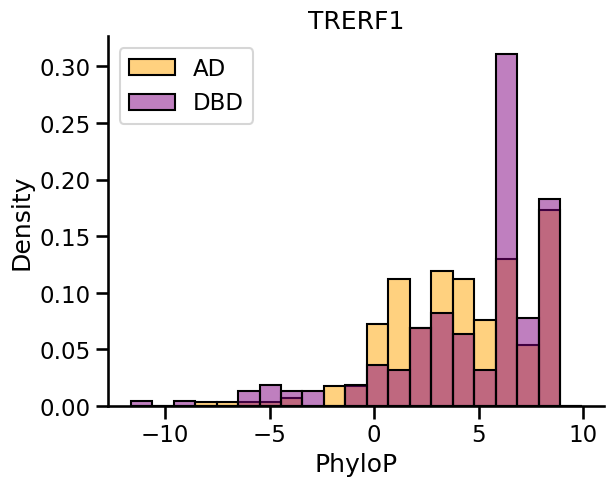

JUND


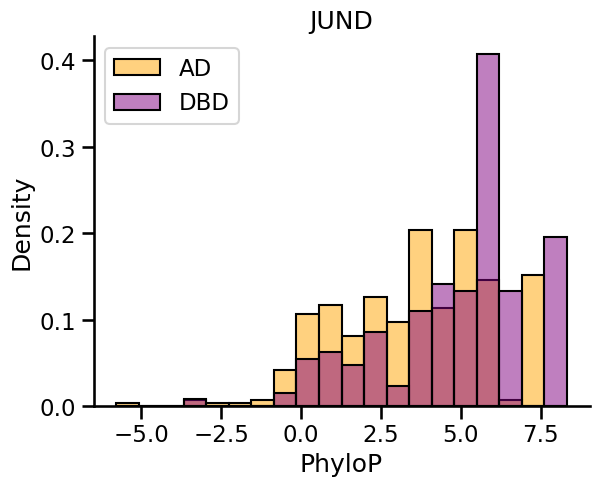

TCF3


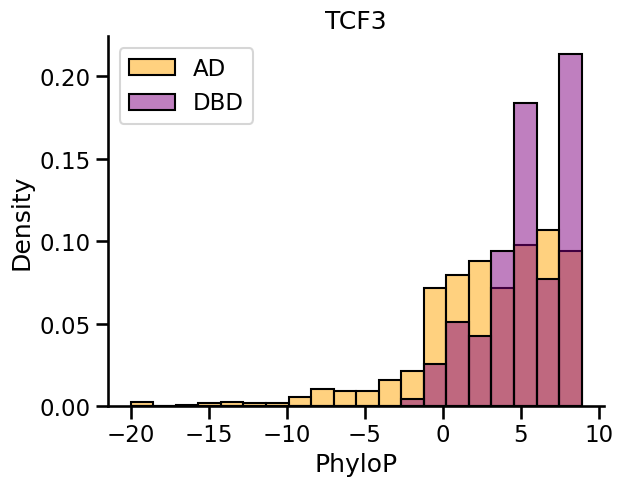

In [348]:
sns.set_context('talk')

for ENST in set(cds_phylo_P["ENST"]) & set(tfs_tbl["ENST"]):
    AD_rows = ad_phylo_P[ad_phylo_P["ENST"] == ENST]["PhyloP"]
    DBD_rows = dbd_phylo_P[dbd_phylo_P["ENST"] == ENST]["PhyloP"]
    gene = ENST_to_gene[ENST]

    if len(AD_rows) > 0 and len(DBD_rows) > 0:
        min_both = min(min(AD_rows), min(DBD_rows))
        max_both = max(max(AD_rows), max(DBD_rows))
        step = (max_both - min_both) / 20
        bins = np.arange(min_both, max_both + step, step)
    else:
        step = (max(AD_rows) - min(AD_rows)) / 20
        bins = np.arange(min(AD_rows), max(AD_rows) + step, step)

    ad_plot = sns.histplot(AD_rows, stat="density", bins=bins, color="orange", alpha=0.5, label="AD")
    dbd_plot = sns.histplot(DBD_rows, stat="density", bins=bins, color="purple", alpha=0.5, label="DBD")
    
    sns.despine()

    gene = gene.replace("/", "-").replace(".","").strip()
    print(gene)

    plt.title(gene)
    plt.legend()
    plt.savefig("../output/zoonomia_PhyloP_traces/histograms/" + gene, bbox_inches='tight')
    plt.show()